# Building a Resume Classification Model Using NLP Techniques

In this project, I will explore the development of a text classification model to categorize resumes into 24 predefined job categories (e.g., HR, IT, Finance, and more). The dataset consists of 2,400 resumes in PDF format, converted into structured CSV data for processing. It includes textual content (resume text) and metadata, enabling efficient pre-processing and feature extraction for building the classification model. The dataset can be accessed via Kaggle at [this link](https://www.kaggle.com/datasets/snehaanbhawal/resume-dataset).

The project involves leveraging Natural Language Processing (NLP) techniques to train a multi-class classification model. I used a transformer-based pre-trained language model, specifically BERT, to extract contextual embeddings from the resume texts. On top of these embeddings, we added a fully connected layer to fine-tune the model for our classification task. The model aims to accurately predict the job category of a resume, based on its textual content.

Performance metrics such as accuracy, precision, recall, and F1-score were used to evaluate the model's effectiveness in classifying resumes into categories. 

The ability to classify resumes into specific categories has significant applications in automating recruitment processes, enabling organizations to filter and sort resumes more efficiently. 

## 1. Import libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import spacy
from tqdm import tqdm
from PIL import Image
import torch
from torch import nn
from transformers import BertForSequenceClassification
from transformers import DistilBertForSequenceClassification
from transformers import AutoTokenizer
from torch.utils.data import DataLoader, Dataset
from transformers import AdamW
from sklearn.metrics import accuracy_score
import numpy as np
from sklearn.model_selection import train_test_split
import time
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import torch

import warnings
warnings.filterwarnings("ignore")

## 2. Data Preprocessing

In [2]:

def plot_word_cloud_high_quality(text, title, wordcloud_width, wordcloud_height, name_file, plot_width=10, plot_height=8):
    """
    Plots a high-quality word cloud with customizable display size.

    Args:
        text (list or pd.Series): The text data to generate the word cloud.
        title (str): Title of the plot.
        wordcloud_width (int): Width of the word cloud image (for resolution).
        wordcloud_height (int): Height of the word cloud image (for resolution).
        name_file (str): Name of file for saving (.png)
        plot_width (float): Width of the plot display in inches.
        plot_height (float): Height of the plot display in inches.
    """
    # Generate the word cloud
    wordcloud = WordCloud(width=wordcloud_width, height=wordcloud_height, background_color="white").generate(" ".join(text))
    
    # Resize the word cloud using Pillow
    resized_wordcloud = wordcloud.to_image().resize(
        (int(plot_width * 100), int(plot_height * 100)), Image.Resampling.LANCZOS
    )

    # Plot the resized word cloud
    plt.figure(figsize=(plot_width, plot_height))
    plt.imshow(resized_wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title, fontsize=15)
    plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight")  
    plt.show()


In [3]:
def word_cloud_per_category(data, column_name, name_file):
    """
    Creates sub-plots (word cloud for each category) and save all of them as a png file.
    
    Args:
        data (DataFrame): It has the whole data
        column_name (str): The column that has the desired text
        name_file (str): Name of file for saving (.png)
    """
    
    categories = data[category_column].unique()
    fig, axes = plt.subplots(6, 4, figsize=(20, 25))
    fig.suptitle("Word Clouds by Category", fontsize=20)
    for ax, category in zip(axes.flatten(), categories):
        category_text = data[data[category_column] == category][column_name]
        wordcloud = WordCloud(width=400, height=200, background_color="white").generate(" ".join(category_text))
        ax.imshow(wordcloud, interpolation="bilinear")
        ax.axis("off")
        ax.set_title(category, fontsize=14)
    
    plt.subplots_adjust(hspace=0.1, top=0.8)
    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight") 
    plt.show()

In [4]:
## Create a class for cleaning text using spaCy (large model)

class TextCleaner:
    def __init__(self, language_model="en_core_web_lg"):
        self.nlp = spacy.load(language_model)

    def clean_text(self, text):
        doc = self.nlp(text)
        clean_tokens = [token.lemma_.lower() for token in doc if not token.is_stop and not token.is_punct]
        return " ".join(clean_tokens)

### 2.1. Load dataset

In [5]:
file_path = "Resume.csv"  
data = pd.read_csv(file_path)

# Column containing the text and label
raw_text_column = "Resume_str"  
category_column = "Category"

### 2.2. Exploratory Data Analysis for Raw Text

#### Plot word cloud for entire dataset

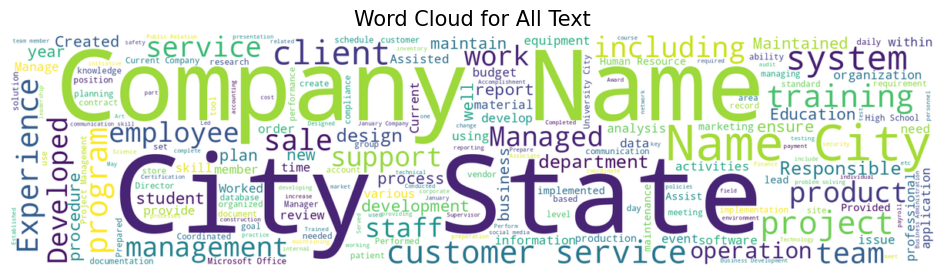

In [6]:
plot_word_cloud_high_quality(data[raw_text_column], "Word Cloud for All Text",
                wordcloud_width=1800, wordcloud_height=450, 
                name_file='word_cloud_raw_text.png', plot_width=12, 
                plot_height=3)

#### Plot word clouds for each category

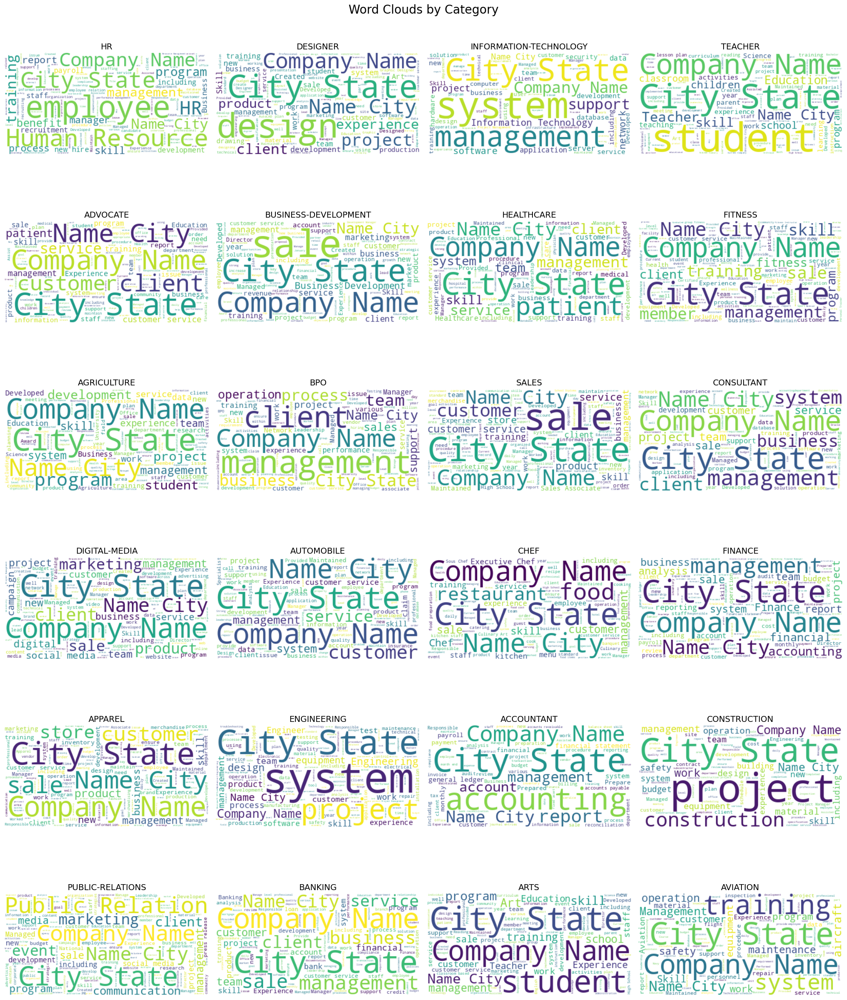

In [7]:
word_cloud_per_category(data, "Resume_str", "word_cloud_per_category_raw_text.png")

### 2.3. Exploratory Data Analysis for Cleaned Text

In [8]:
# Instantiate the cleaner
cleaner = TextCleaner()

tqdm.pandas()
data["cleaned_text"] = data[raw_text_column].progress_apply(cleaner.clean_text)

  0%|                                                                                        | 0/2484 [00:00<?, ?it/s]

  0%|                                                                                | 2/2484 [00:00<02:43, 15.20it/s]

  0%|▏                                                                               | 4/2484 [00:00<04:38,  8.90it/s]

  0%|▏                                                                               | 6/2484 [00:00<04:55,  8.38it/s]

  0%|▏                                                                               | 7/2484 [00:00<04:52,  8.46it/s]

  0%|▎                                                                               | 8/2484 [00:00<04:42,  8.76it/s]

  0%|▎                                                                               | 9/2484 [00:01<05:24,  7.62it/s]

  0%|▎                                                                              | 10/2484 [00:01<05:32,  7.44it/s]

  0%|▎                                                                              | 11/2484 [00:01<05:19,  7.74it/s]

  0%|▍                                                                              | 12/2484 [00:01<05:05,  8.08it/s]

  1%|▍                                                                              | 13/2484 [00:01<05:33,  7.41it/s]

  1%|▍                                                                              | 14/2484 [00:01<05:20,  7.72it/s]

  1%|▍                                                                              | 15/2484 [00:01<05:09,  7.99it/s]

  1%|▌                                                                              | 16/2484 [00:01<05:03,  8.13it/s]

  1%|▌                                                                              | 17/2484 [00:02<05:03,  8.12it/s]

  1%|▌                                                                              | 18/2484 [00:02<04:50,  8.48it/s]

  1%|▌                                                                              | 19/2484 [00:02<05:29,  7.48it/s]

  1%|▋                                                                              | 21/2484 [00:02<04:59,  8.22it/s]

  1%|▋                                                                              | 23/2484 [00:02<05:08,  7.99it/s]

  1%|▊                                                                              | 24/2484 [00:03<05:56,  6.91it/s]

  1%|▊                                                                              | 26/2484 [00:03<05:18,  7.72it/s]

  1%|▉                                                                              | 28/2484 [00:03<04:54,  8.33it/s]

  1%|▉                                                                              | 29/2484 [00:03<04:49,  8.47it/s]

  1%|▉                                                                              | 30/2484 [00:03<04:40,  8.74it/s]

  1%|▉                                                                              | 31/2484 [00:03<05:07,  7.99it/s]

  1%|█                                                                              | 32/2484 [00:03<05:07,  7.97it/s]

  1%|█                                                                              | 33/2484 [00:04<05:00,  8.15it/s]

  1%|█                                                                              | 34/2484 [00:04<05:10,  7.90it/s]

  1%|█                                                                              | 35/2484 [00:04<06:20,  6.43it/s]

  1%|█▏                                                                             | 36/2484 [00:04<05:47,  7.04it/s]

  1%|█▏                                                                             | 37/2484 [00:04<05:56,  6.87it/s]

  2%|█▏                                                                             | 39/2484 [00:04<05:44,  7.09it/s]

  2%|█▎                                                                             | 40/2484 [00:05<05:21,  7.60it/s]

  2%|█▎                                                                             | 41/2484 [00:05<05:19,  7.64it/s]

  2%|█▎                                                                             | 42/2484 [00:05<05:04,  8.02it/s]

  2%|█▎                                                                             | 43/2484 [00:05<04:56,  8.25it/s]

  2%|█▍                                                                             | 44/2484 [00:05<05:05,  8.00it/s]

  2%|█▍                                                                             | 45/2484 [00:05<05:08,  7.92it/s]

  2%|█▍                                                                             | 46/2484 [00:05<05:09,  7.89it/s]

  2%|█▌                                                                             | 48/2484 [00:06<04:56,  8.21it/s]

  2%|█▌                                                                             | 49/2484 [00:06<05:17,  7.67it/s]

  2%|█▌                                                                             | 51/2484 [00:06<04:29,  9.04it/s]

  2%|█▋                                                                             | 52/2484 [00:06<04:42,  8.60it/s]

  2%|█▋                                                                             | 53/2484 [00:06<04:52,  8.30it/s]

  2%|█▋                                                                             | 54/2484 [00:06<05:23,  7.51it/s]

  2%|█▋                                                                             | 55/2484 [00:06<05:13,  7.74it/s]

  2%|█▊                                                                             | 56/2484 [00:07<05:11,  7.80it/s]

  2%|█▊                                                                             | 57/2484 [00:07<05:10,  7.81it/s]

  2%|█▊                                                                             | 58/2484 [00:07<04:59,  8.10it/s]

  2%|█▉                                                                             | 59/2484 [00:07<04:50,  8.34it/s]

  2%|█▉                                                                             | 60/2484 [00:07<05:10,  7.80it/s]

  2%|█▉                                                                             | 61/2484 [00:07<04:53,  8.25it/s]

  2%|█▉                                                                             | 62/2484 [00:07<05:12,  7.74it/s]

  3%|██                                                                             | 63/2484 [00:07<05:35,  7.21it/s]

  3%|██                                                                             | 64/2484 [00:08<05:12,  7.74it/s]

  3%|██                                                                             | 65/2484 [00:08<05:00,  8.06it/s]

  3%|██                                                                             | 66/2484 [00:08<04:45,  8.47it/s]

  3%|██▏                                                                            | 67/2484 [00:08<04:43,  8.54it/s]

  3%|██▏                                                                            | 68/2484 [00:08<04:34,  8.79it/s]

  3%|██▏                                                                            | 69/2484 [00:08<04:44,  8.48it/s]

  3%|██▎                                                                            | 71/2484 [00:08<04:22,  9.18it/s]

  3%|██▎                                                                            | 72/2484 [00:08<04:21,  9.23it/s]

  3%|██▎                                                                            | 73/2484 [00:09<04:19,  9.29it/s]

  3%|██▍                                                                            | 75/2484 [00:09<04:08,  9.68it/s]

  3%|██▍                                                                            | 76/2484 [00:09<04:11,  9.56it/s]

  3%|██▍                                                                            | 77/2484 [00:09<04:14,  9.46it/s]

  3%|██▍                                                                            | 78/2484 [00:09<04:13,  9.47it/s]

  3%|██▌                                                                            | 79/2484 [00:09<04:14,  9.45it/s]

  3%|██▌                                                                            | 80/2484 [00:09<04:50,  8.29it/s]

  3%|██▌                                                                            | 81/2484 [00:09<04:37,  8.65it/s]

  3%|██▌                                                                            | 82/2484 [00:10<04:55,  8.12it/s]

  3%|██▋                                                                            | 83/2484 [00:10<07:32,  5.31it/s]

  3%|██▋                                                                            | 85/2484 [00:10<06:14,  6.40it/s]

  3%|██▋                                                                            | 86/2484 [00:10<05:54,  6.76it/s]

  4%|██▊                                                                            | 87/2484 [00:10<05:25,  7.36it/s]

  4%|██▊                                                                            | 89/2484 [00:11<06:02,  6.60it/s]

  4%|██▉                                                                            | 91/2484 [00:11<06:13,  6.40it/s]

  4%|██▉                                                                            | 93/2484 [00:11<05:58,  6.67it/s]

  4%|██▉                                                                            | 94/2484 [00:11<05:45,  6.91it/s]

  4%|███                                                                            | 96/2484 [00:12<07:33,  5.26it/s]

  4%|███                                                                            | 97/2484 [00:12<07:18,  5.44it/s]

  4%|███                                                                            | 98/2484 [00:12<07:11,  5.53it/s]

  4%|███▏                                                                          | 100/2484 [00:13<05:48,  6.83it/s]

  4%|███▏                                                                          | 102/2484 [00:13<04:43,  8.41it/s]

  4%|███▏                                                                          | 103/2484 [00:13<04:48,  8.26it/s]

  4%|███▎                                                                          | 104/2484 [00:13<04:44,  8.36it/s]

  4%|███▎                                                                          | 105/2484 [00:13<04:35,  8.64it/s]

  4%|███▎                                                                          | 106/2484 [00:13<04:49,  8.22it/s]

  4%|███▎                                                                          | 107/2484 [00:13<04:35,  8.61it/s]

  4%|███▍                                                                          | 108/2484 [00:13<04:38,  8.52it/s]

  4%|███▍                                                                          | 110/2484 [00:14<04:26,  8.90it/s]

  4%|███▍                                                                          | 111/2484 [00:14<04:22,  9.04it/s]

  5%|███▌                                                                          | 113/2484 [00:14<04:00,  9.87it/s]

  5%|███▌                                                                          | 115/2484 [00:14<03:39, 10.80it/s]

  5%|███▋                                                                          | 117/2484 [00:14<03:05, 12.76it/s]

  5%|███▋                                                                          | 119/2484 [00:14<03:22, 11.71it/s]

  5%|███▊                                                                          | 121/2484 [00:15<03:50, 10.23it/s]

  5%|███▊                                                                          | 123/2484 [00:15<04:26,  8.85it/s]

  5%|███▉                                                                          | 124/2484 [00:15<04:48,  8.17it/s]

  5%|███▉                                                                          | 125/2484 [00:15<05:06,  7.70it/s]

  5%|███▉                                                                          | 126/2484 [00:15<05:05,  7.72it/s]

  5%|███▉                                                                          | 127/2484 [00:15<05:03,  7.76it/s]

  5%|████                                                                          | 128/2484 [00:16<05:33,  7.07it/s]

  5%|████                                                                          | 129/2484 [00:16<06:15,  6.28it/s]

  5%|████                                                                          | 130/2484 [00:16<05:40,  6.90it/s]

  5%|████                                                                          | 131/2484 [00:16<05:27,  7.19it/s]

  5%|████▏                                                                         | 133/2484 [00:16<04:55,  7.95it/s]

  5%|████▏                                                                         | 134/2484 [00:16<04:47,  8.18it/s]

  6%|████▎                                                                         | 137/2484 [00:17<03:37, 10.79it/s]

  6%|████▎                                                                         | 139/2484 [00:17<03:56,  9.93it/s]

  6%|████▍                                                                         | 140/2484 [00:17<04:07,  9.48it/s]

  6%|████▍                                                                         | 142/2484 [00:17<03:22, 11.56it/s]

  6%|████▌                                                                         | 144/2484 [00:17<03:42, 10.51it/s]

  6%|████▌                                                                         | 146/2484 [00:17<03:31, 11.03it/s]

  6%|████▋                                                                         | 148/2484 [00:18<04:11,  9.28it/s]

  6%|████▋                                                                         | 150/2484 [00:18<04:35,  8.47it/s]

  6%|████▊                                                                         | 152/2484 [00:18<03:50, 10.11it/s]

  6%|████▊                                                                         | 154/2484 [00:18<03:38, 10.67it/s]

  6%|████▉                                                                         | 156/2484 [00:18<03:20, 11.61it/s]

  6%|████▉                                                                         | 158/2484 [00:19<03:30, 11.06it/s]

  6%|█████                                                                         | 160/2484 [00:19<04:43,  8.21it/s]

  6%|█████                                                                         | 161/2484 [00:19<04:48,  8.06it/s]

  7%|█████                                                                         | 163/2484 [00:19<04:09,  9.31it/s]

  7%|█████▏                                                                        | 165/2484 [00:20<04:15,  9.07it/s]

  7%|█████▏                                                                        | 167/2484 [00:20<04:17,  8.99it/s]

  7%|█████▎                                                                        | 168/2484 [00:20<04:22,  8.81it/s]

  7%|█████▎                                                                        | 169/2484 [00:20<04:20,  8.87it/s]

  7%|█████▎                                                                        | 170/2484 [00:20<04:29,  8.58it/s]

  7%|█████▍                                                                        | 172/2484 [00:20<04:12,  9.15it/s]

  7%|█████▍                                                                        | 173/2484 [00:20<04:08,  9.28it/s]

  7%|█████▍                                                                        | 175/2484 [00:21<03:40, 10.48it/s]

  7%|█████▌                                                                        | 177/2484 [00:21<03:39, 10.53it/s]

  7%|█████▌                                                                        | 179/2484 [00:21<03:12, 11.96it/s]

  7%|█████▋                                                                        | 181/2484 [00:21<03:04, 12.46it/s]

  7%|█████▋                                                                        | 183/2484 [00:21<03:32, 10.85it/s]

  7%|█████▊                                                                        | 185/2484 [00:22<05:24,  7.09it/s]

  7%|█████▊                                                                        | 186/2484 [00:22<05:30,  6.96it/s]

  8%|█████▊                                                                        | 187/2484 [00:22<05:10,  7.41it/s]

  8%|█████▉                                                                        | 189/2484 [00:22<04:11,  9.12it/s]

  8%|█████▉                                                                        | 191/2484 [00:22<03:39, 10.45it/s]

  8%|██████                                                                        | 194/2484 [00:22<03:18, 11.53it/s]

  8%|██████▏                                                                       | 196/2484 [00:23<03:37, 10.52it/s]

  8%|██████▏                                                                       | 198/2484 [00:23<03:57,  9.62it/s]

  8%|██████▎                                                                       | 200/2484 [00:23<04:04,  9.33it/s]

  8%|██████▎                                                                       | 201/2484 [00:23<05:20,  7.13it/s]

  8%|██████▎                                                                       | 202/2484 [00:24<05:06,  7.45it/s]

  8%|██████▎                                                                       | 203/2484 [00:24<05:07,  7.41it/s]

  8%|██████▍                                                                       | 204/2484 [00:24<05:12,  7.30it/s]

  8%|██████▍                                                                       | 206/2484 [00:24<04:43,  8.03it/s]

  8%|██████▌                                                                       | 207/2484 [00:24<04:42,  8.05it/s]

  8%|██████▌                                                                       | 208/2484 [00:24<04:40,  8.13it/s]

  8%|██████▌                                                                       | 210/2484 [00:25<05:06,  7.42it/s]

  8%|██████▋                                                                       | 211/2484 [00:25<04:51,  7.81it/s]

  9%|██████▋                                                                       | 213/2484 [00:25<04:30,  8.38it/s]

  9%|██████▋                                                                       | 214/2484 [00:25<04:23,  8.61it/s]

  9%|██████▊                                                                       | 215/2484 [00:25<04:42,  8.03it/s]

  9%|██████▊                                                                       | 216/2484 [00:25<04:37,  8.18it/s]

  9%|██████▊                                                                       | 218/2484 [00:26<04:08,  9.11it/s]

  9%|██████▉                                                                       | 220/2484 [00:26<04:07,  9.16it/s]

  9%|██████▉                                                                       | 222/2484 [00:26<03:52,  9.72it/s]

  9%|███████                                                                       | 224/2484 [00:26<03:55,  9.59it/s]

  9%|███████                                                                       | 225/2484 [00:26<05:14,  7.19it/s]

  9%|███████                                                                       | 226/2484 [00:27<05:14,  7.17it/s]

  9%|███████▏                                                                      | 227/2484 [00:27<05:18,  7.08it/s]

  9%|███████▏                                                                      | 228/2484 [00:27<05:37,  6.68it/s]

  9%|███████▏                                                                      | 230/2484 [00:27<05:20,  7.04it/s]

  9%|███████▎                                                                      | 231/2484 [00:27<05:02,  7.45it/s]

  9%|███████▎                                                                      | 232/2484 [00:27<04:49,  7.79it/s]

  9%|███████▎                                                                      | 233/2484 [00:27<04:35,  8.16it/s]

  9%|███████▎                                                                      | 234/2484 [00:28<04:44,  7.92it/s]

  9%|███████▍                                                                      | 235/2484 [00:28<05:14,  7.16it/s]

 10%|███████▍                                                                      | 236/2484 [00:28<06:02,  6.20it/s]

 10%|███████▍                                                                      | 237/2484 [00:28<05:28,  6.84it/s]

 10%|███████▍                                                                      | 238/2484 [00:28<05:09,  7.26it/s]

 10%|███████▌                                                                      | 239/2484 [00:28<04:44,  7.88it/s]

 10%|███████▌                                                                      | 240/2484 [00:28<04:52,  7.68it/s]

 10%|███████▌                                                                      | 241/2484 [00:29<04:51,  7.69it/s]

 10%|███████▋                                                                      | 243/2484 [00:29<04:15,  8.75it/s]

 10%|███████▋                                                                      | 244/2484 [00:29<04:08,  9.02it/s]

 10%|███████▋                                                                      | 245/2484 [00:29<04:02,  9.24it/s]

 10%|███████▋                                                                      | 246/2484 [00:29<04:56,  7.56it/s]

 10%|███████▊                                                                      | 247/2484 [00:29<04:39,  8.02it/s]

 10%|███████▊                                                                      | 248/2484 [00:29<04:46,  7.80it/s]

 10%|███████▊                                                                      | 249/2484 [00:30<04:34,  8.13it/s]

 10%|███████▊                                                                      | 250/2484 [00:30<04:26,  8.39it/s]

 10%|███████▉                                                                      | 252/2484 [00:30<04:49,  7.72it/s]

 10%|███████▉                                                                      | 254/2484 [00:30<04:05,  9.10it/s]

 10%|████████                                                                      | 255/2484 [00:30<04:23,  8.45it/s]

 10%|████████                                                                      | 256/2484 [00:30<05:01,  7.38it/s]

 10%|████████                                                                      | 258/2484 [00:31<05:05,  7.29it/s]

 10%|████████▏                                                                     | 259/2484 [00:31<05:05,  7.27it/s]

 10%|████████▏                                                                     | 260/2484 [00:31<06:06,  6.07it/s]

 11%|████████▏                                                                     | 261/2484 [00:31<07:09,  5.17it/s]

 11%|████████▎                                                                     | 263/2484 [00:31<05:10,  7.15it/s]

 11%|████████▎                                                                     | 264/2484 [00:32<05:00,  7.38it/s]

 11%|████████▎                                                                     | 265/2484 [00:32<05:06,  7.24it/s]

 11%|████████▍                                                                     | 267/2484 [00:32<04:04,  9.05it/s]

 11%|████████▍                                                                     | 268/2484 [00:32<04:03,  9.11it/s]

 11%|████████▍                                                                     | 269/2484 [00:32<04:08,  8.91it/s]

 11%|████████▍                                                                     | 270/2484 [00:32<04:06,  8.98it/s]

 11%|████████▌                                                                     | 271/2484 [00:32<04:13,  8.74it/s]

 11%|████████▌                                                                     | 272/2484 [00:32<04:18,  8.55it/s]

 11%|████████▌                                                                     | 273/2484 [00:33<04:25,  8.33it/s]

 11%|████████▌                                                                     | 274/2484 [00:33<04:17,  8.58it/s]

 11%|████████▋                                                                     | 275/2484 [00:33<04:08,  8.87it/s]

 11%|████████▋                                                                     | 277/2484 [00:33<04:24,  8.35it/s]

 11%|████████▋                                                                     | 278/2484 [00:33<04:28,  8.22it/s]

 11%|████████▊                                                                     | 279/2484 [00:33<04:26,  8.28it/s]

 11%|████████▊                                                                     | 280/2484 [00:33<04:16,  8.59it/s]

 11%|████████▊                                                                     | 281/2484 [00:34<04:10,  8.79it/s]

 11%|████████▊                                                                     | 282/2484 [00:34<04:45,  7.71it/s]

 11%|████████▉                                                                     | 283/2484 [00:34<04:50,  7.58it/s]

 11%|████████▉                                                                     | 284/2484 [00:34<05:08,  7.13it/s]

 11%|████████▉                                                                     | 285/2484 [00:34<05:34,  6.57it/s]

 12%|████████▉                                                                     | 286/2484 [00:34<05:17,  6.93it/s]

 12%|█████████                                                                     | 287/2484 [00:34<05:14,  6.98it/s]

 12%|█████████                                                                     | 289/2484 [00:35<04:32,  8.04it/s]

 12%|█████████                                                                     | 290/2484 [00:35<04:39,  7.84it/s]

 12%|█████████▏                                                                    | 291/2484 [00:35<04:46,  7.66it/s]

 12%|█████████▏                                                                    | 292/2484 [00:35<04:31,  8.08it/s]

 12%|█████████▏                                                                    | 293/2484 [00:35<04:31,  8.06it/s]

 12%|█████████▏                                                                    | 294/2484 [00:35<04:27,  8.18it/s]

 12%|█████████▎                                                                    | 295/2484 [00:35<05:08,  7.09it/s]

 12%|█████████▎                                                                    | 296/2484 [00:36<05:28,  6.66it/s]

 12%|█████████▎                                                                    | 297/2484 [00:36<05:06,  7.14it/s]

 12%|█████████▎                                                                    | 298/2484 [00:36<05:30,  6.62it/s]

 12%|█████████▍                                                                    | 299/2484 [00:36<05:55,  6.15it/s]

 12%|█████████▍                                                                    | 300/2484 [00:36<05:51,  6.20it/s]

 12%|█████████▍                                                                    | 301/2484 [00:37<06:28,  5.62it/s]

 12%|█████████▍                                                                    | 302/2484 [00:37<05:38,  6.44it/s]

 12%|█████████▌                                                                    | 303/2484 [00:37<05:39,  6.43it/s]

 12%|█████████▌                                                                    | 304/2484 [00:37<05:36,  6.48it/s]

 12%|█████████▌                                                                    | 305/2484 [00:37<06:06,  5.94it/s]

 12%|█████████▌                                                                    | 306/2484 [00:37<05:22,  6.75it/s]

 12%|█████████▋                                                                    | 307/2484 [00:37<05:42,  6.35it/s]

 12%|█████████▋                                                                    | 308/2484 [00:38<05:23,  6.73it/s]

 12%|█████████▋                                                                    | 310/2484 [00:38<04:12,  8.62it/s]

 13%|█████████▊                                                                    | 311/2484 [00:38<04:50,  7.49it/s]

 13%|█████████▊                                                                    | 312/2484 [00:38<04:43,  7.65it/s]

 13%|█████████▊                                                                    | 313/2484 [00:38<05:03,  7.15it/s]

 13%|█████████▉                                                                    | 315/2484 [00:39<05:34,  6.48it/s]

 13%|█████████▉                                                                    | 316/2484 [00:39<05:13,  6.93it/s]

 13%|█████████▉                                                                    | 317/2484 [00:39<04:49,  7.48it/s]

 13%|█████████▉                                                                    | 318/2484 [00:39<05:17,  6.82it/s]

 13%|██████████                                                                    | 320/2484 [00:39<05:03,  7.14it/s]

 13%|██████████                                                                    | 321/2484 [00:39<04:54,  7.34it/s]

 13%|██████████▏                                                                   | 323/2484 [00:40<04:58,  7.25it/s]

 13%|██████████▏                                                                   | 324/2484 [00:40<04:50,  7.44it/s]

 13%|██████████▏                                                                   | 326/2484 [00:40<04:45,  7.56it/s]

 13%|██████████▎                                                                   | 327/2484 [00:40<04:35,  7.84it/s]

 13%|██████████▎                                                                   | 328/2484 [00:40<04:38,  7.74it/s]

 13%|██████████▎                                                                   | 330/2484 [00:40<04:15,  8.43it/s]

 13%|██████████▍                                                                   | 331/2484 [00:41<04:31,  7.93it/s]

 13%|██████████▍                                                                   | 332/2484 [00:41<04:51,  7.38it/s]

 13%|██████████▍                                                                   | 333/2484 [00:41<07:27,  4.80it/s]

 13%|██████████▍                                                                   | 334/2484 [00:41<06:31,  5.49it/s]

 14%|██████████▌                                                                   | 336/2484 [00:41<05:22,  6.65it/s]

 14%|██████████▌                                                                   | 337/2484 [00:42<06:15,  5.71it/s]

 14%|██████████▌                                                                   | 338/2484 [00:42<05:41,  6.28it/s]

 14%|██████████▋                                                                   | 339/2484 [00:42<05:20,  6.68it/s]

 14%|██████████▋                                                                   | 341/2484 [00:42<03:55,  9.11it/s]

 14%|██████████▊                                                                   | 343/2484 [00:42<03:31, 10.10it/s]

 14%|██████████▊                                                                   | 345/2484 [00:42<03:34,  9.99it/s]

 14%|██████████▉                                                                   | 347/2484 [00:43<03:45,  9.50it/s]

 14%|██████████▉                                                                   | 349/2484 [00:43<03:43,  9.56it/s]

 14%|███████████                                                                   | 351/2484 [00:43<03:46,  9.44it/s]

 14%|███████████                                                                   | 352/2484 [00:43<03:59,  8.89it/s]

 14%|███████████                                                                   | 353/2484 [00:43<04:08,  8.56it/s]

 14%|███████████                                                                   | 354/2484 [00:43<04:03,  8.75it/s]

 14%|███████████▏                                                                  | 355/2484 [00:44<05:42,  6.21it/s]

 14%|███████████▏                                                                  | 356/2484 [00:44<05:29,  6.46it/s]

 14%|███████████▏                                                                  | 358/2484 [00:44<04:37,  7.66it/s]

 14%|███████████▎                                                                  | 360/2484 [00:44<04:05,  8.65it/s]

 15%|███████████▎                                                                  | 361/2484 [00:44<04:07,  8.56it/s]

 15%|███████████▎                                                                  | 362/2484 [00:45<04:02,  8.74it/s]

 15%|███████████▍                                                                  | 364/2484 [00:45<03:48,  9.30it/s]

 15%|███████████▍                                                                  | 365/2484 [00:45<03:52,  9.13it/s]

 15%|███████████▌                                                                  | 367/2484 [00:45<04:02,  8.72it/s]

 15%|███████████▌                                                                  | 368/2484 [00:45<03:58,  8.85it/s]

 15%|███████████▌                                                                  | 370/2484 [00:45<03:42,  9.51it/s]

 15%|███████████▋                                                                  | 371/2484 [00:45<03:56,  8.94it/s]

 15%|███████████▋                                                                  | 372/2484 [00:46<03:59,  8.82it/s]

 15%|███████████▋                                                                  | 373/2484 [00:46<04:05,  8.60it/s]

 15%|███████████▊                                                                  | 375/2484 [00:46<03:12, 10.95it/s]

 15%|███████████▊                                                                  | 377/2484 [00:46<03:05, 11.38it/s]

 15%|███████████▉                                                                  | 379/2484 [00:46<03:04, 11.40it/s]

 15%|███████████▉                                                                  | 381/2484 [00:46<03:25, 10.25it/s]

 15%|████████████                                                                  | 383/2484 [00:47<03:32,  9.87it/s]

 15%|████████████                                                                  | 385/2484 [00:47<04:09,  8.42it/s]

 16%|████████████                                                                  | 386/2484 [00:47<04:23,  7.96it/s]

 16%|████████████▏                                                                 | 388/2484 [00:47<04:02,  8.64it/s]

 16%|████████████▏                                                                 | 390/2484 [00:47<03:43,  9.36it/s]

 16%|████████████▎                                                                 | 392/2484 [00:48<03:16, 10.66it/s]

 16%|████████████▎                                                                 | 394/2484 [00:48<02:48, 12.42it/s]

 16%|████████████▍                                                                 | 397/2484 [00:48<02:15, 15.37it/s]

 16%|████████████▌                                                                 | 399/2484 [00:48<02:35, 13.42it/s]

 16%|████████████▌                                                                 | 402/2484 [00:48<02:14, 15.49it/s]

 16%|████████████▋                                                                 | 404/2484 [00:48<02:15, 15.35it/s]

 16%|████████████▋                                                                 | 406/2484 [00:48<02:18, 15.01it/s]

 16%|████████████▊                                                                 | 408/2484 [00:49<02:22, 14.53it/s]

 17%|████████████▊                                                                 | 410/2484 [00:49<03:53,  8.88it/s]

 17%|████████████▉                                                                 | 412/2484 [00:49<03:46,  9.14it/s]

 17%|█████████████                                                                 | 414/2484 [00:49<03:29,  9.90it/s]

 17%|█████████████                                                                 | 416/2484 [00:50<03:38,  9.47it/s]

 17%|█████████████▏                                                                | 418/2484 [00:50<03:50,  8.95it/s]

 17%|█████████████▏                                                                | 420/2484 [00:50<03:41,  9.34it/s]

 17%|█████████████▎                                                                | 422/2484 [00:50<03:37,  9.50it/s]

 17%|█████████████▎                                                                | 424/2484 [00:51<04:13,  8.14it/s]

 17%|█████████████▎                                                                | 425/2484 [00:51<04:13,  8.13it/s]

 17%|█████████████▍                                                                | 426/2484 [00:51<04:03,  8.44it/s]

 17%|█████████████▍                                                                | 428/2484 [00:51<03:48,  8.99it/s]

 17%|█████████████▌                                                                | 430/2484 [00:51<03:28,  9.84it/s]

 17%|█████████████▌                                                                | 432/2484 [00:51<03:33,  9.60it/s]

 17%|█████████████▌                                                                | 433/2484 [00:52<03:40,  9.29it/s]

 17%|█████████████▋                                                                | 434/2484 [00:52<03:45,  9.07it/s]

 18%|█████████████▋                                                                | 435/2484 [00:52<03:42,  9.19it/s]

 18%|█████████████▋                                                                | 437/2484 [00:52<03:32,  9.62it/s]

 18%|█████████████▊                                                                | 438/2484 [00:52<03:36,  9.43it/s]

 18%|█████████████▊                                                                | 439/2484 [00:52<04:12,  8.09it/s]

 18%|█████████████▊                                                                | 440/2484 [00:52<04:49,  7.05it/s]

 18%|█████████████▉                                                                | 442/2484 [00:53<04:25,  7.68it/s]

 18%|█████████████▉                                                                | 444/2484 [00:53<04:00,  8.50it/s]

 18%|█████████████▉                                                                | 445/2484 [00:53<04:07,  8.25it/s]

 18%|██████████████                                                                | 447/2484 [00:53<03:41,  9.19it/s]

 18%|██████████████                                                                | 449/2484 [00:53<03:37,  9.35it/s]

 18%|██████████████▏                                                               | 450/2484 [00:54<03:37,  9.34it/s]

 18%|██████████████▏                                                               | 451/2484 [00:54<03:37,  9.33it/s]

 18%|██████████████▏                                                               | 452/2484 [00:54<03:39,  9.26it/s]

 18%|██████████████▎                                                               | 454/2484 [00:54<03:22, 10.01it/s]

 18%|██████████████▎                                                               | 455/2484 [00:54<03:23,  9.99it/s]

 18%|██████████████▎                                                               | 456/2484 [00:54<03:35,  9.43it/s]

 18%|██████████████▍                                                               | 458/2484 [00:54<03:39,  9.25it/s]

 19%|██████████████▍                                                               | 460/2484 [00:55<04:10,  8.07it/s]

 19%|██████████████▌                                                               | 462/2484 [00:55<03:51,  8.74it/s]

 19%|██████████████▌                                                               | 464/2484 [00:55<03:41,  9.12it/s]

 19%|██████████████▋                                                               | 466/2484 [00:55<03:32,  9.51it/s]

 19%|██████████████▋                                                               | 467/2484 [00:55<03:31,  9.52it/s]

 19%|██████████████▋                                                               | 469/2484 [00:55<03:08, 10.68it/s]

 19%|██████████████▊                                                               | 471/2484 [00:56<03:15, 10.28it/s]

 19%|██████████████▊                                                               | 473/2484 [00:56<03:57,  8.45it/s]

 19%|██████████████▉                                                               | 474/2484 [00:56<04:04,  8.23it/s]

 19%|██████████████▉                                                               | 476/2484 [00:56<03:44,  8.93it/s]

 19%|██████████████▉                                                               | 477/2484 [00:56<03:40,  9.12it/s]

 19%|███████████████                                                               | 478/2484 [00:57<03:44,  8.94it/s]

 19%|███████████████                                                               | 479/2484 [00:57<03:43,  8.96it/s]

 19%|███████████████                                                               | 481/2484 [00:57<03:34,  9.35it/s]

 19%|███████████████▏                                                              | 483/2484 [00:57<03:33,  9.38it/s]

 20%|███████████████▏                                                              | 485/2484 [00:57<03:37,  9.19it/s]

 20%|███████████████▎                                                              | 487/2484 [00:58<03:27,  9.60it/s]

 20%|███████████████▎                                                              | 489/2484 [00:58<03:35,  9.27it/s]

 20%|███████████████▍                                                              | 490/2484 [00:58<03:43,  8.92it/s]

 20%|███████████████▍                                                              | 491/2484 [00:58<03:51,  8.62it/s]

 20%|███████████████▍                                                              | 492/2484 [00:58<03:54,  8.51it/s]

 20%|███████████████▍                                                              | 493/2484 [00:58<03:48,  8.70it/s]

 20%|███████████████▌                                                              | 494/2484 [00:59<05:34,  5.96it/s]

 20%|███████████████▌                                                              | 495/2484 [00:59<06:18,  5.25it/s]

 20%|███████████████▌                                                              | 496/2484 [00:59<05:32,  5.97it/s]

 20%|███████████████▋                                                              | 498/2484 [00:59<04:56,  6.70it/s]

 20%|███████████████▋                                                              | 499/2484 [00:59<04:52,  6.78it/s]

 20%|███████████████▋                                                              | 500/2484 [00:59<04:48,  6.88it/s]

 20%|███████████████▋                                                              | 501/2484 [01:00<04:54,  6.74it/s]

 20%|███████████████▊                                                              | 502/2484 [01:00<04:34,  7.23it/s]

 20%|███████████████▊                                                              | 503/2484 [01:00<04:33,  7.25it/s]

 20%|███████████████▊                                                              | 504/2484 [01:00<05:38,  5.85it/s]

 20%|███████████████▊                                                              | 505/2484 [01:00<05:08,  6.41it/s]

 20%|███████████████▉                                                              | 506/2484 [01:00<04:42,  7.01it/s]

 20%|███████████████▉                                                              | 507/2484 [01:01<05:30,  5.98it/s]

 20%|███████████████▉                                                              | 508/2484 [01:01<04:51,  6.78it/s]

 21%|████████████████                                                              | 510/2484 [01:01<04:12,  7.81it/s]

 21%|████████████████                                                              | 512/2484 [01:01<04:12,  7.82it/s]

 21%|████████████████                                                              | 513/2484 [01:01<04:00,  8.19it/s]

 21%|████████████████▏                                                             | 514/2484 [01:01<04:14,  7.75it/s]

 21%|████████████████▏                                                             | 515/2484 [01:01<04:12,  7.81it/s]

 21%|████████████████▏                                                             | 516/2484 [01:02<04:08,  7.91it/s]

 21%|████████████████▎                                                             | 519/2484 [01:02<03:04, 10.66it/s]

 21%|████████████████▎                                                             | 521/2484 [01:02<03:10, 10.30it/s]

 21%|████████████████▍                                                             | 523/2484 [01:02<03:12, 10.17it/s]

 21%|████████████████▍                                                             | 525/2484 [01:02<03:16,  9.96it/s]

 21%|████████████████▌                                                             | 527/2484 [01:03<02:59, 10.88it/s]

 21%|████████████████▌                                                             | 529/2484 [01:03<03:28,  9.36it/s]

 21%|████████████████▋                                                             | 530/2484 [01:03<03:51,  8.45it/s]

 21%|████████████████▋                                                             | 531/2484 [01:03<03:59,  8.16it/s]

 21%|████████████████▋                                                             | 533/2484 [01:03<03:43,  8.74it/s]

 21%|████████████████▊                                                             | 534/2484 [01:03<03:38,  8.93it/s]

 22%|████████████████▊                                                             | 535/2484 [01:04<04:00,  8.12it/s]

 22%|████████████████▊                                                             | 536/2484 [01:04<04:08,  7.83it/s]

 22%|████████████████▊                                                             | 537/2484 [01:04<04:09,  7.80it/s]

 22%|████████████████▉                                                             | 539/2484 [01:04<03:39,  8.85it/s]

 22%|████████████████▉                                                             | 540/2484 [01:04<03:44,  8.66it/s]

 22%|████████████████▉                                                             | 541/2484 [01:04<03:57,  8.19it/s]

 22%|█████████████████                                                             | 543/2484 [01:05<03:25,  9.45it/s]

 22%|█████████████████                                                             | 544/2484 [01:05<03:34,  9.04it/s]

 22%|█████████████████▏                                                            | 546/2484 [01:05<03:19,  9.72it/s]

 22%|█████████████████▏                                                            | 547/2484 [01:05<03:23,  9.52it/s]

 22%|█████████████████▏                                                            | 549/2484 [01:05<05:12,  6.20it/s]

 22%|█████████████████▎                                                            | 550/2484 [01:06<05:08,  6.27it/s]

 22%|█████████████████▎                                                            | 551/2484 [01:06<04:57,  6.50it/s]

 22%|█████████████████▎                                                            | 553/2484 [01:06<04:16,  7.52it/s]

 22%|█████████████████▍                                                            | 554/2484 [01:06<04:09,  7.73it/s]

 22%|█████████████████▍                                                            | 555/2484 [01:06<04:45,  6.75it/s]

 22%|█████████████████▍                                                            | 556/2484 [01:06<04:27,  7.21it/s]

 22%|█████████████████▍                                                            | 557/2484 [01:07<04:49,  6.65it/s]

 23%|█████████████████▌                                                            | 559/2484 [01:07<04:13,  7.60it/s]

 23%|█████████████████▌                                                            | 560/2484 [01:07<04:42,  6.82it/s]

 23%|█████████████████▋                                                            | 562/2484 [01:07<04:18,  7.43it/s]

 23%|█████████████████▋                                                            | 564/2484 [01:07<03:54,  8.18it/s]

 23%|█████████████████▊                                                            | 566/2484 [01:08<03:16,  9.75it/s]

 23%|█████████████████▊                                                            | 568/2484 [01:08<03:09, 10.13it/s]

 23%|█████████████████▉                                                            | 571/2484 [01:08<02:42, 11.79it/s]

 23%|█████████████████▉                                                            | 573/2484 [01:08<02:53, 11.03it/s]

 23%|██████████████████                                                            | 575/2484 [01:08<03:23,  9.36it/s]

 23%|██████████████████                                                            | 577/2484 [01:09<03:24,  9.31it/s]

 23%|██████████████████▏                                                           | 579/2484 [01:09<03:41,  8.59it/s]

 23%|██████████████████▏                                                           | 580/2484 [01:09<03:54,  8.11it/s]

 23%|██████████████████▏                                                           | 581/2484 [01:09<03:58,  7.97it/s]

 23%|██████████████████▎                                                           | 583/2484 [01:09<03:53,  8.15it/s]

 24%|██████████████████▎                                                           | 584/2484 [01:10<03:48,  8.32it/s]

 24%|██████████████████▎                                                           | 585/2484 [01:10<04:04,  7.78it/s]

 24%|██████████████████▍                                                           | 586/2484 [01:10<04:06,  7.70it/s]

 24%|██████████████████▍                                                           | 588/2484 [01:10<03:14,  9.75it/s]

 24%|██████████████████▌                                                           | 591/2484 [01:10<02:46, 11.38it/s]

 24%|██████████████████▌                                                           | 593/2484 [01:10<03:09,  9.96it/s]

 24%|██████████████████▋                                                           | 595/2484 [01:11<03:20,  9.41it/s]

 24%|██████████████████▋                                                           | 596/2484 [01:11<03:20,  9.43it/s]

 24%|██████████████████▋                                                           | 597/2484 [01:11<03:34,  8.78it/s]

 24%|██████████████████▊                                                           | 599/2484 [01:11<03:22,  9.30it/s]

 24%|██████████████████▊                                                           | 600/2484 [01:11<03:51,  8.15it/s]

 24%|██████████████████▊                                                           | 601/2484 [01:11<03:41,  8.51it/s]

 24%|██████████████████▉                                                           | 603/2484 [01:12<03:43,  8.41it/s]

 24%|██████████████████▉                                                           | 604/2484 [01:12<03:35,  8.72it/s]

 24%|██████████████████▉                                                           | 605/2484 [01:12<03:41,  8.48it/s]

 24%|███████████████████                                                           | 606/2484 [01:12<04:04,  7.67it/s]

 24%|███████████████████                                                           | 607/2484 [01:12<04:12,  7.43it/s]

 24%|███████████████████                                                           | 608/2484 [01:12<03:56,  7.94it/s]

 25%|███████████████████                                                           | 609/2484 [01:12<04:01,  7.75it/s]

 25%|███████████████████▏                                                          | 610/2484 [01:13<03:51,  8.11it/s]

 25%|███████████████████▏                                                          | 611/2484 [01:13<03:41,  8.47it/s]

 25%|███████████████████▏                                                          | 612/2484 [01:13<03:37,  8.61it/s]

 25%|███████████████████▏                                                          | 613/2484 [01:13<03:29,  8.92it/s]

 25%|███████████████████▎                                                          | 614/2484 [01:13<03:26,  9.07it/s]

 25%|███████████████████▎                                                          | 616/2484 [01:13<03:30,  8.87it/s]

 25%|███████████████████▍                                                          | 618/2484 [01:13<03:07,  9.93it/s]

 25%|███████████████████▍                                                          | 619/2484 [01:13<03:11,  9.71it/s]

 25%|███████████████████▌                                                          | 622/2484 [01:14<02:23, 12.99it/s]

 25%|███████████████████▌                                                          | 624/2484 [01:14<02:35, 11.94it/s]

 25%|███████████████████▋                                                          | 626/2484 [01:14<03:01, 10.23it/s]

 25%|███████████████████▋                                                          | 628/2484 [01:14<03:10,  9.73it/s]

 25%|███████████████████▊                                                          | 630/2484 [01:15<03:20,  9.25it/s]

 25%|███████████████████▊                                                          | 632/2484 [01:15<03:09,  9.78it/s]

 26%|███████████████████▉                                                          | 634/2484 [01:15<03:30,  8.77it/s]

 26%|███████████████████▉                                                          | 635/2484 [01:15<03:48,  8.11it/s]

 26%|███████████████████▉                                                          | 636/2484 [01:15<03:42,  8.30it/s]

 26%|████████████████████                                                          | 637/2484 [01:15<03:49,  8.04it/s]

 26%|████████████████████                                                          | 638/2484 [01:16<04:00,  7.69it/s]

 26%|████████████████████                                                          | 639/2484 [01:16<04:07,  7.46it/s]

 26%|████████████████████                                                          | 640/2484 [01:16<04:21,  7.05it/s]

 26%|████████████████████▏                                                         | 641/2484 [01:16<04:05,  7.50it/s]

 26%|████████████████████▏                                                         | 642/2484 [01:16<03:54,  7.86it/s]

 26%|████████████████████▏                                                         | 643/2484 [01:16<04:10,  7.35it/s]

 26%|████████████████████▏                                                         | 644/2484 [01:16<04:02,  7.59it/s]

 26%|████████████████████▎                                                         | 645/2484 [01:16<03:58,  7.72it/s]

 26%|████████████████████▎                                                         | 647/2484 [01:17<04:27,  6.87it/s]

 26%|████████████████████▎                                                         | 648/2484 [01:17<04:48,  6.37it/s]

 26%|████████████████████▍                                                         | 650/2484 [01:17<03:49,  7.99it/s]

 26%|████████████████████▍                                                         | 651/2484 [01:17<03:42,  8.23it/s]

 26%|████████████████████▍                                                         | 652/2484 [01:17<03:45,  8.11it/s]

 26%|████████████████████▌                                                         | 654/2484 [01:18<03:04,  9.91it/s]

 26%|████████████████████▌                                                         | 656/2484 [01:18<03:07,  9.76it/s]

 27%|████████████████████▋                                                         | 659/2484 [01:18<02:34, 11.77it/s]

 27%|████████████████████▊                                                         | 661/2484 [01:18<02:30, 12.08it/s]

 27%|████████████████████▊                                                         | 663/2484 [01:18<03:02,  9.99it/s]

 27%|████████████████████▉                                                         | 665/2484 [01:19<02:42, 11.18it/s]

 27%|████████████████████▉                                                         | 667/2484 [01:19<02:48, 10.75it/s]

 27%|█████████████████████                                                         | 669/2484 [01:19<02:49, 10.72it/s]

 27%|█████████████████████                                                         | 671/2484 [01:19<02:55, 10.32it/s]

 27%|█████████████████████▏                                                        | 673/2484 [01:19<03:24,  8.87it/s]

 27%|█████████████████████▏                                                        | 675/2484 [01:20<03:10,  9.50it/s]

 27%|█████████████████████▎                                                        | 677/2484 [01:20<03:11,  9.42it/s]

 27%|█████████████████████▎                                                        | 679/2484 [01:20<03:27,  8.68it/s]

 27%|█████████████████████▎                                                        | 680/2484 [01:20<03:24,  8.84it/s]

 27%|█████████████████████▍                                                        | 682/2484 [01:20<03:15,  9.23it/s]

 27%|█████████████████████▍                                                        | 683/2484 [01:21<03:56,  7.63it/s]

 28%|█████████████████████▌                                                        | 685/2484 [01:21<04:45,  6.30it/s]

 28%|█████████████████████▌                                                        | 686/2484 [01:21<04:41,  6.39it/s]

 28%|█████████████████████▌                                                        | 687/2484 [01:21<04:20,  6.90it/s]

 28%|█████████████████████▋                                                        | 689/2484 [01:21<03:39,  8.18it/s]

 28%|█████████████████████▋                                                        | 690/2484 [01:22<03:34,  8.36it/s]

 28%|█████████████████████▋                                                        | 691/2484 [01:22<03:51,  7.74it/s]

 28%|█████████████████████▋                                                        | 692/2484 [01:22<03:41,  8.10it/s]

 28%|█████████████████████▊                                                        | 694/2484 [01:22<03:18,  9.00it/s]

 28%|█████████████████████▊                                                        | 695/2484 [01:22<03:19,  8.95it/s]

 28%|█████████████████████▊                                                        | 696/2484 [01:22<03:19,  8.98it/s]

 28%|█████████████████████▉                                                        | 697/2484 [01:22<03:26,  8.63it/s]

 28%|█████████████████████▉                                                        | 698/2484 [01:22<03:22,  8.81it/s]

 28%|█████████████████████▉                                                        | 700/2484 [01:23<03:11,  9.31it/s]

 28%|██████████████████████                                                        | 702/2484 [01:23<03:19,  8.95it/s]

 28%|██████████████████████                                                        | 703/2484 [01:23<03:16,  9.08it/s]

 28%|██████████████████████                                                        | 704/2484 [01:23<03:15,  9.09it/s]

 28%|██████████████████████▏                                                       | 705/2484 [01:23<03:14,  9.13it/s]

 28%|██████████████████████▏                                                       | 707/2484 [01:23<02:45, 10.76it/s]

 29%|██████████████████████▎                                                       | 709/2484 [01:24<03:55,  7.53it/s]

 29%|██████████████████████▎                                                       | 710/2484 [01:24<03:44,  7.88it/s]

 29%|██████████████████████▎                                                       | 711/2484 [01:24<03:45,  7.87it/s]

 29%|██████████████████████▎                                                       | 712/2484 [01:24<03:39,  8.09it/s]

 29%|██████████████████████▍                                                       | 713/2484 [01:24<03:45,  7.86it/s]

 29%|██████████████████████▍                                                       | 714/2484 [01:24<03:35,  8.22it/s]

 29%|██████████████████████▍                                                       | 715/2484 [01:24<03:29,  8.43it/s]

 29%|██████████████████████▍                                                       | 716/2484 [01:25<05:07,  5.75it/s]

 29%|██████████████████████▌                                                       | 718/2484 [01:25<04:22,  6.74it/s]

 29%|██████████████████████▌                                                       | 719/2484 [01:25<04:10,  7.04it/s]

 29%|██████████████████████▌                                                       | 720/2484 [01:25<04:06,  7.15it/s]

 29%|██████████████████████▋                                                       | 721/2484 [01:26<04:50,  6.08it/s]

 29%|██████████████████████▋                                                       | 722/2484 [01:26<04:19,  6.79it/s]

 29%|██████████████████████▋                                                       | 724/2484 [01:26<03:37,  8.09it/s]

 29%|██████████████████████▊                                                       | 725/2484 [01:26<03:45,  7.80it/s]

 29%|██████████████████████▊                                                       | 726/2484 [01:26<03:57,  7.41it/s]

 29%|██████████████████████▊                                                       | 727/2484 [01:26<03:44,  7.84it/s]

 29%|██████████████████████▊                                                       | 728/2484 [01:26<03:36,  8.10it/s]

 29%|██████████████████████▉                                                       | 730/2484 [01:26<02:53, 10.12it/s]

 29%|██████████████████████▉                                                       | 732/2484 [01:27<02:43, 10.74it/s]

 30%|███████████████████████                                                       | 734/2484 [01:27<03:31,  8.27it/s]

 30%|███████████████████████                                                       | 736/2484 [01:27<03:12,  9.07it/s]

 30%|███████████████████████▏                                                      | 737/2484 [01:27<03:38,  7.99it/s]

 30%|███████████████████████▏                                                      | 739/2484 [01:28<03:29,  8.31it/s]

 30%|███████████████████████▏                                                      | 740/2484 [01:28<03:36,  8.07it/s]

 30%|███████████████████████▎                                                      | 741/2484 [01:28<03:34,  8.12it/s]

 30%|███████████████████████▎                                                      | 742/2484 [01:28<03:41,  7.85it/s]

 30%|███████████████████████▎                                                      | 743/2484 [01:28<03:36,  8.03it/s]

 30%|███████████████████████▍                                                      | 745/2484 [01:28<03:19,  8.72it/s]

 30%|███████████████████████▍                                                      | 746/2484 [01:28<03:33,  8.14it/s]

 30%|███████████████████████▍                                                      | 747/2484 [01:29<03:38,  7.97it/s]

 30%|███████████████████████▍                                                      | 748/2484 [01:29<03:27,  8.37it/s]

 30%|███████████████████████▌                                                      | 749/2484 [01:29<03:47,  7.63it/s]

 30%|███████████████████████▌                                                      | 750/2484 [01:29<03:52,  7.46it/s]

 30%|███████████████████████▌                                                      | 751/2484 [01:29<03:46,  7.66it/s]

 30%|███████████████████████▌                                                      | 752/2484 [01:29<03:33,  8.12it/s]

 30%|███████████████████████▋                                                      | 754/2484 [01:29<03:13,  8.94it/s]

 30%|███████████████████████▋                                                      | 755/2484 [01:30<03:54,  7.38it/s]

 30%|███████████████████████▋                                                      | 756/2484 [01:30<03:52,  7.42it/s]

 30%|███████████████████████▊                                                      | 757/2484 [01:30<04:08,  6.95it/s]

 31%|███████████████████████▊                                                      | 758/2484 [01:30<03:53,  7.39it/s]

 31%|███████████████████████▊                                                      | 760/2484 [01:30<03:40,  7.83it/s]

 31%|███████████████████████▉                                                      | 761/2484 [01:30<03:33,  8.06it/s]

 31%|███████████████████████▉                                                      | 763/2484 [01:31<03:38,  7.87it/s]

 31%|███████████████████████▉                                                      | 764/2484 [01:31<03:38,  7.86it/s]

 31%|████████████████████████                                                      | 766/2484 [01:31<03:29,  8.19it/s]

 31%|████████████████████████                                                      | 767/2484 [01:31<03:39,  7.84it/s]

 31%|████████████████████████▏                                                     | 769/2484 [01:31<03:21,  8.53it/s]

 31%|████████████████████████▏                                                     | 770/2484 [01:31<03:20,  8.54it/s]

 31%|████████████████████████▏                                                     | 771/2484 [01:32<03:22,  8.48it/s]

 31%|████████████████████████▏                                                     | 772/2484 [01:32<03:15,  8.74it/s]

 31%|████████████████████████▎                                                     | 774/2484 [01:32<03:04,  9.26it/s]

 31%|████████████████████████▎                                                     | 775/2484 [01:32<03:18,  8.62it/s]

 31%|████████████████████████▎                                                     | 776/2484 [01:32<03:36,  7.90it/s]

 31%|████████████████████████▍                                                     | 777/2484 [01:32<03:41,  7.71it/s]

 31%|████████████████████████▍                                                     | 779/2484 [01:32<03:19,  8.56it/s]

 31%|████████████████████████▌                                                     | 781/2484 [01:33<03:11,  8.90it/s]

 31%|████████████████████████▌                                                     | 782/2484 [01:33<03:24,  8.31it/s]

 32%|████████████████████████▌                                                     | 784/2484 [01:33<03:13,  8.81it/s]

 32%|████████████████████████▋                                                     | 785/2484 [01:33<03:09,  8.95it/s]

 32%|████████████████████████▋                                                     | 786/2484 [01:33<03:13,  8.78it/s]

 32%|████████████████████████▋                                                     | 787/2484 [01:33<03:15,  8.69it/s]

 32%|████████████████████████▋                                                     | 788/2484 [01:34<03:16,  8.65it/s]

 32%|████████████████████████▊                                                     | 789/2484 [01:34<03:21,  8.41it/s]

 32%|████████████████████████▊                                                     | 790/2484 [01:34<03:30,  8.04it/s]

 32%|████████████████████████▊                                                     | 792/2484 [01:34<03:50,  7.35it/s]

 32%|████████████████████████▉                                                     | 793/2484 [01:34<03:51,  7.30it/s]

 32%|████████████████████████▉                                                     | 795/2484 [01:34<03:10,  8.89it/s]

 32%|████████████████████████▉                                                     | 796/2484 [01:34<03:06,  9.04it/s]

 32%|█████████████████████████                                                     | 797/2484 [01:35<03:03,  9.18it/s]

 32%|█████████████████████████                                                     | 799/2484 [01:35<02:53,  9.69it/s]

 32%|█████████████████████████▏                                                    | 802/2484 [01:35<02:18, 12.14it/s]

 32%|█████████████████████████▏                                                    | 804/2484 [01:35<02:26, 11.44it/s]

 32%|█████████████████████████▎                                                    | 806/2484 [01:35<02:45, 10.16it/s]

 33%|█████████████████████████▎                                                    | 808/2484 [01:36<02:32, 11.00it/s]

 33%|█████████████████████████▍                                                    | 810/2484 [01:36<02:43, 10.27it/s]

 33%|█████████████████████████▍                                                    | 812/2484 [01:36<03:28,  8.03it/s]

 33%|█████████████████████████▌                                                    | 813/2484 [01:36<03:42,  7.50it/s]

 33%|█████████████████████████▌                                                    | 814/2484 [01:36<03:37,  7.67it/s]

 33%|█████████████████████████▌                                                    | 816/2484 [01:37<03:18,  8.41it/s]

 33%|█████████████████████████▋                                                    | 818/2484 [01:37<03:00,  9.24it/s]

 33%|█████████████████████████▋                                                    | 819/2484 [01:37<03:05,  9.00it/s]

 33%|█████████████████████████▋                                                    | 820/2484 [01:37<03:01,  9.15it/s]

 33%|█████████████████████████▊                                                    | 821/2484 [01:37<03:00,  9.20it/s]

 33%|█████████████████████████▊                                                    | 823/2484 [01:37<02:36, 10.60it/s]

 33%|█████████████████████████▉                                                    | 825/2484 [01:37<02:24, 11.46it/s]

 33%|█████████████████████████▉                                                    | 827/2484 [01:38<02:03, 13.42it/s]

 33%|██████████████████████████                                                    | 829/2484 [01:38<02:04, 13.30it/s]

 33%|██████████████████████████                                                    | 831/2484 [01:38<02:09, 12.77it/s]

 34%|██████████████████████████▏                                                   | 833/2484 [01:38<02:43, 10.09it/s]

 34%|██████████████████████████▏                                                   | 835/2484 [01:38<02:49,  9.75it/s]

 34%|██████████████████████████▎                                                   | 837/2484 [01:39<02:58,  9.22it/s]

 34%|██████████████████████████▎                                                   | 839/2484 [01:39<02:43, 10.09it/s]

 34%|██████████████████████████▍                                                   | 841/2484 [01:39<02:48,  9.74it/s]

 34%|██████████████████████████▍                                                   | 843/2484 [01:39<02:23, 11.43it/s]

 34%|██████████████████████████▌                                                   | 845/2484 [01:39<02:18, 11.86it/s]

 34%|██████████████████████████▌                                                   | 847/2484 [01:39<02:28, 10.99it/s]

 34%|██████████████████████████▋                                                   | 849/2484 [01:40<02:24, 11.34it/s]

 34%|██████████████████████████▋                                                   | 851/2484 [01:40<02:46,  9.81it/s]

 34%|██████████████████████████▊                                                   | 853/2484 [01:40<02:43,  9.96it/s]

 34%|██████████████████████████▊                                                   | 855/2484 [01:40<02:45,  9.84it/s]

 35%|██████████████████████████▉                                                   | 857/2484 [01:41<02:58,  9.09it/s]

 35%|██████████████████████████▉                                                   | 858/2484 [01:41<03:18,  8.20it/s]

 35%|██████████████████████████▉                                                   | 859/2484 [01:41<03:12,  8.45it/s]

 35%|███████████████████████████                                                   | 861/2484 [01:41<02:35, 10.41it/s]

 35%|███████████████████████████                                                   | 863/2484 [01:41<02:41, 10.06it/s]

 35%|███████████████████████████▏                                                  | 865/2484 [01:41<02:56,  9.16it/s]

 35%|███████████████████████████▏                                                  | 866/2484 [01:42<03:09,  8.55it/s]

 35%|███████████████████████████▏                                                  | 867/2484 [01:42<03:08,  8.59it/s]

 35%|███████████████████████████▎                                                  | 869/2484 [01:42<03:03,  8.80it/s]

 35%|███████████████████████████▎                                                  | 870/2484 [01:42<03:02,  8.86it/s]

 35%|███████████████████████████▎                                                  | 871/2484 [01:42<02:57,  9.09it/s]

 35%|███████████████████████████▍                                                  | 872/2484 [01:42<02:55,  9.20it/s]

 35%|███████████████████████████▍                                                  | 873/2484 [01:42<03:18,  8.13it/s]

 35%|███████████████████████████▍                                                  | 875/2484 [01:43<02:58,  9.01it/s]

 35%|███████████████████████████▌                                                  | 876/2484 [01:43<03:08,  8.51it/s]

 35%|███████████████████████████▌                                                  | 877/2484 [01:43<03:03,  8.76it/s]

 35%|███████████████████████████▌                                                  | 878/2484 [01:43<02:57,  9.03it/s]

 35%|███████████████████████████▌                                                  | 879/2484 [01:43<03:08,  8.54it/s]

 35%|███████████████████████████▋                                                  | 880/2484 [01:43<03:04,  8.69it/s]

 36%|███████████████████████████▋                                                  | 882/2484 [01:43<03:01,  8.83it/s]

 36%|███████████████████████████▋                                                  | 883/2484 [01:44<03:08,  8.49it/s]

 36%|███████████████████████████▊                                                  | 884/2484 [01:44<03:21,  7.93it/s]

 36%|███████████████████████████▊                                                  | 886/2484 [01:44<03:13,  8.27it/s]

 36%|███████████████████████████▉                                                  | 888/2484 [01:44<02:52,  9.24it/s]

 36%|███████████████████████████▉                                                  | 890/2484 [01:44<02:34, 10.34it/s]

 36%|████████████████████████████                                                  | 892/2484 [01:44<02:09, 12.32it/s]

 36%|████████████████████████████                                                  | 894/2484 [01:45<02:24, 11.03it/s]

 36%|████████████████████████████▏                                                 | 896/2484 [01:45<02:29, 10.61it/s]

 36%|████████████████████████████▏                                                 | 898/2484 [01:45<03:16,  8.07it/s]

 36%|████████████████████████████▎                                                 | 900/2484 [01:45<03:05,  8.54it/s]

 36%|████████████████████████████▎                                                 | 902/2484 [01:46<03:00,  8.75it/s]

 36%|████████████████████████████▍                                                 | 904/2484 [01:46<02:59,  8.81it/s]

 36%|████████████████████████████▍                                                 | 905/2484 [01:46<02:55,  8.97it/s]

 37%|████████████████████████████▌                                                 | 908/2484 [01:46<02:32, 10.34it/s]

 37%|████████████████████████████▌                                                 | 910/2484 [01:46<02:34, 10.18it/s]

 37%|████████████████████████████▋                                                 | 912/2484 [01:47<02:46,  9.44it/s]

 37%|████████████████████████████▋                                                 | 913/2484 [01:47<02:47,  9.41it/s]

 37%|████████████████████████████▋                                                 | 914/2484 [01:47<03:34,  7.31it/s]

 37%|████████████████████████████▊                                                 | 916/2484 [01:47<03:09,  8.27it/s]

 37%|████████████████████████████▊                                                 | 917/2484 [01:47<03:04,  8.48it/s]

 37%|████████████████████████████▊                                                 | 919/2484 [01:47<02:56,  8.88it/s]

 37%|████████████████████████████▉                                                 | 920/2484 [01:48<02:52,  9.07it/s]

 37%|████████████████████████████▉                                                 | 922/2484 [01:48<02:51,  9.13it/s]

 37%|████████████████████████████▉                                                 | 923/2484 [01:48<02:48,  9.29it/s]

 37%|█████████████████████████████                                                 | 924/2484 [01:48<02:46,  9.40it/s]

 37%|█████████████████████████████                                                 | 925/2484 [01:48<03:04,  8.44it/s]

 37%|█████████████████████████████                                                 | 927/2484 [01:48<02:47,  9.30it/s]

 37%|█████████████████████████████▏                                                | 928/2484 [01:48<03:07,  8.29it/s]

 37%|█████████████████████████████▏                                                | 931/2484 [01:49<02:32, 10.15it/s]

 38%|█████████████████████████████▎                                                | 933/2484 [01:49<02:36,  9.89it/s]

 38%|█████████████████████████████▎                                                | 935/2484 [01:49<02:37,  9.82it/s]

 38%|█████████████████████████████▍                                                | 936/2484 [01:49<02:38,  9.77it/s]

 38%|█████████████████████████████▍                                                | 937/2484 [01:49<02:41,  9.57it/s]

 38%|█████████████████████████████▍                                                | 938/2484 [01:49<02:46,  9.30it/s]

 38%|█████████████████████████████▌                                                | 940/2484 [01:50<02:38,  9.74it/s]

 38%|█████████████████████████████▌                                                | 941/2484 [01:50<02:47,  9.23it/s]

 38%|█████████████████████████████▌                                                | 942/2484 [01:50<02:50,  9.04it/s]

 38%|█████████████████████████████▌                                                | 943/2484 [01:50<03:07,  8.24it/s]

 38%|█████████████████████████████▋                                                | 944/2484 [01:50<03:05,  8.30it/s]

 38%|█████████████████████████████▋                                                | 946/2484 [01:50<02:49,  9.10it/s]

 38%|█████████████████████████████▋                                                | 947/2484 [01:50<02:46,  9.21it/s]

 38%|█████████████████████████████▊                                                | 948/2484 [01:51<03:13,  7.96it/s]

 38%|█████████████████████████████▊                                                | 950/2484 [01:51<02:54,  8.79it/s]

 38%|█████████████████████████████▊                                                | 951/2484 [01:51<03:03,  8.35it/s]

 38%|█████████████████████████████▉                                                | 952/2484 [01:51<02:59,  8.51it/s]

 38%|█████████████████████████████▉                                                | 953/2484 [01:51<03:02,  8.40it/s]

 38%|█████████████████████████████▉                                                | 955/2484 [01:51<02:47,  9.14it/s]

 38%|██████████████████████████████                                                | 956/2484 [01:51<02:50,  8.97it/s]

 39%|██████████████████████████████                                                | 957/2484 [01:52<02:49,  9.00it/s]

 39%|██████████████████████████████                                                | 959/2484 [01:52<03:20,  7.59it/s]

 39%|██████████████████████████████▏                                               | 960/2484 [01:52<03:29,  7.28it/s]

 39%|██████████████████████████████▏                                               | 961/2484 [01:52<03:34,  7.11it/s]

 39%|██████████████████████████████▏                                               | 962/2484 [01:52<03:18,  7.66it/s]

 39%|██████████████████████████████▏                                               | 963/2484 [01:52<03:12,  7.90it/s]

 39%|██████████████████████████████▎                                               | 965/2484 [01:53<03:01,  8.35it/s]

 39%|██████████████████████████████▎                                               | 966/2484 [01:53<03:12,  7.90it/s]

 39%|██████████████████████████████▎                                               | 967/2484 [01:53<03:43,  6.80it/s]

 39%|██████████████████████████████▍                                               | 968/2484 [01:53<04:18,  5.87it/s]

 39%|██████████████████████████████▍                                               | 969/2484 [01:53<04:32,  5.56it/s]

 39%|██████████████████████████████▍                                               | 970/2484 [01:54<04:47,  5.26it/s]

 39%|██████████████████████████████▍                                               | 971/2484 [01:54<04:32,  5.55it/s]

 39%|██████████████████████████████▌                                               | 972/2484 [01:54<04:42,  5.36it/s]

 39%|██████████████████████████████▌                                               | 973/2484 [01:54<04:18,  5.85it/s]

 39%|██████████████████████████████▌                                               | 975/2484 [01:54<03:33,  7.07it/s]

 39%|██████████████████████████████▋                                               | 977/2484 [01:55<03:14,  7.75it/s]

 39%|██████████████████████████████▋                                               | 978/2484 [01:55<03:16,  7.67it/s]

 39%|██████████████████████████████▋                                               | 979/2484 [01:55<03:22,  7.45it/s]

 39%|██████████████████████████████▊                                               | 980/2484 [01:55<03:09,  7.92it/s]

 39%|██████████████████████████████▊                                               | 981/2484 [01:55<03:16,  7.63it/s]

 40%|██████████████████████████████▊                                               | 982/2484 [01:55<03:19,  7.55it/s]

 40%|██████████████████████████████▊                                               | 983/2484 [01:55<03:14,  7.72it/s]

 40%|██████████████████████████████▉                                               | 984/2484 [01:56<03:13,  7.77it/s]

 40%|██████████████████████████████▉                                               | 985/2484 [01:56<03:07,  7.98it/s]

 40%|██████████████████████████████▉                                               | 986/2484 [01:56<02:58,  8.38it/s]

 40%|███████████████████████████████                                               | 988/2484 [01:56<03:13,  7.72it/s]

 40%|███████████████████████████████                                               | 989/2484 [01:56<03:22,  7.39it/s]

 40%|███████████████████████████████                                               | 990/2484 [01:56<04:25,  5.63it/s]

 40%|███████████████████████████████                                               | 991/2484 [01:57<04:26,  5.60it/s]

 40%|███████████████████████████████▏                                              | 992/2484 [01:57<04:13,  5.89it/s]

 40%|███████████████████████████████▏                                              | 993/2484 [01:57<03:47,  6.54it/s]

 40%|███████████████████████████████▏                                              | 994/2484 [01:57<03:27,  7.19it/s]

 40%|███████████████████████████████▏                                              | 995/2484 [01:57<03:50,  6.47it/s]

 40%|███████████████████████████████▎                                              | 997/2484 [01:57<02:51,  8.65it/s]

 40%|███████████████████████████████▎                                              | 999/2484 [01:58<02:36,  9.48it/s]

 40%|██████████████████████████████▉                                              | 1000/2484 [01:58<02:36,  9.45it/s]

 40%|███████████████████████████████                                              | 1001/2484 [01:58<02:53,  8.53it/s]

 40%|███████████████████████████████                                              | 1002/2484 [01:58<03:02,  8.12it/s]

 40%|███████████████████████████████                                              | 1003/2484 [01:58<03:45,  6.58it/s]

 40%|███████████████████████████████                                              | 1004/2484 [01:58<03:25,  7.21it/s]

 40%|███████████████████████████████▏                                             | 1006/2484 [01:58<03:05,  7.97it/s]

 41%|███████████████████████████████▏                                             | 1007/2484 [01:59<03:05,  7.98it/s]

 41%|███████████████████████████████▏                                             | 1008/2484 [01:59<03:10,  7.76it/s]

 41%|███████████████████████████████▎                                             | 1010/2484 [01:59<02:49,  8.70it/s]

 41%|███████████████████████████████▎                                             | 1011/2484 [01:59<02:52,  8.52it/s]

 41%|███████████████████████████████▍                                             | 1013/2484 [01:59<02:23, 10.24it/s]

 41%|███████████████████████████████▍                                             | 1015/2484 [01:59<02:31,  9.67it/s]

 41%|███████████████████████████████▌                                             | 1017/2484 [02:00<02:21, 10.35it/s]

 41%|███████████████████████████████▌                                             | 1019/2484 [02:00<02:46,  8.78it/s]

 41%|███████████████████████████████▋                                             | 1021/2484 [02:00<02:47,  8.75it/s]

 41%|███████████████████████████████▋                                             | 1022/2484 [02:00<02:51,  8.53it/s]

 41%|███████████████████████████████▋                                             | 1023/2484 [02:00<02:46,  8.78it/s]

 41%|███████████████████████████████▋                                             | 1024/2484 [02:01<02:58,  8.18it/s]

 41%|███████████████████████████████▊                                             | 1025/2484 [02:01<02:55,  8.30it/s]

 41%|███████████████████████████████▊                                             | 1026/2484 [02:01<02:51,  8.49it/s]

 41%|███████████████████████████████▊                                             | 1027/2484 [02:01<02:45,  8.80it/s]

 41%|███████████████████████████████▉                                             | 1029/2484 [02:01<02:29,  9.71it/s]

 41%|███████████████████████████████▉                                             | 1030/2484 [02:01<02:28,  9.77it/s]

 42%|███████████████████████████████▉                                             | 1032/2484 [02:01<02:12, 10.92it/s]

 42%|████████████████████████████████                                             | 1034/2484 [02:01<01:51, 13.00it/s]

 42%|████████████████████████████████                                             | 1036/2484 [02:01<01:42, 14.10it/s]

 42%|████████████████████████████████▏                                            | 1039/2484 [02:02<01:29, 16.23it/s]

 42%|████████████████████████████████▎                                            | 1042/2484 [02:02<01:20, 17.95it/s]

 42%|████████████████████████████████▎                                            | 1044/2484 [02:02<01:33, 15.36it/s]

 42%|████████████████████████████████▍                                            | 1046/2484 [02:02<01:29, 16.05it/s]

 42%|████████████████████████████████▍                                            | 1048/2484 [02:02<01:25, 16.83it/s]

 42%|████████████████████████████████▌                                            | 1050/2484 [02:02<01:33, 15.41it/s]

 42%|████████████████████████████████▌                                            | 1052/2484 [02:02<01:34, 15.15it/s]

 42%|████████████████████████████████▋                                            | 1054/2484 [02:03<01:31, 15.63it/s]

 43%|████████████████████████████████▋                                            | 1056/2484 [02:03<01:29, 15.90it/s]

 43%|████████████████████████████████▊                                            | 1058/2484 [02:03<01:37, 14.61it/s]

 43%|████████████████████████████████▊                                            | 1060/2484 [02:03<02:01, 11.76it/s]

 43%|████████████████████████████████▉                                            | 1062/2484 [02:03<02:04, 11.41it/s]

 43%|████████████████████████████████▉                                            | 1064/2484 [02:04<02:12, 10.75it/s]

 43%|█████████████████████████████████                                            | 1066/2484 [02:04<02:21, 10.05it/s]

 43%|█████████████████████████████████                                            | 1068/2484 [02:04<02:15, 10.48it/s]

 43%|█████████████████████████████████▏                                           | 1070/2484 [02:04<02:18, 10.21it/s]

 43%|█████████████████████████████████▏                                           | 1072/2484 [02:04<02:28,  9.52it/s]

 43%|█████████████████████████████████▎                                           | 1073/2484 [02:05<02:50,  8.29it/s]

 43%|█████████████████████████████████▎                                           | 1074/2484 [02:05<02:44,  8.55it/s]

 43%|█████████████████████████████████▎                                           | 1076/2484 [02:05<02:35,  9.08it/s]

 43%|█████████████████████████████████▍                                           | 1078/2484 [02:05<02:27,  9.54it/s]

 43%|█████████████████████████████████▍                                           | 1080/2484 [02:05<02:11, 10.72it/s]

 44%|█████████████████████████████████▌                                           | 1082/2484 [02:05<02:18, 10.11it/s]

 44%|█████████████████████████████████▌                                           | 1084/2484 [02:06<02:34,  9.05it/s]

 44%|█████████████████████████████████▋                                           | 1085/2484 [02:06<02:40,  8.72it/s]

 44%|█████████████████████████████████▋                                           | 1086/2484 [02:06<03:47,  6.15it/s]

 44%|█████████████████████████████████▋                                           | 1088/2484 [02:06<03:33,  6.54it/s]

 44%|█████████████████████████████████▊                                           | 1089/2484 [02:07<03:38,  6.40it/s]

 44%|█████████████████████████████████▊                                           | 1090/2484 [02:07<03:44,  6.20it/s]

 44%|█████████████████████████████████▊                                           | 1092/2484 [02:07<03:08,  7.37it/s]

 44%|█████████████████████████████████▉                                           | 1093/2484 [02:07<03:03,  7.59it/s]

 44%|█████████████████████████████████▉                                           | 1094/2484 [02:07<03:02,  7.64it/s]

 44%|█████████████████████████████████▉                                           | 1095/2484 [02:07<03:10,  7.29it/s]

 44%|██████████████████████████████████                                           | 1097/2484 [02:08<02:44,  8.42it/s]

 44%|██████████████████████████████████                                           | 1098/2484 [02:08<02:44,  8.43it/s]

 44%|██████████████████████████████████                                           | 1100/2484 [02:08<02:08, 10.76it/s]

 44%|██████████████████████████████████▏                                          | 1102/2484 [02:08<02:32,  9.08it/s]

 44%|██████████████████████████████████▏                                          | 1104/2484 [02:08<02:15, 10.15it/s]

 45%|██████████████████████████████████▎                                          | 1106/2484 [02:08<02:18,  9.92it/s]

 45%|██████████████████████████████████▎                                          | 1108/2484 [02:09<02:04, 11.09it/s]

 45%|██████████████████████████████████▍                                          | 1110/2484 [02:09<02:07, 10.76it/s]

 45%|██████████████████████████████████▍                                          | 1112/2484 [02:09<02:15, 10.11it/s]

 45%|██████████████████████████████████▌                                          | 1114/2484 [02:09<02:59,  7.62it/s]

 45%|██████████████████████████████████▌                                          | 1115/2484 [02:10<02:55,  7.78it/s]

 45%|██████████████████████████████████▌                                          | 1116/2484 [02:10<02:50,  8.01it/s]

 45%|██████████████████████████████████▋                                          | 1117/2484 [02:10<03:00,  7.59it/s]

 45%|██████████████████████████████████▋                                          | 1118/2484 [02:10<02:49,  8.04it/s]

 45%|██████████████████████████████████▋                                          | 1119/2484 [02:10<02:48,  8.08it/s]

 45%|██████████████████████████████████▋                                          | 1120/2484 [02:10<02:40,  8.51it/s]

 45%|██████████████████████████████████▋                                          | 1121/2484 [02:10<03:05,  7.36it/s]

 45%|██████████████████████████████████▊                                          | 1123/2484 [02:10<02:41,  8.44it/s]

 45%|██████████████████████████████████▊                                          | 1124/2484 [02:11<02:39,  8.55it/s]

 45%|██████████████████████████████████▊                                          | 1125/2484 [02:11<02:41,  8.44it/s]

 45%|██████████████████████████████████▉                                          | 1126/2484 [02:11<02:42,  8.35it/s]

 45%|██████████████████████████████████▉                                          | 1127/2484 [02:11<03:07,  7.25it/s]

 45%|██████████████████████████████████▉                                          | 1128/2484 [02:11<02:57,  7.64it/s]

 45%|██████████████████████████████████▉                                          | 1129/2484 [02:11<03:05,  7.30it/s]

 45%|███████████████████████████████████                                          | 1130/2484 [02:11<02:59,  7.54it/s]

 46%|███████████████████████████████████                                          | 1131/2484 [02:12<03:11,  7.06it/s]

 46%|███████████████████████████████████                                          | 1132/2484 [02:12<02:56,  7.67it/s]

 46%|███████████████████████████████████                                          | 1133/2484 [02:12<02:52,  7.83it/s]

 46%|███████████████████████████████████▏                                         | 1134/2484 [02:12<02:47,  8.06it/s]

 46%|███████████████████████████████████▏                                         | 1135/2484 [02:12<02:44,  8.18it/s]

 46%|███████████████████████████████████▏                                         | 1137/2484 [02:12<02:18,  9.72it/s]

 46%|███████████████████████████████████▎                                         | 1139/2484 [02:12<02:18,  9.71it/s]

 46%|███████████████████████████████████▎                                         | 1140/2484 [02:13<02:30,  8.93it/s]

 46%|███████████████████████████████████▎                                         | 1141/2484 [02:13<02:55,  7.67it/s]

 46%|███████████████████████████████████▍                                         | 1143/2484 [02:13<02:52,  7.75it/s]

 46%|███████████████████████████████████▍                                         | 1144/2484 [02:13<03:00,  7.40it/s]

 46%|███████████████████████████████████▍                                         | 1145/2484 [02:13<02:49,  7.90it/s]

 46%|███████████████████████████████████▌                                         | 1146/2484 [02:13<02:45,  8.09it/s]

 46%|███████████████████████████████████▌                                         | 1147/2484 [02:13<02:49,  7.88it/s]

 46%|███████████████████████████████████▌                                         | 1148/2484 [02:14<02:49,  7.91it/s]

 46%|███████████████████████████████████▌                                         | 1149/2484 [02:14<02:44,  8.09it/s]

 46%|███████████████████████████████████▋                                         | 1150/2484 [02:14<02:53,  7.71it/s]

 46%|███████████████████████████████████▋                                         | 1151/2484 [02:14<02:47,  7.95it/s]

 46%|███████████████████████████████████▋                                         | 1152/2484 [02:14<02:54,  7.65it/s]

 46%|███████████████████████████████████▋                                         | 1153/2484 [02:14<03:01,  7.34it/s]

 46%|███████████████████████████████████▊                                         | 1154/2484 [02:14<03:14,  6.83it/s]

 46%|███████████████████████████████████▊                                         | 1155/2484 [02:15<03:46,  5.86it/s]

 47%|███████████████████████████████████▊                                         | 1156/2484 [02:15<04:01,  5.50it/s]

 47%|███████████████████████████████████▊                                         | 1157/2484 [02:15<03:37,  6.11it/s]

 47%|███████████████████████████████████▉                                         | 1159/2484 [02:15<03:00,  7.36it/s]

 47%|███████████████████████████████████▉                                         | 1160/2484 [02:15<03:11,  6.90it/s]

 47%|███████████████████████████████████▉                                         | 1161/2484 [02:16<03:07,  7.06it/s]

 47%|████████████████████████████████████                                         | 1162/2484 [02:16<02:57,  7.45it/s]

 47%|████████████████████████████████████                                         | 1163/2484 [02:16<03:17,  6.70it/s]

 47%|████████████████████████████████████▏                                        | 1166/2484 [02:16<02:28,  8.89it/s]

 47%|████████████████████████████████████▏                                        | 1167/2484 [02:16<02:59,  7.33it/s]

 47%|████████████████████████████████████▏                                        | 1169/2484 [02:17<03:17,  6.67it/s]

 47%|████████████████████████████████████▎                                        | 1171/2484 [02:17<02:53,  7.56it/s]

 47%|████████████████████████████████████▎                                        | 1172/2484 [02:17<03:04,  7.10it/s]

 47%|████████████████████████████████████▎                                        | 1173/2484 [02:17<02:54,  7.53it/s]

 47%|████████████████████████████████████▍                                        | 1174/2484 [02:17<03:00,  7.25it/s]

 47%|████████████████████████████████████▍                                        | 1175/2484 [02:17<02:57,  7.37it/s]

 47%|████████████████████████████████████▍                                        | 1176/2484 [02:18<03:28,  6.29it/s]

 47%|████████████████████████████████████▍                                        | 1177/2484 [02:18<03:16,  6.65it/s]

 47%|████████████████████████████████████▌                                        | 1178/2484 [02:18<03:00,  7.24it/s]

 48%|████████████████████████████████████▌                                        | 1180/2484 [02:18<02:42,  8.01it/s]

 48%|████████████████████████████████████▋                                        | 1182/2484 [02:18<02:21,  9.20it/s]

 48%|████████████████████████████████████▋                                        | 1185/2484 [02:18<01:55, 11.29it/s]

 48%|████████████████████████████████████▊                                        | 1187/2484 [02:19<02:22,  9.12it/s]

 48%|████████████████████████████████████▊                                        | 1189/2484 [02:19<02:23,  9.05it/s]

 48%|████████████████████████████████████▉                                        | 1190/2484 [02:19<02:22,  9.11it/s]

 48%|████████████████████████████████████▉                                        | 1192/2484 [02:19<02:11,  9.82it/s]

 48%|█████████████████████████████████████                                        | 1194/2484 [02:20<02:23,  9.00it/s]

 48%|█████████████████████████████████████                                        | 1195/2484 [02:20<02:38,  8.16it/s]

 48%|█████████████████████████████████████                                        | 1196/2484 [02:20<02:41,  7.99it/s]

 48%|█████████████████████████████████████                                        | 1197/2484 [02:20<02:47,  7.68it/s]

 48%|█████████████████████████████████████▏                                       | 1198/2484 [02:20<02:39,  8.07it/s]

 48%|█████████████████████████████████████▏                                       | 1199/2484 [02:20<03:17,  6.50it/s]

 48%|█████████████████████████████████████▏                                       | 1200/2484 [02:20<03:01,  7.08it/s]

 48%|█████████████████████████████████████▏                                       | 1201/2484 [02:21<02:47,  7.66it/s]

 48%|█████████████████████████████████████▎                                       | 1202/2484 [02:21<02:44,  7.80it/s]

 48%|█████████████████████████████████████▎                                       | 1204/2484 [02:21<02:23,  8.93it/s]

 49%|█████████████████████████████████████▎                                       | 1205/2484 [02:21<02:35,  8.23it/s]

 49%|█████████████████████████████████████▍                                       | 1207/2484 [02:21<02:01, 10.55it/s]

 49%|█████████████████████████████████████▍                                       | 1209/2484 [02:21<02:06, 10.10it/s]

 49%|█████████████████████████████████████▌                                       | 1211/2484 [02:22<02:09,  9.82it/s]

 49%|█████████████████████████████████████▌                                       | 1213/2484 [02:22<02:29,  8.49it/s]

 49%|█████████████████████████████████████▋                                       | 1215/2484 [02:22<02:09,  9.78it/s]

 49%|█████████████████████████████████████▋                                       | 1217/2484 [02:22<02:11,  9.62it/s]

 49%|█████████████████████████████████████▊                                       | 1219/2484 [02:22<02:29,  8.46it/s]

 49%|█████████████████████████████████████▊                                       | 1220/2484 [02:23<02:26,  8.62it/s]

 49%|█████████████████████████████████████▊                                       | 1221/2484 [02:23<02:33,  8.21it/s]

 49%|█████████████████████████████████████▉                                       | 1222/2484 [02:23<03:03,  6.89it/s]

 49%|█████████████████████████████████████▉                                       | 1223/2484 [02:23<02:49,  7.44it/s]

 49%|█████████████████████████████████████▉                                       | 1224/2484 [02:23<02:50,  7.39it/s]

 49%|█████████████████████████████████████▉                                       | 1225/2484 [02:23<02:52,  7.32it/s]

 49%|██████████████████████████████████████                                       | 1226/2484 [02:24<03:50,  5.45it/s]

 49%|██████████████████████████████████████                                       | 1229/2484 [02:24<02:28,  8.45it/s]

 50%|██████████████████████████████████████▏                                      | 1231/2484 [02:24<02:12,  9.44it/s]

 50%|██████████████████████████████████████▏                                      | 1233/2484 [02:24<02:19,  8.97it/s]

 50%|██████████████████████████████████████▎                                      | 1234/2484 [02:24<02:40,  7.79it/s]

 50%|██████████████████████████████████████▎                                      | 1236/2484 [02:25<02:34,  8.10it/s]

 50%|██████████████████████████████████████▎                                      | 1237/2484 [02:25<02:32,  8.18it/s]

 50%|██████████████████████████████████████▍                                      | 1239/2484 [02:25<02:00, 10.35it/s]

 50%|██████████████████████████████████████▍                                      | 1241/2484 [02:25<02:55,  7.08it/s]

 50%|██████████████████████████████████████▌                                      | 1242/2484 [02:25<02:52,  7.21it/s]

 50%|██████████████████████████████████████▌                                      | 1243/2484 [02:26<02:42,  7.64it/s]

 50%|██████████████████████████████████████▌                                      | 1244/2484 [02:26<02:34,  8.04it/s]

 50%|██████████████████████████████████████▌                                      | 1245/2484 [02:26<02:30,  8.23it/s]

 50%|██████████████████████████████████████▌                                      | 1246/2484 [02:26<02:24,  8.55it/s]

 50%|██████████████████████████████████████▋                                      | 1248/2484 [02:26<02:10,  9.48it/s]

 50%|██████████████████████████████████████▋                                      | 1249/2484 [02:26<02:20,  8.78it/s]

 50%|██████████████████████████████████████▋                                      | 1250/2484 [02:26<02:16,  9.03it/s]

 50%|██████████████████████████████████████▊                                      | 1251/2484 [02:26<02:19,  8.84it/s]

 50%|██████████████████████████████████████▊                                      | 1252/2484 [02:27<02:27,  8.36it/s]

 50%|██████████████████████████████████████▊                                      | 1253/2484 [02:27<02:40,  7.66it/s]

 51%|██████████████████████████████████████▉                                      | 1255/2484 [02:27<02:11,  9.34it/s]

 51%|██████████████████████████████████████▉                                      | 1256/2484 [02:27<02:13,  9.21it/s]

 51%|██████████████████████████████████████▉                                      | 1257/2484 [02:27<02:22,  8.62it/s]

 51%|███████████████████████████████████████                                      | 1259/2484 [02:27<02:35,  7.85it/s]

 51%|███████████████████████████████████████                                      | 1260/2484 [02:28<04:22,  4.67it/s]

 51%|███████████████████████████████████████                                      | 1261/2484 [02:28<03:56,  5.18it/s]

 51%|███████████████████████████████████████                                      | 1262/2484 [02:28<03:40,  5.53it/s]

 51%|███████████████████████████████████████▏                                     | 1263/2484 [02:28<03:22,  6.04it/s]

 51%|███████████████████████████████████████▏                                     | 1264/2484 [02:29<03:50,  5.29it/s]

 51%|███████████████████████████████████████▏                                     | 1266/2484 [02:29<03:03,  6.63it/s]

 51%|███████████████████████████████████████▎                                     | 1268/2484 [02:29<02:33,  7.91it/s]

 51%|███████████████████████████████████████▎                                     | 1270/2484 [02:29<02:14,  9.06it/s]

 51%|███████████████████████████████████████▍                                     | 1271/2484 [02:29<02:13,  9.12it/s]

 51%|███████████████████████████████████████▍                                     | 1273/2484 [02:29<02:09,  9.36it/s]

 51%|███████████████████████████████████████▍                                     | 1274/2484 [02:30<02:18,  8.73it/s]

 51%|███████████████████████████████████████▌                                     | 1275/2484 [02:30<02:23,  8.41it/s]

 51%|███████████████████████████████████████▌                                     | 1276/2484 [02:30<02:19,  8.68it/s]

 51%|███████████████████████████████████████▌                                     | 1277/2484 [02:30<02:15,  8.89it/s]

 51%|███████████████████████████████████████▌                                     | 1278/2484 [02:30<02:18,  8.73it/s]

 52%|███████████████████████████████████████▋                                     | 1280/2484 [02:30<02:05,  9.56it/s]

 52%|███████████████████████████████████████▋                                     | 1281/2484 [02:30<02:06,  9.51it/s]

 52%|███████████████████████████████████████▋                                     | 1282/2484 [02:30<02:21,  8.48it/s]

 52%|███████████████████████████████████████▊                                     | 1283/2484 [02:31<02:31,  7.91it/s]

 52%|███████████████████████████████████████▊                                     | 1284/2484 [02:31<02:43,  7.35it/s]

 52%|███████████████████████████████████████▊                                     | 1285/2484 [02:31<02:35,  7.70it/s]

 52%|███████████████████████████████████████▉                                     | 1288/2484 [02:31<02:06,  9.42it/s]

 52%|███████████████████████████████████████▉                                     | 1290/2484 [02:31<02:10,  9.16it/s]

 52%|████████████████████████████████████████                                     | 1291/2484 [02:32<02:11,  9.07it/s]

 52%|████████████████████████████████████████                                     | 1292/2484 [02:32<02:13,  8.90it/s]

 52%|████████████████████████████████████████                                     | 1294/2484 [02:32<01:50, 10.74it/s]

 52%|████████████████████████████████████████▏                                    | 1296/2484 [02:32<01:46, 11.17it/s]

 52%|████████████████████████████████████████▏                                    | 1298/2484 [02:32<02:23,  8.28it/s]

 52%|████████████████████████████████████████▎                                    | 1299/2484 [02:32<02:22,  8.31it/s]

 52%|████████████████████████████████████████▎                                    | 1301/2484 [02:33<01:54, 10.36it/s]

 52%|████████████████████████████████████████▍                                    | 1303/2484 [02:33<01:44, 11.31it/s]

 53%|████████████████████████████████████████▍                                    | 1305/2484 [02:33<01:40, 11.72it/s]

 53%|████████████████████████████████████████▌                                    | 1307/2484 [02:33<01:55, 10.19it/s]

 53%|████████████████████████████████████████▌                                    | 1309/2484 [02:33<02:06,  9.30it/s]

 53%|████████████████████████████████████████▋                                    | 1311/2484 [02:34<02:07,  9.21it/s]

 53%|████████████████████████████████████████▋                                    | 1312/2484 [02:34<02:05,  9.31it/s]

 53%|████████████████████████████████████████▋                                    | 1313/2484 [02:34<02:12,  8.81it/s]

 53%|████████████████████████████████████████▋                                    | 1314/2484 [02:34<02:25,  8.04it/s]

 53%|████████████████████████████████████████▊                                    | 1316/2484 [02:34<02:16,  8.53it/s]

 53%|████████████████████████████████████████▊                                    | 1317/2484 [02:34<02:24,  8.08it/s]

 53%|████████████████████████████████████████▊                                    | 1318/2484 [02:34<02:22,  8.18it/s]

 53%|████████████████████████████████████████▉                                    | 1320/2484 [02:35<02:04,  9.37it/s]

 53%|████████████████████████████████████████▉                                    | 1321/2484 [02:35<02:09,  9.01it/s]

 53%|█████████████████████████████████████████                                    | 1323/2484 [02:35<02:09,  8.93it/s]

 53%|█████████████████████████████████████████                                    | 1325/2484 [02:35<01:57,  9.88it/s]

 53%|█████████████████████████████████████████▏                                   | 1327/2484 [02:35<01:56,  9.91it/s]

 53%|█████████████████████████████████████████▏                                   | 1328/2484 [02:36<02:28,  7.76it/s]

 54%|█████████████████████████████████████████▏                                   | 1329/2484 [02:36<02:44,  7.04it/s]

 54%|█████████████████████████████████████████▏                                   | 1330/2484 [02:36<02:40,  7.19it/s]

 54%|█████████████████████████████████████████▎                                   | 1332/2484 [02:36<02:16,  8.43it/s]

 54%|█████████████████████████████████████████▎                                   | 1334/2484 [02:36<02:07,  8.98it/s]

 54%|█████████████████████████████████████████▍                                   | 1336/2484 [02:36<01:54, 10.00it/s]

 54%|█████████████████████████████████████████▍                                   | 1338/2484 [02:37<01:48, 10.55it/s]

 54%|█████████████████████████████████████████▌                                   | 1340/2484 [02:37<01:51, 10.28it/s]

 54%|█████████████████████████████████████████▌                                   | 1342/2484 [02:37<01:50, 10.37it/s]

 54%|█████████████████████████████████████████▋                                   | 1344/2484 [02:37<01:54,  9.95it/s]

 54%|█████████████████████████████████████████▋                                   | 1346/2484 [02:37<02:05,  9.08it/s]

 54%|█████████████████████████████████████████▊                                   | 1347/2484 [02:38<02:09,  8.81it/s]

 54%|█████████████████████████████████████████▊                                   | 1349/2484 [02:38<02:10,  8.69it/s]

 54%|█████████████████████████████████████████▊                                   | 1350/2484 [02:38<02:13,  8.51it/s]

 54%|█████████████████████████████████████████▉                                   | 1351/2484 [02:38<02:09,  8.73it/s]

 54%|█████████████████████████████████████████▉                                   | 1353/2484 [02:38<02:03,  9.14it/s]

 55%|██████████████████████████████████████████                                   | 1355/2484 [02:38<01:51, 10.09it/s]

 55%|██████████████████████████████████████████                                   | 1357/2484 [02:39<01:56,  9.66it/s]

 55%|██████████████████████████████████████████                                   | 1358/2484 [02:39<03:04,  6.10it/s]

 55%|██████████████████████████████████████████▏                                  | 1359/2484 [02:39<03:00,  6.23it/s]

 55%|██████████████████████████████████████████▏                                  | 1361/2484 [02:39<02:15,  8.28it/s]

 55%|██████████████████████████████████████████▎                                  | 1363/2484 [02:39<01:56,  9.64it/s]

 55%|██████████████████████████████████████████▎                                  | 1365/2484 [02:40<01:48, 10.35it/s]

 55%|██████████████████████████████████████████▎                                  | 1367/2484 [02:40<01:48, 10.33it/s]

 55%|██████████████████████████████████████████▍                                  | 1369/2484 [02:41<03:34,  5.20it/s]

 55%|██████████████████████████████████████████▌                                  | 1372/2484 [02:41<02:27,  7.56it/s]

 55%|██████████████████████████████████████████▌                                  | 1374/2484 [02:41<02:18,  8.02it/s]

 55%|██████████████████████████████████████████▋                                  | 1376/2484 [02:41<02:19,  7.93it/s]

 55%|██████████████████████████████████████████▋                                  | 1378/2484 [02:42<02:27,  7.49it/s]

 56%|██████████████████████████████████████████▊                                  | 1380/2484 [02:42<02:09,  8.54it/s]

 56%|██████████████████████████████████████████▊                                  | 1382/2484 [02:42<02:11,  8.36it/s]

 56%|██████████████████████████████████████████▊                                  | 1383/2484 [02:42<02:15,  8.14it/s]

 56%|██████████████████████████████████████████▉                                  | 1385/2484 [02:42<02:07,  8.59it/s]

 56%|██████████████████████████████████████████▉                                  | 1386/2484 [02:43<02:35,  7.06it/s]

 56%|██████████████████████████████████████████▉                                  | 1387/2484 [02:43<02:30,  7.31it/s]

 56%|███████████████████████████████████████████                                  | 1388/2484 [02:43<03:04,  5.94it/s]

 56%|███████████████████████████████████████████                                  | 1389/2484 [02:43<02:46,  6.58it/s]

 56%|███████████████████████████████████████████                                  | 1391/2484 [02:43<02:09,  8.44it/s]

 56%|███████████████████████████████████████████▏                                 | 1393/2484 [02:43<01:49,  9.96it/s]

 56%|███████████████████████████████████████████▏                                 | 1395/2484 [02:44<01:52,  9.72it/s]

 56%|███████████████████████████████████████████▎                                 | 1397/2484 [02:44<01:40, 10.78it/s]

 56%|███████████████████████████████████████████▎                                 | 1399/2484 [02:44<01:52,  9.61it/s]

 56%|███████████████████████████████████████████▍                                 | 1401/2484 [02:44<01:59,  9.03it/s]

 57%|███████████████████████████████████████████▌                                 | 1404/2484 [02:44<01:35, 11.31it/s]

 57%|███████████████████████████████████████████▌                                 | 1406/2484 [02:45<01:34, 11.36it/s]

 57%|███████████████████████████████████████████▋                                 | 1408/2484 [02:45<01:44, 10.31it/s]

 57%|███████████████████████████████████████████▋                                 | 1410/2484 [02:45<01:52,  9.54it/s]

 57%|███████████████████████████████████████████▊                                 | 1412/2484 [02:45<02:09,  8.31it/s]

 57%|███████████████████████████████████████████▊                                 | 1413/2484 [02:46<02:25,  7.34it/s]

 57%|███████████████████████████████████████████▊                                 | 1414/2484 [02:46<02:32,  7.03it/s]

 57%|███████████████████████████████████████████▊                                 | 1415/2484 [02:46<02:24,  7.41it/s]

 57%|███████████████████████████████████████████▉                                 | 1416/2484 [02:46<02:25,  7.32it/s]

 57%|███████████████████████████████████████████▉                                 | 1417/2484 [02:46<02:21,  7.52it/s]

 57%|███████████████████████████████████████████▉                                 | 1418/2484 [02:46<02:13,  8.01it/s]

 57%|███████████████████████████████████████████▉                                 | 1419/2484 [02:46<02:06,  8.41it/s]

 57%|████████████████████████████████████████████                                 | 1420/2484 [02:46<02:07,  8.33it/s]

 57%|████████████████████████████████████████████                                 | 1421/2484 [02:46<02:04,  8.56it/s]

 57%|████████████████████████████████████████████                                 | 1422/2484 [02:47<02:07,  8.36it/s]

 57%|████████████████████████████████████████████                                 | 1423/2484 [02:47<02:03,  8.56it/s]

 57%|████████████████████████████████████████████▏                                | 1424/2484 [02:47<02:07,  8.32it/s]

 57%|████████████████████████████████████████████▏                                | 1426/2484 [02:47<01:36, 10.91it/s]

 57%|████████████████████████████████████████████▎                                | 1428/2484 [02:47<01:30, 11.66it/s]

 58%|████████████████████████████████████████████▎                                | 1430/2484 [02:47<01:50,  9.56it/s]

 58%|████████████████████████████████████████████▍                                | 1432/2484 [02:48<01:49,  9.61it/s]

 58%|████████████████████████████████████████████▍                                | 1434/2484 [02:48<02:04,  8.42it/s]

 58%|████████████████████████████████████████████▍                                | 1435/2484 [02:48<02:01,  8.63it/s]

 58%|████████████████████████████████████████████▌                                | 1437/2484 [02:48<01:53,  9.25it/s]

 58%|████████████████████████████████████████████▌                                | 1438/2484 [02:48<01:53,  9.22it/s]

 58%|████████████████████████████████████████████▌                                | 1439/2484 [02:48<01:58,  8.83it/s]

 58%|████████████████████████████████████████████▋                                | 1440/2484 [02:49<01:59,  8.75it/s]

 58%|████████████████████████████████████████████▋                                | 1441/2484 [02:49<01:56,  8.96it/s]

 58%|████████████████████████████████████████████▋                                | 1442/2484 [02:49<02:06,  8.23it/s]

 58%|████████████████████████████████████████████▊                                | 1444/2484 [02:49<01:57,  8.83it/s]

 58%|████████████████████████████████████████████▊                                | 1445/2484 [02:49<01:59,  8.67it/s]

 58%|████████████████████████████████████████████▊                                | 1446/2484 [02:49<01:58,  8.79it/s]

 58%|████████████████████████████████████████████▊                                | 1447/2484 [02:49<01:55,  8.97it/s]

 58%|████████████████████████████████████████████▉                                | 1448/2484 [02:50<02:08,  8.09it/s]

 58%|████████████████████████████████████████████▉                                | 1449/2484 [02:50<02:13,  7.72it/s]

 58%|████████████████████████████████████████████▉                                | 1451/2484 [02:50<01:54,  9.02it/s]

 58%|█████████████████████████████████████████████                                | 1452/2484 [02:50<01:54,  9.01it/s]

 58%|█████████████████████████████████████████████                                | 1453/2484 [02:50<01:58,  8.68it/s]

 59%|█████████████████████████████████████████████                                | 1454/2484 [02:50<01:54,  8.98it/s]

 59%|█████████████████████████████████████████████                                | 1455/2484 [02:50<02:12,  7.75it/s]

 59%|█████████████████████████████████████████████▏                               | 1457/2484 [02:51<01:50,  9.33it/s]

 59%|█████████████████████████████████████████████▏                               | 1459/2484 [02:51<01:28, 11.56it/s]

 59%|█████████████████████████████████████████████▎                               | 1461/2484 [02:51<01:44,  9.77it/s]

 59%|█████████████████████████████████████████████▎                               | 1463/2484 [02:51<01:46,  9.61it/s]

 59%|█████████████████████████████████████████████▍                               | 1465/2484 [02:51<01:51,  9.18it/s]

 59%|█████████████████████████████████████████████▍                               | 1466/2484 [02:51<01:50,  9.19it/s]

 59%|█████████████████████████████████████████████▍                               | 1467/2484 [02:52<01:51,  9.16it/s]

 59%|█████████████████████████████████████████████▌                               | 1468/2484 [02:52<01:55,  8.83it/s]

 59%|█████████████████████████████████████████████▌                               | 1469/2484 [02:52<02:16,  7.46it/s]

 59%|█████████████████████████████████████████████▌                               | 1470/2484 [02:52<02:24,  7.03it/s]

 59%|█████████████████████████████████████████████▌                               | 1471/2484 [02:52<02:20,  7.20it/s]

 59%|█████████████████████████████████████████████▋                               | 1473/2484 [02:52<02:04,  8.14it/s]

 59%|█████████████████████████████████████████████▋                               | 1474/2484 [02:52<02:04,  8.13it/s]

 59%|█████████████████████████████████████████████▋                               | 1475/2484 [02:53<02:02,  8.26it/s]

 59%|█████████████████████████████████████████████▊                               | 1476/2484 [02:53<01:56,  8.65it/s]

 60%|█████████████████████████████████████████████▊                               | 1478/2484 [02:53<01:34, 10.67it/s]

 60%|█████████████████████████████████████████████▉                               | 1480/2484 [02:53<01:53,  8.85it/s]

 60%|█████████████████████████████████████████████▉                               | 1482/2484 [02:53<01:39, 10.07it/s]

 60%|██████████████████████████████████████████████                               | 1484/2484 [02:53<01:34, 10.57it/s]

 60%|██████████████████████████████████████████████                               | 1486/2484 [02:54<01:42,  9.73it/s]

 60%|██████████████████████████████████████████████▏                              | 1488/2484 [02:54<01:45,  9.44it/s]

 60%|██████████████████████████████████████████████▏                              | 1489/2484 [02:54<01:53,  8.78it/s]

 60%|██████████████████████████████████████████████▏                              | 1490/2484 [02:54<01:52,  8.84it/s]

 60%|██████████████████████████████████████████████▏                              | 1491/2484 [02:54<01:52,  8.83it/s]

 60%|██████████████████████████████████████████████▎                              | 1493/2484 [02:54<01:44,  9.50it/s]

 60%|██████████████████████████████████████████████▎                              | 1494/2484 [02:55<01:59,  8.26it/s]

 60%|██████████████████████████████████████████████▎                              | 1495/2484 [02:55<01:57,  8.42it/s]

 60%|██████████████████████████████████████████████▎                              | 1496/2484 [02:55<01:54,  8.60it/s]

 60%|██████████████████████████████████████████████▍                              | 1498/2484 [02:55<01:52,  8.76it/s]

 60%|██████████████████████████████████████████████▍                              | 1499/2484 [02:55<01:53,  8.67it/s]

 60%|██████████████████████████████████████████████▍                              | 1500/2484 [02:55<01:55,  8.55it/s]

 60%|██████████████████████████████████████████████▌                              | 1501/2484 [02:55<01:50,  8.88it/s]

 60%|██████████████████████████████████████████████▌                              | 1502/2484 [02:56<01:56,  8.46it/s]

 61%|██████████████████████████████████████████████▌                              | 1503/2484 [02:56<01:51,  8.81it/s]

 61%|██████████████████████████████████████████████▌                              | 1504/2484 [02:56<01:50,  8.88it/s]

 61%|██████████████████████████████████████████████▋                              | 1506/2484 [02:56<01:45,  9.26it/s]

 61%|██████████████████████████████████████████████▋                              | 1507/2484 [02:56<01:43,  9.43it/s]

 61%|██████████████████████████████████████████████▋                              | 1508/2484 [02:56<01:42,  9.51it/s]

 61%|██████████████████████████████████████████████▊                              | 1509/2484 [02:56<01:42,  9.54it/s]

 61%|██████████████████████████████████████████████▊                              | 1511/2484 [02:56<01:33, 10.46it/s]

 61%|██████████████████████████████████████████████▉                              | 1513/2484 [02:57<01:33, 10.36it/s]

 61%|██████████████████████████████████████████████▉                              | 1515/2484 [02:57<01:44,  9.28it/s]

 61%|██████████████████████████████████████████████▉                              | 1516/2484 [02:57<01:52,  8.58it/s]

 61%|███████████████████████████████████████████████                              | 1517/2484 [02:57<02:04,  7.78it/s]

 61%|███████████████████████████████████████████████                              | 1518/2484 [02:57<02:01,  7.98it/s]

 61%|███████████████████████████████████████████████                              | 1519/2484 [02:57<01:57,  8.19it/s]

 61%|███████████████████████████████████████████████                              | 1520/2484 [02:58<01:56,  8.24it/s]

 61%|███████████████████████████████████████████████▏                             | 1522/2484 [02:58<01:38,  9.82it/s]

 61%|███████████████████████████████████████████████▏                             | 1524/2484 [02:58<01:37,  9.84it/s]

 61%|███████████████████████████████████████████████▎                             | 1526/2484 [02:58<01:27, 10.98it/s]

 62%|███████████████████████████████████████████████▎                             | 1528/2484 [02:58<01:36,  9.89it/s]

 62%|███████████████████████████████████████████████▍                             | 1530/2484 [02:59<01:35, 10.01it/s]

 62%|███████████████████████████████████████████████▍                             | 1532/2484 [02:59<01:40,  9.51it/s]

 62%|███████████████████████████████████████████████▌                             | 1534/2484 [02:59<01:48,  8.75it/s]

 62%|███████████████████████████████████████████████▌                             | 1535/2484 [02:59<01:46,  8.87it/s]

 62%|███████████████████████████████████████████████▋                             | 1537/2484 [02:59<01:47,  8.79it/s]

 62%|███████████████████████████████████████████████▋                             | 1538/2484 [03:00<02:33,  6.18it/s]

 62%|███████████████████████████████████████████████▋                             | 1539/2484 [03:00<02:27,  6.41it/s]

 62%|███████████████████████████████████████████████▋                             | 1540/2484 [03:00<02:17,  6.89it/s]

 62%|███████████████████████████████████████████████▊                             | 1541/2484 [03:00<02:10,  7.24it/s]

 62%|███████████████████████████████████████████████▊                             | 1542/2484 [03:00<02:02,  7.69it/s]

 62%|███████████████████████████████████████████████▊                             | 1543/2484 [03:00<02:14,  6.99it/s]

 62%|███████████████████████████████████████████████▊                             | 1544/2484 [03:00<02:10,  7.19it/s]

 62%|███████████████████████████████████████████████▉                             | 1545/2484 [03:01<02:04,  7.52it/s]

 62%|███████████████████████████████████████████████▉                             | 1546/2484 [03:01<02:14,  6.96it/s]

 62%|███████████████████████████████████████████████▉                             | 1547/2484 [03:01<02:05,  7.49it/s]

 62%|███████████████████████████████████████████████▉                             | 1548/2484 [03:01<01:57,  7.95it/s]

 62%|████████████████████████████████████████████████                             | 1550/2484 [03:01<01:35,  9.79it/s]

 62%|████████████████████████████████████████████████                             | 1551/2484 [03:01<01:49,  8.56it/s]

 62%|████████████████████████████████████████████████                             | 1552/2484 [03:01<01:45,  8.84it/s]

 63%|████████████████████████████████████████████████▏                            | 1553/2484 [03:02<02:05,  7.41it/s]

 63%|████████████████████████████████████████████████▏                            | 1555/2484 [03:02<01:49,  8.45it/s]

 63%|████████████████████████████████████████████████▎                            | 1557/2484 [03:02<01:42,  9.04it/s]

 63%|████████████████████████████████████████████████▎                            | 1558/2484 [03:02<01:47,  8.61it/s]

 63%|████████████████████████████████████████████████▎                            | 1559/2484 [03:02<01:44,  8.86it/s]

 63%|████████████████████████████████████████████████▎                            | 1560/2484 [03:02<01:43,  8.95it/s]

 63%|████████████████████████████████████████████████▍                            | 1561/2484 [03:02<01:47,  8.57it/s]

 63%|████████████████████████████████████████████████▍                            | 1562/2484 [03:03<01:47,  8.56it/s]

 63%|████████████████████████████████████████████████▍                            | 1563/2484 [03:03<01:55,  7.99it/s]

 63%|████████████████████████████████████████████████▍                            | 1564/2484 [03:03<01:52,  8.15it/s]

 63%|████████████████████████████████████████████████▌                            | 1565/2484 [03:03<01:47,  8.57it/s]

 63%|████████████████████████████████████████████████▌                            | 1567/2484 [03:03<01:42,  8.93it/s]

 63%|████████████████████████████████████████████████▌                            | 1568/2484 [03:03<01:52,  8.17it/s]

 63%|████████████████████████████████████████████████▋                            | 1569/2484 [03:03<01:47,  8.48it/s]

 63%|████████████████████████████████████████████████▋                            | 1570/2484 [03:04<01:43,  8.84it/s]

 63%|████████████████████████████████████████████████▋                            | 1572/2484 [03:04<01:30, 10.03it/s]

 63%|████████████████████████████████████████████████▊                            | 1573/2484 [03:04<01:38,  9.23it/s]

 63%|████████████████████████████████████████████████▊                            | 1574/2484 [03:04<01:39,  9.12it/s]

 63%|████████████████████████████████████████████████▊                            | 1575/2484 [03:04<01:43,  8.82it/s]

 63%|████████████████████████████████████████████████▉                            | 1577/2484 [03:04<01:33,  9.68it/s]

 64%|████████████████████████████████████████████████▉                            | 1578/2484 [03:04<01:40,  8.99it/s]

 64%|████████████████████████████████████████████████▉                            | 1579/2484 [03:05<01:50,  8.16it/s]

 64%|████████████████████████████████████████████████▉                            | 1580/2484 [03:05<01:54,  7.90it/s]

 64%|█████████████████████████████████████████████████                            | 1581/2484 [03:05<01:49,  8.26it/s]

 64%|█████████████████████████████████████████████████                            | 1582/2484 [03:05<02:11,  6.83it/s]

 64%|█████████████████████████████████████████████████                            | 1584/2484 [03:05<01:59,  7.52it/s]

 64%|█████████████████████████████████████████████████▏                           | 1586/2484 [03:05<01:48,  8.28it/s]

 64%|█████████████████████████████████████████████████▏                           | 1587/2484 [03:06<02:00,  7.44it/s]

 64%|█████████████████████████████████████████████████▏                           | 1588/2484 [03:06<02:00,  7.44it/s]

 64%|█████████████████████████████████████████████████▎                           | 1589/2484 [03:06<02:05,  7.14it/s]

 64%|█████████████████████████████████████████████████▎                           | 1590/2484 [03:06<02:04,  7.18it/s]

 64%|█████████████████████████████████████████████████▎                           | 1591/2484 [03:06<02:00,  7.39it/s]

 64%|█████████████████████████████████████████████████▍                           | 1593/2484 [03:06<01:47,  8.29it/s]

 64%|█████████████████████████████████████████████████▍                           | 1594/2484 [03:07<01:57,  7.59it/s]

 64%|█████████████████████████████████████████████████▍                           | 1596/2484 [03:07<01:38,  9.03it/s]

 64%|█████████████████████████████████████████████████▌                           | 1597/2484 [03:07<01:50,  8.01it/s]

 64%|█████████████████████████████████████████████████▌                           | 1599/2484 [03:07<01:32,  9.60it/s]

 64%|█████████████████████████████████████████████████▌                           | 1600/2484 [03:07<01:36,  9.17it/s]

 64%|█████████████████████████████████████████████████▋                           | 1601/2484 [03:07<01:48,  8.13it/s]

 64%|█████████████████████████████████████████████████▋                           | 1602/2484 [03:07<01:49,  8.09it/s]

 65%|█████████████████████████████████████████████████▋                           | 1603/2484 [03:08<01:57,  7.48it/s]

 65%|█████████████████████████████████████████████████▊                           | 1605/2484 [03:08<01:27, 10.09it/s]

 65%|█████████████████████████████████████████████████▊                           | 1607/2484 [03:08<01:22, 10.62it/s]

 65%|█████████████████████████████████████████████████▉                           | 1609/2484 [03:08<01:23, 10.48it/s]

 65%|█████████████████████████████████████████████████▉                           | 1611/2484 [03:08<01:36,  9.09it/s]

 65%|██████████████████████████████████████████████████                           | 1613/2484 [03:09<01:33,  9.35it/s]

 65%|██████████████████████████████████████████████████                           | 1615/2484 [03:09<01:22, 10.48it/s]

 65%|██████████████████████████████████████████████████                           | 1617/2484 [03:09<01:19, 10.93it/s]

 65%|██████████████████████████████████████████████████▏                          | 1619/2484 [03:09<01:19, 10.82it/s]

 65%|██████████████████████████████████████████████████▏                          | 1621/2484 [03:09<01:21, 10.55it/s]

 65%|██████████████████████████████████████████████████▎                          | 1623/2484 [03:09<01:16, 11.32it/s]

 65%|██████████████████████████████████████████████████▎                          | 1625/2484 [03:10<01:17, 11.12it/s]

 65%|██████████████████████████████████████████████████▍                          | 1627/2484 [03:10<01:25,  9.98it/s]

 66%|██████████████████████████████████████████████████▍                          | 1629/2484 [03:10<01:29,  9.50it/s]

 66%|██████████████████████████████████████████████████▌                          | 1630/2484 [03:10<01:30,  9.40it/s]

 66%|██████████████████████████████████████████████████▌                          | 1631/2484 [03:10<01:52,  7.57it/s]

 66%|██████████████████████████████████████████████████▌                          | 1632/2484 [03:10<01:47,  7.96it/s]

 66%|██████████████████████████████████████████████████▌                          | 1633/2484 [03:11<01:43,  8.22it/s]

 66%|██████████████████████████████████████████████████▋                          | 1635/2484 [03:11<01:31,  9.26it/s]

 66%|██████████████████████████████████████████████████▋                          | 1636/2484 [03:11<01:39,  8.50it/s]

 66%|██████████████████████████████████████████████████▋                          | 1637/2484 [03:11<01:42,  8.30it/s]

 66%|██████████████████████████████████████████████████▊                          | 1638/2484 [03:11<02:02,  6.92it/s]

 66%|██████████████████████████████████████████████████▊                          | 1640/2484 [03:11<01:37,  8.69it/s]

 66%|██████████████████████████████████████████████████▊                          | 1641/2484 [03:12<01:37,  8.61it/s]

 66%|██████████████████████████████████████████████████▉                          | 1642/2484 [03:12<02:02,  6.86it/s]

 66%|██████████████████████████████████████████████████▉                          | 1643/2484 [03:12<01:58,  7.12it/s]

 66%|██████████████████████████████████████████████████▉                          | 1645/2484 [03:12<01:46,  7.86it/s]

 66%|███████████████████████████████████████████████████                          | 1646/2484 [03:12<01:43,  8.13it/s]

 66%|███████████████████████████████████████████████████                          | 1648/2484 [03:12<01:43,  8.05it/s]

 66%|███████████████████████████████████████████████████▏                         | 1650/2484 [03:13<01:40,  8.33it/s]

 66%|███████████████████████████████████████████████████▏                         | 1651/2484 [03:13<01:42,  8.10it/s]

 67%|███████████████████████████████████████████████████▏                         | 1653/2484 [03:13<01:38,  8.46it/s]

 67%|███████████████████████████████████████████████████▎                         | 1654/2484 [03:13<01:36,  8.56it/s]

 67%|███████████████████████████████████████████████████▎                         | 1655/2484 [03:13<01:33,  8.83it/s]

 67%|███████████████████████████████████████████████████▎                         | 1657/2484 [03:13<01:16, 10.86it/s]

 67%|███████████████████████████████████████████████████▍                         | 1659/2484 [03:14<01:17, 10.71it/s]

 67%|███████████████████████████████████████████████████▍                         | 1661/2484 [03:14<01:23,  9.85it/s]

 67%|███████████████████████████████████████████████████▌                         | 1663/2484 [03:14<01:25,  9.65it/s]

 67%|███████████████████████████████████████████████████▌                         | 1664/2484 [03:14<01:27,  9.35it/s]

 67%|███████████████████████████████████████████████████▌                         | 1665/2484 [03:14<01:29,  9.20it/s]

 67%|███████████████████████████████████████████████████▋                         | 1666/2484 [03:14<01:28,  9.22it/s]

 67%|███████████████████████████████████████████████████▋                         | 1667/2484 [03:15<01:37,  8.37it/s]

 67%|███████████████████████████████████████████████████▋                         | 1668/2484 [03:15<01:40,  8.11it/s]

 67%|███████████████████████████████████████████████████▋                         | 1669/2484 [03:15<01:47,  7.61it/s]

 67%|███████████████████████████████████████████████████▊                         | 1670/2484 [03:15<01:44,  7.80it/s]

 67%|███████████████████████████████████████████████████▊                         | 1672/2484 [03:15<01:27,  9.31it/s]

 67%|███████████████████████████████████████████████████▊                         | 1673/2484 [03:15<01:32,  8.79it/s]

 67%|███████████████████████████████████████████████████▉                         | 1674/2484 [03:15<01:36,  8.39it/s]

 67%|███████████████████████████████████████████████████▉                         | 1675/2484 [03:16<01:37,  8.32it/s]

 67%|███████████████████████████████████████████████████▉                         | 1676/2484 [03:16<01:51,  7.24it/s]

 68%|███████████████████████████████████████████████████▉                         | 1677/2484 [03:16<01:49,  7.35it/s]

 68%|████████████████████████████████████████████████████                         | 1678/2484 [03:16<01:46,  7.54it/s]

 68%|████████████████████████████████████████████████████                         | 1679/2484 [03:16<01:42,  7.82it/s]

 68%|████████████████████████████████████████████████████                         | 1680/2484 [03:16<01:36,  8.35it/s]

 68%|████████████████████████████████████████████████████                         | 1681/2484 [03:16<01:39,  8.07it/s]

 68%|████████████████████████████████████████████████████▏                        | 1682/2484 [03:16<01:35,  8.39it/s]

 68%|████████████████████████████████████████████████████▏                        | 1683/2484 [03:17<01:36,  8.26it/s]

 68%|████████████████████████████████████████████████████▏                        | 1684/2484 [03:17<01:47,  7.43it/s]

 68%|████████████████████████████████████████████████████▏                        | 1685/2484 [03:17<01:44,  7.65it/s]

 68%|████████████████████████████████████████████████████▎                        | 1686/2484 [03:17<01:37,  8.18it/s]

 68%|████████████████████████████████████████████████████▎                        | 1687/2484 [03:17<01:47,  7.40it/s]

 68%|████████████████████████████████████████████████████▎                        | 1688/2484 [03:17<01:39,  7.97it/s]

 68%|████████████████████████████████████████████████████▎                        | 1689/2484 [03:17<01:57,  6.77it/s]

 68%|████████████████████████████████████████████████████▍                        | 1690/2484 [03:18<01:56,  6.81it/s]

 68%|████████████████████████████████████████████████████▍                        | 1691/2484 [03:18<01:51,  7.10it/s]

 68%|████████████████████████████████████████████████████▍                        | 1693/2484 [03:18<01:59,  6.64it/s]

 68%|████████████████████████████████████████████████████▌                        | 1695/2484 [03:18<01:42,  7.68it/s]

 68%|████████████████████████████████████████████████████▌                        | 1697/2484 [03:18<01:40,  7.84it/s]

 68%|████████████████████████████████████████████████████▋                        | 1698/2484 [03:19<01:40,  7.81it/s]

 68%|████████████████████████████████████████████████████▋                        | 1699/2484 [03:19<01:36,  8.15it/s]

 68%|████████████████████████████████████████████████████▋                        | 1700/2484 [03:19<01:33,  8.39it/s]

 69%|████████████████████████████████████████████████████▊                        | 1702/2484 [03:19<01:25,  9.13it/s]

 69%|████████████████████████████████████████████████████▊                        | 1704/2484 [03:19<01:22,  9.43it/s]

 69%|████████████████████████████████████████████████████▊                        | 1705/2484 [03:19<01:22,  9.44it/s]

 69%|████████████████████████████████████████████████████▉                        | 1706/2484 [03:19<01:28,  8.76it/s]

 69%|████████████████████████████████████████████████████▉                        | 1707/2484 [03:20<01:29,  8.71it/s]

 69%|████████████████████████████████████████████████████▉                        | 1709/2484 [03:20<01:35,  8.11it/s]

 69%|█████████████████████████████████████████████████████                        | 1711/2484 [03:20<01:21,  9.43it/s]

 69%|█████████████████████████████████████████████████████                        | 1712/2484 [03:20<01:21,  9.52it/s]

 69%|█████████████████████████████████████████████████████                        | 1713/2484 [03:20<01:23,  9.28it/s]

 69%|█████████████████████████████████████████████████████▏                       | 1714/2484 [03:20<01:35,  8.07it/s]

 69%|█████████████████████████████████████████████████████▏                       | 1715/2484 [03:21<01:47,  7.18it/s]

 69%|█████████████████████████████████████████████████████▏                       | 1716/2484 [03:21<01:58,  6.49it/s]

 69%|█████████████████████████████████████████████████████▎                       | 1718/2484 [03:21<01:38,  7.76it/s]

 69%|█████████████████████████████████████████████████████▎                       | 1719/2484 [03:21<01:52,  6.82it/s]

 69%|█████████████████████████████████████████████████████▎                       | 1721/2484 [03:21<01:26,  8.87it/s]

 69%|█████████████████████████████████████████████████████▍                       | 1722/2484 [03:21<01:27,  8.75it/s]

 69%|█████████████████████████████████████████████████████▍                       | 1723/2484 [03:21<01:26,  8.79it/s]

 69%|█████████████████████████████████████████████████████▍                       | 1724/2484 [03:22<01:28,  8.57it/s]

 69%|█████████████████████████████████████████████████████▌                       | 1726/2484 [03:22<01:23,  9.12it/s]

 70%|█████████████████████████████████████████████████████▌                       | 1727/2484 [03:22<01:38,  7.68it/s]

 70%|█████████████████████████████████████████████████████▋                       | 1730/2484 [03:22<01:06, 11.35it/s]

 70%|█████████████████████████████████████████████████████▋                       | 1732/2484 [03:22<01:14, 10.10it/s]

 70%|█████████████████████████████████████████████████████▊                       | 1734/2484 [03:23<01:22,  9.07it/s]

 70%|█████████████████████████████████████████████████████▊                       | 1735/2484 [03:23<01:21,  9.14it/s]

 70%|█████████████████████████████████████████████████████▊                       | 1736/2484 [03:23<01:23,  9.00it/s]

 70%|█████████████████████████████████████████████████████▉                       | 1738/2484 [03:23<01:21,  9.12it/s]

 70%|█████████████████████████████████████████████████████▉                       | 1739/2484 [03:23<01:25,  8.70it/s]

 70%|█████████████████████████████████████████████████████▉                       | 1741/2484 [03:23<01:23,  8.90it/s]

 70%|█████████████████████████████████████████████████████▉                       | 1742/2484 [03:24<01:22,  9.01it/s]

 70%|██████████████████████████████████████████████████████                       | 1743/2484 [03:24<01:26,  8.56it/s]

 70%|██████████████████████████████████████████████████████                       | 1745/2484 [03:24<01:07, 10.92it/s]

 70%|██████████████████████████████████████████████████████▏                      | 1747/2484 [03:24<01:18,  9.34it/s]

 70%|██████████████████████████████████████████████████████▏                      | 1749/2484 [03:24<01:27,  8.36it/s]

 70%|██████████████████████████████████████████████████████▎                      | 1751/2484 [03:25<01:22,  8.85it/s]

 71%|██████████████████████████████████████████████████████▎                      | 1752/2484 [03:25<01:25,  8.57it/s]

 71%|██████████████████████████████████████████████████████▎                      | 1753/2484 [03:25<01:53,  6.43it/s]

 71%|██████████████████████████████████████████████████████▎                      | 1754/2484 [03:25<01:45,  6.91it/s]

 71%|██████████████████████████████████████████████████████▍                      | 1756/2484 [03:25<01:36,  7.57it/s]

 71%|██████████████████████████████████████████████████████▍                      | 1757/2484 [03:25<01:37,  7.47it/s]

 71%|██████████████████████████████████████████████████████▌                      | 1759/2484 [03:26<01:27,  8.33it/s]

 71%|██████████████████████████████████████████████████████▌                      | 1760/2484 [03:26<01:27,  8.30it/s]

 71%|██████████████████████████████████████████████████████▌                      | 1762/2484 [03:26<01:17,  9.34it/s]

 71%|██████████████████████████████████████████████████████▋                      | 1763/2484 [03:26<01:16,  9.45it/s]

 71%|██████████████████████████████████████████████████████▋                      | 1764/2484 [03:26<01:19,  9.06it/s]

 71%|██████████████████████████████████████████████████████▋                      | 1765/2484 [03:26<01:20,  8.95it/s]

 71%|██████████████████████████████████████████████████████▋                      | 1766/2484 [03:26<01:20,  8.89it/s]

 71%|██████████████████████████████████████████████████████▊                      | 1767/2484 [03:27<01:31,  7.84it/s]

 71%|██████████████████████████████████████████████████████▊                      | 1768/2484 [03:27<01:26,  8.24it/s]

 71%|██████████████████████████████████████████████████████▊                      | 1769/2484 [03:27<01:45,  6.79it/s]

 71%|██████████████████████████████████████████████████████▊                      | 1770/2484 [03:27<01:40,  7.13it/s]

 71%|██████████████████████████████████████████████████████▉                      | 1772/2484 [03:27<01:25,  8.33it/s]

 71%|██████████████████████████████████████████████████████▉                      | 1773/2484 [03:27<01:23,  8.50it/s]

 71%|██████████████████████████████████████████████████████▉                      | 1774/2484 [03:27<01:34,  7.53it/s]

 71%|███████████████████████████████████████████████████████                      | 1775/2484 [03:28<01:53,  6.25it/s]

 71%|███████████████████████████████████████████████████████                      | 1776/2484 [03:28<01:50,  6.42it/s]

 72%|███████████████████████████████████████████████████████                      | 1777/2484 [03:28<01:50,  6.37it/s]

 72%|███████████████████████████████████████████████████████                      | 1778/2484 [03:28<01:49,  6.43it/s]

 72%|███████████████████████████████████████████████████████▏                     | 1780/2484 [03:28<01:34,  7.44it/s]

 72%|███████████████████████████████████████████████████████▏                     | 1781/2484 [03:28<01:29,  7.88it/s]

 72%|███████████████████████████████████████████████████████▎                     | 1783/2484 [03:29<01:23,  8.36it/s]

 72%|███████████████████████████████████████████████████████▎                     | 1785/2484 [03:29<01:20,  8.70it/s]

 72%|███████████████████████████████████████████████████████▎                     | 1786/2484 [03:29<01:21,  8.54it/s]

 72%|███████████████████████████████████████████████████████▍                     | 1787/2484 [03:29<01:28,  7.90it/s]

 72%|███████████████████████████████████████████████████████▍                     | 1789/2484 [03:29<01:15,  9.25it/s]

 72%|███████████████████████████████████████████████████████▍                     | 1790/2484 [03:30<01:21,  8.51it/s]

 72%|███████████████████████████████████████████████████████▌                     | 1792/2484 [03:30<01:47,  6.43it/s]

 72%|███████████████████████████████████████████████████████▌                     | 1793/2484 [03:30<01:48,  6.34it/s]

 72%|███████████████████████████████████████████████████████▌                     | 1794/2484 [03:30<01:42,  6.75it/s]

 72%|███████████████████████████████████████████████████████▋                     | 1795/2484 [03:30<01:41,  6.78it/s]

 72%|███████████████████████████████████████████████████████▋                     | 1797/2484 [03:31<01:26,  7.92it/s]

 72%|███████████████████████████████████████████████████████▊                     | 1799/2484 [03:31<01:19,  8.66it/s]

 72%|███████████████████████████████████████████████████████▊                     | 1800/2484 [03:31<01:18,  8.76it/s]

 73%|███████████████████████████████████████████████████████▊                     | 1801/2484 [03:31<01:23,  8.20it/s]

 73%|███████████████████████████████████████████████████████▊                     | 1802/2484 [03:31<01:21,  8.36it/s]

 73%|███████████████████████████████████████████████████████▉                     | 1803/2484 [03:31<01:19,  8.56it/s]

 73%|███████████████████████████████████████████████████████▉                     | 1804/2484 [03:32<01:58,  5.74it/s]

 73%|███████████████████████████████████████████████████████▉                     | 1805/2484 [03:32<01:53,  5.97it/s]

 73%|███████████████████████████████████████████████████████▉                     | 1806/2484 [03:32<01:47,  6.31it/s]

 73%|████████████████████████████████████████████████████████                     | 1807/2484 [03:32<01:39,  6.78it/s]

 73%|████████████████████████████████████████████████████████                     | 1808/2484 [03:32<01:35,  7.11it/s]

 73%|████████████████████████████████████████████████████████                     | 1809/2484 [03:32<01:35,  7.08it/s]

 73%|████████████████████████████████████████████████████████                     | 1810/2484 [03:32<01:29,  7.52it/s]

 73%|████████████████████████████████████████████████████████▏                    | 1812/2484 [03:33<01:11,  9.34it/s]

 73%|████████████████████████████████████████████████████████▏                    | 1813/2484 [03:33<01:14,  9.07it/s]

 73%|████████████████████████████████████████████████████████▏                    | 1814/2484 [03:33<01:15,  8.82it/s]

 73%|████████████████████████████████████████████████████████▎                    | 1815/2484 [03:33<01:17,  8.61it/s]

 73%|████████████████████████████████████████████████████████▎                    | 1817/2484 [03:33<01:16,  8.70it/s]

 73%|████████████████████████████████████████████████████████▎                    | 1818/2484 [03:33<01:15,  8.78it/s]

 73%|████████████████████████████████████████████████████████▍                    | 1819/2484 [03:34<02:14,  4.95it/s]

 73%|████████████████████████████████████████████████████████▍                    | 1820/2484 [03:34<01:58,  5.61it/s]

 73%|████████████████████████████████████████████████████████▍                    | 1821/2484 [03:34<01:50,  5.99it/s]

 73%|████████████████████████████████████████████████████████▍                    | 1822/2484 [03:34<01:42,  6.43it/s]

 73%|████████████████████████████████████████████████████████▌                    | 1824/2484 [03:34<01:16,  8.64it/s]

 74%|████████████████████████████████████████████████████████▌                    | 1826/2484 [03:34<01:09,  9.45it/s]

 74%|████████████████████████████████████████████████████████▋                    | 1828/2484 [03:35<01:08,  9.52it/s]

 74%|████████████████████████████████████████████████████████▋                    | 1830/2484 [03:35<01:09,  9.36it/s]

 74%|████████████████████████████████████████████████████████▊                    | 1831/2484 [03:35<01:13,  8.93it/s]

 74%|████████████████████████████████████████████████████████▊                    | 1832/2484 [03:35<01:11,  9.11it/s]

 74%|████████████████████████████████████████████████████████▊                    | 1833/2484 [03:35<01:12,  9.04it/s]

 74%|████████████████████████████████████████████████████████▉                    | 1835/2484 [03:35<01:12,  8.91it/s]

 74%|████████████████████████████████████████████████████████▉                    | 1836/2484 [03:35<01:14,  8.70it/s]

 74%|████████████████████████████████████████████████████████▉                    | 1837/2484 [03:36<01:14,  8.73it/s]

 74%|█████████████████████████████████████████████████████████                    | 1839/2484 [03:36<01:03, 10.18it/s]

 74%|█████████████████████████████████████████████████████████                    | 1841/2484 [03:36<00:59, 10.83it/s]

 74%|█████████████████████████████████████████████████████████▏                   | 1843/2484 [03:36<01:02, 10.27it/s]

 74%|█████████████████████████████████████████████████████████▏                   | 1845/2484 [03:36<01:17,  8.28it/s]

 74%|█████████████████████████████████████████████████████████▎                   | 1847/2484 [03:37<01:13,  8.67it/s]

 74%|█████████████████████████████████████████████████████████▎                   | 1848/2484 [03:37<01:14,  8.59it/s]

 74%|█████████████████████████████████████████████████████████▎                   | 1849/2484 [03:37<01:12,  8.78it/s]

 74%|█████████████████████████████████████████████████████████▎                   | 1850/2484 [03:37<01:12,  8.69it/s]

 75%|█████████████████████████████████████████████████████████▍                   | 1852/2484 [03:37<01:05,  9.62it/s]

 75%|█████████████████████████████████████████████████████████▌                   | 1855/2484 [03:37<00:50, 12.56it/s]

 75%|█████████████████████████████████████████████████████████▌                   | 1857/2484 [03:38<00:57, 10.82it/s]

 75%|█████████████████████████████████████████████████████████▋                   | 1859/2484 [03:38<01:04,  9.71it/s]

 75%|█████████████████████████████████████████████████████████▋                   | 1861/2484 [03:38<01:04,  9.65it/s]

 75%|█████████████████████████████████████████████████████████▊                   | 1863/2484 [03:38<01:10,  8.81it/s]

 75%|█████████████████████████████████████████████████████████▊                   | 1864/2484 [03:38<01:12,  8.60it/s]

 75%|█████████████████████████████████████████████████████████▊                   | 1865/2484 [03:39<01:12,  8.56it/s]

 75%|█████████████████████████████████████████████████████████▊                   | 1867/2484 [03:39<01:04,  9.52it/s]

 75%|█████████████████████████████████████████████████████████▉                   | 1868/2484 [03:39<01:04,  9.54it/s]

 75%|█████████████████████████████████████████████████████████▉                   | 1869/2484 [03:39<01:04,  9.59it/s]

 75%|█████████████████████████████████████████████████████████▉                   | 1870/2484 [03:39<01:19,  7.68it/s]

 75%|█████████████████████████████████████████████████████████▉                   | 1871/2484 [03:39<01:17,  7.89it/s]

 75%|██████████████████████████████████████████████████████████                   | 1873/2484 [03:40<01:13,  8.36it/s]

 75%|██████████████████████████████████████████████████████████                   | 1874/2484 [03:40<01:17,  7.82it/s]

 76%|██████████████████████████████████████████████████████████▏                  | 1876/2484 [03:40<01:15,  8.03it/s]

 76%|██████████████████████████████████████████████████████████▏                  | 1877/2484 [03:40<01:23,  7.26it/s]

 76%|██████████████████████████████████████████████████████████▏                  | 1878/2484 [03:40<01:19,  7.65it/s]

 76%|██████████████████████████████████████████████████████████▏                  | 1879/2484 [03:40<01:14,  8.14it/s]

 76%|██████████████████████████████████████████████████████████▎                  | 1880/2484 [03:40<01:16,  7.88it/s]

 76%|██████████████████████████████████████████████████████████▎                  | 1881/2484 [03:41<01:16,  7.87it/s]

 76%|██████████████████████████████████████████████████████████▎                  | 1883/2484 [03:41<01:18,  7.63it/s]

 76%|██████████████████████████████████████████████████████████▍                  | 1885/2484 [03:41<01:11,  8.40it/s]

 76%|██████████████████████████████████████████████████████████▍                  | 1886/2484 [03:41<01:12,  8.25it/s]

 76%|██████████████████████████████████████████████████████████▍                  | 1887/2484 [03:41<01:10,  8.49it/s]

 76%|██████████████████████████████████████████████████████████▌                  | 1889/2484 [03:41<01:03,  9.30it/s]

 76%|██████████████████████████████████████████████████████████▌                  | 1890/2484 [03:42<01:03,  9.29it/s]

 76%|██████████████████████████████████████████████████████████▌                  | 1891/2484 [03:42<01:06,  8.89it/s]

 76%|██████████████████████████████████████████████████████████▋                  | 1892/2484 [03:42<01:10,  8.45it/s]

 76%|██████████████████████████████████████████████████████████▋                  | 1894/2484 [03:42<01:05,  8.99it/s]

 76%|██████████████████████████████████████████████████████████▋                  | 1895/2484 [03:42<01:10,  8.32it/s]

 76%|██████████████████████████████████████████████████████████▊                  | 1896/2484 [03:42<01:18,  7.50it/s]

 76%|██████████████████████████████████████████████████████████▊                  | 1897/2484 [03:42<01:15,  7.74it/s]

 76%|██████████████████████████████████████████████████████████▊                  | 1899/2484 [03:43<01:04,  9.06it/s]

 77%|██████████████████████████████████████████████████████████▉                  | 1901/2484 [03:43<01:02,  9.40it/s]

 77%|██████████████████████████████████████████████████████████▉                  | 1902/2484 [03:43<01:03,  9.18it/s]

 77%|███████████████████████████████████████████████████████████                  | 1904/2484 [03:43<00:59,  9.73it/s]

 77%|███████████████████████████████████████████████████████████                  | 1905/2484 [03:43<01:02,  9.32it/s]

 77%|███████████████████████████████████████████████████████████                  | 1906/2484 [03:43<01:01,  9.37it/s]

 77%|███████████████████████████████████████████████████████████                  | 1907/2484 [03:43<01:02,  9.27it/s]

 77%|███████████████████████████████████████████████████████████▏                 | 1908/2484 [03:44<01:11,  8.04it/s]

 77%|███████████████████████████████████████████████████████████▏                 | 1909/2484 [03:44<01:08,  8.43it/s]

 77%|███████████████████████████████████████████████████████████▏                 | 1911/2484 [03:44<01:10,  8.10it/s]

 77%|███████████████████████████████████████████████████████████▎                 | 1913/2484 [03:44<01:08,  8.36it/s]

 77%|███████████████████████████████████████████████████████████▎                 | 1914/2484 [03:44<01:26,  6.62it/s]

 77%|███████████████████████████████████████████████████████████▎                 | 1915/2484 [03:45<01:24,  6.72it/s]

 77%|███████████████████████████████████████████████████████████▍                 | 1916/2484 [03:45<01:25,  6.68it/s]

 77%|███████████████████████████████████████████████████████████▍                 | 1918/2484 [03:45<01:21,  6.91it/s]

 77%|███████████████████████████████████████████████████████████▍                 | 1919/2484 [03:45<01:16,  7.43it/s]

 77%|███████████████████████████████████████████████████████████▌                 | 1920/2484 [03:45<01:17,  7.25it/s]

 77%|███████████████████████████████████████████████████████████▌                 | 1921/2484 [03:45<01:13,  7.71it/s]

 77%|███████████████████████████████████████████████████████████▌                 | 1923/2484 [03:46<00:54, 10.23it/s]

 77%|███████████████████████████████████████████████████████████▋                 | 1925/2484 [03:46<01:03,  8.79it/s]

 78%|███████████████████████████████████████████████████████████▋                 | 1926/2484 [03:46<01:04,  8.68it/s]

 78%|███████████████████████████████████████████████████████████▋                 | 1927/2484 [03:46<01:02,  8.91it/s]

 78%|███████████████████████████████████████████████████████████▊                 | 1929/2484 [03:46<00:53, 10.28it/s]

 78%|███████████████████████████████████████████████████████████▊                 | 1931/2484 [03:46<00:48, 11.45it/s]

 78%|███████████████████████████████████████████████████████████▉                 | 1933/2484 [03:46<00:43, 12.56it/s]

 78%|███████████████████████████████████████████████████████████▉                 | 1935/2484 [03:47<00:48, 11.23it/s]

 78%|████████████████████████████████████████████████████████████                 | 1937/2484 [03:47<00:47, 11.61it/s]

 78%|████████████████████████████████████████████████████████████                 | 1939/2484 [03:47<00:50, 10.75it/s]

 78%|████████████████████████████████████████████████████████████▏                | 1941/2484 [03:47<00:45, 11.89it/s]

 78%|████████████████████████████████████████████████████████████▏                | 1943/2484 [03:48<01:01,  8.75it/s]

 78%|████████████████████████████████████████████████████████████▎                | 1945/2484 [03:48<01:06,  8.15it/s]

 78%|████████████████████████████████████████████████████████████▎                | 1946/2484 [03:48<01:04,  8.41it/s]

 78%|████████████████████████████████████████████████████████████▍                | 1948/2484 [03:48<00:58,  9.09it/s]

 78%|████████████████████████████████████████████████████████████▍                | 1949/2484 [03:48<00:58,  9.18it/s]

 79%|████████████████████████████████████████████████████████████▍                | 1950/2484 [03:49<01:32,  5.80it/s]

 79%|████████████████████████████████████████████████████████████▌                | 1952/2484 [03:49<01:26,  6.18it/s]

 79%|████████████████████████████████████████████████████████████▌                | 1954/2484 [03:49<01:20,  6.60it/s]

 79%|████████████████████████████████████████████████████████████▋                | 1956/2484 [03:49<01:10,  7.52it/s]

 79%|████████████████████████████████████████████████████████████▋                | 1957/2484 [03:49<01:06,  7.88it/s]

 79%|████████████████████████████████████████████████████████████▋                | 1959/2484 [03:50<00:59,  8.84it/s]

 79%|████████████████████████████████████████████████████████████▊                | 1961/2484 [03:50<01:00,  8.68it/s]

 79%|████████████████████████████████████████████████████████████▊                | 1962/2484 [03:50<01:32,  5.63it/s]

 79%|████████████████████████████████████████████████████████████▊                | 1963/2484 [03:50<01:26,  5.99it/s]

 79%|████████████████████████████████████████████████████████████▉                | 1965/2484 [03:51<01:16,  6.81it/s]

 79%|████████████████████████████████████████████████████████████▉                | 1966/2484 [03:51<01:11,  7.27it/s]

 79%|████████████████████████████████████████████████████████████▉                | 1967/2484 [03:51<01:12,  7.14it/s]

 79%|█████████████████████████████████████████████████████████████                | 1968/2484 [03:51<01:07,  7.66it/s]

 79%|█████████████████████████████████████████████████████████████                | 1970/2484 [03:51<00:57,  8.92it/s]

 79%|█████████████████████████████████████████████████████████████                | 1971/2484 [03:51<01:01,  8.34it/s]

 79%|█████████████████████████████████████████████████████████████▏               | 1972/2484 [03:51<01:01,  8.31it/s]

 79%|█████████████████████████████████████████████████████████████▏               | 1974/2484 [03:52<00:55,  9.22it/s]

 80%|█████████████████████████████████████████████████████████████▏               | 1975/2484 [03:52<00:56,  9.00it/s]

 80%|█████████████████████████████████████████████████████████████▎               | 1976/2484 [03:52<00:55,  9.19it/s]

 80%|█████████████████████████████████████████████████████████████▎               | 1977/2484 [03:52<00:54,  9.36it/s]

 80%|█████████████████████████████████████████████████████████████▎               | 1978/2484 [03:52<00:56,  8.88it/s]

 80%|█████████████████████████████████████████████████████████████▍               | 1980/2484 [03:52<01:00,  8.30it/s]

 80%|█████████████████████████████████████████████████████████████▍               | 1981/2484 [03:53<01:02,  8.00it/s]

 80%|█████████████████████████████████████████████████████████████▍               | 1982/2484 [03:53<01:06,  7.52it/s]

 80%|█████████████████████████████████████████████████████████████▌               | 1984/2484 [03:53<00:59,  8.42it/s]

 80%|█████████████████████████████████████████████████████████████▌               | 1986/2484 [03:53<00:57,  8.71it/s]

 80%|█████████████████████████████████████████████████████████████▌               | 1987/2484 [03:53<00:56,  8.78it/s]

 80%|█████████████████████████████████████████████████████████████▋               | 1989/2484 [03:53<00:50,  9.84it/s]

 80%|█████████████████████████████████████████████████████████████▋               | 1990/2484 [03:53<00:52,  9.42it/s]

 80%|█████████████████████████████████████████████████████████████▋               | 1991/2484 [03:54<01:05,  7.57it/s]

 80%|█████████████████████████████████████████████████████████████▋               | 1992/2484 [03:54<01:02,  7.83it/s]

 80%|█████████████████████████████████████████████████████████████▊               | 1993/2484 [03:54<01:01,  8.02it/s]

 80%|█████████████████████████████████████████████████████████████▊               | 1994/2484 [03:54<01:13,  6.62it/s]

 80%|█████████████████████████████████████████████████████████████▊               | 1995/2484 [03:54<01:08,  7.11it/s]

 80%|█████████████████████████████████████████████████████████████▊               | 1996/2484 [03:54<01:09,  7.07it/s]

 80%|█████████████████████████████████████████████████████████████▉               | 1998/2484 [03:55<01:07,  7.20it/s]

 81%|█████████████████████████████████████████████████████████████▉               | 2000/2484 [03:55<01:00,  8.04it/s]

 81%|██████████████████████████████████████████████████████████████               | 2001/2484 [03:55<01:06,  7.26it/s]

 81%|██████████████████████████████████████████████████████████████               | 2002/2484 [03:55<01:10,  6.79it/s]

 81%|██████████████████████████████████████████████████████████████               | 2003/2484 [03:55<01:05,  7.30it/s]

 81%|██████████████████████████████████████████████████████████████               | 2004/2484 [03:56<01:14,  6.42it/s]

 81%|██████████████████████████████████████████████████████████████▏              | 2005/2484 [03:56<01:10,  6.82it/s]

 81%|██████████████████████████████████████████████████████████████▏              | 2006/2484 [03:56<01:14,  6.42it/s]

 81%|██████████████████████████████████████████████████████████████▏              | 2007/2484 [03:56<01:12,  6.62it/s]

 81%|██████████████████████████████████████████████████████████████▎              | 2009/2484 [03:57<01:51,  4.26it/s]

 81%|██████████████████████████████████████████████████████████████▎              | 2010/2484 [03:57<01:41,  4.66it/s]

 81%|██████████████████████████████████████████████████████████████▎              | 2011/2484 [03:57<01:36,  4.92it/s]

 81%|██████████████████████████████████████████████████████████████▍              | 2013/2484 [03:57<01:17,  6.06it/s]

 81%|██████████████████████████████████████████████████████████████▍              | 2014/2484 [03:57<01:11,  6.53it/s]

 81%|██████████████████████████████████████████████████████████████▍              | 2015/2484 [03:57<01:06,  7.05it/s]

 81%|██████████████████████████████████████████████████████████████▍              | 2016/2484 [03:58<01:01,  7.64it/s]

 81%|██████████████████████████████████████████████████████████████▌              | 2018/2484 [03:58<00:50,  9.16it/s]

 81%|██████████████████████████████████████████████████████████████▌              | 2019/2484 [03:58<00:58,  7.93it/s]

 81%|██████████████████████████████████████████████████████████████▌              | 2020/2484 [03:58<01:01,  7.51it/s]

 81%|██████████████████████████████████████████████████████████████▋              | 2021/2484 [03:58<00:58,  7.96it/s]

 81%|██████████████████████████████████████████████████████████████▋              | 2022/2484 [03:58<00:58,  7.88it/s]

 81%|██████████████████████████████████████████████████████████████▋              | 2024/2484 [03:58<00:47,  9.63it/s]

 82%|██████████████████████████████████████████████████████████████▊              | 2025/2484 [03:59<00:47,  9.63it/s]

 82%|██████████████████████████████████████████████████████████████▊              | 2027/2484 [03:59<00:44, 10.24it/s]

 82%|██████████████████████████████████████████████████████████████▉              | 2029/2484 [03:59<00:44, 10.34it/s]

 82%|██████████████████████████████████████████████████████████████▉              | 2031/2484 [03:59<00:51,  8.72it/s]

 82%|██████████████████████████████████████████████████████████████▉              | 2032/2484 [03:59<00:53,  8.51it/s]

 82%|███████████████████████████████████████████████████████████████              | 2034/2484 [04:00<00:49,  9.10it/s]

 82%|███████████████████████████████████████████████████████████████              | 2036/2484 [04:00<00:49,  9.07it/s]

 82%|███████████████████████████████████████████████████████████████▏             | 2037/2484 [04:00<00:48,  9.16it/s]

 82%|███████████████████████████████████████████████████████████████▏             | 2039/2484 [04:00<00:43, 10.20it/s]

 82%|███████████████████████████████████████████████████████████████▎             | 2041/2484 [04:00<00:45,  9.70it/s]

 82%|███████████████████████████████████████████████████████████████▎             | 2043/2484 [04:00<00:47,  9.31it/s]

 82%|███████████████████████████████████████████████████████████████▎             | 2044/2484 [04:01<00:47,  9.30it/s]

 82%|███████████████████████████████████████████████████████████████▍             | 2045/2484 [04:01<00:46,  9.37it/s]

 82%|███████████████████████████████████████████████████████████████▍             | 2046/2484 [04:01<00:51,  8.47it/s]

 82%|███████████████████████████████████████████████████████████████▍             | 2047/2484 [04:01<00:50,  8.62it/s]

 82%|███████████████████████████████████████████████████████████████▍             | 2048/2484 [04:01<00:53,  8.22it/s]

 82%|███████████████████████████████████████████████████████████████▌             | 2049/2484 [04:01<00:55,  7.87it/s]

 83%|███████████████████████████████████████████████████████████████▌             | 2050/2484 [04:01<00:59,  7.34it/s]

 83%|███████████████████████████████████████████████████████████████▌             | 2051/2484 [04:01<00:55,  7.80it/s]

 83%|███████████████████████████████████████████████████████████████▌             | 2052/2484 [04:02<01:00,  7.14it/s]

 83%|███████████████████████████████████████████████████████████████▋             | 2053/2484 [04:02<00:56,  7.65it/s]

 83%|███████████████████████████████████████████████████████████████▋             | 2054/2484 [04:02<00:53,  8.09it/s]

 83%|███████████████████████████████████████████████████████████████▋             | 2055/2484 [04:02<00:51,  8.38it/s]

 83%|███████████████████████████████████████████████████████████████▋             | 2056/2484 [04:02<00:51,  8.35it/s]

 83%|███████████████████████████████████████████████████████████████▊             | 2057/2484 [04:02<00:50,  8.43it/s]

 83%|███████████████████████████████████████████████████████████████▊             | 2058/2484 [04:02<00:50,  8.42it/s]

 83%|███████████████████████████████████████████████████████████████▊             | 2060/2484 [04:03<00:44,  9.51it/s]

 83%|███████████████████████████████████████████████████████████████▉             | 2061/2484 [04:03<00:45,  9.36it/s]

 83%|███████████████████████████████████████████████████████████████▉             | 2062/2484 [04:03<00:44,  9.41it/s]

 83%|███████████████████████████████████████████████████████████████▉             | 2063/2484 [04:03<00:44,  9.39it/s]

 83%|███████████████████████████████████████████████████████████████▉             | 2064/2484 [04:03<00:56,  7.39it/s]

 83%|████████████████████████████████████████████████████████████████             | 2066/2484 [04:03<00:54,  7.70it/s]

 83%|████████████████████████████████████████████████████████████████             | 2067/2484 [04:03<00:58,  7.16it/s]

 83%|████████████████████████████████████████████████████████████████             | 2068/2484 [04:04<00:54,  7.62it/s]

 83%|████████████████████████████████████████████████████████████████▏            | 2069/2484 [04:04<00:52,  7.94it/s]

 83%|████████████████████████████████████████████████████████████████▏            | 2070/2484 [04:04<00:52,  7.96it/s]

 83%|████████████████████████████████████████████████████████████████▏            | 2072/2484 [04:04<00:48,  8.42it/s]

 83%|████████████████████████████████████████████████████████████████▎            | 2073/2484 [04:04<00:50,  8.15it/s]

 83%|████████████████████████████████████████████████████████████████▎            | 2074/2484 [04:04<00:58,  7.01it/s]

 84%|████████████████████████████████████████████████████████████████▎            | 2076/2484 [04:05<00:47,  8.59it/s]

 84%|████████████████████████████████████████████████████████████████▍            | 2077/2484 [04:05<00:47,  8.62it/s]

 84%|████████████████████████████████████████████████████████████████▍            | 2078/2484 [04:05<00:52,  7.79it/s]

 84%|████████████████████████████████████████████████████████████████▍            | 2079/2484 [04:05<01:00,  6.64it/s]

 84%|████████████████████████████████████████████████████████████████▍            | 2080/2484 [04:05<00:57,  7.01it/s]

 84%|████████████████████████████████████████████████████████████████▌            | 2081/2484 [04:05<00:59,  6.80it/s]

 84%|████████████████████████████████████████████████████████████████▌            | 2083/2484 [04:05<00:46,  8.58it/s]

 84%|████████████████████████████████████████████████████████████████▌            | 2084/2484 [04:06<00:45,  8.86it/s]

 84%|████████████████████████████████████████████████████████████████▋            | 2085/2484 [04:06<00:47,  8.33it/s]

 84%|████████████████████████████████████████████████████████████████▋            | 2087/2484 [04:06<00:43,  9.15it/s]

 84%|████████████████████████████████████████████████████████████████▋            | 2088/2484 [04:06<00:51,  7.63it/s]

 84%|████████████████████████████████████████████████████████████████▊            | 2090/2484 [04:06<00:45,  8.71it/s]

 84%|████████████████████████████████████████████████████████████████▊            | 2091/2484 [04:06<00:51,  7.69it/s]

 84%|████████████████████████████████████████████████████████████████▉            | 2093/2484 [04:07<00:48,  8.07it/s]

 84%|████████████████████████████████████████████████████████████████▉            | 2094/2484 [04:07<00:46,  8.38it/s]

 84%|████████████████████████████████████████████████████████████████▉            | 2095/2484 [04:07<00:51,  7.55it/s]

 84%|████████████████████████████████████████████████████████████████▉            | 2096/2484 [04:07<00:50,  7.76it/s]

 84%|█████████████████████████████████████████████████████████████████            | 2097/2484 [04:07<00:49,  7.82it/s]

 84%|█████████████████████████████████████████████████████████████████            | 2098/2484 [04:07<00:47,  8.05it/s]

 85%|█████████████████████████████████████████████████████████████████            | 2099/2484 [04:07<00:54,  7.10it/s]

 85%|█████████████████████████████████████████████████████████████████            | 2100/2484 [04:08<00:53,  7.17it/s]

 85%|█████████████████████████████████████████████████████████████████▏           | 2102/2484 [04:08<00:50,  7.54it/s]

 85%|█████████████████████████████████████████████████████████████████▏           | 2103/2484 [04:08<00:47,  8.02it/s]

 85%|█████████████████████████████████████████████████████████████████▏           | 2104/2484 [04:08<00:47,  8.05it/s]

 85%|█████████████████████████████████████████████████████████████████▎           | 2106/2484 [04:08<00:41,  9.20it/s]

 85%|█████████████████████████████████████████████████████████████████▎           | 2108/2484 [04:08<00:39,  9.45it/s]

 85%|█████████████████████████████████████████████████████████████████▍           | 2109/2484 [04:09<00:39,  9.55it/s]

 85%|█████████████████████████████████████████████████████████████████▍           | 2111/2484 [04:09<00:58,  6.36it/s]

 85%|█████████████████████████████████████████████████████████████████▍           | 2113/2484 [04:10<01:31,  4.04it/s]

 85%|█████████████████████████████████████████████████████████████████▌           | 2114/2484 [04:10<01:22,  4.49it/s]

 85%|█████████████████████████████████████████████████████████████████▌           | 2115/2484 [04:10<01:18,  4.73it/s]

 85%|█████████████████████████████████████████████████████████████████▌           | 2116/2484 [04:10<01:10,  5.19it/s]

 85%|█████████████████████████████████████████████████████████████████▌           | 2117/2484 [04:10<01:07,  5.46it/s]

 85%|█████████████████████████████████████████████████████████████████▋           | 2118/2484 [04:11<00:59,  6.17it/s]

 85%|█████████████████████████████████████████████████████████████████▋           | 2120/2484 [04:11<00:48,  7.52it/s]

 85%|█████████████████████████████████████████████████████████████████▋           | 2121/2484 [04:11<00:46,  7.79it/s]

 85%|█████████████████████████████████████████████████████████████████▊           | 2122/2484 [04:11<00:44,  8.06it/s]

 85%|█████████████████████████████████████████████████████████████████▊           | 2123/2484 [04:11<00:42,  8.46it/s]

 86%|█████████████████████████████████████████████████████████████████▊           | 2124/2484 [04:11<00:40,  8.82it/s]

 86%|█████████████████████████████████████████████████████████████████▊           | 2125/2484 [04:11<00:40,  8.83it/s]

 86%|█████████████████████████████████████████████████████████████████▉           | 2126/2484 [04:11<00:39,  8.96it/s]

 86%|█████████████████████████████████████████████████████████████████▉           | 2128/2484 [04:12<00:39,  9.06it/s]

 86%|█████████████████████████████████████████████████████████████████▉           | 2129/2484 [04:12<00:38,  9.11it/s]

 86%|██████████████████████████████████████████████████████████████████           | 2131/2484 [04:12<00:33, 10.47it/s]

 86%|██████████████████████████████████████████████████████████████████           | 2133/2484 [04:12<00:41,  8.54it/s]

 86%|██████████████████████████████████████████████████████████████████▏          | 2135/2484 [04:12<00:38,  8.96it/s]

 86%|██████████████████████████████████████████████████████████████████▏          | 2136/2484 [04:13<00:51,  6.81it/s]

 86%|██████████████████████████████████████████████████████████████████▏          | 2137/2484 [04:13<00:48,  7.14it/s]

 86%|██████████████████████████████████████████████████████████████████▎          | 2138/2484 [04:13<00:48,  7.18it/s]

 86%|██████████████████████████████████████████████████████████████████▎          | 2140/2484 [04:13<00:42,  8.19it/s]

 86%|██████████████████████████████████████████████████████████████████▍          | 2142/2484 [04:13<00:41,  8.27it/s]

 86%|██████████████████████████████████████████████████████████████████▍          | 2143/2484 [04:13<00:40,  8.37it/s]

 86%|██████████████████████████████████████████████████████████████████▍          | 2144/2484 [04:14<00:41,  8.21it/s]

 86%|██████████████████████████████████████████████████████████████████▍          | 2145/2484 [04:14<00:40,  8.46it/s]

 86%|██████████████████████████████████████████████████████████████████▌          | 2146/2484 [04:14<00:38,  8.67it/s]

 86%|██████████████████████████████████████████████████████████████████▌          | 2147/2484 [04:14<00:39,  8.55it/s]

 86%|██████████████████████████████████████████████████████████████████▌          | 2148/2484 [04:14<00:39,  8.60it/s]

 87%|██████████████████████████████████████████████████████████████████▌          | 2149/2484 [04:14<00:47,  7.08it/s]

 87%|██████████████████████████████████████████████████████████████████▋          | 2151/2484 [04:14<00:37,  8.81it/s]

 87%|██████████████████████████████████████████████████████████████████▋          | 2153/2484 [04:15<00:34,  9.66it/s]

 87%|██████████████████████████████████████████████████████████████████▊          | 2155/2484 [04:15<00:28, 11.71it/s]

 87%|██████████████████████████████████████████████████████████████████▊          | 2157/2484 [04:15<00:29, 10.91it/s]

 87%|██████████████████████████████████████████████████████████████████▉          | 2159/2484 [04:15<00:34,  9.41it/s]

 87%|██████████████████████████████████████████████████████████████████▉          | 2161/2484 [04:15<00:31, 10.12it/s]

 87%|███████████████████████████████████████████████████████████████████          | 2163/2484 [04:16<00:33,  9.58it/s]

 87%|███████████████████████████████████████████████████████████████████          | 2165/2484 [04:16<00:30, 10.36it/s]

 87%|███████████████████████████████████████████████████████████████████▏         | 2167/2484 [04:16<00:28, 11.12it/s]

 87%|███████████████████████████████████████████████████████████████████▏         | 2169/2484 [04:16<00:29, 10.74it/s]

 87%|███████████████████████████████████████████████████████████████████▎         | 2171/2484 [04:16<00:29, 10.59it/s]

 87%|███████████████████████████████████████████████████████████████████▎         | 2173/2484 [04:17<00:33,  9.29it/s]

 88%|███████████████████████████████████████████████████████████████████▍         | 2174/2484 [04:17<00:37,  8.17it/s]

 88%|███████████████████████████████████████████████████████████████████▍         | 2175/2484 [04:17<00:36,  8.36it/s]

 88%|███████████████████████████████████████████████████████████████████▍         | 2177/2484 [04:17<00:34,  8.93it/s]

 88%|███████████████████████████████████████████████████████████████████▌         | 2178/2484 [04:17<00:38,  7.93it/s]

 88%|███████████████████████████████████████████████████████████████████▌         | 2179/2484 [04:17<00:37,  8.12it/s]

 88%|███████████████████████████████████████████████████████████████████▌         | 2180/2484 [04:17<00:37,  8.16it/s]

 88%|███████████████████████████████████████████████████████████████████▌         | 2181/2484 [04:18<00:37,  7.99it/s]

 88%|███████████████████████████████████████████████████████████████████▋         | 2182/2484 [04:18<00:41,  7.30it/s]

 88%|███████████████████████████████████████████████████████████████████▋         | 2183/2484 [04:18<00:42,  7.15it/s]

 88%|███████████████████████████████████████████████████████████████████▋         | 2184/2484 [04:18<00:38,  7.70it/s]

 88%|███████████████████████████████████████████████████████████████████▊         | 2186/2484 [04:18<00:35,  8.38it/s]

 88%|███████████████████████████████████████████████████████████████████▊         | 2188/2484 [04:18<00:31,  9.25it/s]

 88%|███████████████████████████████████████████████████████████████████▊         | 2189/2484 [04:19<00:31,  9.26it/s]

 88%|███████████████████████████████████████████████████████████████████▉         | 2190/2484 [04:19<00:38,  7.61it/s]

 88%|███████████████████████████████████████████████████████████████████▉         | 2191/2484 [04:19<00:37,  7.90it/s]

 88%|███████████████████████████████████████████████████████████████████▉         | 2192/2484 [04:19<00:41,  6.99it/s]

 88%|███████████████████████████████████████████████████████████████████▉         | 2193/2484 [04:19<00:41,  7.06it/s]

 88%|████████████████████████████████████████████████████████████████████         | 2194/2484 [04:19<00:41,  6.91it/s]

 88%|████████████████████████████████████████████████████████████████████         | 2196/2484 [04:20<00:37,  7.72it/s]

 88%|████████████████████████████████████████████████████████████████████         | 2197/2484 [04:20<00:37,  7.75it/s]

 89%|████████████████████████████████████████████████████████████████████▏        | 2199/2484 [04:20<00:32,  8.74it/s]

 89%|████████████████████████████████████████████████████████████████████▏        | 2201/2484 [04:20<00:42,  6.71it/s]

 89%|████████████████████████████████████████████████████████████████████▎        | 2202/2484 [04:20<00:40,  6.95it/s]

 89%|████████████████████████████████████████████████████████████████████▎        | 2203/2484 [04:21<00:40,  6.95it/s]

 89%|████████████████████████████████████████████████████████████████████▎        | 2204/2484 [04:21<00:43,  6.38it/s]

 89%|████████████████████████████████████████████████████████████████████▎        | 2205/2484 [04:21<00:41,  6.75it/s]

 89%|████████████████████████████████████████████████████████████████████▍        | 2207/2484 [04:21<00:33,  8.31it/s]

 89%|████████████████████████████████████████████████████████████████████▍        | 2208/2484 [04:21<00:33,  8.36it/s]

 89%|████████████████████████████████████████████████████████████████████▌        | 2210/2484 [04:21<00:30,  8.85it/s]

 89%|████████████████████████████████████████████████████████████████████▌        | 2211/2484 [04:21<00:31,  8.76it/s]

 89%|████████████████████████████████████████████████████████████████████▌        | 2212/2484 [04:22<00:31,  8.70it/s]

 89%|████████████████████████████████████████████████████████████████████▌        | 2213/2484 [04:22<00:34,  7.86it/s]

 89%|████████████████████████████████████████████████████████████████████▋        | 2215/2484 [04:22<00:28,  9.49it/s]

 89%|████████████████████████████████████████████████████████████████████▋        | 2217/2484 [04:22<00:29,  9.16it/s]

 89%|████████████████████████████████████████████████████████████████████▊        | 2218/2484 [04:22<00:30,  8.84it/s]

 89%|████████████████████████████████████████████████████████████████████▊        | 2220/2484 [04:22<00:29,  8.92it/s]

 89%|████████████████████████████████████████████████████████████████████▊        | 2221/2484 [04:23<00:29,  8.97it/s]

 89%|████████████████████████████████████████████████████████████████████▉        | 2222/2484 [04:23<00:30,  8.45it/s]

 89%|████████████████████████████████████████████████████████████████████▉        | 2223/2484 [04:23<00:37,  7.04it/s]

 90%|████████████████████████████████████████████████████████████████████▉        | 2224/2484 [04:23<00:35,  7.36it/s]

 90%|████████████████████████████████████████████████████████████████████▉        | 2225/2484 [04:23<00:32,  7.89it/s]

 90%|█████████████████████████████████████████████████████████████████████        | 2226/2484 [04:23<00:30,  8.36it/s]

 90%|█████████████████████████████████████████████████████████████████████        | 2227/2484 [04:23<00:31,  8.16it/s]

 90%|█████████████████████████████████████████████████████████████████████        | 2228/2484 [04:24<00:31,  8.12it/s]

 90%|█████████████████████████████████████████████████████████████████████        | 2229/2484 [04:24<00:34,  7.30it/s]

 90%|█████████████████████████████████████████████████████████████████████▏       | 2230/2484 [04:24<00:34,  7.43it/s]

 90%|█████████████████████████████████████████████████████████████████████▏       | 2231/2484 [04:24<00:32,  7.84it/s]

 90%|█████████████████████████████████████████████████████████████████████▏       | 2233/2484 [04:24<00:30,  8.30it/s]

 90%|█████████████████████████████████████████████████████████████████████▎       | 2235/2484 [04:24<00:29,  8.56it/s]

 90%|█████████████████████████████████████████████████████████████████████▎       | 2236/2484 [04:24<00:28,  8.80it/s]

 90%|█████████████████████████████████████████████████████████████████████▎       | 2237/2484 [04:25<00:30,  8.11it/s]

 90%|█████████████████████████████████████████████████████████████████████▎       | 2238/2484 [04:25<00:28,  8.51it/s]

 90%|█████████████████████████████████████████████████████████████████████▍       | 2240/2484 [04:25<00:25,  9.40it/s]

 90%|█████████████████████████████████████████████████████████████████████▍       | 2242/2484 [04:25<00:22, 10.82it/s]

 90%|█████████████████████████████████████████████████████████████████████▌       | 2244/2484 [04:25<00:29,  8.24it/s]

 90%|█████████████████████████████████████████████████████████████████████▌       | 2245/2484 [04:26<00:28,  8.48it/s]

 90%|█████████████████████████████████████████████████████████████████████▋       | 2247/2484 [04:26<00:24,  9.70it/s]

 91%|█████████████████████████████████████████████████████████████████████▋       | 2249/2484 [04:26<00:23,  9.94it/s]

 91%|█████████████████████████████████████████████████████████████████████▊       | 2251/2484 [04:26<00:25,  9.02it/s]

 91%|█████████████████████████████████████████████████████████████████████▊       | 2252/2484 [04:26<00:25,  9.10it/s]

 91%|█████████████████████████████████████████████████████████████████████▊       | 2253/2484 [04:26<00:27,  8.41it/s]

 91%|█████████████████████████████████████████████████████████████████████▊       | 2254/2484 [04:27<00:28,  8.12it/s]

 91%|█████████████████████████████████████████████████████████████████████▉       | 2255/2484 [04:27<00:28,  8.15it/s]

 91%|█████████████████████████████████████████████████████████████████████▉       | 2256/2484 [04:27<00:27,  8.39it/s]

 91%|█████████████████████████████████████████████████████████████████████▉       | 2257/2484 [04:27<00:27,  8.27it/s]

 91%|██████████████████████████████████████████████████████████████████████       | 2259/2484 [04:27<00:22,  9.93it/s]

 91%|██████████████████████████████████████████████████████████████████████       | 2261/2484 [04:27<00:20, 10.84it/s]

 91%|██████████████████████████████████████████████████████████████████████▏      | 2263/2484 [04:27<00:24,  9.20it/s]

 91%|██████████████████████████████████████████████████████████████████████▏      | 2265/2484 [04:28<00:23,  9.45it/s]

 91%|██████████████████████████████████████████████████████████████████████▏      | 2266/2484 [04:28<00:22,  9.54it/s]

 91%|██████████████████████████████████████████████████████████████████████▎      | 2267/2484 [04:28<00:23,  9.17it/s]

 91%|██████████████████████████████████████████████████████████████████████▎      | 2269/2484 [04:28<00:19, 11.21it/s]

 91%|██████████████████████████████████████████████████████████████████████▍      | 2271/2484 [04:28<00:22,  9.61it/s]

 92%|██████████████████████████████████████████████████████████████████████▍      | 2273/2484 [04:29<00:23,  9.01it/s]

 92%|██████████████████████████████████████████████████████████████████████▍      | 2274/2484 [04:29<00:23,  9.05it/s]

 92%|██████████████████████████████████████████████████████████████████████▌      | 2276/2484 [04:29<00:19, 10.88it/s]

 92%|██████████████████████████████████████████████████████████████████████▌      | 2278/2484 [04:29<00:22,  9.03it/s]

 92%|██████████████████████████████████████████████████████████████████████▋      | 2280/2484 [04:29<00:21,  9.52it/s]

 92%|██████████████████████████████████████████████████████████████████████▋      | 2282/2484 [04:29<00:21,  9.23it/s]

 92%|██████████████████████████████████████████████████████████████████████▊      | 2283/2484 [04:30<00:24,  8.22it/s]

 92%|██████████████████████████████████████████████████████████████████████▊      | 2284/2484 [04:30<00:23,  8.39it/s]

 92%|██████████████████████████████████████████████████████████████████████▊      | 2286/2484 [04:30<00:25,  7.91it/s]

 92%|██████████████████████████████████████████████████████████████████████▉      | 2287/2484 [04:30<00:24,  7.97it/s]

 92%|██████████████████████████████████████████████████████████████████████▉      | 2288/2484 [04:30<00:24,  7.91it/s]

 92%|██████████████████████████████████████████████████████████████████████▉      | 2289/2484 [04:30<00:25,  7.74it/s]

 92%|███████████████████████████████████████████████████████████████████████      | 2291/2484 [04:31<00:21,  9.17it/s]

 92%|███████████████████████████████████████████████████████████████████████      | 2293/2484 [04:31<00:20,  9.50it/s]

 92%|███████████████████████████████████████████████████████████████████████      | 2294/2484 [04:31<00:20,  9.43it/s]

 92%|███████████████████████████████████████████████████████████████████████▏     | 2296/2484 [04:31<00:20,  9.27it/s]

 93%|███████████████████████████████████████████████████████████████████████▏     | 2298/2484 [04:31<00:17, 10.58it/s]

 93%|███████████████████████████████████████████████████████████████████████▎     | 2300/2484 [04:31<00:17, 10.38it/s]

 93%|███████████████████████████████████████████████████████████████████████▎     | 2302/2484 [04:32<00:18,  9.65it/s]

 93%|███████████████████████████████████████████████████████████████████████▍     | 2303/2484 [04:32<00:20,  8.67it/s]

 93%|███████████████████████████████████████████████████████████████████████▍     | 2305/2484 [04:32<00:21,  8.27it/s]

 93%|███████████████████████████████████████████████████████████████████████▍     | 2306/2484 [04:32<00:22,  7.84it/s]

 93%|███████████████████████████████████████████████████████████████████████▌     | 2308/2484 [04:32<00:21,  8.18it/s]

 93%|███████████████████████████████████████████████████████████████████████▌     | 2309/2484 [04:33<00:22,  7.70it/s]

 93%|███████████████████████████████████████████████████████████████████████▌     | 2310/2484 [04:33<00:21,  7.93it/s]

 93%|███████████████████████████████████████████████████████████████████████▋     | 2311/2484 [04:33<00:20,  8.31it/s]

 93%|███████████████████████████████████████████████████████████████████████▋     | 2313/2484 [04:33<00:18,  9.10it/s]

 93%|███████████████████████████████████████████████████████████████████████▋     | 2314/2484 [04:33<00:18,  9.05it/s]

 93%|███████████████████████████████████████████████████████████████████████▊     | 2315/2484 [04:33<00:20,  8.33it/s]

 93%|███████████████████████████████████████████████████████████████████████▊     | 2316/2484 [04:33<00:20,  8.28it/s]

 93%|███████████████████████████████████████████████████████████████████████▊     | 2318/2484 [04:34<00:18,  9.12it/s]

 93%|███████████████████████████████████████████████████████████████████████▉     | 2320/2484 [04:34<00:16,  9.76it/s]

 93%|███████████████████████████████████████████████████████████████████████▉     | 2322/2484 [04:34<00:16,  9.93it/s]

 94%|████████████████████████████████████████████████████████████████████████     | 2323/2484 [04:34<00:19,  8.14it/s]

 94%|████████████████████████████████████████████████████████████████████████     | 2325/2484 [04:34<00:18,  8.46it/s]

 94%|████████████████████████████████████████████████████████████████████████     | 2326/2484 [04:35<00:18,  8.72it/s]

 94%|████████████████████████████████████████████████████████████████████████▏    | 2327/2484 [04:35<00:21,  7.27it/s]

 94%|████████████████████████████████████████████████████████████████████████▏    | 2329/2484 [04:35<00:19,  7.78it/s]

 94%|████████████████████████████████████████████████████████████████████████▏    | 2330/2484 [04:35<00:19,  7.90it/s]

 94%|████████████████████████████████████████████████████████████████████████▎    | 2332/2484 [04:35<00:20,  7.29it/s]

 94%|████████████████████████████████████████████████████████████████████████▎    | 2333/2484 [04:36<00:22,  6.83it/s]

 94%|████████████████████████████████████████████████████████████████████████▍    | 2335/2484 [04:36<00:18,  7.91it/s]

 94%|████████████████████████████████████████████████████████████████████████▍    | 2337/2484 [04:36<00:17,  8.50it/s]

 94%|████████████████████████████████████████████████████████████████████████▍    | 2338/2484 [04:36<00:17,  8.14it/s]

 94%|████████████████████████████████████████████████████████████████████████▌    | 2339/2484 [04:36<00:17,  8.45it/s]

 94%|████████████████████████████████████████████████████████████████████████▌    | 2341/2484 [04:36<00:16,  8.57it/s]

 94%|████████████████████████████████████████████████████████████████████████▋    | 2343/2484 [04:37<00:15,  9.36it/s]

 94%|████████████████████████████████████████████████████████████████████████▋    | 2345/2484 [04:37<00:12, 11.08it/s]

 94%|████████████████████████████████████████████████████████████████████████▊    | 2347/2484 [04:37<00:13,  9.83it/s]

 95%|████████████████████████████████████████████████████████████████████████▊    | 2349/2484 [04:37<00:12, 10.64it/s]

 95%|████████████████████████████████████████████████████████████████████████▉    | 2351/2484 [04:37<00:11, 12.05it/s]

 95%|████████████████████████████████████████████████████████████████████████▉    | 2353/2484 [04:37<00:10, 12.28it/s]

 95%|█████████████████████████████████████████████████████████████████████████    | 2355/2484 [04:38<00:11, 11.46it/s]

 95%|█████████████████████████████████████████████████████████████████████████    | 2357/2484 [04:38<00:13,  9.12it/s]

 95%|█████████████████████████████████████████████████████████████████████████▏   | 2359/2484 [04:38<00:13,  9.11it/s]

 95%|█████████████████████████████████████████████████████████████████████████▏   | 2360/2484 [04:38<00:14,  8.30it/s]

 95%|█████████████████████████████████████████████████████████████████████████▏   | 2361/2484 [04:39<00:15,  7.81it/s]

 95%|█████████████████████████████████████████████████████████████████████████▏   | 2362/2484 [04:39<00:16,  7.58it/s]

 95%|█████████████████████████████████████████████████████████████████████████▏   | 2363/2484 [04:39<00:16,  7.22it/s]

 95%|█████████████████████████████████████████████████████████████████████████▎   | 2365/2484 [04:39<00:13,  8.91it/s]

 95%|█████████████████████████████████████████████████████████████████████████▎   | 2366/2484 [04:39<00:13,  8.75it/s]

 95%|█████████████████████████████████████████████████████████████████████████▎   | 2367/2484 [04:39<00:13,  8.41it/s]

 95%|█████████████████████████████████████████████████████████████████████████▍   | 2369/2484 [04:39<00:12,  9.41it/s]

 95%|█████████████████████████████████████████████████████████████████████████▍   | 2371/2484 [04:40<00:12,  8.77it/s]

 95%|█████████████████████████████████████████████████████████████████████████▌   | 2372/2484 [04:40<00:13,  8.28it/s]

 96%|█████████████████████████████████████████████████████████████████████████▌   | 2373/2484 [04:40<00:13,  8.36it/s]

 96%|█████████████████████████████████████████████████████████████████████████▌   | 2374/2484 [04:40<00:12,  8.58it/s]

 96%|█████████████████████████████████████████████████████████████████████████▌   | 2375/2484 [04:40<00:16,  6.44it/s]

 96%|█████████████████████████████████████████████████████████████████████████▋   | 2376/2484 [04:40<00:16,  6.67it/s]

 96%|█████████████████████████████████████████████████████████████████████████▋   | 2377/2484 [04:41<00:14,  7.27it/s]

 96%|█████████████████████████████████████████████████████████████████████████▋   | 2378/2484 [04:41<00:15,  6.85it/s]

 96%|█████████████████████████████████████████████████████████████████████████▋   | 2379/2484 [04:41<00:14,  7.09it/s]

 96%|█████████████████████████████████████████████████████████████████████████▊   | 2380/2484 [04:41<00:14,  7.33it/s]

 96%|█████████████████████████████████████████████████████████████████████████▊   | 2381/2484 [04:41<00:13,  7.77it/s]

 96%|█████████████████████████████████████████████████████████████████████████▊   | 2383/2484 [04:41<00:11,  8.66it/s]

 96%|█████████████████████████████████████████████████████████████████████████▉   | 2384/2484 [04:41<00:11,  8.86it/s]

 96%|█████████████████████████████████████████████████████████████████████████▉   | 2385/2484 [04:41<00:11,  8.70it/s]

 96%|█████████████████████████████████████████████████████████████████████████▉   | 2386/2484 [04:42<00:11,  8.37it/s]

 96%|█████████████████████████████████████████████████████████████████████████▉   | 2387/2484 [04:42<00:11,  8.32it/s]

 96%|██████████████████████████████████████████████████████████████████████████   | 2389/2484 [04:42<00:10,  9.01it/s]

 96%|██████████████████████████████████████████████████████████████████████████   | 2390/2484 [04:42<00:11,  7.88it/s]

 96%|██████████████████████████████████████████████████████████████████████████   | 2391/2484 [04:42<00:12,  7.22it/s]

 96%|██████████████████████████████████████████████████████████████████████████▏  | 2392/2484 [04:42<00:12,  7.17it/s]

 96%|██████████████████████████████████████████████████████████████████████████▏  | 2393/2484 [04:43<00:12,  7.36it/s]

 96%|██████████████████████████████████████████████████████████████████████████▏  | 2394/2484 [04:43<00:12,  7.08it/s]

 96%|██████████████████████████████████████████████████████████████████████████▎  | 2396/2484 [04:43<00:10,  8.38it/s]

 97%|██████████████████████████████████████████████████████████████████████████▎  | 2398/2484 [04:43<00:09,  9.05it/s]

 97%|██████████████████████████████████████████████████████████████████████████▍  | 2400/2484 [04:43<00:08, 10.00it/s]

 97%|██████████████████████████████████████████████████████████████████████████▍  | 2402/2484 [04:43<00:07, 10.72it/s]

 97%|██████████████████████████████████████████████████████████████████████████▌  | 2404/2484 [04:44<00:08,  9.71it/s]

 97%|██████████████████████████████████████████████████████████████████████████▌  | 2406/2484 [04:44<00:07, 10.33it/s]

 97%|██████████████████████████████████████████████████████████████████████████▋  | 2408/2484 [04:44<00:06, 11.04it/s]

 97%|██████████████████████████████████████████████████████████████████████████▋  | 2410/2484 [04:44<00:06, 11.18it/s]

 97%|██████████████████████████████████████████████████████████████████████████▊  | 2412/2484 [04:45<00:08,  8.57it/s]

 97%|██████████████████████████████████████████████████████████████████████████▊  | 2413/2484 [04:45<00:08,  8.32it/s]

 97%|██████████████████████████████████████████████████████████████████████████▊  | 2414/2484 [04:45<00:08,  8.05it/s]

 97%|██████████████████████████████████████████████████████████████████████████▊  | 2415/2484 [04:45<00:09,  7.29it/s]

 97%|██████████████████████████████████████████████████████████████████████████▉  | 2416/2484 [04:45<00:09,  7.49it/s]

 97%|██████████████████████████████████████████████████████████████████████████▉  | 2418/2484 [04:45<00:07,  8.57it/s]

 97%|██████████████████████████████████████████████████████████████████████████▉  | 2419/2484 [04:45<00:07,  8.46it/s]

 97%|███████████████████████████████████████████████████████████████████████████  | 2420/2484 [04:46<00:07,  8.25it/s]

 97%|███████████████████████████████████████████████████████████████████████████  | 2421/2484 [04:46<00:07,  8.16it/s]

 98%|███████████████████████████████████████████████████████████████████████████  | 2422/2484 [04:46<00:07,  8.38it/s]

 98%|███████████████████████████████████████████████████████████████████████████▏ | 2424/2484 [04:46<00:05, 10.05it/s]

 98%|███████████████████████████████████████████████████████████████████████████▏ | 2425/2484 [04:46<00:06,  9.44it/s]

 98%|███████████████████████████████████████████████████████████████████████████▏ | 2427/2484 [04:46<00:05, 10.17it/s]

 98%|███████████████████████████████████████████████████████████████████████████▎ | 2429/2484 [04:46<00:05, 10.05it/s]

 98%|███████████████████████████████████████████████████████████████████████████▎ | 2431/2484 [04:47<00:05,  9.66it/s]

 98%|███████████████████████████████████████████████████████████████████████████▍ | 2432/2484 [04:47<00:05,  9.38it/s]

 98%|███████████████████████████████████████████████████████████████████████████▍ | 2433/2484 [04:47<00:06,  7.50it/s]

 98%|███████████████████████████████████████████████████████████████████████████▍ | 2434/2484 [04:47<00:07,  6.84it/s]

 98%|███████████████████████████████████████████████████████████████████████████▌ | 2436/2484 [04:47<00:05,  8.04it/s]

 98%|███████████████████████████████████████████████████████████████████████████▌ | 2437/2484 [04:47<00:06,  7.67it/s]

 98%|███████████████████████████████████████████████████████████████████████████▌ | 2439/2484 [04:48<00:05,  8.99it/s]

 98%|███████████████████████████████████████████████████████████████████████████▋ | 2440/2484 [04:48<00:05,  8.60it/s]

 98%|███████████████████████████████████████████████████████████████████████████▋ | 2442/2484 [04:48<00:04,  9.23it/s]

 98%|███████████████████████████████████████████████████████████████████████████▋ | 2443/2484 [04:48<00:04,  9.32it/s]

 98%|███████████████████████████████████████████████████████████████████████████▊ | 2445/2484 [04:48<00:04,  9.48it/s]

 99%|███████████████████████████████████████████████████████████████████████████▊ | 2447/2484 [04:48<00:03, 10.96it/s]

 99%|███████████████████████████████████████████████████████████████████████████▉ | 2449/2484 [04:49<00:03,  9.62it/s]

 99%|███████████████████████████████████████████████████████████████████████████▉ | 2451/2484 [04:49<00:03,  9.06it/s]

 99%|████████████████████████████████████████████████████████████████████████████ | 2452/2484 [04:49<00:03,  8.90it/s]

 99%|████████████████████████████████████████████████████████████████████████████ | 2453/2484 [04:49<00:03,  8.02it/s]

 99%|████████████████████████████████████████████████████████████████████████████ | 2454/2484 [04:49<00:03,  8.07it/s]

 99%|████████████████████████████████████████████████████████████████████████████▏| 2456/2484 [04:50<00:03,  8.97it/s]

 99%|████████████████████████████████████████████████████████████████████████████▏| 2457/2484 [04:50<00:02,  9.06it/s]

 99%|████████████████████████████████████████████████████████████████████████████▏| 2459/2484 [04:50<00:02,  9.94it/s]

 99%|████████████████████████████████████████████████████████████████████████████▎| 2460/2484 [04:50<00:02,  9.81it/s]

 99%|████████████████████████████████████████████████████████████████████████████▎| 2462/2484 [04:50<00:02,  8.27it/s]

 99%|████████████████████████████████████████████████████████████████████████████▍| 2464/2484 [04:50<00:02,  9.57it/s]

 99%|████████████████████████████████████████████████████████████████████████████▍| 2467/2484 [04:51<00:01, 11.98it/s]

 99%|████████████████████████████████████████████████████████████████████████████▌| 2469/2484 [04:51<00:01, 10.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████▌| 2471/2484 [04:51<00:01,  8.93it/s]

100%|████████████████████████████████████████████████████████████████████████████▋| 2472/2484 [04:51<00:01,  8.57it/s]

100%|████████████████████████████████████████████████████████████████████████████▋| 2473/2484 [04:51<00:01,  8.74it/s]

100%|████████████████████████████████████████████████████████████████████████████▋| 2474/2484 [04:51<00:01,  8.94it/s]

100%|████████████████████████████████████████████████████████████████████████████▋| 2475/2484 [04:52<00:01,  8.42it/s]

100%|████████████████████████████████████████████████████████████████████████████▊| 2476/2484 [04:52<00:00,  8.33it/s]

100%|████████████████████████████████████████████████████████████████████████████▊| 2477/2484 [04:52<00:01,  6.43it/s]

100%|████████████████████████████████████████████████████████████████████████████▊| 2478/2484 [04:52<00:00,  7.10it/s]

100%|████████████████████████████████████████████████████████████████████████████▊| 2479/2484 [04:52<00:00,  7.57it/s]

100%|████████████████████████████████████████████████████████████████████████████▉| 2480/2484 [04:52<00:00,  7.31it/s]

100%|████████████████████████████████████████████████████████████████████████████▉| 2481/2484 [04:52<00:00,  7.57it/s]

100%|████████████████████████████████████████████████████████████████████████████▉| 2482/2484 [04:53<00:00,  7.68it/s]

100%|█████████████████████████████████████████████████████████████████████████████| 2484/2484 [04:53<00:00,  9.72it/s]

100%|█████████████████████████████████████████████████████████████████████████████| 2484/2484 [04:53<00:00,  8.47it/s]

#### Plot word cloud for entire cleaned dataset

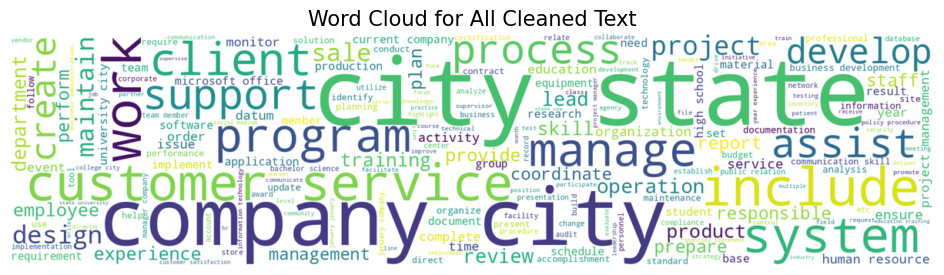

In [9]:
plot_word_cloud_high_quality(data["cleaned_text"], "Word Cloud for All Cleaned Text",
                wordcloud_width=1800, wordcloud_height=450, 
                name_file='word_cloud_cleaned_text.png', plot_width=12, 
                plot_height=3)

#### Plot word clouds for each category

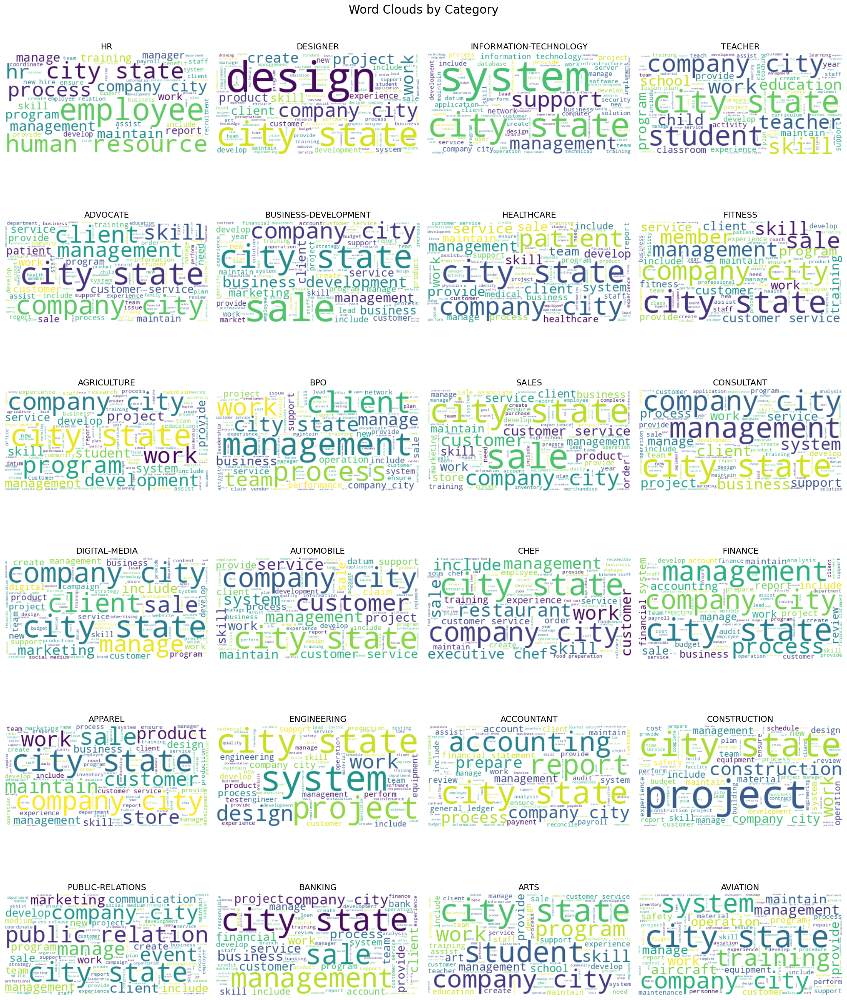

In [10]:
word_cloud_per_category(data, "cleaned_text", "word_cloud_per_category_cleaned_text.png")

### Plot label distribution

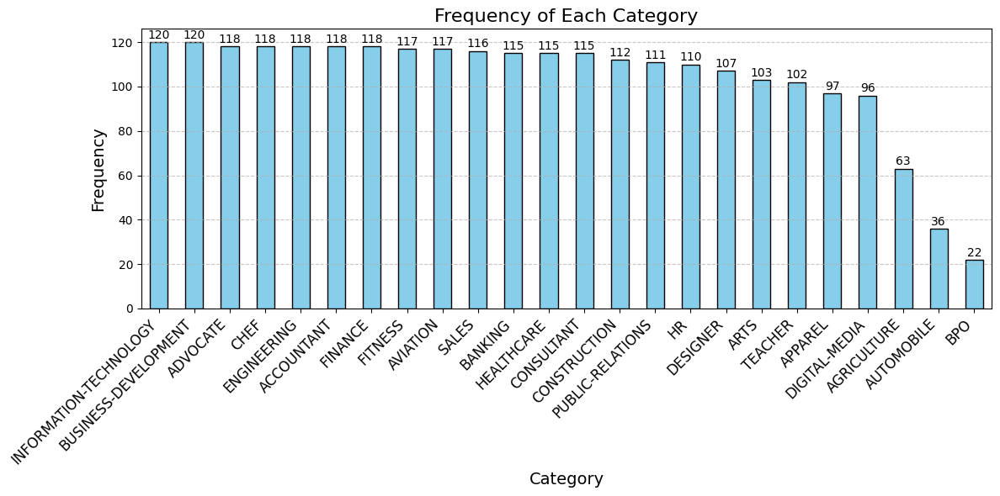

In [11]:
category_counts = data.Category.value_counts()

plt.figure(figsize=(12, 6))
bars = category_counts.plot(kind='bar', color='skyblue', edgecolor='black')

for i, count in enumerate(category_counts):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=10)

plt.title('Frequency of Each Category', fontsize=16)
plt.xlabel('Category', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
name_file = 'label_distribution.png'
plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight") 
plt.show()


## 3. Dataset Partitioning

In [12]:
# Create a mapping from category names to integers
label_to_idx = {label: idx for idx, label in enumerate(set(data["Category"]))}
idx_to_label = {idx: label for label, idx in label_to_idx.items()}

# Convert string labels (Category) to integers
data["numerical_labels"] = data["Category"].map(label_to_idx)

texts = data["cleaned_text"].tolist()
labels = data["numerical_labels"].tolist()

# Split into train+val and test sets first
texts_train_val, texts_test, labels_train_val, labels_test = train_test_split(
    texts, labels, test_size=0.2, stratify=labels, random_state=42
)

# Split train+val into train and validation sets
texts_train, texts_val, labels_train, labels_val = train_test_split(
    texts_train_val, labels_train_val, test_size=0.25, stratify=labels_train_val, random_state=42
)

print(f"Training Set: {len(texts_train)} samples")
print(f"Validation Set: {len(texts_val)} samples")
print(f"Test Set: {len(texts_test)} samples")


Training Set: 1490 samples
Validation Set: 497 samples
Test Set: 497 samples


## 4. Model Definition

In [13]:
class TextClassifier:
    def __init__(self, model_name, num_labels=24, device=None):
        """
        Initialize the TextClassifier.
        Args:
            model_name (str): The name of the pre-trained model.
            num_labels (int): Number of classification labels.
            device (str): Device to use ('cuda' or 'cpu'). Defaults to auto-detection.
        """
        self.num_labels = num_labels
        self.device = device if device else ("cuda" if torch.cuda.is_available() else "cpu")
        self.tokenizer = AutoTokenizer.from_pretrained(model_name)
        self.model_name = model_name

    def initialize_bert(self):
        """
        Initialize a BERT model for classification.
        """
        self.model = BertForSequenceClassification.from_pretrained(self.model_name, num_labels=self.num_labels)
        self.model.to(self.device)

    def initialize_distilbert(self):
        """
        Initialize a DistilBERT model for classification.
        """
        self.model = DistilBertForSequenceClassification.from_pretrained(self.model_name, num_labels=self.num_labels)
        self.model.to(self.device)

    def freeze_base_model(self):
        """
        Freeze all layers except the classification layer.
        """
        for param in self.model.base_model.parameters():
            param.requires_grad = False

    def train_and_save_best_model(self, train_loader, val_loader, test_loader, 
                                  optimizer, criterion, epochs, save_path, patience):
        """
        Train the model and return best validation metric, test metric, and training 
        metric at best validation performance.
        Args:
            train_loader: DataLoader for training data.
            val_loader: DataLoader for validation data.
            test_loader: DataLoader for test data.
            optimizer: Optimizer for training.
            criterion: Loss function.
            epochs: Maximum number of epochs.
            save_path: Path to save the best model.
            patience: Number of epochs to wait before early stopping.
        """
        
        best_val_metric = float('-inf')
        best_model_path = save_path
        
        train_accuracies = []
        val_accuracies = []
        train_losses = []
        no_improvement_epochs = 0 
    
        for epoch in range(epochs):
            self.model.train()
            total_loss = 0
            correct = 0
            total = 0
    
            # Training Loop
            train_bar = tqdm(train_loader, desc="Training", leave=False)
            for batch in train_bar:
                optimizer.zero_grad()
                input_ids = batch["input_ids"].to(self.model.device)
                attention_mask = batch["attention_mask"].to(self.model.device)
                labels = batch["labels"].to(self.model.device)
    
                outputs = self.model(input_ids, attention_mask=attention_mask, labels=labels)
                loss = outputs.loss
                total_loss += loss.item()
                
                preds = torch.argmax(outputs.logits, dim=1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)
                
                loss.backward()
                optimizer.step()

                train_bar.set_postfix(loss=loss.item())

            train_loss = total_loss / len(train_loader)
            train_accuracy = correct / total
            train_losses.append(train_loss)
            train_accuracies.append(train_accuracy)
    
            # Validation Step
            val_metric = self.evaluate_model(val_loader)
            val_accuracies.append(val_metric)
    
            # Save the best model
            if val_metric > best_val_metric:
                best_val_metric = val_metric
                torch.save(self.model.state_dict(), best_model_path)
                no_improvement_epochs = 0 
                test_metric = self.evaluate_model(test_loader)
                best_val_metric = val_metric
                train_metric_at_best_val = train_accuracy
            else:
                no_improvement_epochs += 1

            if no_improvement_epochs >= patience:
                print("Early stopping triggered. Stopping training.")
                break
                
        self.plot_metrics(train_accuracies, val_accuracies, train_losses, len(train_accuracies))
        return best_val_metric, test_metric, train_metric_at_best_val, len(train_accuracies)

    def evaluate_model(self, val_loader):
        """
        Evaluate the model on validation data.
        Args:
            val_loader (DataLoader): DataLoader for validation data.
        """
        self.model.eval()
        predictions, true_labels = [], []

        val_bar = tqdm(val_loader, desc="Validation", leave=False)
        with torch.no_grad():
            for batch in val_bar:
                input_ids = batch["input_ids"].to(self.device)
                attention_mask = batch["attention_mask"].to(self.device)
                labels = batch["labels"].to(self.device)

                outputs = self.model(input_ids, attention_mask=attention_mask)
                preds = torch.argmax(outputs.logits, dim=1)

                predictions.extend(preds.cpu().numpy())
                true_labels.extend(labels.cpu().numpy())

        acc = accuracy_score(true_labels, predictions)
        return acc

    def plot_metrics(self, train_accuracies, val_accuracies, train_losses, epochs_completed):
        """
        Plot training and validation accuracies and training losses.
        """
        epochs_range = range(1, epochs_completed + 1)


        # Plot Accuracy
        plt.figure(figsize=(8, 4))
        plt.plot(epochs_range, train_accuracies, label="Training Accuracy")
        plt.plot(epochs_range, val_accuracies, label="Validation Accuracy")
        plt.title("Training and Validation Accuracy")
        plt.xlabel("Epochs")
        plt.ylabel("Accuracy")
        plt.legend(loc="best")
        plt.grid()
        model_type = self.model_name.split('-')[0]
        name_file = f'accuracy_{model_type}.png'
        plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight") 
        plt.show()

        # Plot Loss
        plt.figure(figsize=(8, 4))
        plt.plot(epochs_range, train_losses, label="Training Loss")
        plt.title("Training Loss")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.legend(loc="best")
        plt.grid()
        name_file = f'loss_{model_type}.png'
        plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight")
        plt.show()


In [14]:
class CustomDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            max_length=self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "labels": torch.tensor(label, dtype=torch.long)
        }

### 4.1. Setup tokenizer for BERT and DistilBERT Models

In [15]:
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

train_dataset = CustomDataset(texts_train, labels_train, tokenizer)
val_dataset = CustomDataset(texts_val, labels_val, tokenizer)
test_dataset = CustomDataset(texts_test, labels_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16)
test_loader = DataLoader(test_dataset, batch_size=16)

### 4.2. Train BERT Model for Resume Classification

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                     | 0/94 [00:00<?, ?it/s, loss=3.18]

Training:   1%|▋                                                            | 1/94 [00:00<00:37,  2.46it/s, loss=3.18]

Training:   1%|▋                                                            | 1/94 [00:00<00:37,  2.46it/s, loss=3.27]

Training:   2%|█▎                                                           | 2/94 [00:00<00:24,  3.74it/s, loss=3.27]

Training:   2%|█▎                                                           | 2/94 [00:00<00:24,  3.74it/s, loss=3.21]

Training:   3%|█▉                                                           | 3/94 [00:00<00:20,  4.50it/s, loss=3.21]

Training:   3%|█▉                                                           | 3/94 [00:00<00:20,  4.50it/s, loss=3.29]

Training:   4%|██▌                                                          | 4/94 [00:00<00:17,  5.06it/s, loss=3.29]

Training:   4%|██▋                                                           | 4/94 [00:01<00:17,  5.06it/s, loss=3.2]

Training:   5%|███▎                                                          | 5/94 [00:01<00:16,  5.40it/s, loss=3.2]

Training:   5%|███▏                                                         | 5/94 [00:01<00:16,  5.40it/s, loss=3.24]

Training:   6%|███▉                                                         | 6/94 [00:01<00:15,  5.60it/s, loss=3.24]

Training:   6%|███▉                                                         | 6/94 [00:01<00:15,  5.60it/s, loss=3.19]

Training:   7%|████▌                                                        | 7/94 [00:01<00:15,  5.77it/s, loss=3.19]

Training:   7%|████▌                                                        | 7/94 [00:01<00:15,  5.77it/s, loss=3.12]

Training:   9%|█████▏                                                       | 8/94 [00:01<00:14,  5.89it/s, loss=3.12]

Training:   9%|█████▏                                                       | 8/94 [00:01<00:14,  5.89it/s, loss=3.14]

Training:  10%|█████▊                                                       | 9/94 [00:01<00:14,  5.95it/s, loss=3.14]

Training:  10%|█████▊                                                       | 9/94 [00:01<00:14,  5.95it/s, loss=3.16]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:13,  6.08it/s, loss=3.16]

Training:  11%|██████▍                                                     | 10/94 [00:02<00:13,  6.08it/s, loss=3.21]

Training:  12%|███████                                                     | 11/94 [00:02<00:13,  6.03it/s, loss=3.21]

Training:  12%|███████                                                     | 11/94 [00:02<00:13,  6.03it/s, loss=3.23]

Training:  13%|███████▋                                                    | 12/94 [00:02<00:13,  6.16it/s, loss=3.23]

Training:  13%|███████▋                                                    | 12/94 [00:02<00:13,  6.16it/s, loss=3.25]

Training:  14%|████████▎                                                   | 13/94 [00:02<00:13,  6.15it/s, loss=3.25]

Training:  14%|████████▎                                                   | 13/94 [00:02<00:13,  6.15it/s, loss=3.26]

Training:  15%|████████▉                                                   | 14/94 [00:02<00:12,  6.17it/s, loss=3.26]

Training:  15%|████████▉                                                   | 14/94 [00:02<00:12,  6.17it/s, loss=3.33]

Training:  16%|█████████▌                                                  | 15/94 [00:02<00:12,  6.21it/s, loss=3.33]

Training:  16%|█████████▌                                                  | 15/94 [00:02<00:12,  6.21it/s, loss=3.13]

Training:  17%|██████████▏                                                 | 16/94 [00:02<00:12,  6.24it/s, loss=3.13]

Training:  17%|██████████▏                                                 | 16/94 [00:03<00:12,  6.24it/s, loss=3.32]

Training:  18%|██████████▊                                                 | 17/94 [00:03<00:12,  6.11it/s, loss=3.32]

Training:  18%|██████████▊                                                 | 17/94 [00:03<00:12,  6.11it/s, loss=3.16]

Training:  19%|███████████▍                                                | 18/94 [00:03<00:12,  6.16it/s, loss=3.16]

Training:  19%|███████████▍                                                | 18/94 [00:03<00:12,  6.16it/s, loss=3.21]

Training:  20%|████████████▏                                               | 19/94 [00:03<00:12,  6.03it/s, loss=3.21]

Training:  20%|████████████▎                                                | 19/94 [00:03<00:12,  6.03it/s, loss=3.2]

Training:  21%|████████████▉                                                | 20/94 [00:03<00:12,  6.05it/s, loss=3.2]

Training:  21%|████████████▊                                               | 20/94 [00:03<00:12,  6.05it/s, loss=3.23]

Training:  22%|█████████████▍                                              | 21/94 [00:03<00:12,  6.05it/s, loss=3.23]

Training:  22%|█████████████▍                                              | 21/94 [00:03<00:12,  6.05it/s, loss=3.16]

Training:  23%|██████████████                                              | 22/94 [00:03<00:11,  6.12it/s, loss=3.16]

Training:  23%|██████████████                                              | 22/94 [00:03<00:11,  6.12it/s, loss=3.16]

Training:  24%|██████████████▋                                             | 23/94 [00:03<00:11,  6.16it/s, loss=3.16]

Training:  24%|██████████████▋                                             | 23/94 [00:04<00:11,  6.16it/s, loss=3.18]

Training:  26%|███████████████▎                                            | 24/94 [00:04<00:11,  6.12it/s, loss=3.18]

Training:  26%|███████████████▎                                            | 24/94 [00:04<00:11,  6.12it/s, loss=3.12]

Training:  27%|███████████████▉                                            | 25/94 [00:04<00:11,  6.08it/s, loss=3.12]

Training:  27%|███████████████▉                                            | 25/94 [00:04<00:11,  6.08it/s, loss=3.15]

Training:  28%|████████████████▌                                           | 26/94 [00:04<00:11,  6.11it/s, loss=3.15]

Training:  28%|████████████████▊                                            | 26/94 [00:04<00:11,  6.11it/s, loss=3.2]

Training:  29%|█████████████████▌                                           | 27/94 [00:04<00:10,  6.20it/s, loss=3.2]

Training:  29%|█████████████████▏                                          | 27/94 [00:04<00:10,  6.20it/s, loss=3.17]

Training:  30%|█████████████████▊                                          | 28/94 [00:04<00:10,  6.19it/s, loss=3.17]

Training:  30%|█████████████████▊                                          | 28/94 [00:04<00:10,  6.19it/s, loss=3.18]

Training:  31%|██████████████████▌                                         | 29/94 [00:04<00:10,  6.16it/s, loss=3.18]

Training:  31%|██████████████████▌                                         | 29/94 [00:05<00:10,  6.16it/s, loss=3.14]

Training:  32%|███████████████████▏                                        | 30/94 [00:05<00:10,  6.19it/s, loss=3.14]

Training:  32%|███████████████████▏                                        | 30/94 [00:05<00:10,  6.19it/s, loss=3.22]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.26it/s, loss=3.22]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.26it/s, loss=3.16]

Training:  34%|████████████████████▍                                       | 32/94 [00:05<00:09,  6.31it/s, loss=3.16]

Training:  34%|████████████████████▍                                       | 32/94 [00:05<00:09,  6.31it/s, loss=3.18]

Training:  35%|█████████████████████                                       | 33/94 [00:05<00:09,  6.28it/s, loss=3.18]

Training:  35%|█████████████████████                                       | 33/94 [00:05<00:09,  6.28it/s, loss=3.16]

Training:  36%|█████████████████████▋                                      | 34/94 [00:05<00:09,  6.27it/s, loss=3.16]

Training:  36%|█████████████████████▋                                      | 34/94 [00:05<00:09,  6.27it/s, loss=3.12]

Training:  37%|██████████████████████▎                                     | 35/94 [00:05<00:09,  6.23it/s, loss=3.12]

Training:  37%|██████████████████████▎                                     | 35/94 [00:06<00:09,  6.23it/s, loss=3.21]

Training:  38%|██████████████████████▉                                     | 36/94 [00:06<00:09,  6.22it/s, loss=3.21]

Training:  38%|██████████████████████▉                                     | 36/94 [00:06<00:09,  6.22it/s, loss=3.19]

Training:  39%|███████████████████████▌                                    | 37/94 [00:06<00:09,  6.21it/s, loss=3.19]

Training:  39%|███████████████████████▌                                    | 37/94 [00:06<00:09,  6.21it/s, loss=3.16]

Training:  40%|████████████████████████▎                                   | 38/94 [00:06<00:09,  6.22it/s, loss=3.16]

Training:  40%|████████████████████████▎                                   | 38/94 [00:06<00:09,  6.22it/s, loss=3.14]

Training:  41%|████████████████████████▉                                   | 39/94 [00:06<00:08,  6.24it/s, loss=3.14]

Training:  41%|████████████████████████▉                                   | 39/94 [00:06<00:08,  6.24it/s, loss=3.15]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:06<00:08,  6.26it/s, loss=3.15]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:06<00:08,  6.26it/s, loss=3.14]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:06<00:08,  6.28it/s, loss=3.14]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:07<00:08,  6.28it/s, loss=3.16]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:07<00:08,  6.23it/s, loss=3.16]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:07<00:08,  6.23it/s, loss=3.11]

Training:  46%|███████████████████████████▍                                | 43/94 [00:07<00:08,  6.26it/s, loss=3.11]

Training:  46%|███████████████████████████▉                                 | 43/94 [00:07<00:08,  6.26it/s, loss=3.1]

Training:  47%|████████████████████████████▌                                | 44/94 [00:07<00:08,  6.22it/s, loss=3.1]

Training:  47%|████████████████████████████                                | 44/94 [00:07<00:08,  6.22it/s, loss=3.14]

Training:  48%|████████████████████████████▋                               | 45/94 [00:07<00:07,  6.22it/s, loss=3.14]

Training:  48%|████████████████████████████▋                               | 45/94 [00:07<00:07,  6.22it/s, loss=3.16]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:07<00:07,  6.18it/s, loss=3.16]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:07<00:07,  6.18it/s, loss=3.23]

Training:  50%|██████████████████████████████                              | 47/94 [00:07<00:07,  6.18it/s, loss=3.23]

Training:  50%|██████████████████████████████                              | 47/94 [00:08<00:07,  6.18it/s, loss=3.21]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:08<00:07,  6.19it/s, loss=3.21]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:08<00:07,  6.19it/s, loss=3.14]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:08<00:07,  6.22it/s, loss=3.14]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:08<00:07,  6.22it/s, loss=3.19]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:08<00:07,  6.23it/s, loss=3.19]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:08<00:07,  6.23it/s, loss=3.17]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:08<00:06,  6.23it/s, loss=3.17]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:08<00:06,  6.23it/s, loss=3.21]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:08<00:06,  6.20it/s, loss=3.21]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:08<00:06,  6.20it/s, loss=3.02]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:08<00:06,  6.19it/s, loss=3.02]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:08<00:06,  6.19it/s, loss=3.16]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:08<00:06,  6.16it/s, loss=3.16]

Training:  57%|███████████████████████████████████                          | 54/94 [00:09<00:06,  6.16it/s, loss=3.2]

Training:  59%|███████████████████████████████████▋                         | 55/94 [00:09<00:06,  6.19it/s, loss=3.2]

Training:  59%|███████████████████████████████████                         | 55/94 [00:09<00:06,  6.19it/s, loss=3.06]

Training:  60%|███████████████████████████████████▋                        | 56/94 [00:09<00:06,  6.18it/s, loss=3.06]

Training:  60%|███████████████████████████████████▋                        | 56/94 [00:09<00:06,  6.18it/s, loss=3.13]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:09<00:05,  6.18it/s, loss=3.13]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:09<00:05,  6.18it/s, loss=3.29]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:09<00:05,  6.14it/s, loss=3.29]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:09<00:05,  6.14it/s, loss=3.15]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:09<00:05,  6.13it/s, loss=3.15]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:09<00:05,  6.13it/s, loss=3.15]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:09<00:05,  6.13it/s, loss=3.15]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:10<00:05,  6.13it/s, loss=3.16]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:10<00:05,  6.13it/s, loss=3.16]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:10<00:05,  6.13it/s, loss=3.13]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:10<00:05,  6.16it/s, loss=3.13]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:10<00:05,  6.16it/s, loss=3.15]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:10<00:05,  6.16it/s, loss=3.15]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:10<00:05,  6.16it/s, loss=3.18]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:10<00:04,  6.12it/s, loss=3.18]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:10<00:04,  6.12it/s, loss=3.04]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:10<00:04,  6.15it/s, loss=3.04]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:10<00:04,  6.15it/s, loss=3.18]

Training:  70%|██████████████████████████████████████████▏                 | 66/94 [00:10<00:04,  6.12it/s, loss=3.18]

Training:  70%|██████████████████████████████████████████▊                  | 66/94 [00:11<00:04,  6.12it/s, loss=3.2]

Training:  71%|███████████████████████████████████████████▍                 | 67/94 [00:11<00:04,  6.18it/s, loss=3.2]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:11<00:04,  6.18it/s, loss=3.12]

Training:  72%|███████████████████████████████████████████▍                | 68/94 [00:11<00:04,  6.15it/s, loss=3.12]

Training:  72%|███████████████████████████████████████████▍                | 68/94 [00:11<00:04,  6.15it/s, loss=3.13]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:11<00:04,  6.04it/s, loss=3.13]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:11<00:04,  6.04it/s, loss=3.18]

Training:  74%|████████████████████████████████████████████▋               | 70/94 [00:11<00:03,  6.04it/s, loss=3.18]

Training:  74%|████████████████████████████████████████████▋               | 70/94 [00:11<00:03,  6.04it/s, loss=3.16]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:11<00:03,  6.12it/s, loss=3.16]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:11<00:03,  6.12it/s, loss=3.16]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:11<00:03,  6.14it/s, loss=3.16]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:12<00:03,  6.14it/s, loss=3.12]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:12<00:03,  6.11it/s, loss=3.12]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:12<00:03,  6.11it/s, loss=3.18]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:12<00:03,  6.10it/s, loss=3.18]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:12<00:03,  6.10it/s, loss=3.04]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:12<00:03,  6.08it/s, loss=3.04]

Training:  80%|██████████████████████████████████████████████████▎            | 75/94 [00:12<00:03,  6.08it/s, loss=3]

Training:  81%|██████████████████████████████████████████████████▉            | 76/94 [00:12<00:02,  6.13it/s, loss=3]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:12<00:02,  6.13it/s, loss=3.02]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:12<00:02,  6.17it/s, loss=3.02]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:12<00:02,  6.17it/s, loss=3.02]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:12<00:02,  6.17it/s, loss=3.02]

Training:  83%|██████████████████████████████████████████████████▌          | 78/94 [00:13<00:02,  6.17it/s, loss=3.1]

Training:  84%|███████████████████████████████████████████████████▎         | 79/94 [00:13<00:02,  6.16it/s, loss=3.1]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:13<00:02,  6.16it/s, loss=3.05]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:13<00:02,  6.15it/s, loss=3.05]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:13<00:02,  6.15it/s, loss=3.06]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:13<00:02,  6.14it/s, loss=3.06]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:13<00:02,  6.14it/s, loss=2.99]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:13<00:01,  6.17it/s, loss=2.99]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:13<00:01,  6.17it/s, loss=2.84]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:13<00:01,  6.19it/s, loss=2.84]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:13<00:01,  6.19it/s, loss=2.85]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:13<00:01,  6.18it/s, loss=2.85]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:14<00:01,  6.18it/s, loss=2.95]

Training:  90%|██████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  6.20it/s, loss=2.95]

Training:  90%|██████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  6.20it/s, loss=2.95]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.18it/s, loss=2.95]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.18it/s, loss=3.02]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.18it/s, loss=3.02]

Training:  93%|████████████████████████████████████████████████████████▍    | 87/94 [00:14<00:01,  6.18it/s, loss=3.2]

Training:  94%|█████████████████████████████████████████████████████████    | 88/94 [00:14<00:00,  6.22it/s, loss=3.2]

Training:  94%|█████████████████████████████████████████████████████████    | 88/94 [00:14<00:00,  6.22it/s, loss=2.7]

Training:  95%|█████████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.23it/s, loss=2.7]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.23it/s, loss=2.84]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.26it/s, loss=2.84]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:15<00:00,  6.26it/s, loss=2.89]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.16it/s, loss=2.89]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.16it/s, loss=2.87]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.17it/s, loss=2.87]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.17it/s, loss=2.82]

Training:  99%|███████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.17it/s, loss=2.82]

Training:  99%|███████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.17it/s, loss=2.59]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 13.94it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 14.27it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 14.00it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 14.43it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.29it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 14.06it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.41it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.24it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.21it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.20it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 13.93it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 13.76it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 13.81it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 13.94it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 13.87it/s]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 12.73it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:02, 13.81it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 13.79it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 13.85it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 13.95it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 13.93it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:01<00:01, 14.03it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.02it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:01, 13.74it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 13.81it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 13.55it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 13.87it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 13.95it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:02<00:00, 14.01it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 14.08it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                     | 0/94 [00:00<?, ?it/s, loss=2.66]

Training:   1%|▋                                                            | 1/94 [00:00<00:14,  6.36it/s, loss=2.66]

Training:   1%|▋                                                            | 1/94 [00:00<00:14,  6.36it/s, loss=2.81]

Training:   2%|█▎                                                           | 2/94 [00:00<00:14,  6.18it/s, loss=2.81]

Training:   2%|█▎                                                            | 2/94 [00:00<00:14,  6.18it/s, loss=2.8]

Training:   3%|█▉                                                            | 3/94 [00:00<00:14,  6.10it/s, loss=2.8]

Training:   3%|█▉                                                           | 3/94 [00:00<00:14,  6.10it/s, loss=2.89]

Training:   4%|██▌                                                          | 4/94 [00:00<00:14,  6.14it/s, loss=2.89]

Training:   4%|██▌                                                          | 4/94 [00:00<00:14,  6.14it/s, loss=2.88]

Training:   5%|███▏                                                         | 5/94 [00:00<00:14,  6.21it/s, loss=2.88]

Training:   5%|███▎                                                          | 5/94 [00:00<00:14,  6.21it/s, loss=2.7]

Training:   6%|███▉                                                          | 6/94 [00:00<00:14,  6.15it/s, loss=2.7]

Training:   6%|███▉                                                         | 6/94 [00:01<00:14,  6.15it/s, loss=2.82]

Training:   7%|████▌                                                        | 7/94 [00:01<00:14,  6.13it/s, loss=2.82]

Training:   7%|████▌                                                        | 7/94 [00:01<00:14,  6.13it/s, loss=2.55]

Training:   9%|█████▏                                                       | 8/94 [00:01<00:14,  6.14it/s, loss=2.55]

Training:   9%|█████▏                                                       | 8/94 [00:01<00:14,  6.14it/s, loss=2.92]

Training:  10%|█████▊                                                       | 9/94 [00:01<00:13,  6.15it/s, loss=2.92]

Training:  10%|█████▉                                                        | 9/94 [00:01<00:13,  6.15it/s, loss=2.8]

Training:  11%|██████▍                                                      | 10/94 [00:01<00:13,  6.13it/s, loss=2.8]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:13,  6.13it/s, loss=2.69]

Training:  12%|███████                                                     | 11/94 [00:01<00:13,  6.14it/s, loss=2.69]

Training:  12%|███████                                                     | 11/94 [00:01<00:13,  6.14it/s, loss=2.68]

Training:  13%|███████▋                                                    | 12/94 [00:01<00:13,  5.99it/s, loss=2.68]

Training:  13%|███████▋                                                    | 12/94 [00:02<00:13,  5.99it/s, loss=2.61]

Training:  14%|████████▎                                                   | 13/94 [00:02<00:13,  5.97it/s, loss=2.61]

Training:  14%|████████▎                                                   | 13/94 [00:02<00:13,  5.97it/s, loss=2.62]

Training:  15%|████████▉                                                   | 14/94 [00:02<00:13,  5.99it/s, loss=2.62]

Training:  15%|████████▉                                                   | 14/94 [00:02<00:13,  5.99it/s, loss=2.41]

Training:  16%|█████████▌                                                  | 15/94 [00:02<00:13,  6.05it/s, loss=2.41]

Training:  16%|█████████▌                                                  | 15/94 [00:02<00:13,  6.05it/s, loss=2.77]

Training:  17%|██████████▏                                                 | 16/94 [00:02<00:12,  6.13it/s, loss=2.77]

Training:  17%|██████████▏                                                 | 16/94 [00:02<00:12,  6.13it/s, loss=2.66]

Training:  18%|██████████▊                                                 | 17/94 [00:02<00:12,  6.15it/s, loss=2.66]

Training:  18%|██████████▊                                                 | 17/94 [00:02<00:12,  6.15it/s, loss=2.55]

Training:  19%|███████████▍                                                | 18/94 [00:02<00:12,  6.14it/s, loss=2.55]

Training:  19%|███████████▍                                                | 18/94 [00:03<00:12,  6.14it/s, loss=2.47]

Training:  20%|████████████▏                                               | 19/94 [00:03<00:12,  6.15it/s, loss=2.47]

Training:  20%|████████████▏                                               | 19/94 [00:03<00:12,  6.15it/s, loss=2.69]

Training:  21%|████████████▊                                               | 20/94 [00:03<00:12,  6.10it/s, loss=2.69]

Training:  21%|████████████▊                                               | 20/94 [00:03<00:12,  6.10it/s, loss=2.42]

Training:  22%|█████████████▍                                              | 21/94 [00:03<00:11,  6.14it/s, loss=2.42]

Training:  22%|█████████████▍                                              | 21/94 [00:03<00:11,  6.14it/s, loss=2.39]

Training:  23%|██████████████                                              | 22/94 [00:03<00:11,  6.17it/s, loss=2.39]

Training:  23%|██████████████                                              | 22/94 [00:03<00:11,  6.17it/s, loss=2.51]

Training:  24%|██████████████▋                                             | 23/94 [00:03<00:11,  6.13it/s, loss=2.51]

Training:  24%|██████████████▋                                             | 23/94 [00:03<00:11,  6.13it/s, loss=2.36]

Training:  26%|███████████████▎                                            | 24/94 [00:03<00:11,  6.16it/s, loss=2.36]

Training:  26%|███████████████▎                                            | 24/94 [00:04<00:11,  6.16it/s, loss=2.68]

Training:  27%|███████████████▉                                            | 25/94 [00:04<00:11,  6.21it/s, loss=2.68]

Training:  27%|████████████████▏                                            | 25/94 [00:04<00:11,  6.21it/s, loss=2.4]

Training:  28%|████████████████▊                                            | 26/94 [00:04<00:10,  6.18it/s, loss=2.4]

Training:  28%|████████████████▌                                           | 26/94 [00:04<00:10,  6.18it/s, loss=1.94]

Training:  29%|█████████████████▏                                          | 27/94 [00:04<00:10,  6.17it/s, loss=1.94]

Training:  29%|█████████████████▏                                          | 27/94 [00:04<00:10,  6.17it/s, loss=2.32]

Training:  30%|█████████████████▊                                          | 28/94 [00:04<00:10,  6.21it/s, loss=2.32]

Training:  30%|█████████████████▊                                          | 28/94 [00:04<00:10,  6.21it/s, loss=2.23]

Training:  31%|██████████████████▌                                         | 29/94 [00:04<00:10,  6.16it/s, loss=2.23]

Training:  31%|██████████████████▌                                         | 29/94 [00:04<00:10,  6.16it/s, loss=2.34]

Training:  32%|███████████████████▏                                        | 30/94 [00:04<00:10,  6.13it/s, loss=2.34]

Training:  32%|███████████████████▏                                        | 30/94 [00:05<00:10,  6.13it/s, loss=2.27]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.15it/s, loss=2.27]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.15it/s, loss=2.36]

Training:  34%|████████████████████▍                                       | 32/94 [00:05<00:10,  6.08it/s, loss=2.36]

Training:  34%|████████████████████▊                                        | 32/94 [00:05<00:10,  6.08it/s, loss=2.4]

Training:  35%|█████████████████████▍                                       | 33/94 [00:05<00:10,  6.08it/s, loss=2.4]

Training:  35%|█████████████████████                                       | 33/94 [00:05<00:10,  6.08it/s, loss=2.31]

Training:  36%|█████████████████████▋                                      | 34/94 [00:05<00:09,  6.05it/s, loss=2.31]

Training:  36%|██████████████████████                                       | 34/94 [00:05<00:09,  6.05it/s, loss=2.3]

Training:  37%|██████████████████████▋                                      | 35/94 [00:05<00:09,  6.08it/s, loss=2.3]

Training:  37%|██████████████████████▎                                     | 35/94 [00:05<00:09,  6.08it/s, loss=2.17]

Training:  38%|██████████████████████▉                                     | 36/94 [00:05<00:09,  6.08it/s, loss=2.17]

Training:  38%|██████████████████████▉                                     | 36/94 [00:06<00:09,  6.08it/s, loss=2.21]

Training:  39%|███████████████████████▌                                    | 37/94 [00:06<00:09,  6.10it/s, loss=2.21]

Training:  39%|███████████████████████▌                                    | 37/94 [00:06<00:09,  6.10it/s, loss=2.07]

Training:  40%|████████████████████████▎                                   | 38/94 [00:06<00:09,  6.13it/s, loss=2.07]

Training:  40%|████████████████████████▎                                   | 38/94 [00:06<00:09,  6.13it/s, loss=2.12]

Training:  41%|████████████████████████▉                                   | 39/94 [00:06<00:09,  6.07it/s, loss=2.12]

Training:  41%|████████████████████████▉                                   | 39/94 [00:06<00:09,  6.07it/s, loss=2.15]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:06<00:08,  6.12it/s, loss=2.15]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:06<00:08,  6.12it/s, loss=2.13]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:06<00:08,  6.10it/s, loss=2.13]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:06<00:08,  6.10it/s, loss=2.41]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:06<00:08,  6.04it/s, loss=2.41]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:07<00:08,  6.04it/s, loss=2.28]

Training:  46%|███████████████████████████▍                                | 43/94 [00:07<00:08,  6.05it/s, loss=2.28]

Training:  46%|███████████████████████████▍                                | 43/94 [00:07<00:08,  6.05it/s, loss=1.98]

Training:  47%|████████████████████████████                                | 44/94 [00:07<00:08,  6.09it/s, loss=1.98]

Training:  47%|████████████████████████████                                | 44/94 [00:07<00:08,  6.09it/s, loss=2.17]

Training:  48%|████████████████████████████▋                               | 45/94 [00:07<00:08,  6.12it/s, loss=2.17]

Training:  48%|█████████████████████████████▏                               | 45/94 [00:07<00:08,  6.12it/s, loss=2.4]

Training:  49%|█████████████████████████████▊                               | 46/94 [00:07<00:07,  6.09it/s, loss=2.4]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:07<00:07,  6.09it/s, loss=2.16]

Training:  50%|██████████████████████████████                              | 47/94 [00:07<00:07,  6.08it/s, loss=2.16]

Training:  50%|██████████████████████████████                              | 47/94 [00:07<00:07,  6.08it/s, loss=2.11]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:07<00:07,  5.98it/s, loss=2.11]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:08<00:07,  5.98it/s, loss=2.17]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:08<00:07,  6.08it/s, loss=2.17]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:08<00:07,  6.08it/s, loss=2.22]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:08<00:07,  6.14it/s, loss=2.22]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:08<00:07,  6.14it/s, loss=2.13]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:08<00:07,  6.11it/s, loss=2.13]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:08<00:07,  6.11it/s, loss=1.88]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:08<00:06,  6.09it/s, loss=1.88]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:08<00:06,  6.09it/s, loss=1.82]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:08<00:06,  6.14it/s, loss=1.82]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:08<00:06,  6.14it/s, loss=1.85]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:08<00:06,  6.12it/s, loss=1.85]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:09<00:06,  6.12it/s, loss=2.18]

Training:  59%|███████████████████████████████████                         | 55/94 [00:09<00:06,  6.06it/s, loss=2.18]

Training:  59%|███████████████████████████████████                         | 55/94 [00:09<00:06,  6.06it/s, loss=1.84]

Training:  60%|███████████████████████████████████▋                        | 56/94 [00:09<00:06,  6.07it/s, loss=1.84]

Training:  60%|███████████████████████████████████▋                        | 56/94 [00:09<00:06,  6.07it/s, loss=2.13]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:09<00:06,  6.00it/s, loss=2.13]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:09<00:06,  6.00it/s, loss=1.74]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:09<00:05,  6.05it/s, loss=1.74]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:09<00:05,  6.05it/s, loss=2.05]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:09<00:05,  6.11it/s, loss=2.05]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:09<00:05,  6.11it/s, loss=1.78]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:09<00:05,  6.17it/s, loss=1.78]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:09<00:05,  6.17it/s, loss=1.83]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:09<00:05,  6.13it/s, loss=1.83]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:10<00:05,  6.13it/s, loss=1.93]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:10<00:05,  6.05it/s, loss=1.93]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:10<00:05,  6.05it/s, loss=1.81]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:10<00:05,  5.98it/s, loss=1.81]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:10<00:05,  5.98it/s, loss=1.95]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:10<00:04,  6.01it/s, loss=1.95]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:10<00:04,  6.01it/s, loss=1.96]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:10<00:04,  5.96it/s, loss=1.96]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:10<00:04,  5.96it/s, loss=2.13]

Training:  70%|██████████████████████████████████████████▏                 | 66/94 [00:10<00:04,  6.03it/s, loss=2.13]

Training:  70%|██████████████████████████████████████████▏                 | 66/94 [00:10<00:04,  6.03it/s, loss=1.53]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:10<00:04,  5.97it/s, loss=1.53]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:11<00:04,  5.97it/s, loss=2.01]

Training:  72%|███████████████████████████████████████████▍                | 68/94 [00:11<00:04,  6.03it/s, loss=2.01]

Training:  72%|███████████████████████████████████████████▍                | 68/94 [00:11<00:04,  6.03it/s, loss=1.41]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:11<00:04,  6.12it/s, loss=1.41]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:11<00:04,  6.12it/s, loss=1.95]

Training:  74%|████████████████████████████████████████████▋               | 70/94 [00:11<00:03,  6.18it/s, loss=1.95]

Training:  74%|████████████████████████████████████████████▋               | 70/94 [00:11<00:03,  6.18it/s, loss=1.45]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:11<00:03,  6.09it/s, loss=1.45]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:11<00:03,  6.09it/s, loss=1.99]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:11<00:03,  6.10it/s, loss=1.99]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:11<00:03,  6.10it/s, loss=1.72]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:11<00:03,  6.14it/s, loss=1.72]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:12<00:03,  6.14it/s, loss=1.86]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:12<00:03,  6.13it/s, loss=1.86]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:12<00:03,  6.13it/s, loss=1.67]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:12<00:03,  6.13it/s, loss=1.67]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:12<00:03,  6.13it/s, loss=1.76]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:12<00:02,  6.13it/s, loss=1.76]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:12<00:02,  6.13it/s, loss=1.84]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:12<00:02,  6.16it/s, loss=1.84]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:12<00:02,  6.16it/s, loss=1.59]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:12<00:02,  6.15it/s, loss=1.59]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:12<00:02,  6.15it/s, loss=1.46]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:12<00:02,  6.09it/s, loss=1.46]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:13<00:02,  6.09it/s, loss=1.96]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:13<00:02,  6.11it/s, loss=1.96]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:13<00:02,  6.11it/s, loss=1.79]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:13<00:02,  6.14it/s, loss=1.79]

Training:  86%|████████████████████████████████████████████████████▌        | 81/94 [00:13<00:02,  6.14it/s, loss=1.7]

Training:  87%|█████████████████████████████████████████████████████▏       | 82/94 [00:13<00:01,  6.16it/s, loss=1.7]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:13<00:01,  6.16it/s, loss=1.66]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:13<00:01,  6.20it/s, loss=1.66]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:13<00:01,  6.20it/s, loss=1.65]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:13<00:01,  6.16it/s, loss=1.65]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:13<00:01,  6.16it/s, loss=1.64]

Training:  90%|██████████████████████████████████████████████████████▎     | 85/94 [00:13<00:01,  6.14it/s, loss=1.64]

Training:  90%|██████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  6.14it/s, loss=1.64]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.11it/s, loss=1.64]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.11it/s, loss=2.01]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.15it/s, loss=2.01]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.15it/s, loss=1.73]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.13it/s, loss=1.73]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.13it/s, loss=1.73]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.16it/s, loss=1.73]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.16it/s, loss=1.49]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.21it/s, loss=1.49]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.21it/s, loss=1.87]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:14<00:00,  6.26it/s, loss=1.87]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.26it/s, loss=1.33]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.27it/s, loss=1.33]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.27it/s, loss=1.59]

Training:  99%|███████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.21it/s, loss=1.59]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.21it/s, loss=0.761]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 14.80it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 15.12it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 14.80it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 15.31it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 15.12it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 14.90it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 15.08it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.88it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.80it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.70it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 14.39it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 14.29it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 14.31it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 14.38it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 14.28it/s]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 12.78it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:02, 13.44it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 13.56it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 13.89it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.15it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 14.22it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.37it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.44it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.16it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.18it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 13.93it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 14.17it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 14.25it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 14.37it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 14.43it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                     | 0/94 [00:00<?, ?it/s, loss=1.86]

Training:   1%|▋                                                            | 1/94 [00:00<00:15,  6.05it/s, loss=1.86]

Training:   1%|▋                                                            | 1/94 [00:00<00:15,  6.05it/s, loss=1.53]

Training:   2%|█▎                                                           | 2/94 [00:00<00:14,  6.18it/s, loss=1.53]

Training:   2%|█▎                                                           | 2/94 [00:00<00:14,  6.18it/s, loss=1.77]

Training:   3%|█▉                                                           | 3/94 [00:00<00:14,  6.18it/s, loss=1.77]

Training:   3%|█▉                                                           | 3/94 [00:00<00:14,  6.18it/s, loss=1.16]

Training:   4%|██▌                                                          | 4/94 [00:00<00:14,  6.18it/s, loss=1.16]

Training:   4%|██▌                                                          | 4/94 [00:00<00:14,  6.18it/s, loss=1.49]

Training:   5%|███▏                                                         | 5/94 [00:00<00:14,  6.14it/s, loss=1.49]

Training:   5%|███▏                                                         | 5/94 [00:00<00:14,  6.14it/s, loss=1.24]

Training:   6%|███▉                                                         | 6/94 [00:00<00:14,  6.11it/s, loss=1.24]

Training:   6%|███▉                                                         | 6/94 [00:01<00:14,  6.11it/s, loss=1.47]

Training:   7%|████▌                                                        | 7/94 [00:01<00:14,  6.17it/s, loss=1.47]

Training:   7%|████▌                                                        | 7/94 [00:01<00:14,  6.17it/s, loss=1.36]

Training:   9%|█████▏                                                       | 8/94 [00:01<00:13,  6.17it/s, loss=1.36]

Training:   9%|█████▎                                                        | 8/94 [00:01<00:13,  6.17it/s, loss=1.1]

Training:  10%|█████▉                                                        | 9/94 [00:01<00:13,  6.14it/s, loss=1.1]

Training:  10%|█████▊                                                       | 9/94 [00:01<00:13,  6.14it/s, loss=1.64]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:13,  6.15it/s, loss=1.64]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:13,  6.15it/s, loss=1.46]

Training:  12%|███████                                                     | 11/94 [00:01<00:13,  6.18it/s, loss=1.46]

Training:  12%|███████                                                     | 11/94 [00:01<00:13,  6.18it/s, loss=1.72]

Training:  13%|███████▋                                                    | 12/94 [00:01<00:13,  6.21it/s, loss=1.72]

Training:  13%|███████▋                                                    | 12/94 [00:02<00:13,  6.21it/s, loss=1.41]

Training:  14%|████████▎                                                   | 13/94 [00:02<00:13,  6.18it/s, loss=1.41]

Training:  14%|████████▎                                                   | 13/94 [00:02<00:13,  6.18it/s, loss=1.69]

Training:  15%|████████▉                                                   | 14/94 [00:02<00:12,  6.20it/s, loss=1.69]

Training:  15%|████████▉                                                   | 14/94 [00:02<00:12,  6.20it/s, loss=1.67]

Training:  16%|█████████▌                                                  | 15/94 [00:02<00:12,  6.20it/s, loss=1.67]

Training:  16%|█████████▌                                                  | 15/94 [00:02<00:12,  6.20it/s, loss=1.46]

Training:  17%|██████████▏                                                 | 16/94 [00:02<00:12,  6.22it/s, loss=1.46]

Training:  17%|██████████▏                                                 | 16/94 [00:02<00:12,  6.22it/s, loss=1.07]

Training:  18%|██████████▊                                                 | 17/94 [00:02<00:12,  6.09it/s, loss=1.07]

Training:  18%|██████████▋                                                | 17/94 [00:02<00:12,  6.09it/s, loss=0.969]

Training:  19%|███████████▎                                               | 18/94 [00:02<00:12,  6.15it/s, loss=0.969]

Training:  19%|███████████▍                                                | 18/94 [00:03<00:12,  6.15it/s, loss=1.07]

Training:  20%|████████████▏                                               | 19/94 [00:03<00:12,  6.17it/s, loss=1.07]

Training:  20%|████████████▏                                               | 19/94 [00:03<00:12,  6.17it/s, loss=0.92]

Training:  21%|████████████▊                                               | 20/94 [00:03<00:11,  6.23it/s, loss=0.92]

Training:  21%|████████████▊                                               | 20/94 [00:03<00:11,  6.23it/s, loss=1.21]

Training:  22%|█████████████▍                                              | 21/94 [00:03<00:11,  6.24it/s, loss=1.21]

Training:  22%|█████████████▍                                              | 21/94 [00:03<00:11,  6.24it/s, loss=1.16]

Training:  23%|██████████████                                              | 22/94 [00:03<00:11,  6.27it/s, loss=1.16]

Training:  23%|██████████████▎                                              | 22/94 [00:03<00:11,  6.27it/s, loss=1.1]

Training:  24%|██████████████▉                                              | 23/94 [00:03<00:11,  6.28it/s, loss=1.1]

Training:  24%|██████████████▉                                              | 23/94 [00:03<00:11,  6.28it/s, loss=1.3]

Training:  26%|███████████████▌                                             | 24/94 [00:03<00:11,  6.24it/s, loss=1.3]

Training:  26%|███████████████▎                                            | 24/94 [00:04<00:11,  6.24it/s, loss=1.29]

Training:  27%|███████████████▉                                            | 25/94 [00:04<00:11,  6.11it/s, loss=1.29]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  6.11it/s, loss=0.963]

Training:  28%|████████████████▎                                          | 26/94 [00:04<00:11,  6.11it/s, loss=0.963]

Training:  28%|████████████████▊                                            | 26/94 [00:04<00:11,  6.11it/s, loss=1.5]

Training:  29%|█████████████████▌                                           | 27/94 [00:04<00:10,  6.16it/s, loss=1.5]

Training:  29%|█████████████████▏                                          | 27/94 [00:04<00:10,  6.16it/s, loss=1.08]

Training:  30%|█████████████████▊                                          | 28/94 [00:04<00:10,  6.18it/s, loss=1.08]

Training:  30%|█████████████████▊                                          | 28/94 [00:04<00:10,  6.18it/s, loss=1.34]

Training:  31%|██████████████████▌                                         | 29/94 [00:04<00:10,  6.17it/s, loss=1.34]

Training:  31%|██████████████████▌                                         | 29/94 [00:04<00:10,  6.17it/s, loss=1.07]

Training:  32%|███████████████████▏                                        | 30/94 [00:04<00:10,  6.24it/s, loss=1.07]

Training:  32%|███████████████████▏                                        | 30/94 [00:05<00:10,  6.24it/s, loss=1.46]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.24it/s, loss=1.46]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.24it/s, loss=1.05]

Training:  34%|████████████████████▍                                       | 32/94 [00:05<00:09,  6.22it/s, loss=1.05]

Training:  34%|████████████████████▍                                       | 32/94 [00:05<00:09,  6.22it/s, loss=1.63]

Training:  35%|█████████████████████                                       | 33/94 [00:05<00:09,  6.20it/s, loss=1.63]

Training:  35%|█████████████████████                                       | 33/94 [00:05<00:09,  6.20it/s, loss=1.25]

Training:  36%|█████████████████████▋                                      | 34/94 [00:05<00:09,  6.21it/s, loss=1.25]

Training:  36%|█████████████████████▋                                      | 34/94 [00:05<00:09,  6.21it/s, loss=1.27]

Training:  37%|██████████████████████▎                                     | 35/94 [00:05<00:09,  6.25it/s, loss=1.27]

Training:  37%|██████████████████████▎                                     | 35/94 [00:05<00:09,  6.25it/s, loss=1.21]

Training:  38%|██████████████████████▉                                     | 36/94 [00:05<00:09,  6.22it/s, loss=1.21]

Training:  38%|██████████████████████▉                                     | 36/94 [00:05<00:09,  6.22it/s, loss=1.21]

Training:  39%|███████████████████████▌                                    | 37/94 [00:05<00:09,  6.21it/s, loss=1.21]

Training:  39%|███████████████████████▌                                    | 37/94 [00:06<00:09,  6.21it/s, loss=1.01]

Training:  40%|████████████████████████▎                                   | 38/94 [00:06<00:09,  6.15it/s, loss=1.01]

Training:  40%|████████████████████████▎                                   | 38/94 [00:06<00:09,  6.15it/s, loss=1.03]

Training:  41%|████████████████████████▉                                   | 39/94 [00:06<00:09,  6.11it/s, loss=1.03]

Training:  41%|████████████████████████▉                                   | 39/94 [00:06<00:09,  6.11it/s, loss=1.34]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:06<00:08,  6.07it/s, loss=1.34]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:06<00:08,  6.07it/s, loss=1.11]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:06<00:08,  6.03it/s, loss=1.11]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:06<00:08,  6.03it/s, loss=1.59]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:06<00:08,  6.08it/s, loss=1.59]

Training:  45%|███████████████████████████▎                                 | 42/94 [00:06<00:08,  6.08it/s, loss=1.2]

Training:  46%|███████████████████████████▉                                 | 43/94 [00:06<00:08,  6.10it/s, loss=1.2]

Training:  46%|███████████████████████████▍                                | 43/94 [00:07<00:08,  6.10it/s, loss=1.39]

Training:  47%|████████████████████████████                                | 44/94 [00:07<00:08,  6.06it/s, loss=1.39]

Training:  47%|████████████████████████████                                | 44/94 [00:07<00:08,  6.06it/s, loss=1.02]

Training:  48%|████████████████████████████▋                               | 45/94 [00:07<00:08,  6.07it/s, loss=1.02]

Training:  48%|████████████████████████████▋                               | 45/94 [00:07<00:08,  6.07it/s, loss=1.02]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:07<00:07,  6.03it/s, loss=1.02]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:07<00:07,  6.03it/s, loss=1.39]

Training:  50%|██████████████████████████████                              | 47/94 [00:07<00:07,  6.00it/s, loss=1.39]

Training:  50%|██████████████████████████████                              | 47/94 [00:07<00:07,  6.00it/s, loss=1.44]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:07<00:07,  6.06it/s, loss=1.44]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:07<00:07,  6.06it/s, loss=0.993]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:07<00:07,  6.06it/s, loss=0.993]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:08<00:07,  6.06it/s, loss=0.88]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:08<00:07,  6.11it/s, loss=0.88]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:08<00:07,  6.11it/s, loss=0.973]

Training:  54%|████████████████████████████████                           | 51/94 [00:08<00:07,  6.10it/s, loss=0.973]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:08<00:07,  6.10it/s, loss=1.35]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:08<00:06,  6.10it/s, loss=1.35]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:08<00:06,  6.10it/s, loss=0.92]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:08<00:06,  6.12it/s, loss=0.92]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:08<00:06,  6.12it/s, loss=1.09]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:08<00:06,  6.14it/s, loss=1.09]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:08<00:06,  6.14it/s, loss=0.992]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:08<00:06,  6.17it/s, loss=0.992]

Training:  59%|███████████████████████████████████                         | 55/94 [00:09<00:06,  6.17it/s, loss=1.41]

Training:  60%|███████████████████████████████████▋                        | 56/94 [00:09<00:06,  6.19it/s, loss=1.41]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  6.19it/s, loss=0.973]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:09<00:05,  6.19it/s, loss=0.973]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:09<00:05,  6.19it/s, loss=1.11]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:09<00:05,  6.11it/s, loss=1.11]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:05,  6.11it/s, loss=0.766]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.16it/s, loss=0.766]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:09<00:05,  6.16it/s, loss=1.19]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:09<00:05,  6.15it/s, loss=1.19]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:09<00:05,  6.15it/s, loss=1.09]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:09<00:05,  6.12it/s, loss=1.09]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:10<00:05,  6.12it/s, loss=0.873]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  6.13it/s, loss=0.873]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:10<00:05,  6.13it/s, loss=1.33]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:10<00:05,  6.13it/s, loss=1.33]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:10<00:05,  6.13it/s, loss=1.27]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:10<00:04,  6.13it/s, loss=1.27]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:10<00:04,  6.13it/s, loss=1.24]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:10<00:04,  6.14it/s, loss=1.24]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.14it/s, loss=0.887]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:10<00:04,  6.17it/s, loss=0.887]

Training:  70%|██████████████████████████████████████████▏                 | 66/94 [00:10<00:04,  6.17it/s, loss=1.06]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:10<00:04,  6.19it/s, loss=1.06]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:11<00:04,  6.19it/s, loss=1.32]

Training:  72%|███████████████████████████████████████████▍                | 68/94 [00:11<00:04,  6.22it/s, loss=1.32]

Training:  72%|████████████████████████████████████████████▏                | 68/94 [00:11<00:04,  6.22it/s, loss=1.1]

Training:  73%|████████████████████████████████████████████▊                | 69/94 [00:11<00:03,  6.27it/s, loss=1.1]

Training:  73%|██████████████████████████████████████████████▏                | 69/94 [00:11<00:03,  6.27it/s, loss=1]

Training:  74%|██████████████████████████████████████████████▉                | 70/94 [00:11<00:03,  6.27it/s, loss=1]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.27it/s, loss=0.962]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.22it/s, loss=0.962]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:11<00:03,  6.22it/s, loss=1.47]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:11<00:03,  6.24it/s, loss=1.47]

Training:  77%|██████████████████████████████████████████████▋              | 72/94 [00:11<00:03,  6.24it/s, loss=1.3]

Training:  78%|███████████████████████████████████████████████▎             | 73/94 [00:11<00:03,  6.23it/s, loss=1.3]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:12<00:03,  6.23it/s, loss=1.19]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:12<00:03,  6.28it/s, loss=1.19]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:12<00:03,  6.28it/s, loss=1.24]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:12<00:03,  6.28it/s, loss=1.24]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:12<00:03,  6.28it/s, loss=1.29]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:12<00:02,  6.23it/s, loss=1.29]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:12<00:02,  6.23it/s, loss=0.399]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:12<00:02,  6.15it/s, loss=0.399]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:12<00:02,  6.15it/s, loss=1.38]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:12<00:02,  6.12it/s, loss=1.38]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:12<00:02,  6.12it/s, loss=0.89]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:12<00:02,  6.08it/s, loss=0.89]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:12<00:02,  6.08it/s, loss=1.31]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:12<00:02,  6.07it/s, loss=1.31]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:13<00:02,  6.07it/s, loss=1.07]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:13<00:02,  6.13it/s, loss=1.07]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:13<00:02,  6.13it/s, loss=1.02]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:13<00:01,  6.12it/s, loss=1.02]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:13<00:01,  6.12it/s, loss=1.19]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:13<00:01,  6.06it/s, loss=1.19]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.06it/s, loss=0.661]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:13<00:01,  6.13it/s, loss=0.661]

Training:  89%|████████████████████████████████████████████████████████▎      | 84/94 [00:13<00:01,  6.13it/s, loss=1]

Training:  90%|████████████████████████████████████████████████████████▉      | 85/94 [00:13<00:01,  6.16it/s, loss=1]

Training:  90%|██████████████████████████████████████████████████████▎     | 85/94 [00:13<00:01,  6.16it/s, loss=1.16]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:13<00:01,  6.14it/s, loss=1.16]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.14it/s, loss=1.09]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.18it/s, loss=1.09]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.18it/s, loss=1.08]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.07it/s, loss=1.08]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.07it/s, loss=1.25]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.13it/s, loss=1.25]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.13it/s, loss=1.13]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.11it/s, loss=1.13]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.11it/s, loss=1.09]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:14<00:00,  6.11it/s, loss=1.09]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:14<00:00,  6.11it/s, loss=1.02]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:14<00:00,  6.17it/s, loss=1.02]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.17it/s, loss=1.01]

Training:  99%|███████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.19it/s, loss=1.01]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.19it/s, loss=0.399]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 14.42it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 14.62it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 14.33it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 14.87it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.69it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 14.47it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.84it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.67it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.66it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.62it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 14.36it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 14.25it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 14.27it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 14.32it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 14.24it/s]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 12.44it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:02, 13.32it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 13.34it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 13.56it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 13.72it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 13.76it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:01<00:01, 13.92it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 13.95it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:01, 13.66it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 13.72it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 13.48it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 13.79it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 13.90it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:02<00:00, 13.96it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 14.02it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.788]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  5.94it/s, loss=0.788]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  5.94it/s, loss=0.806]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  5.96it/s, loss=0.806]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  5.96it/s, loss=0.879]

Training:   3%|█▉                                                          | 3/94 [00:00<00:15,  6.01it/s, loss=0.879]

Training:   3%|█▉                                                          | 3/94 [00:00<00:15,  6.01it/s, loss=0.884]

Training:   4%|██▌                                                         | 4/94 [00:00<00:14,  6.12it/s, loss=0.884]

Training:   4%|██▌                                                         | 4/94 [00:00<00:14,  6.12it/s, loss=0.621]

Training:   5%|███▏                                                        | 5/94 [00:00<00:14,  6.15it/s, loss=0.621]

Training:   5%|███▏                                                         | 5/94 [00:00<00:14,  6.15it/s, loss=1.28]

Training:   6%|███▉                                                         | 6/94 [00:00<00:14,  6.13it/s, loss=1.28]

Training:   6%|███▉                                                         | 6/94 [00:01<00:14,  6.13it/s, loss=1.11]

Training:   7%|████▌                                                        | 7/94 [00:01<00:14,  6.07it/s, loss=1.11]

Training:   7%|████▌                                                         | 7/94 [00:01<00:14,  6.07it/s, loss=0.7]

Training:   9%|█████▎                                                        | 8/94 [00:01<00:14,  6.11it/s, loss=0.7]

Training:   9%|█████                                                       | 8/94 [00:01<00:14,  6.11it/s, loss=0.938]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:14,  6.06it/s, loss=0.938]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:14,  6.06it/s, loss=0.937]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:13,  6.09it/s, loss=0.937]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:13,  6.09it/s, loss=0.867]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:13,  6.06it/s, loss=0.867]

Training:  12%|███████                                                     | 11/94 [00:01<00:13,  6.06it/s, loss=1.19]

Training:  13%|███████▋                                                    | 12/94 [00:01<00:13,  6.08it/s, loss=1.19]

Training:  13%|███████▋                                                    | 12/94 [00:02<00:13,  6.08it/s, loss=1.01]

Training:  14%|████████▎                                                   | 13/94 [00:02<00:13,  6.04it/s, loss=1.01]

Training:  14%|████████▏                                                  | 13/94 [00:02<00:13,  6.04it/s, loss=0.709]

Training:  15%|████████▊                                                  | 14/94 [00:02<00:13,  6.09it/s, loss=0.709]

Training:  15%|████████▉                                                   | 14/94 [00:02<00:13,  6.09it/s, loss=1.09]

Training:  16%|█████████▌                                                  | 15/94 [00:02<00:13,  6.06it/s, loss=1.09]

Training:  16%|█████████▌                                                  | 15/94 [00:02<00:13,  6.06it/s, loss=0.75]

Training:  17%|██████████▏                                                 | 16/94 [00:02<00:12,  6.12it/s, loss=0.75]

Training:  17%|██████████                                                 | 16/94 [00:02<00:12,  6.12it/s, loss=0.908]

Training:  18%|██████████▋                                                | 17/94 [00:02<00:12,  6.13it/s, loss=0.908]

Training:  18%|███████████                                                  | 17/94 [00:02<00:12,  6.13it/s, loss=1.2]

Training:  19%|███████████▋                                                 | 18/94 [00:02<00:12,  6.16it/s, loss=1.2]

Training:  19%|███████████▎                                               | 18/94 [00:03<00:12,  6.16it/s, loss=0.971]

Training:  20%|███████████▉                                               | 19/94 [00:03<00:12,  6.17it/s, loss=0.971]

Training:  20%|███████████▉                                               | 19/94 [00:03<00:12,  6.17it/s, loss=0.669]

Training:  21%|████████████▌                                              | 20/94 [00:03<00:11,  6.19it/s, loss=0.669]

Training:  21%|████████████▊                                               | 20/94 [00:03<00:11,  6.19it/s, loss=0.77]

Training:  22%|█████████████▍                                              | 21/94 [00:03<00:11,  6.16it/s, loss=0.77]

Training:  22%|█████████████▍                                              | 21/94 [00:03<00:11,  6.16it/s, loss=1.05]

Training:  23%|██████████████                                              | 22/94 [00:03<00:11,  6.14it/s, loss=1.05]

Training:  23%|█████████████▊                                             | 22/94 [00:03<00:11,  6.14it/s, loss=0.618]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:11,  6.11it/s, loss=0.618]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:11,  6.11it/s, loss=0.796]

Training:  26%|███████████████                                            | 24/94 [00:03<00:11,  6.10it/s, loss=0.796]

Training:  26%|███████████████                                            | 24/94 [00:04<00:11,  6.10it/s, loss=0.503]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  6.00it/s, loss=0.503]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  6.00it/s, loss=0.929]

Training:  28%|████████████████▎                                          | 26/94 [00:04<00:11,  5.98it/s, loss=0.929]

Training:  28%|████████████████▌                                           | 26/94 [00:04<00:11,  5.98it/s, loss=1.58]

Training:  29%|█████████████████▏                                          | 27/94 [00:04<00:11,  6.01it/s, loss=1.58]

Training:  29%|████████████████▉                                          | 27/94 [00:04<00:11,  6.01it/s, loss=0.868]

Training:  30%|█████████████████▌                                         | 28/94 [00:04<00:10,  6.04it/s, loss=0.868]

Training:  30%|█████████████████▌                                         | 28/94 [00:04<00:10,  6.04it/s, loss=0.925]

Training:  31%|██████████████████▏                                        | 29/94 [00:04<00:10,  5.95it/s, loss=0.925]

Training:  31%|██████████████████▌                                         | 29/94 [00:04<00:10,  5.95it/s, loss=0.54]

Training:  32%|███████████████████▏                                        | 30/94 [00:04<00:10,  5.98it/s, loss=0.54]

Training:  32%|██████████████████▊                                        | 30/94 [00:05<00:10,  5.98it/s, loss=0.601]

Training:  33%|███████████████████▍                                       | 31/94 [00:05<00:10,  6.04it/s, loss=0.601]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.04it/s, loss=1.33]

Training:  34%|████████████████████▍                                       | 32/94 [00:05<00:10,  6.05it/s, loss=1.33]

Training:  34%|████████████████████                                       | 32/94 [00:05<00:10,  6.05it/s, loss=0.564]

Training:  35%|████████████████████▋                                      | 33/94 [00:05<00:09,  6.10it/s, loss=0.564]

Training:  35%|████████████████████▋                                      | 33/94 [00:05<00:09,  6.10it/s, loss=0.902]

Training:  36%|█████████████████████▎                                     | 34/94 [00:05<00:09,  6.12it/s, loss=0.902]

Training:  36%|█████████████████████▎                                     | 34/94 [00:05<00:09,  6.12it/s, loss=0.663]

Training:  37%|█████████████████████▉                                     | 35/94 [00:05<00:09,  6.15it/s, loss=0.663]

Training:  37%|██████████████████████▎                                     | 35/94 [00:05<00:09,  6.15it/s, loss=1.04]

Training:  38%|██████████████████████▉                                     | 36/94 [00:05<00:09,  6.13it/s, loss=1.04]

Training:  38%|██████████████████████▌                                    | 36/94 [00:06<00:09,  6.13it/s, loss=0.473]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  5.94it/s, loss=0.473]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  5.94it/s, loss=0.513]

Training:  40%|███████████████████████▊                                   | 38/94 [00:06<00:09,  5.99it/s, loss=0.513]

Training:  40%|███████████████████████▊                                   | 38/94 [00:06<00:09,  5.99it/s, loss=0.537]

Training:  41%|████████████████████████▍                                  | 39/94 [00:06<00:09,  6.01it/s, loss=0.537]

Training:  41%|████████████████████████▍                                  | 39/94 [00:06<00:09,  6.01it/s, loss=0.776]

Training:  43%|█████████████████████████                                  | 40/94 [00:06<00:08,  6.02it/s, loss=0.776]

Training:  43%|█████████████████████████                                  | 40/94 [00:06<00:08,  6.02it/s, loss=0.944]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:06<00:08,  6.06it/s, loss=0.944]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:06<00:08,  6.06it/s, loss=1.22]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:06<00:08,  6.03it/s, loss=1.22]

Training:  45%|██████████████████████████▎                                | 42/94 [00:07<00:08,  6.03it/s, loss=0.634]

Training:  46%|██████████████████████████▉                                | 43/94 [00:07<00:08,  6.09it/s, loss=0.634]

Training:  46%|███████████████████████████▍                                | 43/94 [00:07<00:08,  6.09it/s, loss=0.47]

Training:  47%|████████████████████████████                                | 44/94 [00:07<00:08,  6.08it/s, loss=0.47]

Training:  47%|████████████████████████████                                | 44/94 [00:07<00:08,  6.08it/s, loss=1.61]

Training:  48%|████████████████████████████▋                               | 45/94 [00:07<00:08,  6.05it/s, loss=1.61]

Training:  48%|████████████████████████████▏                              | 45/94 [00:07<00:08,  6.05it/s, loss=0.909]

Training:  49%|████████████████████████████▊                              | 46/94 [00:07<00:07,  6.09it/s, loss=0.909]

Training:  49%|████████████████████████████▊                              | 46/94 [00:07<00:07,  6.09it/s, loss=0.377]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  6.05it/s, loss=0.377]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  6.05it/s, loss=0.625]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:07<00:07,  5.95it/s, loss=0.625]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:08<00:07,  5.95it/s, loss=0.848]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:08<00:07,  6.06it/s, loss=0.848]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:08<00:07,  6.06it/s, loss=0.737]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:08<00:07,  6.06it/s, loss=0.737]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:08<00:07,  6.06it/s, loss=0.422]

Training:  54%|████████████████████████████████                           | 51/94 [00:08<00:07,  6.10it/s, loss=0.422]

Training:  54%|████████████████████████████████                           | 51/94 [00:08<00:07,  6.10it/s, loss=0.731]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:08<00:06,  6.07it/s, loss=0.731]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:08<00:06,  6.07it/s, loss=0.647]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:08<00:06,  6.09it/s, loss=0.647]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:08<00:06,  6.09it/s, loss=0.782]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:08<00:06,  6.00it/s, loss=0.782]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:09<00:06,  6.00it/s, loss=0.984]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.05it/s, loss=0.984]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.05it/s, loss=0.656]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  5.99it/s, loss=0.656]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  5.99it/s, loss=0.987]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:09<00:06,  6.02it/s, loss=0.987]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:09<00:06,  6.02it/s, loss=0.908]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:05,  6.03it/s, loss=0.908]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:05,  6.03it/s, loss=0.637]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.07it/s, loss=0.637]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.07it/s, loss=0.739]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:09<00:05,  6.11it/s, loss=0.739]

Training:  64%|██████████████████████████████████████▉                      | 60/94 [00:10<00:05,  6.11it/s, loss=1.1]

Training:  65%|███████████████████████████████████████▌                     | 61/94 [00:10<00:05,  6.13it/s, loss=1.1]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:10<00:05,  6.13it/s, loss=1.38]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:10<00:05,  6.19it/s, loss=1.38]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  6.19it/s, loss=0.941]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:10<00:05,  6.08it/s, loss=0.941]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:10<00:05,  6.08it/s, loss=0.75]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:10<00:04,  6.11it/s, loss=0.75]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:10<00:04,  6.11it/s, loss=0.68]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:10<00:04,  6.11it/s, loss=0.68]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.11it/s, loss=0.821]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:10<00:04,  6.06it/s, loss=0.821]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:11<00:04,  6.06it/s, loss=0.656]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:11<00:04,  6.04it/s, loss=0.656]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:11<00:04,  6.04it/s, loss=0.61]

Training:  72%|███████████████████████████████████████████▍                | 68/94 [00:11<00:04,  6.11it/s, loss=0.61]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:11<00:04,  6.11it/s, loss=0.826]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:11<00:04,  6.11it/s, loss=0.826]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:11<00:04,  6.11it/s, loss=1.16]

Training:  74%|████████████████████████████████████████████▋               | 70/94 [00:11<00:03,  6.12it/s, loss=1.16]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.12it/s, loss=0.364]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.15it/s, loss=0.364]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.15it/s, loss=0.561]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:11<00:03,  6.12it/s, loss=0.561]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:12<00:03,  6.12it/s, loss=0.467]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:12<00:03,  6.08it/s, loss=0.467]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:12<00:03,  6.08it/s, loss=0.543]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  6.14it/s, loss=0.543]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  6.14it/s, loss=0.232]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  6.04it/s, loss=0.232]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  6.04it/s, loss=0.771]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:12<00:02,  6.07it/s, loss=0.771]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:12<00:02,  6.07it/s, loss=1.19]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:12<00:02,  6.07it/s, loss=1.19]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:12<00:02,  6.07it/s, loss=0.879]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:12<00:02,  6.05it/s, loss=0.879]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:13<00:02,  6.05it/s, loss=0.54]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:13<00:02,  6.07it/s, loss=0.54]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:13<00:02,  6.07it/s, loss=0.627]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:13<00:02,  5.98it/s, loss=0.627]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:13<00:02,  5.98it/s, loss=0.909]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:13<00:02,  6.05it/s, loss=0.909]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:13<00:02,  6.05it/s, loss=1.03]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:13<00:01,  6.03it/s, loss=1.03]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:13<00:01,  6.03it/s, loss=0.664]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.00it/s, loss=0.664]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.00it/s, loss=0.543]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:13<00:01,  5.94it/s, loss=0.543]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:14<00:01,  5.94it/s, loss=0.758]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  5.95it/s, loss=0.758]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  5.95it/s, loss=0.606]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  5.97it/s, loss=0.606]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  5.97it/s, loss=0.789]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.05it/s, loss=0.789]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.05it/s, loss=0.771]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.06it/s, loss=0.771]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.06it/s, loss=0.978]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.00it/s, loss=0.978]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.00it/s, loss=1.27]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  5.95it/s, loss=1.27]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:15<00:00,  5.95it/s, loss=1.33]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  5.99it/s, loss=1.33]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  5.99it/s, loss=1.08]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.02it/s, loss=1.08]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.02it/s, loss=0.79]

Training:  99%|███████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.06it/s, loss=0.79]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.06it/s, loss=0.414]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 14.07it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 14.59it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 14.41it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 14.93it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.78it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 14.57it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.95it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.79it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.76it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.73it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 14.46it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 14.36it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 14.41it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 14.49it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 14.42it/s]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 12.75it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 14.03it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 14.15it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 14.26it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.33it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 14.23it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.30it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.26it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:01, 13.94it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.00it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 13.71it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 14.12it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 14.21it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 14.23it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 14.29it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.496]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  6.09it/s, loss=0.496]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  6.09it/s, loss=0.499]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  6.03it/s, loss=0.499]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  6.03it/s, loss=0.718]

Training:   3%|█▉                                                          | 3/94 [00:00<00:15,  5.98it/s, loss=0.718]

Training:   3%|█▉                                                          | 3/94 [00:00<00:15,  5.98it/s, loss=0.789]

Training:   4%|██▌                                                         | 4/94 [00:00<00:14,  6.06it/s, loss=0.789]

Training:   4%|██▌                                                         | 4/94 [00:00<00:14,  6.06it/s, loss=0.593]

Training:   5%|███▏                                                        | 5/94 [00:00<00:14,  6.00it/s, loss=0.593]

Training:   5%|███▏                                                        | 5/94 [00:00<00:14,  6.00it/s, loss=0.684]

Training:   6%|███▊                                                        | 6/94 [00:00<00:14,  6.03it/s, loss=0.684]

Training:   6%|███▊                                                        | 6/94 [00:01<00:14,  6.03it/s, loss=0.341]

Training:   7%|████▍                                                       | 7/94 [00:01<00:14,  6.06it/s, loss=0.341]

Training:   7%|████▍                                                       | 7/94 [00:01<00:14,  6.06it/s, loss=0.667]

Training:   9%|█████                                                       | 8/94 [00:01<00:14,  6.07it/s, loss=0.667]

Training:   9%|█████                                                       | 8/94 [00:01<00:14,  6.07it/s, loss=0.717]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:14,  5.97it/s, loss=0.717]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:14,  5.97it/s, loss=0.704]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:13,  6.06it/s, loss=0.704]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:13,  6.06it/s, loss=0.37]

Training:  12%|███████                                                     | 11/94 [00:01<00:13,  6.11it/s, loss=0.37]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:13,  6.11it/s, loss=0.751]

Training:  13%|███████▌                                                   | 12/94 [00:01<00:13,  6.05it/s, loss=0.751]

Training:  13%|███████▌                                                   | 12/94 [00:02<00:13,  6.05it/s, loss=0.853]

Training:  14%|████████▏                                                  | 13/94 [00:02<00:13,  6.01it/s, loss=0.853]

Training:  14%|████████▏                                                  | 13/94 [00:02<00:13,  6.01it/s, loss=0.932]

Training:  15%|████████▊                                                  | 14/94 [00:02<00:13,  6.04it/s, loss=0.932]

Training:  15%|████████▉                                                   | 14/94 [00:02<00:13,  6.04it/s, loss=0.71]

Training:  16%|█████████▌                                                  | 15/94 [00:02<00:13,  6.05it/s, loss=0.71]

Training:  16%|█████████▍                                                 | 15/94 [00:02<00:13,  6.05it/s, loss=0.463]

Training:  17%|██████████                                                 | 16/94 [00:02<00:12,  6.08it/s, loss=0.463]

Training:  17%|██████████                                                 | 16/94 [00:02<00:12,  6.08it/s, loss=0.556]

Training:  18%|██████████▋                                                | 17/94 [00:02<00:12,  5.98it/s, loss=0.556]

Training:  18%|██████████▋                                                | 17/94 [00:02<00:12,  5.98it/s, loss=0.607]

Training:  19%|███████████▎                                               | 18/94 [00:02<00:12,  6.03it/s, loss=0.607]

Training:  19%|███████████▎                                               | 18/94 [00:03<00:12,  6.03it/s, loss=0.463]

Training:  20%|███████████▉                                               | 19/94 [00:03<00:12,  6.08it/s, loss=0.463]

Training:  20%|████████████▏                                               | 19/94 [00:03<00:12,  6.08it/s, loss=1.17]

Training:  21%|████████████▊                                               | 20/94 [00:03<00:12,  6.09it/s, loss=1.17]

Training:  21%|████████████▌                                              | 20/94 [00:03<00:12,  6.09it/s, loss=0.548]

Training:  22%|█████████████▏                                             | 21/94 [00:03<00:11,  6.14it/s, loss=0.548]

Training:  22%|█████████████▏                                             | 21/94 [00:03<00:11,  6.14it/s, loss=0.852]

Training:  23%|█████████████▊                                             | 22/94 [00:03<00:11,  6.14it/s, loss=0.852]

Training:  23%|█████████████▊                                             | 22/94 [00:03<00:11,  6.14it/s, loss=0.502]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:11,  6.17it/s, loss=0.502]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:11,  6.17it/s, loss=0.509]

Training:  26%|███████████████                                            | 24/94 [00:03<00:11,  6.20it/s, loss=0.509]

Training:  26%|███████████████                                            | 24/94 [00:04<00:11,  6.20it/s, loss=0.964]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  6.19it/s, loss=0.964]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  6.19it/s, loss=0.444]

Training:  28%|████████████████▎                                          | 26/94 [00:04<00:10,  6.18it/s, loss=0.444]

Training:  28%|████████████████▎                                          | 26/94 [00:04<00:10,  6.18it/s, loss=0.272]

Training:  29%|████████████████▉                                          | 27/94 [00:04<00:10,  6.18it/s, loss=0.272]

Training:  29%|████████████████▉                                          | 27/94 [00:04<00:10,  6.18it/s, loss=0.542]

Training:  30%|█████████████████▌                                         | 28/94 [00:04<00:10,  6.07it/s, loss=0.542]

Training:  30%|█████████████████▌                                         | 28/94 [00:04<00:10,  6.07it/s, loss=0.689]

Training:  31%|██████████████████▏                                        | 29/94 [00:04<00:10,  6.09it/s, loss=0.689]

Training:  31%|██████████████████▏                                        | 29/94 [00:04<00:10,  6.09it/s, loss=0.514]

Training:  32%|██████████████████▊                                        | 30/94 [00:04<00:10,  6.16it/s, loss=0.514]

Training:  32%|██████████████████▊                                        | 30/94 [00:05<00:10,  6.16it/s, loss=0.706]

Training:  33%|███████████████████▍                                       | 31/94 [00:05<00:10,  6.10it/s, loss=0.706]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.10it/s, loss=1.09]

Training:  34%|████████████████████▍                                       | 32/94 [00:05<00:10,  6.08it/s, loss=1.09]

Training:  34%|████████████████████                                       | 32/94 [00:05<00:10,  6.08it/s, loss=0.548]

Training:  35%|████████████████████▋                                      | 33/94 [00:05<00:10,  6.05it/s, loss=0.548]

Training:  35%|████████████████████▋                                      | 33/94 [00:05<00:10,  6.05it/s, loss=0.995]

Training:  36%|█████████████████████▎                                     | 34/94 [00:05<00:09,  6.07it/s, loss=0.995]

Training:  36%|█████████████████████▎                                     | 34/94 [00:05<00:09,  6.07it/s, loss=0.969]

Training:  37%|█████████████████████▉                                     | 35/94 [00:05<00:09,  6.10it/s, loss=0.969]

Training:  37%|█████████████████████▉                                     | 35/94 [00:05<00:09,  6.10it/s, loss=0.715]

Training:  38%|██████████████████████▌                                    | 36/94 [00:05<00:09,  6.10it/s, loss=0.715]

Training:  38%|██████████████████████▌                                    | 36/94 [00:06<00:09,  6.10it/s, loss=0.443]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  6.07it/s, loss=0.443]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  6.07it/s, loss=0.521]

Training:  40%|███████████████████████▊                                   | 38/94 [00:06<00:09,  6.05it/s, loss=0.521]

Training:  40%|███████████████████████▊                                   | 38/94 [00:06<00:09,  6.05it/s, loss=0.961]

Training:  41%|████████████████████████▍                                  | 39/94 [00:06<00:09,  6.04it/s, loss=0.961]

Training:  41%|████████████████████████▍                                  | 39/94 [00:06<00:09,  6.04it/s, loss=0.376]

Training:  43%|█████████████████████████                                  | 40/94 [00:06<00:08,  6.04it/s, loss=0.376]

Training:  43%|█████████████████████████                                  | 40/94 [00:06<00:08,  6.04it/s, loss=0.715]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:06<00:08,  6.04it/s, loss=0.715]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:06<00:08,  6.04it/s, loss=0.315]

Training:  45%|██████████████████████████▎                                | 42/94 [00:06<00:08,  6.06it/s, loss=0.315]

Training:  45%|██████████████████████████▎                                | 42/94 [00:07<00:08,  6.06it/s, loss=0.713]

Training:  46%|██████████████████████████▉                                | 43/94 [00:07<00:08,  6.05it/s, loss=0.713]

Training:  46%|██████████████████████████▉                                | 43/94 [00:07<00:08,  6.05it/s, loss=0.882]

Training:  47%|███████████████████████████▌                               | 44/94 [00:07<00:08,  6.11it/s, loss=0.882]

Training:  47%|███████████████████████████▌                               | 44/94 [00:07<00:08,  6.11it/s, loss=0.382]

Training:  48%|████████████████████████████▏                              | 45/94 [00:07<00:07,  6.13it/s, loss=0.382]

Training:  48%|████████████████████████████▋                               | 45/94 [00:07<00:07,  6.13it/s, loss=0.28]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:07<00:07,  6.13it/s, loss=0.28]

Training:  49%|████████████████████████████▊                              | 46/94 [00:07<00:07,  6.13it/s, loss=0.695]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  6.13it/s, loss=0.695]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  6.13it/s, loss=0.247]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:07<00:07,  6.14it/s, loss=0.247]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:08<00:07,  6.14it/s, loss=1.01]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:08<00:07,  6.18it/s, loss=1.01]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:08<00:07,  6.18it/s, loss=0.793]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:08<00:07,  6.18it/s, loss=0.793]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:08<00:07,  6.18it/s, loss=0.39]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:08<00:07,  6.12it/s, loss=0.39]

Training:  54%|████████████████████████████████                           | 51/94 [00:08<00:07,  6.12it/s, loss=0.609]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:08<00:06,  6.16it/s, loss=0.609]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:08<00:06,  6.16it/s, loss=0.88]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:08<00:06,  6.14it/s, loss=0.88]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:08<00:06,  6.14it/s, loss=0.84]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:08<00:06,  6.15it/s, loss=0.84]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:09<00:06,  6.15it/s, loss=0.454]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.05it/s, loss=0.454]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.05it/s, loss=0.693]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  6.06it/s, loss=0.693]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  6.06it/s, loss=0.584]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:09<00:06,  6.05it/s, loss=0.584]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:09<00:06,  6.05it/s, loss=0.236]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:05,  6.08it/s, loss=0.236]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:05,  6.08it/s, loss=0.751]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.10it/s, loss=0.751]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.10it/s, loss=0.436]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:09<00:05,  6.13it/s, loss=0.436]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:10<00:05,  6.13it/s, loss=0.584]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:10<00:05,  6.11it/s, loss=0.584]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:10<00:05,  6.11it/s, loss=0.551]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  6.04it/s, loss=0.551]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  6.04it/s, loss=0.523]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:10<00:05,  6.01it/s, loss=0.523]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:10<00:05,  6.01it/s, loss=0.268]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:10<00:04,  6.00it/s, loss=0.268]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:10<00:04,  6.00it/s, loss=0.746]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.05it/s, loss=0.746]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.05it/s, loss=0.676]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:10<00:04,  6.07it/s, loss=0.676]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:11<00:04,  6.07it/s, loss=0.447]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:11<00:04,  6.09it/s, loss=0.447]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:11<00:04,  6.09it/s, loss=0.605]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:11<00:04,  6.07it/s, loss=0.605]

Training:  72%|███████████████████████████████████████████▍                | 68/94 [00:11<00:04,  6.07it/s, loss=0.76]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:11<00:04,  6.11it/s, loss=0.76]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:11<00:04,  6.11it/s, loss=0.656]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.08it/s, loss=0.656]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.08it/s, loss=0.602]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.12it/s, loss=0.602]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:11<00:03,  6.12it/s, loss=0.93]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:11<00:03,  6.19it/s, loss=0.93]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:11<00:03,  6.19it/s, loss=0.575]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:11<00:03,  6.08it/s, loss=0.575]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:12<00:03,  6.08it/s, loss=0.755]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  6.13it/s, loss=0.755]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  6.13it/s, loss=0.619]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  6.17it/s, loss=0.619]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  6.17it/s, loss=0.467]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:12<00:02,  6.19it/s, loss=0.467]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:12<00:02,  6.19it/s, loss=0.27]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:12<00:02,  6.21it/s, loss=0.27]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:12<00:02,  6.21it/s, loss=0.511]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:12<00:02,  6.18it/s, loss=0.511]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:12<00:02,  6.18it/s, loss=0.346]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:12<00:02,  6.14it/s, loss=0.346]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:13<00:02,  6.14it/s, loss=0.719]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:13<00:02,  6.12it/s, loss=0.719]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:13<00:02,  6.12it/s, loss=0.907]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:13<00:02,  6.05it/s, loss=0.907]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:13<00:02,  6.05it/s, loss=0.764]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:13<00:01,  6.04it/s, loss=0.764]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:13<00:01,  6.04it/s, loss=0.303]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.10it/s, loss=0.303]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.10it/s, loss=0.472]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:13<00:01,  6.08it/s, loss=0.472]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:13<00:01,  6.08it/s, loss=0.849]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:13<00:01,  5.96it/s, loss=0.849]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  5.96it/s, loss=0.676]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  5.98it/s, loss=0.676]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  5.98it/s, loss=0.948]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  5.92it/s, loss=0.948]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  5.92it/s, loss=0.168]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:14<00:01,  5.94it/s, loss=0.168]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:14<00:01,  5.94it/s, loss=0.475]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.00it/s, loss=0.475]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.00it/s, loss=0.385]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.02it/s, loss=0.385]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.02it/s, loss=0.507]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:14<00:00,  6.10it/s, loss=0.507]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.10it/s, loss=0.733]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.08it/s, loss=0.733]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.08it/s, loss=0.249]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.13it/s, loss=0.249]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.13it/s, loss=0.112]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 14.05it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 14.26it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 13.97it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 14.43it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.32it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 14.09it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.44it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.30it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.27it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.24it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 14.01it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 13.88it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 13.94it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 14.01it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 13.89it/s]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 12.80it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:02, 14.00it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 14.03it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 14.17it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.32it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 14.35it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.51it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.50it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.07it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 13.89it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 13.52it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 13.78it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 13.77it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:02<00:00, 13.77it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 13.88it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.838]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  5.92it/s, loss=0.838]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  5.92it/s, loss=0.363]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  6.02it/s, loss=0.363]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  6.02it/s, loss=0.816]

Training:   3%|█▉                                                          | 3/94 [00:00<00:14,  6.08it/s, loss=0.816]

Training:   3%|█▉                                                          | 3/94 [00:00<00:14,  6.08it/s, loss=0.358]

Training:   4%|██▌                                                         | 4/94 [00:00<00:15,  5.94it/s, loss=0.358]

Training:   4%|██▌                                                         | 4/94 [00:00<00:15,  5.94it/s, loss=0.367]

Training:   5%|███▏                                                        | 5/94 [00:00<00:14,  5.97it/s, loss=0.367]

Training:   5%|███▏                                                        | 5/94 [00:01<00:14,  5.97it/s, loss=0.636]

Training:   6%|███▊                                                        | 6/94 [00:01<00:14,  5.94it/s, loss=0.636]

Training:   6%|███▊                                                        | 6/94 [00:01<00:14,  5.94it/s, loss=0.582]

Training:   7%|████▍                                                       | 7/94 [00:01<00:14,  5.99it/s, loss=0.582]

Training:   7%|████▍                                                       | 7/94 [00:01<00:14,  5.99it/s, loss=0.186]

Training:   9%|█████                                                       | 8/94 [00:01<00:14,  6.06it/s, loss=0.186]

Training:   9%|█████▏                                                       | 8/94 [00:01<00:14,  6.06it/s, loss=1.08]

Training:  10%|█████▊                                                       | 9/94 [00:01<00:13,  6.08it/s, loss=1.08]

Training:  10%|█████▊                                                       | 9/94 [00:01<00:13,  6.08it/s, loss=0.79]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:13,  6.05it/s, loss=0.79]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:13,  6.05it/s, loss=0.503]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:13,  5.98it/s, loss=0.503]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:13,  5.98it/s, loss=0.614]

Training:  13%|███████▌                                                   | 12/94 [00:01<00:13,  6.04it/s, loss=0.614]

Training:  13%|███████▌                                                   | 12/94 [00:02<00:13,  6.04it/s, loss=0.273]

Training:  14%|████████▏                                                  | 13/94 [00:02<00:13,  6.04it/s, loss=0.273]

Training:  14%|████████▏                                                  | 13/94 [00:02<00:13,  6.04it/s, loss=0.595]

Training:  15%|████████▊                                                  | 14/94 [00:02<00:13,  6.01it/s, loss=0.595]

Training:  15%|████████▊                                                  | 14/94 [00:02<00:13,  6.01it/s, loss=0.643]

Training:  16%|█████████▍                                                 | 15/94 [00:02<00:13,  5.92it/s, loss=0.643]

Training:  16%|█████████▍                                                 | 15/94 [00:02<00:13,  5.92it/s, loss=0.324]

Training:  17%|██████████                                                 | 16/94 [00:02<00:13,  5.98it/s, loss=0.324]

Training:  17%|██████████▏                                                 | 16/94 [00:02<00:13,  5.98it/s, loss=0.58]

Training:  18%|██████████▊                                                 | 17/94 [00:02<00:12,  5.99it/s, loss=0.58]

Training:  18%|██████████▋                                                | 17/94 [00:02<00:12,  5.99it/s, loss=0.243]

Training:  19%|███████████▎                                               | 18/94 [00:02<00:12,  6.01it/s, loss=0.243]

Training:  19%|███████████▍                                                | 18/94 [00:03<00:12,  6.01it/s, loss=0.57]

Training:  20%|████████████▏                                               | 19/94 [00:03<00:12,  6.07it/s, loss=0.57]

Training:  20%|███████████▉                                               | 19/94 [00:03<00:12,  6.07it/s, loss=0.554]

Training:  21%|████████████▌                                              | 20/94 [00:03<00:12,  6.08it/s, loss=0.554]

Training:  21%|████████████▌                                              | 20/94 [00:03<00:12,  6.08it/s, loss=0.337]

Training:  22%|█████████████▏                                             | 21/94 [00:03<00:11,  6.12it/s, loss=0.337]

Training:  22%|█████████████▏                                             | 21/94 [00:03<00:11,  6.12it/s, loss=0.438]

Training:  23%|█████████████▊                                             | 22/94 [00:03<00:11,  6.13it/s, loss=0.438]

Training:  23%|█████████████▊                                             | 22/94 [00:03<00:11,  6.13it/s, loss=0.431]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:11,  6.12it/s, loss=0.431]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:11,  6.12it/s, loss=0.721]

Training:  26%|███████████████                                            | 24/94 [00:03<00:11,  6.10it/s, loss=0.721]

Training:  26%|███████████████▎                                            | 24/94 [00:04<00:11,  6.10it/s, loss=0.66]

Training:  27%|███████████████▉                                            | 25/94 [00:04<00:11,  6.06it/s, loss=0.66]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  6.06it/s, loss=0.226]

Training:  28%|████████████████▎                                          | 26/94 [00:04<00:11,  6.05it/s, loss=0.226]

Training:  28%|████████████████▌                                           | 26/94 [00:04<00:11,  6.05it/s, loss=0.42]

Training:  29%|█████████████████▏                                          | 27/94 [00:04<00:11,  6.08it/s, loss=0.42]

Training:  29%|████████████████▉                                          | 27/94 [00:04<00:11,  6.08it/s, loss=0.491]

Training:  30%|█████████████████▌                                         | 28/94 [00:04<00:10,  6.10it/s, loss=0.491]

Training:  30%|█████████████████▌                                         | 28/94 [00:04<00:10,  6.10it/s, loss=0.588]

Training:  31%|██████████████████▏                                        | 29/94 [00:04<00:10,  6.14it/s, loss=0.588]

Training:  31%|██████████████████▏                                        | 29/94 [00:04<00:10,  6.14it/s, loss=0.194]

Training:  32%|██████████████████▊                                        | 30/94 [00:04<00:10,  6.06it/s, loss=0.194]

Training:  32%|██████████████████▊                                        | 30/94 [00:05<00:10,  6.06it/s, loss=0.576]

Training:  33%|███████████████████▍                                       | 31/94 [00:05<00:10,  6.11it/s, loss=0.576]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.11it/s, loss=0.45]

Training:  34%|████████████████████▍                                       | 32/94 [00:05<00:10,  6.17it/s, loss=0.45]

Training:  34%|████████████████████                                       | 32/94 [00:05<00:10,  6.17it/s, loss=0.539]

Training:  35%|████████████████████▋                                      | 33/94 [00:05<00:09,  6.15it/s, loss=0.539]

Training:  35%|████████████████████▋                                      | 33/94 [00:05<00:09,  6.15it/s, loss=0.568]

Training:  36%|█████████████████████▎                                     | 34/94 [00:05<00:09,  6.14it/s, loss=0.568]

Training:  36%|█████████████████████▋                                      | 34/94 [00:05<00:09,  6.14it/s, loss=0.38]

Training:  37%|██████████████████████▎                                     | 35/94 [00:05<00:09,  6.12it/s, loss=0.38]

Training:  37%|█████████████████████▉                                     | 35/94 [00:05<00:09,  6.12it/s, loss=0.352]

Training:  38%|██████████████████████▌                                    | 36/94 [00:05<00:09,  6.02it/s, loss=0.352]

Training:  38%|██████████████████████▌                                    | 36/94 [00:06<00:09,  6.02it/s, loss=0.253]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  6.01it/s, loss=0.253]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  6.01it/s, loss=0.826]

Training:  40%|███████████████████████▊                                   | 38/94 [00:06<00:09,  6.08it/s, loss=0.826]

Training:  40%|████████████████████████▎                                   | 38/94 [00:06<00:09,  6.08it/s, loss=0.45]

Training:  41%|████████████████████████▉                                   | 39/94 [00:06<00:09,  6.06it/s, loss=0.45]

Training:  41%|████████████████████████▍                                  | 39/94 [00:06<00:09,  6.06it/s, loss=0.311]

Training:  43%|█████████████████████████                                  | 40/94 [00:06<00:09,  5.99it/s, loss=0.311]

Training:  43%|█████████████████████████                                  | 40/94 [00:06<00:09,  5.99it/s, loss=0.281]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:06<00:08,  6.02it/s, loss=0.281]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:06<00:08,  6.02it/s, loss=0.526]

Training:  45%|██████████████████████████▎                                | 42/94 [00:06<00:08,  6.03it/s, loss=0.526]

Training:  45%|██████████████████████████▎                                | 42/94 [00:07<00:08,  6.03it/s, loss=0.717]

Training:  46%|██████████████████████████▉                                | 43/94 [00:07<00:08,  6.07it/s, loss=0.717]

Training:  46%|██████████████████████████▉                                | 43/94 [00:07<00:08,  6.07it/s, loss=0.344]

Training:  47%|███████████████████████████▌                               | 44/94 [00:07<00:08,  6.03it/s, loss=0.344]

Training:  47%|███████████████████████████▌                               | 44/94 [00:07<00:08,  6.03it/s, loss=0.507]

Training:  48%|████████████████████████████▏                              | 45/94 [00:07<00:08,  5.91it/s, loss=0.507]

Training:  48%|████████████████████████████▏                              | 45/94 [00:07<00:08,  5.91it/s, loss=0.908]

Training:  49%|████████████████████████████▊                              | 46/94 [00:07<00:08,  5.93it/s, loss=0.908]

Training:  49%|████████████████████████████▊                              | 46/94 [00:07<00:08,  5.93it/s, loss=0.148]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  5.98it/s, loss=0.148]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  5.98it/s, loss=0.361]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:07<00:07,  6.02it/s, loss=0.361]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:08<00:07,  6.02it/s, loss=0.886]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:08<00:07,  6.07it/s, loss=0.886]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:08<00:07,  6.07it/s, loss=0.409]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:08<00:07,  5.99it/s, loss=0.409]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:08<00:07,  5.99it/s, loss=0.429]

Training:  54%|████████████████████████████████                           | 51/94 [00:08<00:07,  6.01it/s, loss=0.429]

Training:  54%|████████████████████████████████                           | 51/94 [00:08<00:07,  6.01it/s, loss=0.501]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:08<00:06,  6.04it/s, loss=0.501]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:08<00:06,  6.04it/s, loss=0.234]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:08<00:06,  6.07it/s, loss=0.234]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:08<00:06,  6.07it/s, loss=0.57]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:08<00:06,  6.01it/s, loss=0.57]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:09<00:06,  6.01it/s, loss=0.167]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.06it/s, loss=0.167]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.06it/s, loss=0.415]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  6.12it/s, loss=0.415]

Training:  60%|███████████████████████████████████▋                        | 56/94 [00:09<00:06,  6.12it/s, loss=0.17]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:09<00:06,  6.13it/s, loss=0.17]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:09<00:06,  6.13it/s, loss=0.314]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:05,  6.18it/s, loss=0.314]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:05,  6.18it/s, loss=0.683]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.18it/s, loss=0.683]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.18it/s, loss=0.528]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:09<00:05,  6.20it/s, loss=0.528]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:10<00:05,  6.20it/s, loss=0.457]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:10<00:05,  6.19it/s, loss=0.457]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:10<00:05,  6.19it/s, loss=0.483]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  6.13it/s, loss=0.483]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  6.13it/s, loss=0.423]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:10<00:05,  6.15it/s, loss=0.423]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:10<00:05,  6.15it/s, loss=0.224]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:10<00:04,  6.08it/s, loss=0.224]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:10<00:04,  6.08it/s, loss=0.153]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.06it/s, loss=0.153]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.06it/s, loss=0.224]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:10<00:04,  6.05it/s, loss=0.224]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:11<00:04,  6.05it/s, loss=0.318]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:11<00:04,  6.06it/s, loss=0.318]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:11<00:04,  6.06it/s, loss=0.42]

Training:  72%|███████████████████████████████████████████▍                | 68/94 [00:11<00:04,  6.11it/s, loss=0.42]

Training:  72%|████████████████████████████████████████████▏                | 68/94 [00:11<00:04,  6.11it/s, loss=0.5]

Training:  73%|████████████████████████████████████████████▊                | 69/94 [00:11<00:04,  6.05it/s, loss=0.5]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:11<00:04,  6.05it/s, loss=0.313]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.04it/s, loss=0.313]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.04it/s, loss=0.333]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.08it/s, loss=0.333]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.08it/s, loss=0.389]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:11<00:03,  6.11it/s, loss=0.389]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:12<00:03,  6.11it/s, loss=0.331]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:12<00:03,  6.03it/s, loss=0.331]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:12<00:03,  6.03it/s, loss=0.351]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  6.06it/s, loss=0.351]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  6.06it/s, loss=0.318]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  6.01it/s, loss=0.318]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  6.01it/s, loss=0.466]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:12<00:03,  5.95it/s, loss=0.466]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:12<00:03,  5.95it/s, loss=0.464]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:12<00:02,  5.98it/s, loss=0.464]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:12<00:02,  5.98it/s, loss=0.215]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:12<00:02,  6.05it/s, loss=0.215]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:13<00:02,  6.05it/s, loss=0.377]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:13<00:02,  5.99it/s, loss=0.377]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:13<00:02,  5.99it/s, loss=0.147]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:13<00:02,  6.04it/s, loss=0.147]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:13<00:02,  6.04it/s, loss=0.125]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:13<00:02,  6.09it/s, loss=0.125]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:13<00:02,  6.09it/s, loss=0.801]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:13<00:01,  6.12it/s, loss=0.801]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:13<00:01,  6.12it/s, loss=0.759]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.10it/s, loss=0.759]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.10it/s, loss=0.178]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:13<00:01,  6.09it/s, loss=0.178]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:14<00:01,  6.09it/s, loss=0.531]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  6.01it/s, loss=0.531]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  6.01it/s, loss=0.376]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.01it/s, loss=0.376]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.01it/s, loss=1.03]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  5.93it/s, loss=1.03]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  5.93it/s, loss=0.558]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:14<00:01,  5.98it/s, loss=0.558]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:14<00:01,  5.98it/s, loss=0.498]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.02it/s, loss=0.498]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.02it/s, loss=0.758]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.06it/s, loss=0.758]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:15<00:00,  6.06it/s, loss=0.442]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.11it/s, loss=0.442]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.11it/s, loss=0.332]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.10it/s, loss=0.332]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.10it/s, loss=0.175]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.06it/s, loss=0.175]

Training:  99%|███████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.06it/s, loss=2.16]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 13.87it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 14.18it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 13.86it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 14.31it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.10it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 13.75it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.14it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.06it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.05it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.04it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 13.77it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 13.63it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 13.70it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:02<00:00, 13.80it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 13.69it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.312]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  6.06it/s, loss=0.312]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  6.06it/s, loss=0.362]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  6.02it/s, loss=0.362]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  6.02it/s, loss=0.491]

Training:   3%|█▉                                                          | 3/94 [00:00<00:14,  6.09it/s, loss=0.491]

Training:   3%|█▉                                                          | 3/94 [00:00<00:14,  6.09it/s, loss=0.361]

Training:   4%|██▌                                                         | 4/94 [00:00<00:14,  6.12it/s, loss=0.361]

Training:   4%|██▌                                                          | 4/94 [00:00<00:14,  6.12it/s, loss=0.17]

Training:   5%|███▏                                                         | 5/94 [00:00<00:14,  6.07it/s, loss=0.17]

Training:   5%|███▏                                                        | 5/94 [00:00<00:14,  6.07it/s, loss=0.572]

Training:   6%|███▊                                                        | 6/94 [00:00<00:14,  6.04it/s, loss=0.572]

Training:   6%|███▊                                                        | 6/94 [00:01<00:14,  6.04it/s, loss=0.265]

Training:   7%|████▍                                                       | 7/94 [00:01<00:14,  6.02it/s, loss=0.265]

Training:   7%|████▍                                                       | 7/94 [00:01<00:14,  6.02it/s, loss=0.615]

Training:   9%|█████                                                       | 8/94 [00:01<00:14,  5.99it/s, loss=0.615]

Training:   9%|█████                                                       | 8/94 [00:01<00:14,  5.99it/s, loss=0.203]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:14,  6.05it/s, loss=0.203]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:14,  6.05it/s, loss=0.287]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:13,  6.02it/s, loss=0.287]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:13,  6.02it/s, loss=0.281]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:13,  6.04it/s, loss=0.281]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:13,  6.04it/s, loss=0.441]

Training:  13%|███████▌                                                   | 12/94 [00:01<00:13,  5.97it/s, loss=0.441]

Training:  13%|███████▌                                                   | 12/94 [00:02<00:13,  5.97it/s, loss=0.134]

Training:  14%|████████▏                                                  | 13/94 [00:02<00:13,  5.94it/s, loss=0.134]

Training:  14%|████████▏                                                  | 13/94 [00:02<00:13,  5.94it/s, loss=0.697]

Training:  15%|████████▊                                                  | 14/94 [00:02<00:13,  6.03it/s, loss=0.697]

Training:  15%|████████▊                                                  | 14/94 [00:02<00:13,  6.03it/s, loss=0.409]

Training:  16%|█████████▍                                                 | 15/94 [00:02<00:13,  5.96it/s, loss=0.409]

Training:  16%|█████████▍                                                 | 15/94 [00:02<00:13,  5.96it/s, loss=0.176]

Training:  17%|██████████                                                 | 16/94 [00:02<00:12,  6.01it/s, loss=0.176]

Training:  17%|██████████                                                 | 16/94 [00:02<00:12,  6.01it/s, loss=0.509]

Training:  18%|██████████▋                                                | 17/94 [00:02<00:12,  5.97it/s, loss=0.509]

Training:  18%|██████████▋                                                | 17/94 [00:02<00:12,  5.97it/s, loss=0.195]

Training:  19%|███████████▎                                               | 18/94 [00:02<00:12,  6.02it/s, loss=0.195]

Training:  19%|███████████▎                                               | 18/94 [00:03<00:12,  6.02it/s, loss=0.476]

Training:  20%|███████████▉                                               | 19/94 [00:03<00:12,  5.96it/s, loss=0.476]

Training:  20%|███████████▉                                               | 19/94 [00:03<00:12,  5.96it/s, loss=0.856]

Training:  21%|████████████▌                                              | 20/94 [00:03<00:12,  6.01it/s, loss=0.856]

Training:  21%|████████████▌                                              | 20/94 [00:03<00:12,  6.01it/s, loss=0.286]

Training:  22%|█████████████▏                                             | 21/94 [00:03<00:12,  5.95it/s, loss=0.286]

Training:  22%|█████████████▏                                             | 21/94 [00:03<00:12,  5.95it/s, loss=0.472]

Training:  23%|█████████████▊                                             | 22/94 [00:03<00:12,  5.96it/s, loss=0.472]

Training:  23%|█████████████▊                                             | 22/94 [00:03<00:12,  5.96it/s, loss=0.411]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:11,  5.97it/s, loss=0.411]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:11,  5.97it/s, loss=0.403]

Training:  26%|███████████████                                            | 24/94 [00:03<00:11,  6.05it/s, loss=0.403]

Training:  26%|███████████████                                            | 24/94 [00:04<00:11,  6.05it/s, loss=0.708]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  6.05it/s, loss=0.708]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  6.05it/s, loss=0.175]

Training:  28%|████████████████▎                                          | 26/94 [00:04<00:11,  5.98it/s, loss=0.175]

Training:  28%|████████████████▎                                          | 26/94 [00:04<00:11,  5.98it/s, loss=0.145]

Training:  29%|████████████████▉                                          | 27/94 [00:04<00:11,  6.00it/s, loss=0.145]

Training:  29%|████████████████▉                                          | 27/94 [00:04<00:11,  6.00it/s, loss=0.372]

Training:  30%|█████████████████▌                                         | 28/94 [00:04<00:10,  6.02it/s, loss=0.372]

Training:  30%|█████████████████▌                                         | 28/94 [00:04<00:10,  6.02it/s, loss=0.192]

Training:  31%|██████████████████▏                                        | 29/94 [00:04<00:10,  5.99it/s, loss=0.192]

Training:  31%|██████████████████▏                                        | 29/94 [00:04<00:10,  5.99it/s, loss=0.221]

Training:  32%|██████████████████▊                                        | 30/94 [00:04<00:10,  5.96it/s, loss=0.221]

Training:  32%|██████████████████▊                                        | 30/94 [00:05<00:10,  5.96it/s, loss=0.432]

Training:  33%|███████████████████▍                                       | 31/94 [00:05<00:10,  5.96it/s, loss=0.432]

Training:  33%|███████████████████▍                                       | 31/94 [00:05<00:10,  5.96it/s, loss=0.186]

Training:  34%|████████████████████                                       | 32/94 [00:05<00:10,  5.98it/s, loss=0.186]

Training:  34%|████████████████████▍                                       | 32/94 [00:05<00:10,  5.98it/s, loss=0.11]

Training:  35%|█████████████████████                                       | 33/94 [00:05<00:10,  6.00it/s, loss=0.11]

Training:  35%|████████████████████▋                                      | 33/94 [00:05<00:10,  6.00it/s, loss=0.475]

Training:  36%|█████████████████████▎                                     | 34/94 [00:05<00:10,  5.97it/s, loss=0.475]

Training:  36%|█████████████████████▎                                     | 34/94 [00:05<00:10,  5.97it/s, loss=0.136]

Training:  37%|█████████████████████▉                                     | 35/94 [00:05<00:09,  6.02it/s, loss=0.136]

Training:  37%|██████████████████████▎                                     | 35/94 [00:05<00:09,  6.02it/s, loss=1.05]

Training:  38%|██████████████████████▉                                     | 36/94 [00:05<00:09,  6.00it/s, loss=1.05]

Training:  38%|██████████████████████▌                                    | 36/94 [00:06<00:09,  6.00it/s, loss=0.459]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  6.05it/s, loss=0.459]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  6.05it/s, loss=0.227]

Training:  40%|███████████████████████▊                                   | 38/94 [00:06<00:09,  6.05it/s, loss=0.227]

Training:  40%|███████████████████████▊                                   | 38/94 [00:06<00:09,  6.05it/s, loss=0.175]

Training:  41%|████████████████████████▍                                  | 39/94 [00:06<00:09,  6.03it/s, loss=0.175]

Training:  41%|████████████████████████▍                                  | 39/94 [00:06<00:09,  6.03it/s, loss=0.455]

Training:  43%|█████████████████████████                                  | 40/94 [00:06<00:08,  6.01it/s, loss=0.455]

Training:  43%|█████████████████████████                                  | 40/94 [00:06<00:08,  6.01it/s, loss=0.516]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:06<00:08,  5.99it/s, loss=0.516]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:06<00:08,  5.99it/s, loss=0.285]

Training:  45%|██████████████████████████▎                                | 42/94 [00:06<00:08,  6.04it/s, loss=0.285]

Training:  45%|██████████████████████████▎                                | 42/94 [00:07<00:08,  6.04it/s, loss=0.296]

Training:  46%|██████████████████████████▉                                | 43/94 [00:07<00:08,  6.10it/s, loss=0.296]

Training:  46%|██████████████████████████▉                                | 43/94 [00:07<00:08,  6.10it/s, loss=0.339]

Training:  47%|███████████████████████████▌                               | 44/94 [00:07<00:08,  5.99it/s, loss=0.339]

Training:  47%|███████████████████████████▌                               | 44/94 [00:07<00:08,  5.99it/s, loss=0.415]

Training:  48%|████████████████████████████▏                              | 45/94 [00:07<00:08,  6.05it/s, loss=0.415]

Training:  48%|████████████████████████████▏                              | 45/94 [00:07<00:08,  6.05it/s, loss=0.554]

Training:  49%|████████████████████████████▊                              | 46/94 [00:07<00:07,  6.05it/s, loss=0.554]

Training:  49%|████████████████████████████▊                              | 46/94 [00:07<00:07,  6.05it/s, loss=0.812]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  6.06it/s, loss=0.812]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  6.06it/s, loss=0.123]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:07<00:07,  6.08it/s, loss=0.123]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:08<00:07,  6.08it/s, loss=0.422]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:08<00:07,  6.10it/s, loss=0.422]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:08<00:07,  6.10it/s, loss=0.309]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:08<00:07,  6.12it/s, loss=0.309]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:08<00:07,  6.12it/s, loss=0.37]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:08<00:07,  6.05it/s, loss=0.37]

Training:  54%|████████████████████████████████                           | 51/94 [00:08<00:07,  6.05it/s, loss=0.248]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:08<00:06,  6.01it/s, loss=0.248]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:08<00:06,  6.01it/s, loss=0.557]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:08<00:06,  6.02it/s, loss=0.557]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:08<00:06,  6.02it/s, loss=0.122]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:08<00:06,  6.04it/s, loss=0.122]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:09<00:06,  6.04it/s, loss=0.222]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.03it/s, loss=0.222]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.03it/s, loss=0.159]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  6.00it/s, loss=0.159]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  6.00it/s, loss=0.145]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:09<00:06,  5.99it/s, loss=0.145]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:09<00:06,  5.99it/s, loss=0.213]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:06,  5.99it/s, loss=0.213]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:06,  5.99it/s, loss=0.303]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.04it/s, loss=0.303]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.04it/s, loss=0.366]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:09<00:05,  6.06it/s, loss=0.366]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:10<00:05,  6.06it/s, loss=0.585]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:10<00:05,  6.09it/s, loss=0.585]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:10<00:05,  6.09it/s, loss=0.385]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  6.09it/s, loss=0.385]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  6.09it/s, loss=0.648]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:10<00:05,  6.00it/s, loss=0.648]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:10<00:05,  6.00it/s, loss=0.441]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:10<00:04,  6.06it/s, loss=0.441]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:10<00:04,  6.06it/s, loss=0.293]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.08it/s, loss=0.293]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.08it/s, loss=0.251]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:10<00:04,  6.11it/s, loss=0.251]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:11<00:04,  6.11it/s, loss=0.573]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:11<00:04,  6.11it/s, loss=0.573]

Training:  71%|███████████████████████████████████████████▍                 | 67/94 [00:11<00:04,  6.11it/s, loss=0.4]

Training:  72%|████████████████████████████████████████████▏                | 68/94 [00:11<00:04,  6.11it/s, loss=0.4]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:11<00:04,  6.11it/s, loss=0.443]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:11<00:04,  6.10it/s, loss=0.443]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:11<00:04,  6.10it/s, loss=0.397]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.09it/s, loss=0.397]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.09it/s, loss=0.371]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.05it/s, loss=0.371]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.05it/s, loss=0.227]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:11<00:03,  5.98it/s, loss=0.227]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:12<00:03,  5.98it/s, loss=0.187]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:12<00:03,  5.91it/s, loss=0.187]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:12<00:03,  5.91it/s, loss=0.145]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  5.92it/s, loss=0.145]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  5.92it/s, loss=0.199]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  5.95it/s, loss=0.199]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  5.95it/s, loss=0.273]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:12<00:03,  5.98it/s, loss=0.273]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:12<00:03,  5.98it/s, loss=0.199]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:12<00:02,  5.98it/s, loss=0.199]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:12<00:02,  5.98it/s, loss=0.151]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:12<00:02,  6.00it/s, loss=0.151]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:13<00:02,  6.00it/s, loss=0.233]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:13<00:02,  6.07it/s, loss=0.233]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:13<00:02,  6.07it/s, loss=0.49]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:13<00:02,  6.02it/s, loss=0.49]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:13<00:02,  6.02it/s, loss=0.137]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:13<00:02,  6.07it/s, loss=0.137]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:13<00:02,  6.07it/s, loss=0.264]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:13<00:01,  6.15it/s, loss=0.264]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:13<00:01,  6.15it/s, loss=0.355]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.10it/s, loss=0.355]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.10it/s, loss=0.154]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:13<00:01,  6.03it/s, loss=0.154]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:14<00:01,  6.03it/s, loss=0.222]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  6.05it/s, loss=0.222]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  6.05it/s, loss=0.475]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.10it/s, loss=0.475]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.10it/s, loss=0.274]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.07it/s, loss=0.274]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.07it/s, loss=0.28]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.11it/s, loss=0.28]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.11it/s, loss=0.67]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.15it/s, loss=0.67]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.15it/s, loss=0.126]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.16it/s, loss=0.126]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:15<00:00,  6.16it/s, loss=0.272]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.10it/s, loss=0.272]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.10it/s, loss=0.537]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.09it/s, loss=0.537]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.09it/s, loss=0.394]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.14it/s, loss=0.394]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.14it/s, loss=0.179]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 13.77it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 14.06it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 13.83it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 14.34it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.20it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 13.91it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.23it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.10it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.06it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.04it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 13.81it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 13.70it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 13.69it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:02<00:00, 13.72it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 13.65it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.193]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  5.96it/s, loss=0.193]

Training:   1%|▋                                                           | 1/94 [00:00<00:15,  5.96it/s, loss=0.149]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  5.96it/s, loss=0.149]

Training:   2%|█▎                                                          | 2/94 [00:00<00:15,  5.96it/s, loss=0.151]

Training:   3%|█▉                                                          | 3/94 [00:00<00:15,  5.95it/s, loss=0.151]

Training:   3%|█▉                                                          | 3/94 [00:00<00:15,  5.95it/s, loss=0.183]

Training:   4%|██▌                                                         | 4/94 [00:00<00:14,  6.04it/s, loss=0.183]

Training:   4%|██▌                                                         | 4/94 [00:00<00:14,  6.04it/s, loss=0.248]

Training:   5%|███▏                                                        | 5/94 [00:00<00:14,  6.05it/s, loss=0.248]

Training:   5%|███▏                                                        | 5/94 [00:00<00:14,  6.05it/s, loss=0.305]

Training:   6%|███▊                                                        | 6/94 [00:00<00:14,  6.02it/s, loss=0.305]

Training:   6%|███▊                                                        | 6/94 [00:01<00:14,  6.02it/s, loss=0.327]

Training:   7%|████▍                                                       | 7/94 [00:01<00:14,  5.97it/s, loss=0.327]

Training:   7%|████▍                                                       | 7/94 [00:01<00:14,  5.97it/s, loss=0.436]

Training:   9%|█████                                                       | 8/94 [00:01<00:14,  6.00it/s, loss=0.436]

Training:   9%|█████                                                       | 8/94 [00:01<00:14,  6.00it/s, loss=0.371]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:14,  6.07it/s, loss=0.371]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:14,  6.07it/s, loss=0.201]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:13,  6.09it/s, loss=0.201]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:13,  6.09it/s, loss=0.114]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:13,  6.09it/s, loss=0.114]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:13,  6.09it/s, loss=0.137]

Training:  13%|███████▌                                                   | 12/94 [00:01<00:13,  6.08it/s, loss=0.137]

Training:  13%|███████▌                                                   | 12/94 [00:02<00:13,  6.08it/s, loss=0.141]

Training:  14%|████████▏                                                  | 13/94 [00:02<00:13,  6.08it/s, loss=0.141]

Training:  14%|████████▏                                                  | 13/94 [00:02<00:13,  6.08it/s, loss=0.268]

Training:  15%|████████▊                                                  | 14/94 [00:02<00:13,  6.08it/s, loss=0.268]

Training:  15%|████████▊                                                  | 14/94 [00:02<00:13,  6.08it/s, loss=0.197]

Training:  16%|█████████▍                                                 | 15/94 [00:02<00:13,  6.05it/s, loss=0.197]

Training:  16%|█████████▍                                                 | 15/94 [00:02<00:13,  6.05it/s, loss=0.225]

Training:  17%|██████████                                                 | 16/94 [00:02<00:12,  6.04it/s, loss=0.225]

Training:  17%|██████████                                                 | 16/94 [00:02<00:12,  6.04it/s, loss=0.119]

Training:  18%|██████████▋                                                | 17/94 [00:02<00:12,  6.04it/s, loss=0.119]

Training:  18%|██████████▋                                                | 17/94 [00:02<00:12,  6.04it/s, loss=0.178]

Training:  19%|███████████▎                                               | 18/94 [00:02<00:12,  6.04it/s, loss=0.178]

Training:  19%|███████████▎                                               | 18/94 [00:03<00:12,  6.04it/s, loss=0.169]

Training:  20%|███████████▉                                               | 19/94 [00:03<00:12,  6.15it/s, loss=0.169]

Training:  20%|███████████▋                                              | 19/94 [00:03<00:12,  6.15it/s, loss=0.0819]

Training:  21%|████████████▎                                             | 20/94 [00:03<00:12,  6.09it/s, loss=0.0819]

Training:  21%|████████████▌                                              | 20/94 [00:03<00:12,  6.09it/s, loss=0.395]

Training:  22%|█████████████▏                                             | 21/94 [00:03<00:11,  6.08it/s, loss=0.395]

Training:  22%|█████████████▋                                               | 21/94 [00:03<00:11,  6.08it/s, loss=0.2]

Training:  23%|██████████████▎                                              | 22/94 [00:03<00:12,  6.00it/s, loss=0.2]

Training:  23%|█████████████▊                                             | 22/94 [00:03<00:12,  6.00it/s, loss=0.236]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:12,  5.85it/s, loss=0.236]

Training:  24%|██████████████▍                                            | 23/94 [00:03<00:12,  5.85it/s, loss=0.175]

Training:  26%|███████████████                                            | 24/94 [00:03<00:11,  5.93it/s, loss=0.175]

Training:  26%|███████████████                                            | 24/94 [00:04<00:11,  5.93it/s, loss=0.118]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  5.98it/s, loss=0.118]

Training:  27%|███████████████▋                                           | 25/94 [00:04<00:11,  5.98it/s, loss=0.103]

Training:  28%|████████████████▎                                          | 26/94 [00:04<00:11,  6.03it/s, loss=0.103]

Training:  28%|████████████████                                          | 26/94 [00:04<00:11,  6.03it/s, loss=0.0785]

Training:  29%|████████████████▋                                         | 27/94 [00:04<00:11,  6.01it/s, loss=0.0785]

Training:  29%|████████████████▉                                          | 27/94 [00:04<00:11,  6.01it/s, loss=0.111]

Training:  30%|█████████████████▌                                         | 28/94 [00:04<00:11,  5.94it/s, loss=0.111]

Training:  30%|█████████████████▊                                          | 28/94 [00:04<00:11,  5.94it/s, loss=0.21]

Training:  31%|██████████████████▌                                         | 29/94 [00:04<00:10,  5.99it/s, loss=0.21]

Training:  31%|██████████████████▏                                        | 29/94 [00:04<00:10,  5.99it/s, loss=0.129]

Training:  32%|██████████████████▊                                        | 30/94 [00:04<00:10,  5.98it/s, loss=0.129]

Training:  32%|███████████████████▏                                        | 30/94 [00:05<00:10,  5.98it/s, loss=0.09]

Training:  33%|███████████████████▊                                        | 31/94 [00:05<00:10,  6.03it/s, loss=0.09]

Training:  33%|███████████████████▏                                      | 31/94 [00:05<00:10,  6.03it/s, loss=0.0906]

Training:  34%|███████████████████▋                                      | 32/94 [00:05<00:10,  6.06it/s, loss=0.0906]

Training:  34%|████████████████████                                       | 32/94 [00:05<00:10,  6.06it/s, loss=0.483]

Training:  35%|████████████████████▋                                      | 33/94 [00:05<00:09,  6.12it/s, loss=0.483]

Training:  35%|████████████████████▋                                      | 33/94 [00:05<00:09,  6.12it/s, loss=0.652]

Training:  36%|█████████████████████▎                                     | 34/94 [00:05<00:09,  6.13it/s, loss=0.652]

Training:  36%|█████████████████████▋                                      | 34/94 [00:05<00:09,  6.13it/s, loss=0.34]

Training:  37%|██████████████████████▎                                     | 35/94 [00:05<00:09,  6.15it/s, loss=0.34]

Training:  37%|█████████████████████▉                                     | 35/94 [00:05<00:09,  6.15it/s, loss=0.294]

Training:  38%|██████████████████████▌                                    | 36/94 [00:05<00:09,  6.17it/s, loss=0.294]

Training:  38%|██████████████████████▌                                    | 36/94 [00:06<00:09,  6.17it/s, loss=0.139]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  6.12it/s, loss=0.139]

Training:  39%|███████████████████████▏                                   | 37/94 [00:06<00:09,  6.12it/s, loss=0.574]

Training:  40%|███████████████████████▊                                   | 38/94 [00:06<00:09,  6.06it/s, loss=0.574]

Training:  40%|███████████████████████▊                                   | 38/94 [00:06<00:09,  6.06it/s, loss=0.113]

Training:  41%|████████████████████████▍                                  | 39/94 [00:06<00:09,  6.04it/s, loss=0.113]

Training:  41%|████████████████████████                                  | 39/94 [00:06<00:09,  6.04it/s, loss=0.0873]

Training:  43%|████████████████████████▋                                 | 40/94 [00:06<00:09,  6.00it/s, loss=0.0873]

Training:  43%|█████████████████████████                                  | 40/94 [00:06<00:09,  6.00it/s, loss=0.505]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:06<00:08,  6.01it/s, loss=0.505]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:06<00:08,  6.01it/s, loss=0.173]

Training:  45%|██████████████████████████▎                                | 42/94 [00:06<00:08,  6.02it/s, loss=0.173]

Training:  45%|██████████████████████████▎                                | 42/94 [00:07<00:08,  6.02it/s, loss=0.112]

Training:  46%|██████████████████████████▉                                | 43/94 [00:07<00:08,  6.03it/s, loss=0.112]

Training:  46%|██████████████████████████▉                                | 43/94 [00:07<00:08,  6.03it/s, loss=0.331]

Training:  47%|███████████████████████████▌                               | 44/94 [00:07<00:08,  6.05it/s, loss=0.331]

Training:  47%|████████████████████████████                                | 44/94 [00:07<00:08,  6.05it/s, loss=0.26]

Training:  48%|████████████████████████████▋                               | 45/94 [00:07<00:08,  6.07it/s, loss=0.26]

Training:  48%|████████████████████████████▏                              | 45/94 [00:07<00:08,  6.07it/s, loss=0.839]

Training:  49%|████████████████████████████▊                              | 46/94 [00:07<00:07,  6.01it/s, loss=0.839]

Training:  49%|████████████████████████████▊                              | 46/94 [00:07<00:07,  6.01it/s, loss=0.135]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  5.99it/s, loss=0.135]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:07<00:07,  5.99it/s, loss=0.189]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:07<00:07,  6.05it/s, loss=0.189]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:08<00:07,  6.05it/s, loss=0.276]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:08<00:07,  6.04it/s, loss=0.276]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:08<00:07,  6.04it/s, loss=0.333]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:08<00:07,  5.98it/s, loss=0.333]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:08<00:07,  5.98it/s, loss=0.28]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:08<00:07,  6.01it/s, loss=0.28]

Training:  54%|████████████████████████████████                           | 51/94 [00:08<00:07,  6.01it/s, loss=0.426]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:08<00:06,  6.02it/s, loss=0.426]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:08<00:06,  6.02it/s, loss=0.121]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:08<00:06,  5.99it/s, loss=0.121]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:08<00:06,  5.99it/s, loss=0.485]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:08<00:06,  6.05it/s, loss=0.485]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:09<00:06,  6.05it/s, loss=0.707]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.13it/s, loss=0.707]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:09<00:06,  6.13it/s, loss=0.299]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  6.05it/s, loss=0.299]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:09<00:06,  6.05it/s, loss=0.185]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:09<00:06,  6.05it/s, loss=0.185]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:09<00:06,  6.05it/s, loss=0.19]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:09<00:05,  6.12it/s, loss=0.19]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:09<00:05,  6.12it/s, loss=0.265]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:09<00:05,  6.07it/s, loss=0.265]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:09<00:05,  6.07it/s, loss=0.44]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:09<00:05,  6.03it/s, loss=0.44]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:10<00:05,  6.03it/s, loss=0.316]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:10<00:05,  6.06it/s, loss=0.316]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:10<00:05,  6.06it/s, loss=0.487]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  5.99it/s, loss=0.487]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:10<00:05,  5.99it/s, loss=0.283]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:10<00:05,  6.03it/s, loss=0.283]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:10<00:05,  6.03it/s, loss=0.22]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:10<00:04,  6.06it/s, loss=0.22]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:10<00:04,  6.06it/s, loss=0.195]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.08it/s, loss=0.195]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:10<00:04,  6.08it/s, loss=0.301]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:10<00:04,  6.06it/s, loss=0.301]

Training:  70%|████████████████████████████████████████▋                 | 66/94 [00:11<00:04,  6.06it/s, loss=0.0922]

Training:  71%|█████████████████████████████████████████▎                | 67/94 [00:11<00:04,  6.07it/s, loss=0.0922]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:11<00:04,  6.07it/s, loss=0.136]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:11<00:04,  6.11it/s, loss=0.136]

Training:  72%|███████████████████████████████████████████▍                | 68/94 [00:11<00:04,  6.11it/s, loss=0.13]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:11<00:04,  6.05it/s, loss=0.13]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:11<00:04,  6.05it/s, loss=0.184]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.01it/s, loss=0.184]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:11<00:03,  6.01it/s, loss=0.084]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.00it/s, loss=0.084]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:11<00:03,  6.00it/s, loss=0.189]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:11<00:03,  5.90it/s, loss=0.189]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:12<00:03,  5.90it/s, loss=0.578]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:12<00:03,  5.87it/s, loss=0.578]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:12<00:03,  5.87it/s, loss=0.631]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  5.90it/s, loss=0.631]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:12<00:03,  5.90it/s, loss=0.551]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  5.92it/s, loss=0.551]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:12<00:03,  5.92it/s, loss=0.521]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:12<00:03,  5.95it/s, loss=0.521]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:12<00:03,  5.95it/s, loss=0.116]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:12<00:02,  5.91it/s, loss=0.116]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:12<00:02,  5.91it/s, loss=0.127]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:12<00:02,  5.97it/s, loss=0.127]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:13<00:02,  5.97it/s, loss=0.142]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:13<00:02,  5.96it/s, loss=0.142]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:13<00:02,  5.96it/s, loss=0.577]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:13<00:02,  6.00it/s, loss=0.577]

Training:  85%|█████████████████████████████████████████████████▎        | 80/94 [00:13<00:02,  6.00it/s, loss=0.0956]

Training:  86%|█████████████████████████████████████████████████▉        | 81/94 [00:13<00:02,  6.07it/s, loss=0.0956]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:13<00:02,  6.07it/s, loss=0.166]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:13<00:01,  6.07it/s, loss=0.166]

Training:  87%|██████████████████████████████████████████████████▌       | 82/94 [00:13<00:01,  6.07it/s, loss=0.0805]

Training:  88%|███████████████████████████████████████████████████▏      | 83/94 [00:13<00:01,  6.07it/s, loss=0.0805]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:13<00:01,  6.07it/s, loss=0.288]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:13<00:01,  6.08it/s, loss=0.288]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:14<00:01,  6.08it/s, loss=0.427]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  6.05it/s, loss=0.427]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:14<00:01,  6.05it/s, loss=0.376]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:14<00:01,  6.02it/s, loss=0.376]

Training:  91%|█████████████████████████████████████████████████████     | 86/94 [00:14<00:01,  6.02it/s, loss=0.0908]

Training:  93%|█████████████████████████████████████████████████████▋    | 87/94 [00:14<00:01,  6.06it/s, loss=0.0908]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:14<00:01,  6.06it/s, loss=0.395]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.08it/s, loss=0.395]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:14<00:00,  6.08it/s, loss=0.392]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.09it/s, loss=0.392]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:14<00:00,  6.09it/s, loss=0.182]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:14<00:00,  6.09it/s, loss=0.182]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:15<00:00,  6.09it/s, loss=0.208]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.10it/s, loss=0.208]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:15<00:00,  6.10it/s, loss=0.136]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.11it/s, loss=0.136]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:15<00:00,  6.11it/s, loss=0.323]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:15<00:00,  6.18it/s, loss=0.323]

Training:  99%|█████████████████████████████████████████████████████████▍| 93/94 [00:15<00:00,  6.18it/s, loss=0.0557]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 13.87it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 14.18it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 13.91it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 14.27it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 14.16it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 13.92it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 14.25it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:01<00:01, 14.13it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 14.13it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 14.13it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 13.88it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 13.72it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 13.74it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:02<00:00, 13.75it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:02<00:00, 13.73it/s]

Early stopping triggered. Stopping training.


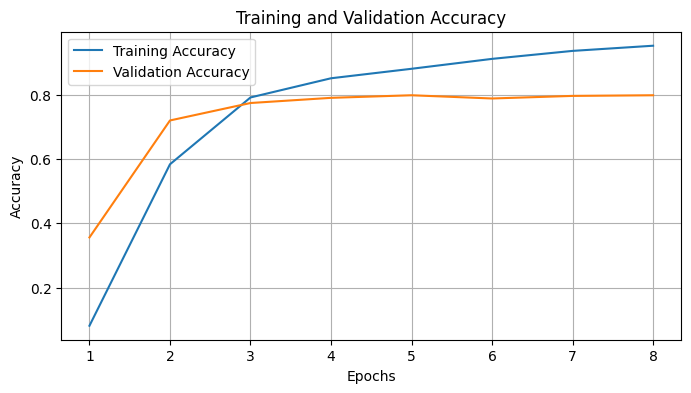

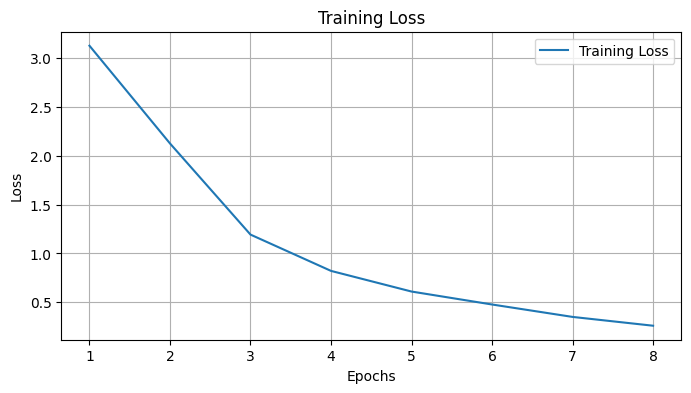

Average Time Per Epoch: 20.01 seconds


In [16]:
# Initialize the TextClassifier with BERT Model
model_name = "bert-base-uncased"
num_labels = 24  
classifier_bert = TextClassifier(model_name=model_name, num_labels=num_labels)

# Initialize the BERT model
classifier_bert.initialize_bert()

optimizer = AdamW(classifier_bert.model.parameters(), lr=2e-5, eps=1e-8)
criterion = nn.CrossEntropyLoss()

epochs = 50
save_path = ".//bert-resume-classification//best_model.bin"

start_time = time.time()

# Train the model
best_val_BERT, test_BERT, train_BERT_at_best_val, final_epoch = classifier_bert.train_and_save_best_model(
    train_loader=train_loader,  
    val_loader=val_loader, 
    test_loader = test_loader,
    optimizer=optimizer,
    criterion=criterion,
    epochs=epochs,
    save_path=save_path,
    patience=3
)

end_time = time.time()
total_time = end_time - start_time
avg_time_per_epoch = total_time / final_epoch

print(f"Average Time Per Epoch: {avg_time_per_epoch:.2f} seconds")


### 4.2. Train DistilBERT Model for Resume Classification

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                     | 0/94 [00:00<?, ?it/s, loss=3.18]

Training:   1%|▋                                                            | 1/94 [00:00<00:11,  8.12it/s, loss=3.18]

Training:   1%|▋                                                            | 1/94 [00:00<00:11,  8.12it/s, loss=3.18]

Training:   2%|█▎                                                           | 2/94 [00:00<00:10,  8.91it/s, loss=3.18]

Training:   2%|█▎                                                           | 2/94 [00:00<00:10,  8.91it/s, loss=3.17]

Training:   2%|█▎                                                           | 2/94 [00:00<00:10,  8.91it/s, loss=3.14]

Training:   4%|██▌                                                          | 4/94 [00:00<00:09,  9.37it/s, loss=3.14]

Training:   4%|██▌                                                          | 4/94 [00:00<00:09,  9.37it/s, loss=3.17]

Training:   5%|███▏                                                         | 5/94 [00:00<00:09,  9.42it/s, loss=3.17]

Training:   5%|███▏                                                         | 5/94 [00:00<00:09,  9.42it/s, loss=3.16]

Training:   6%|███▉                                                         | 6/94 [00:00<00:09,  9.51it/s, loss=3.16]

Training:   6%|███▉                                                         | 6/94 [00:00<00:09,  9.51it/s, loss=3.19]

Training:   6%|███▉                                                         | 6/94 [00:00<00:09,  9.51it/s, loss=3.16]

Training:   9%|█████▏                                                       | 8/94 [00:00<00:08,  9.69it/s, loss=3.16]

Training:   9%|█████▏                                                       | 8/94 [00:00<00:08,  9.69it/s, loss=3.16]

Training:   9%|█████▏                                                       | 8/94 [00:01<00:08,  9.69it/s, loss=3.14]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:08,  9.90it/s, loss=3.14]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:08,  9.90it/s, loss=3.16]

Training:  12%|███████                                                     | 11/94 [00:01<00:08,  9.66it/s, loss=3.16]

Training:  12%|███████                                                     | 11/94 [00:01<00:08,  9.66it/s, loss=3.18]

Training:  12%|███████                                                     | 11/94 [00:01<00:08,  9.66it/s, loss=3.16]

Training:  14%|████████▎                                                   | 13/94 [00:01<00:08,  9.89it/s, loss=3.16]

Training:  14%|████████▎                                                   | 13/94 [00:01<00:08,  9.89it/s, loss=3.16]

Training:  15%|████████▉                                                   | 14/94 [00:01<00:08,  9.82it/s, loss=3.16]

Training:  15%|████████▉                                                   | 14/94 [00:01<00:08,  9.82it/s, loss=3.13]

Training:  16%|█████████▌                                                  | 15/94 [00:01<00:08,  9.81it/s, loss=3.13]

Training:  16%|█████████▌                                                  | 15/94 [00:01<00:08,  9.81it/s, loss=3.18]

Training:  17%|██████████▏                                                 | 16/94 [00:01<00:07,  9.79it/s, loss=3.18]

Training:  17%|██████████▏                                                 | 16/94 [00:01<00:07,  9.79it/s, loss=3.15]

Training:  18%|██████████▊                                                 | 17/94 [00:01<00:07,  9.84it/s, loss=3.15]

Training:  18%|██████████▊                                                 | 17/94 [00:01<00:07,  9.84it/s, loss=3.12]

Training:  18%|██████████▊                                                 | 17/94 [00:01<00:07,  9.84it/s, loss=3.15]

Training:  20%|████████████▏                                               | 19/94 [00:01<00:07,  9.86it/s, loss=3.15]

Training:  20%|████████████▏                                               | 19/94 [00:02<00:07,  9.86it/s, loss=3.11]

Training:  21%|████████████▊                                               | 20/94 [00:02<00:07,  9.86it/s, loss=3.11]

Training:  21%|████████████▊                                               | 20/94 [00:02<00:07,  9.86it/s, loss=3.17]

Training:  21%|████████████▊                                               | 20/94 [00:02<00:07,  9.86it/s, loss=3.13]

Training:  23%|██████████████                                              | 22/94 [00:02<00:07,  9.88it/s, loss=3.13]

Training:  23%|██████████████                                              | 22/94 [00:02<00:07,  9.88it/s, loss=3.15]

Training:  24%|██████████████▋                                             | 23/94 [00:02<00:07,  9.87it/s, loss=3.15]

Training:  24%|██████████████▋                                             | 23/94 [00:02<00:07,  9.87it/s, loss=3.16]

Training:  26%|███████████████▎                                            | 24/94 [00:02<00:07,  9.84it/s, loss=3.16]

Training:  26%|███████████████▎                                            | 24/94 [00:02<00:07,  9.84it/s, loss=3.09]

Training:  27%|███████████████▉                                            | 25/94 [00:02<00:06,  9.87it/s, loss=3.09]

Training:  27%|███████████████▉                                            | 25/94 [00:02<00:06,  9.87it/s, loss=3.09]

Training:  27%|███████████████▉                                            | 25/94 [00:02<00:06,  9.87it/s, loss=3.16]

Training:  29%|█████████████████▏                                          | 27/94 [00:02<00:06,  9.94it/s, loss=3.16]

Training:  29%|█████████████████▏                                          | 27/94 [00:02<00:06,  9.94it/s, loss=3.22]

Training:  29%|█████████████████▏                                          | 27/94 [00:02<00:06,  9.94it/s, loss=3.14]

Training:  31%|██████████████████▌                                         | 29/94 [00:02<00:06, 10.05it/s, loss=3.14]

Training:  31%|██████████████████▌                                         | 29/94 [00:03<00:06, 10.05it/s, loss=3.16]

Training:  31%|██████████████████▌                                         | 29/94 [00:03<00:06, 10.05it/s, loss=3.15]

Training:  33%|███████████████████▊                                        | 31/94 [00:03<00:06, 10.08it/s, loss=3.15]

Training:  33%|███████████████████▊                                        | 31/94 [00:03<00:06, 10.08it/s, loss=3.15]

Training:  33%|███████████████████▊                                        | 31/94 [00:03<00:06, 10.08it/s, loss=3.01]

Training:  35%|█████████████████████                                       | 33/94 [00:03<00:06,  9.84it/s, loss=3.01]

Training:  35%|█████████████████████                                       | 33/94 [00:03<00:06,  9.84it/s, loss=3.17]

Training:  36%|█████████████████████▋                                      | 34/94 [00:03<00:06,  9.80it/s, loss=3.17]

Training:  36%|█████████████████████▋                                      | 34/94 [00:03<00:06,  9.80it/s, loss=3.07]

Training:  37%|██████████████████████▎                                     | 35/94 [00:03<00:06,  9.81it/s, loss=3.07]

Training:  37%|██████████████████████▋                                      | 35/94 [00:03<00:06,  9.81it/s, loss=3.1]

Training:  38%|███████████████████████▎                                     | 36/94 [00:03<00:05,  9.84it/s, loss=3.1]

Training:  38%|██████████████████████▉                                     | 36/94 [00:03<00:05,  9.84it/s, loss=3.06]

Training:  39%|███████████████████████▌                                    | 37/94 [00:03<00:05,  9.82it/s, loss=3.06]

Training:  39%|████████████████████████                                     | 37/94 [00:03<00:05,  9.82it/s, loss=3.1]

Training:  40%|████████████████████████▋                                    | 38/94 [00:03<00:05,  9.84it/s, loss=3.1]

Training:  40%|████████████████████████▎                                   | 38/94 [00:03<00:05,  9.84it/s, loss=3.07]

Training:  41%|████████████████████████▉                                   | 39/94 [00:03<00:05,  9.72it/s, loss=3.07]

Training:  41%|████████████████████████▉                                   | 39/94 [00:04<00:05,  9.72it/s, loss=3.12]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:04<00:05,  9.76it/s, loss=3.12]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:04<00:05,  9.76it/s, loss=3.05]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:04<00:05,  9.71it/s, loss=3.05]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:04<00:05,  9.71it/s, loss=3.04]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:04<00:05,  9.71it/s, loss=3.02]

Training:  46%|███████████████████████████▍                                | 43/94 [00:04<00:05,  9.85it/s, loss=3.02]

Training:  46%|███████████████████████████▍                                | 43/94 [00:04<00:05,  9.85it/s, loss=2.97]

Training:  47%|████████████████████████████                                | 44/94 [00:04<00:05,  9.85it/s, loss=2.97]

Training:  47%|████████████████████████████                                | 44/94 [00:04<00:05,  9.85it/s, loss=3.02]

Training:  48%|████████████████████████████▋                               | 45/94 [00:04<00:05,  9.80it/s, loss=3.02]

Training:  48%|████████████████████████████▋                               | 45/94 [00:04<00:05,  9.80it/s, loss=3.06]

Training:  48%|████████████████████████████▋                               | 45/94 [00:04<00:05,  9.80it/s, loss=3.01]

Training:  50%|██████████████████████████████                              | 47/94 [00:04<00:04,  9.89it/s, loss=3.01]

Training:  50%|██████████████████████████████                              | 47/94 [00:04<00:04,  9.89it/s, loss=3.09]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:04<00:04,  9.90it/s, loss=3.09]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:05<00:04,  9.90it/s, loss=3.02]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:05<00:04,  9.83it/s, loss=3.02]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:05<00:04,  9.83it/s, loss=3.01]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:05<00:04,  9.79it/s, loss=3.01]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:05<00:04,  9.79it/s, loss=2.91]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:05<00:04,  9.76it/s, loss=2.91]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:05<00:04,  9.76it/s, loss=2.88]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:05<00:04,  9.76it/s, loss=2.88]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:05<00:04,  9.76it/s, loss=3.01]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:05<00:04,  9.76it/s, loss=2.82]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:05<00:04,  9.87it/s, loss=2.82]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:05<00:04,  9.87it/s, loss=2.91]

Training:  59%|███████████████████████████████████                         | 55/94 [00:05<00:03,  9.88it/s, loss=2.91]

Training:  59%|███████████████████████████████████                         | 55/94 [00:05<00:03,  9.88it/s, loss=2.75]

Training:  59%|███████████████████████████████████                         | 55/94 [00:05<00:03,  9.88it/s, loss=2.93]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:05<00:03,  9.95it/s, loss=2.93]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:05<00:03,  9.95it/s, loss=2.92]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:05<00:03,  9.86it/s, loss=2.92]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:06<00:03,  9.86it/s, loss=2.88]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:06<00:03,  9.86it/s, loss=2.87]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:06<00:03,  9.92it/s, loss=2.87]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:06<00:03,  9.92it/s, loss=2.82]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:06<00:03,  9.74it/s, loss=2.82]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:06<00:03,  9.74it/s, loss=2.92]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:06<00:03,  9.77it/s, loss=2.92]

Training:  66%|████████████████████████████████████████▏                    | 62/94 [00:06<00:03,  9.77it/s, loss=2.7]

Training:  67%|████████████████████████████████████████▉                    | 63/94 [00:06<00:03,  9.79it/s, loss=2.7]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:06<00:03,  9.79it/s, loss=2.88]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:06<00:03,  9.74it/s, loss=2.88]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:06<00:03,  9.74it/s, loss=2.83]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:06<00:03,  9.62it/s, loss=2.83]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:06<00:03,  9.62it/s, loss=2.76]

Training:  70%|██████████████████████████████████████████▏                 | 66/94 [00:06<00:02,  9.72it/s, loss=2.76]

Training:  70%|██████████████████████████████████████████▏                 | 66/94 [00:06<00:02,  9.72it/s, loss=2.73]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:06<00:02,  9.78it/s, loss=2.73]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:06<00:02,  9.78it/s, loss=2.88]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:07<00:02,  9.78it/s, loss=2.75]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:07<00:02,  9.91it/s, loss=2.75]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:07<00:02,  9.91it/s, loss=2.72]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:07<00:02,  9.91it/s, loss=2.72]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:07<00:02,  9.99it/s, loss=2.72]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:07<00:02,  9.99it/s, loss=2.83]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:07<00:02,  9.88it/s, loss=2.83]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:07<00:02,  9.88it/s, loss=2.78]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:07<00:02,  9.88it/s, loss=2.67]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:07<00:02,  9.93it/s, loss=2.67]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:07<00:02,  9.93it/s, loss=2.76]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:07<00:01,  9.88it/s, loss=2.76]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:07<00:01,  9.88it/s, loss=2.56]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:07<00:01,  9.77it/s, loss=2.56]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:07<00:01,  9.77it/s, loss=2.68]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:07<00:01,  9.79it/s, loss=2.68]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:07<00:01,  9.79it/s, loss=2.24]

Training:  82%|█████████████████████████████████████████████████▉           | 77/94 [00:08<00:01,  9.79it/s, loss=2.8]

Training:  84%|███████████████████████████████████████████████████▎         | 79/94 [00:08<00:01,  9.98it/s, loss=2.8]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:08<00:01,  9.98it/s, loss=2.58]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:08<00:01,  9.95it/s, loss=2.58]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:08<00:01,  9.95it/s, loss=2.65]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:08<00:01,  9.64it/s, loss=2.65]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:08<00:01,  9.64it/s, loss=2.59]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:08<00:01,  9.69it/s, loss=2.59]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:08<00:01,  9.69it/s, loss=2.38]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:08<00:01,  9.66it/s, loss=2.38]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:08<00:01,  9.66it/s, loss=2.39]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:08<00:01,  9.69it/s, loss=2.39]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:08<00:01,  9.69it/s, loss=2.29]

Training:  90%|██████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.74it/s, loss=2.29]

Training:  90%|██████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.74it/s, loss=2.66]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.73it/s, loss=2.66]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.73it/s, loss=2.58]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.73it/s, loss=2.28]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:08<00:00,  9.62it/s, loss=2.28]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.62it/s, loss=2.65]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.60it/s, loss=2.65]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.60it/s, loss=2.49]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.70it/s, loss=2.49]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.70it/s, loss=2.32]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.73it/s, loss=2.32]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.73it/s, loss=2.38]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.69it/s, loss=2.38]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.69it/s, loss=2.44]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.69it/s, loss=1.57]

Training: 100%|████████████████████████████████████████████████████████████| 94/94 [00:09<00:00, 11.57it/s, loss=1.57]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:01, 18.23it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 18.71it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 18.25it/s]

Validation:  28%|███████████████████▋                                                  | 9/32 [00:00<00:01, 19.03it/s]

Validation:  34%|███████████████████████▋                                             | 11/32 [00:00<00:01, 18.87it/s]

Validation:  41%|████████████████████████████                                         | 13/32 [00:00<00:01, 18.82it/s]

Validation:  47%|████████████████████████████████▎                                    | 15/32 [00:00<00:00, 18.73it/s]

Validation:  53%|████████████████████████████████████▋                                | 17/32 [00:00<00:00, 18.77it/s]

Validation:  59%|████████████████████████████████████████▉                            | 19/32 [00:01<00:00, 18.63it/s]

Validation:  66%|█████████████████████████████████████████████▎                       | 21/32 [00:01<00:00, 18.27it/s]

Validation:  72%|█████████████████████████████████████████████████▌                   | 23/32 [00:01<00:00, 18.26it/s]

Validation:  78%|█████████████████████████████████████████████████████▉               | 25/32 [00:01<00:00, 18.26it/s]

Validation:  84%|██████████████████████████████████████████████████████████▏          | 27/32 [00:01<00:00, 17.96it/s]

Validation:  91%|██████████████████████████████████████████████████████████████▌      | 29/32 [00:01<00:00, 18.21it/s]

Validation:  97%|██████████████████████████████████████████████████████████████████▊  | 31/32 [00:01<00:00, 18.06it/s]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 14.71it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 16.36it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 16.37it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 16.45it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 16.60it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 16.42it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 16.67it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:00<00:00, 16.65it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 16.24it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 16.35it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 16.01it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 16.43it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 16.59it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 16.68it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:01<00:00, 16.77it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                     | 0/94 [00:00<?, ?it/s, loss=2.27]

Training:   1%|▋                                                            | 1/94 [00:00<00:10,  8.89it/s, loss=2.27]

Training:   1%|▋                                                            | 1/94 [00:00<00:10,  8.89it/s, loss=2.19]

Training:   2%|█▎                                                           | 2/94 [00:00<00:10,  8.80it/s, loss=2.19]

Training:   2%|█▎                                                           | 2/94 [00:00<00:10,  8.80it/s, loss=2.39]

Training:   3%|█▉                                                           | 3/94 [00:00<00:09,  9.20it/s, loss=2.39]

Training:   3%|█▉                                                           | 3/94 [00:00<00:09,  9.20it/s, loss=2.34]

Training:   3%|█▉                                                           | 3/94 [00:00<00:09,  9.20it/s, loss=2.24]

Training:   5%|███▏                                                         | 5/94 [00:00<00:09,  9.71it/s, loss=2.24]

Training:   5%|███▏                                                         | 5/94 [00:00<00:09,  9.71it/s, loss=2.13]

Training:   6%|███▉                                                         | 6/94 [00:00<00:08,  9.78it/s, loss=2.13]

Training:   6%|███▉                                                         | 6/94 [00:00<00:08,  9.78it/s, loss=2.14]

Training:   7%|████▌                                                        | 7/94 [00:00<00:08,  9.81it/s, loss=2.14]

Training:   7%|████▌                                                        | 7/94 [00:00<00:08,  9.81it/s, loss=2.34]

Training:   9%|█████▏                                                       | 8/94 [00:00<00:08,  9.75it/s, loss=2.34]

Training:   9%|█████▏                                                       | 8/94 [00:00<00:08,  9.75it/s, loss=2.41]

Training:   9%|█████▏                                                       | 8/94 [00:01<00:08,  9.75it/s, loss=2.28]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:08,  9.91it/s, loss=2.28]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:08,  9.91it/s, loss=2.26]

Training:  12%|███████                                                     | 11/94 [00:01<00:08,  9.91it/s, loss=2.26]

Training:  12%|███████                                                     | 11/94 [00:01<00:08,  9.91it/s, loss=2.12]

Training:  13%|███████▋                                                    | 12/94 [00:01<00:08,  9.90it/s, loss=2.12]

Training:  13%|███████▋                                                    | 12/94 [00:01<00:08,  9.90it/s, loss=1.88]

Training:  14%|████████▎                                                   | 13/94 [00:01<00:08,  9.77it/s, loss=1.88]

Training:  14%|████████▎                                                   | 13/94 [00:01<00:08,  9.77it/s, loss=1.91]

Training:  14%|████████▎                                                   | 13/94 [00:01<00:08,  9.77it/s, loss=2.09]

Training:  16%|█████████▌                                                  | 15/94 [00:01<00:08,  9.54it/s, loss=2.09]

Training:  16%|█████████▌                                                  | 15/94 [00:01<00:08,  9.54it/s, loss=1.94]

Training:  16%|█████████▌                                                  | 15/94 [00:01<00:08,  9.54it/s, loss=1.87]

Training:  18%|██████████▊                                                 | 17/94 [00:01<00:08,  9.57it/s, loss=1.87]

Training:  18%|███████████                                                  | 17/94 [00:01<00:08,  9.57it/s, loss=2.2]

Training:  19%|███████████▋                                                 | 18/94 [00:01<00:07,  9.58it/s, loss=2.2]

Training:  19%|███████████▍                                                | 18/94 [00:01<00:07,  9.58it/s, loss=1.95]

Training:  19%|███████████▍                                                | 18/94 [00:02<00:07,  9.58it/s, loss=2.09]

Training:  21%|████████████▊                                               | 20/94 [00:02<00:07,  9.87it/s, loss=2.09]

Training:  21%|████████████▊                                               | 20/94 [00:02<00:07,  9.87it/s, loss=2.06]

Training:  22%|█████████████▍                                              | 21/94 [00:02<00:07,  9.75it/s, loss=2.06]

Training:  22%|█████████████▍                                              | 21/94 [00:02<00:07,  9.75it/s, loss=2.12]

Training:  22%|█████████████▍                                              | 21/94 [00:02<00:07,  9.75it/s, loss=1.95]

Training:  24%|██████████████▋                                             | 23/94 [00:02<00:07,  9.70it/s, loss=1.95]

Training:  24%|██████████████▋                                             | 23/94 [00:02<00:07,  9.70it/s, loss=2.23]

Training:  26%|███████████████▎                                            | 24/94 [00:02<00:07,  9.71it/s, loss=2.23]

Training:  26%|███████████████▎                                            | 24/94 [00:02<00:07,  9.71it/s, loss=1.82]

Training:  26%|███████████████▎                                            | 24/94 [00:02<00:07,  9.71it/s, loss=1.87]

Training:  28%|████████████████▌                                           | 26/94 [00:02<00:06,  9.81it/s, loss=1.87]

Training:  28%|████████████████▌                                           | 26/94 [00:02<00:06,  9.81it/s, loss=2.02]

Training:  29%|█████████████████▏                                          | 27/94 [00:02<00:06,  9.71it/s, loss=2.02]

Training:  29%|█████████████████▏                                          | 27/94 [00:02<00:06,  9.71it/s, loss=2.49]

Training:  30%|█████████████████▊                                          | 28/94 [00:02<00:06,  9.61it/s, loss=2.49]

Training:  30%|█████████████████▊                                          | 28/94 [00:02<00:06,  9.61it/s, loss=2.39]

Training:  31%|██████████████████▌                                         | 29/94 [00:02<00:06,  9.66it/s, loss=2.39]

Training:  31%|██████████████████▌                                         | 29/94 [00:03<00:06,  9.66it/s, loss=1.98]

Training:  32%|███████████████████▏                                        | 30/94 [00:03<00:06,  9.72it/s, loss=1.98]

Training:  32%|███████████████████▏                                        | 30/94 [00:03<00:06,  9.72it/s, loss=2.03]

Training:  33%|███████████████████▊                                        | 31/94 [00:03<00:06,  9.69it/s, loss=2.03]

Training:  33%|███████████████████▊                                        | 31/94 [00:03<00:06,  9.69it/s, loss=2.07]

Training:  34%|████████████████████▍                                       | 32/94 [00:03<00:06,  9.70it/s, loss=2.07]

Training:  34%|████████████████████▍                                       | 32/94 [00:03<00:06,  9.70it/s, loss=1.96]

Training:  35%|█████████████████████                                       | 33/94 [00:03<00:06,  9.55it/s, loss=1.96]

Training:  35%|█████████████████████                                       | 33/94 [00:03<00:06,  9.55it/s, loss=1.63]

Training:  36%|█████████████████████▋                                      | 34/94 [00:03<00:06,  9.63it/s, loss=1.63]

Training:  36%|█████████████████████▋                                      | 34/94 [00:03<00:06,  9.63it/s, loss=1.61]

Training:  37%|██████████████████████▎                                     | 35/94 [00:03<00:06,  9.68it/s, loss=1.61]

Training:  37%|██████████████████████▋                                      | 35/94 [00:03<00:06,  9.68it/s, loss=1.6]

Training:  38%|███████████████████████▎                                     | 36/94 [00:03<00:06,  9.56it/s, loss=1.6]

Training:  38%|██████████████████████▉                                     | 36/94 [00:03<00:06,  9.56it/s, loss=2.11]

Training:  39%|███████████████████████▌                                    | 37/94 [00:03<00:05,  9.68it/s, loss=2.11]

Training:  39%|███████████████████████▌                                    | 37/94 [00:03<00:05,  9.68it/s, loss=1.79]

Training:  40%|████████████████████████▎                                   | 38/94 [00:03<00:05,  9.71it/s, loss=1.79]

Training:  40%|████████████████████████▎                                   | 38/94 [00:04<00:05,  9.71it/s, loss=1.41]

Training:  41%|████████████████████████▉                                   | 39/94 [00:04<00:05,  9.57it/s, loss=1.41]

Training:  41%|████████████████████████▉                                   | 39/94 [00:04<00:05,  9.57it/s, loss=1.75]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:04<00:05,  9.59it/s, loss=1.75]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:04<00:05,  9.59it/s, loss=1.67]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:04<00:05,  9.59it/s, loss=1.63]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:04<00:05,  9.71it/s, loss=1.63]

Training:  45%|███████████████████████████▎                                 | 42/94 [00:04<00:05,  9.71it/s, loss=1.6]

Training:  46%|███████████████████████████▉                                 | 43/94 [00:04<00:05,  9.70it/s, loss=1.6]

Training:  46%|███████████████████████████▉                                 | 43/94 [00:04<00:05,  9.70it/s, loss=1.7]

Training:  47%|████████████████████████████▌                                | 44/94 [00:04<00:05,  9.65it/s, loss=1.7]

Training:  47%|████████████████████████████                                | 44/94 [00:04<00:05,  9.65it/s, loss=1.67]

Training:  47%|████████████████████████████                                | 44/94 [00:04<00:05,  9.65it/s, loss=1.55]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:04<00:04,  9.82it/s, loss=1.55]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:04<00:04,  9.82it/s, loss=2.02]

Training:  50%|██████████████████████████████                              | 47/94 [00:04<00:04,  9.72it/s, loss=2.02]

Training:  50%|██████████████████████████████▌                              | 47/94 [00:04<00:04,  9.72it/s, loss=1.7]

Training:  51%|███████████████████████████████▏                             | 48/94 [00:04<00:04,  9.76it/s, loss=1.7]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:05<00:04,  9.76it/s, loss=2.14]

Training:  51%|███████████████████████████████▏                             | 48/94 [00:05<00:04,  9.76it/s, loss=1.9]

Training:  53%|████████████████████████████████▍                            | 50/94 [00:05<00:04,  9.90it/s, loss=1.9]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:05<00:04,  9.90it/s, loss=2.02]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:05<00:04,  9.88it/s, loss=2.02]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:05<00:04,  9.88it/s, loss=1.43]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:05<00:04,  9.83it/s, loss=1.43]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:05<00:04,  9.83it/s, loss=1.43]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:05<00:04,  9.77it/s, loss=1.43]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:05<00:04,  9.77it/s, loss=1.56]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:05<00:04,  9.78it/s, loss=1.56]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:05<00:04,  9.78it/s, loss=1.93]

Training:  59%|███████████████████████████████████                         | 55/94 [00:05<00:04,  9.73it/s, loss=1.93]

Training:  59%|███████████████████████████████████                         | 55/94 [00:05<00:04,  9.73it/s, loss=2.38]

Training:  59%|███████████████████████████████████                         | 55/94 [00:05<00:04,  9.73it/s, loss=1.66]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:05<00:03,  9.96it/s, loss=1.66]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:05<00:03,  9.96it/s, loss=1.82]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:05<00:03,  9.89it/s, loss=1.82]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:06<00:03,  9.89it/s, loss=1.43]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:06<00:03,  9.90it/s, loss=1.43]

Training:  63%|██████████████████████████████████████▎                      | 59/94 [00:06<00:03,  9.90it/s, loss=1.7]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:06<00:03,  9.90it/s, loss=1.69]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:06<00:03,  9.93it/s, loss=1.69]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:06<00:03,  9.93it/s, loss=1.58]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:06<00:03,  9.90it/s, loss=1.58]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:06<00:03,  9.90it/s, loss=1.42]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:06<00:03,  9.91it/s, loss=1.42]

Training:  67%|████████████████████████████████████████▉                    | 63/94 [00:06<00:03,  9.91it/s, loss=1.6]

Training:  68%|█████████████████████████████████████████▌                   | 64/94 [00:06<00:03,  9.79it/s, loss=1.6]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:06<00:03,  9.79it/s, loss=1.72]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:06<00:03,  9.79it/s, loss=1.51]

Training:  70%|██████████████████████████████████████████▏                 | 66/94 [00:06<00:02,  9.82it/s, loss=1.51]

Training:  70%|██████████████████████████████████████████▏                 | 66/94 [00:06<00:02,  9.82it/s, loss=1.96]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:06<00:02,  9.85it/s, loss=1.96]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:06<00:02,  9.85it/s, loss=1.44]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:07<00:02,  9.85it/s, loss=1.79]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:07<00:02,  9.84it/s, loss=1.79]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:07<00:02,  9.84it/s, loss=1.39]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:07<00:02,  9.84it/s, loss=1.19]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:07<00:02,  9.95it/s, loss=1.19]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:07<00:02,  9.95it/s, loss=1.44]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:07<00:02,  9.90it/s, loss=1.44]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:07<00:02,  9.90it/s, loss=1.61]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:07<00:02,  9.85it/s, loss=1.61]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:07<00:02,  9.85it/s, loss=1.33]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:07<00:02,  9.85it/s, loss=1.75]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:07<00:01,  9.90it/s, loss=1.75]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:07<00:01,  9.90it/s, loss=1.57]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:07<00:01,  9.88it/s, loss=1.57]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:07<00:01,  9.88it/s, loss=1.64]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:07<00:01,  9.88it/s, loss=1.48]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:07<00:01,  9.87it/s, loss=1.48]

Training:  83%|██████████████████████████████████████████████████▌          | 78/94 [00:08<00:01,  9.87it/s, loss=1.2]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:08<00:01,  9.87it/s, loss=1.69]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:08<00:01,  9.89it/s, loss=1.69]

Training:  85%|███████████████████████████████████████████████████         | 80/94 [00:08<00:01,  9.89it/s, loss=1.49]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:08<00:01,  9.83it/s, loss=1.49]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:08<00:01,  9.83it/s, loss=1.05]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:08<00:01,  9.83it/s, loss=1.01]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:08<00:01,  9.90it/s, loss=1.01]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:08<00:01,  9.90it/s, loss=1.57]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:08<00:01,  9.86it/s, loss=1.57]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:08<00:01,  9.86it/s, loss=1.25]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:08<00:01,  9.86it/s, loss=1.28]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.85it/s, loss=1.28]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.85it/s, loss=1.77]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:08<00:00,  9.75it/s, loss=1.77]

Training:  93%|████████████████████████████████████████████████████████▍    | 87/94 [00:09<00:00,  9.75it/s, loss=1.7]

Training:  94%|█████████████████████████████████████████████████████████    | 88/94 [00:09<00:00,  9.74it/s, loss=1.7]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.74it/s, loss=1.47]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.67it/s, loss=1.47]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.67it/s, loss=1.36]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.71it/s, loss=1.36]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.71it/s, loss=0.98]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.65it/s, loss=0.98]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.65it/s, loss=1.19]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.73it/s, loss=1.19]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.73it/s, loss=1.95]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.73it/s, loss=0.641]

Training: 100%|███████████████████████████████████████████████████████████| 94/94 [00:09<00:00, 11.70it/s, loss=0.641]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:01, 18.19it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 18.59it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 18.22it/s]

Validation:  28%|███████████████████▋                                                  | 9/32 [00:00<00:01, 18.95it/s]

Validation:  34%|███████████████████████▋                                             | 11/32 [00:00<00:01, 18.78it/s]

Validation:  41%|████████████████████████████                                         | 13/32 [00:00<00:01, 18.75it/s]

Validation:  47%|████████████████████████████████▎                                    | 15/32 [00:00<00:00, 18.65it/s]

Validation:  53%|████████████████████████████████████▋                                | 17/32 [00:00<00:00, 18.68it/s]

Validation:  59%|████████████████████████████████████████▉                            | 19/32 [00:01<00:00, 18.54it/s]

Validation:  66%|█████████████████████████████████████████████▎                       | 21/32 [00:01<00:00, 18.10it/s]

Validation:  72%|█████████████████████████████████████████████████▌                   | 23/32 [00:01<00:00, 18.10it/s]

Validation:  78%|█████████████████████████████████████████████████████▉               | 25/32 [00:01<00:00, 18.15it/s]

Validation:  84%|██████████████████████████████████████████████████████████▏          | 27/32 [00:01<00:00, 17.89it/s]

Validation:  91%|██████████████████████████████████████████████████████████████▌      | 29/32 [00:01<00:00, 18.09it/s]

Validation:  97%|██████████████████████████████████████████████████████████████████▊  | 31/32 [00:01<00:00, 17.95it/s]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 14.75it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 16.31it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 16.32it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 16.32it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 16.55it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 16.60it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 16.85it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:00<00:00, 16.90it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 16.53it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 16.62it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 16.21it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 16.67it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 16.81it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 16.90it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:01<00:00, 17.00it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                      | 0/94 [00:00<?, ?it/s, loss=1.3]

Training:   1%|▋                                                             | 1/94 [00:00<00:10,  8.95it/s, loss=1.3]

Training:   1%|▋                                                            | 1/94 [00:00<00:10,  8.95it/s, loss=1.45]

Training:   2%|█▎                                                           | 2/94 [00:00<00:09,  9.25it/s, loss=1.45]

Training:   2%|█▎                                                            | 2/94 [00:00<00:09,  9.25it/s, loss=1.3]

Training:   3%|█▉                                                            | 3/94 [00:00<00:09,  9.33it/s, loss=1.3]

Training:   3%|█▉                                                           | 3/94 [00:00<00:09,  9.33it/s, loss=1.09]

Training:   4%|██▌                                                          | 4/94 [00:00<00:09,  9.41it/s, loss=1.09]

Training:   4%|██▌                                                          | 4/94 [00:00<00:09,  9.41it/s, loss=1.16]

Training:   4%|██▌                                                          | 4/94 [00:00<00:09,  9.41it/s, loss=1.37]

Training:   6%|███▉                                                         | 6/94 [00:00<00:09,  9.77it/s, loss=1.37]

Training:   6%|███▉                                                         | 6/94 [00:00<00:09,  9.77it/s, loss=1.41]

Training:   7%|████▌                                                        | 7/94 [00:00<00:08,  9.69it/s, loss=1.41]

Training:   7%|████▌                                                        | 7/94 [00:00<00:08,  9.69it/s, loss=1.31]

Training:   7%|████▌                                                         | 7/94 [00:00<00:08,  9.69it/s, loss=1.3]

Training:  10%|█████▉                                                        | 9/94 [00:00<00:08,  9.89it/s, loss=1.3]

Training:  10%|█████▊                                                       | 9/94 [00:01<00:08,  9.89it/s, loss=1.09]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:08,  9.91it/s, loss=1.09]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:08,  9.91it/s, loss=0.958]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:08,  9.89it/s, loss=0.958]

Training:  12%|███████                                                     | 11/94 [00:01<00:08,  9.89it/s, loss=1.23]

Training:  13%|███████▋                                                    | 12/94 [00:01<00:08,  9.82it/s, loss=1.23]

Training:  13%|███████▋                                                    | 12/94 [00:01<00:08,  9.82it/s, loss=1.59]

Training:  14%|████████▎                                                   | 13/94 [00:01<00:08,  9.76it/s, loss=1.59]

Training:  14%|████████▋                                                      | 13/94 [00:01<00:08,  9.76it/s, loss=1]

Training:  15%|█████████▍                                                     | 14/94 [00:01<00:08,  9.72it/s, loss=1]

Training:  15%|█████████                                                    | 14/94 [00:01<00:08,  9.72it/s, loss=1.6]

Training:  16%|█████████▋                                                   | 15/94 [00:01<00:08,  9.69it/s, loss=1.6]

Training:  16%|█████████▌                                                  | 15/94 [00:01<00:08,  9.69it/s, loss=1.17]

Training:  16%|█████████▌                                                  | 15/94 [00:01<00:08,  9.69it/s, loss=1.21]

Training:  18%|██████████▊                                                 | 17/94 [00:01<00:07,  9.65it/s, loss=1.21]

Training:  18%|██████████▋                                                | 17/94 [00:01<00:07,  9.65it/s, loss=0.806]

Training:  18%|██████████▊                                                 | 17/94 [00:01<00:07,  9.65it/s, loss=1.63]

Training:  20%|████████████▏                                               | 19/94 [00:01<00:07,  9.96it/s, loss=1.63]

Training:  20%|███████████▉                                               | 19/94 [00:02<00:07,  9.96it/s, loss=0.959]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.93it/s, loss=0.959]

Training:  21%|████████████▊                                               | 20/94 [00:02<00:07,  9.93it/s, loss=1.07]

Training:  22%|█████████████▍                                              | 21/94 [00:02<00:07,  9.88it/s, loss=1.07]

Training:  22%|█████████████▏                                             | 21/94 [00:02<00:07,  9.88it/s, loss=0.919]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.79it/s, loss=0.919]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.79it/s, loss=0.841]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.71it/s, loss=0.841]

Training:  24%|██████████████▋                                             | 23/94 [00:02<00:07,  9.71it/s, loss=1.54]

Training:  26%|███████████████▎                                            | 24/94 [00:02<00:07,  9.66it/s, loss=1.54]

Training:  26%|███████████████▎                                            | 24/94 [00:02<00:07,  9.66it/s, loss=1.42]

Training:  27%|███████████████▉                                            | 25/94 [00:02<00:07,  9.66it/s, loss=1.42]

Training:  27%|███████████████▉                                            | 25/94 [00:02<00:07,  9.66it/s, loss=1.57]

Training:  27%|███████████████▉                                            | 25/94 [00:02<00:07,  9.66it/s, loss=1.32]

Training:  29%|█████████████████▏                                          | 27/94 [00:02<00:06,  9.78it/s, loss=1.32]

Training:  29%|█████████████████▏                                          | 27/94 [00:02<00:06,  9.78it/s, loss=1.13]

Training:  29%|█████████████████▏                                          | 27/94 [00:02<00:06,  9.78it/s, loss=1.31]

Training:  31%|██████████████████▌                                         | 29/94 [00:02<00:06,  9.96it/s, loss=1.31]

Training:  31%|██████████████████▌                                         | 29/94 [00:03<00:06,  9.96it/s, loss=1.19]

Training:  32%|███████████████████▏                                        | 30/94 [00:03<00:06,  9.93it/s, loss=1.19]

Training:  32%|██████████████████▊                                        | 30/94 [00:03<00:06,  9.93it/s, loss=0.966]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.89it/s, loss=0.966]

Training:  33%|███████████████████▊                                        | 31/94 [00:03<00:06,  9.89it/s, loss=1.16]

Training:  34%|████████████████████▍                                       | 32/94 [00:03<00:06,  9.84it/s, loss=1.16]

Training:  34%|████████████████████                                       | 32/94 [00:03<00:06,  9.84it/s, loss=0.921]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.78it/s, loss=0.921]

Training:  35%|█████████████████████                                       | 33/94 [00:03<00:06,  9.78it/s, loss=1.56]

Training:  36%|█████████████████████▋                                      | 34/94 [00:03<00:06,  9.74it/s, loss=1.56]

Training:  36%|█████████████████████▋                                      | 34/94 [00:03<00:06,  9.74it/s, loss=1.57]

Training:  37%|██████████████████████▎                                     | 35/94 [00:03<00:06,  9.69it/s, loss=1.57]

Training:  37%|██████████████████████▎                                     | 35/94 [00:03<00:06,  9.69it/s, loss=1.06]

Training:  38%|██████████████████████▉                                     | 36/94 [00:03<00:06,  9.62it/s, loss=1.06]

Training:  38%|██████████████████████▉                                     | 36/94 [00:03<00:06,  9.62it/s, loss=1.16]

Training:  38%|██████████████████████▉                                     | 36/94 [00:03<00:06,  9.62it/s, loss=1.03]

Training:  40%|████████████████████████▎                                   | 38/94 [00:03<00:05,  9.62it/s, loss=1.03]

Training:  40%|████████████████████████▎                                   | 38/94 [00:04<00:05,  9.62it/s, loss=1.17]

Training:  41%|████████████████████████▉                                   | 39/94 [00:04<00:05,  9.56it/s, loss=1.17]

Training:  41%|████████████████████████▉                                   | 39/94 [00:04<00:05,  9.56it/s, loss=1.31]

Training:  41%|█████████████████████████▎                                   | 39/94 [00:04<00:05,  9.56it/s, loss=1.3]

Training:  44%|██████████████████████████▌                                  | 41/94 [00:04<00:05,  9.75it/s, loss=1.3]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:04<00:05,  9.75it/s, loss=1.21]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:04<00:05,  9.73it/s, loss=1.21]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:04<00:05,  9.73it/s, loss=1.27]

Training:  45%|██████████████████████████▎                                | 42/94 [00:04<00:05,  9.73it/s, loss=0.958]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.93it/s, loss=0.958]

Training:  47%|████████████████████████████                                | 44/94 [00:04<00:05,  9.93it/s, loss=1.41]

Training:  48%|████████████████████████████▋                               | 45/94 [00:04<00:04,  9.91it/s, loss=1.41]

Training:  48%|████████████████████████████▏                              | 45/94 [00:04<00:04,  9.91it/s, loss=0.661]

Training:  49%|████████████████████████████▊                              | 46/94 [00:04<00:04,  9.87it/s, loss=0.661]

Training:  49%|████████████████████████████▊                              | 46/94 [00:04<00:04,  9.87it/s, loss=0.807]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:04<00:04,  9.75it/s, loss=0.807]

Training:  50%|██████████████████████████████                              | 47/94 [00:04<00:04,  9.75it/s, loss=1.13]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:04<00:04,  9.78it/s, loss=1.13]

Training:  51%|██████████████████████████████▋                             | 48/94 [00:05<00:04,  9.78it/s, loss=1.09]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:05<00:04,  9.81it/s, loss=1.09]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.81it/s, loss=0.992]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:05<00:04,  9.51it/s, loss=0.992]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:05<00:04,  9.51it/s, loss=0.624]

Training:  54%|████████████████████████████████                           | 51/94 [00:05<00:04,  9.57it/s, loss=0.624]

Training:  54%|████████████████████████████████                           | 51/94 [00:05<00:04,  9.57it/s, loss=0.979]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:05<00:04,  9.57it/s, loss=1.43]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:05<00:04,  9.79it/s, loss=1.43]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:05<00:04,  9.79it/s, loss=0.872]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:05<00:04,  9.79it/s, loss=1.14]

Training:  59%|███████████████████████████████████                         | 55/94 [00:05<00:03,  9.94it/s, loss=1.14]

Training:  59%|███████████████████████████████████                         | 55/94 [00:05<00:03,  9.94it/s, loss=1.03]

Training:  60%|███████████████████████████████████▋                        | 56/94 [00:05<00:03,  9.90it/s, loss=1.03]

Training:  60%|███████████████████████████████████▋                        | 56/94 [00:05<00:03,  9.90it/s, loss=1.05]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:05<00:03,  9.91it/s, loss=1.05]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:05<00:03,  9.91it/s, loss=0.899]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:06<00:03,  9.91it/s, loss=1.25]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:06<00:03,  9.82it/s, loss=1.25]

Training:  63%|█████████████████████████████████████▋                      | 59/94 [00:06<00:03,  9.82it/s, loss=1.35]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:06<00:03,  9.81it/s, loss=1.35]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.81it/s, loss=0.599]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:06<00:03,  9.65it/s, loss=0.599]

Training:  65%|██████████████████████████████████████▉                     | 61/94 [00:06<00:03,  9.65it/s, loss=1.22]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:06<00:03,  9.70it/s, loss=1.22]

Training:  66%|███████████████████████████████████████▌                    | 62/94 [00:06<00:03,  9.70it/s, loss=1.52]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:06<00:03,  9.76it/s, loss=1.52]

Training:  67%|████████████████████████████████████████▏                   | 63/94 [00:06<00:03,  9.76it/s, loss=1.44]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:06<00:03,  9.43it/s, loss=1.44]

Training:  68%|█████████████████████████████████████████▌                   | 64/94 [00:06<00:03,  9.43it/s, loss=1.4]

Training:  69%|██████████████████████████████████████████▏                  | 65/94 [00:06<00:03,  9.47it/s, loss=1.4]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:06<00:03,  9.47it/s, loss=0.923]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:06<00:03,  9.47it/s, loss=1.08]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:06<00:02,  9.73it/s, loss=1.08]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:06<00:02,  9.73it/s, loss=0.87]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:07<00:02,  9.73it/s, loss=1.11]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:07<00:02,  9.72it/s, loss=1.11]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:07<00:02,  9.72it/s, loss=1.47]

Training:  73%|████████████████████████████████████████████                | 69/94 [00:07<00:02,  9.72it/s, loss=1.33]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:07<00:02,  9.93it/s, loss=1.33]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:07<00:02,  9.93it/s, loss=1.56]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:07<00:02,  9.93it/s, loss=1.56]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.93it/s, loss=0.878]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:07<00:02,  9.85it/s, loss=0.878]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:07<00:02,  9.85it/s, loss=0.884]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:07<00:02,  9.85it/s, loss=0.52]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:07<00:01,  9.99it/s, loss=0.52]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:07<00:01,  9.99it/s, loss=1.44]

Training:  80%|███████████████████████████████████████████████▊            | 75/94 [00:07<00:01,  9.99it/s, loss=1.08]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:07<00:01, 10.02it/s, loss=1.08]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:07<00:01, 10.02it/s, loss=1.57]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:07<00:01,  9.91it/s, loss=1.57]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:08<00:01,  9.91it/s, loss=0.928]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.82it/s, loss=0.928]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.82it/s, loss=0.682]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:08<00:01,  9.82it/s, loss=0.67]

Training:  86%|███████████████████████████████████████████████████▋        | 81/94 [00:08<00:01,  9.88it/s, loss=0.67]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:08<00:01,  9.88it/s, loss=0.742]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.83it/s, loss=0.742]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:08<00:01,  9.83it/s, loss=1.03]

Training:  88%|████████████████████████████████████████████████████▉       | 83/94 [00:08<00:01,  9.81it/s, loss=1.03]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:08<00:01,  9.81it/s, loss=0.994]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.85it/s, loss=0.994]

Training:  89%|█████████████████████████████████████████████████████▌      | 84/94 [00:08<00:01,  9.85it/s, loss=1.03]

Training:  90%|██████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.71it/s, loss=1.03]

Training:  90%|██████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.71it/s, loss=1.12]

Training:  91%|██████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.62it/s, loss=1.12]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.62it/s, loss=0.606]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:08<00:00,  9.71it/s, loss=0.606]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:08<00:00,  9.71it/s, loss=1.04]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:09<00:00,  9.71it/s, loss=0.808]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.68it/s, loss=0.808]

Training:  95%|████████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.68it/s, loss=1.22]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.58it/s, loss=1.22]

Training:  96%|█████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.58it/s, loss=1.68]

Training:  97%|██████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.62it/s, loss=1.68]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.62it/s, loss=0.833]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.57it/s, loss=0.833]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.57it/s, loss=0.728]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.57it/s, loss=0.728]

Training:  99%|███████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.57it/s, loss=1.83]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:01, 18.13it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 18.62it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 18.18it/s]

Validation:  28%|███████████████████▋                                                  | 9/32 [00:00<00:01, 18.93it/s]

Validation:  34%|███████████████████████▋                                             | 11/32 [00:00<00:01, 18.74it/s]

Validation:  41%|████████████████████████████                                         | 13/32 [00:00<00:01, 18.71it/s]

Validation:  47%|████████████████████████████████▎                                    | 15/32 [00:00<00:00, 18.62it/s]

Validation:  53%|████████████████████████████████████▋                                | 17/32 [00:00<00:00, 18.64it/s]

Validation:  59%|████████████████████████████████████████▉                            | 19/32 [00:01<00:00, 18.53it/s]

Validation:  66%|█████████████████████████████████████████████▎                       | 21/32 [00:01<00:00, 18.16it/s]

Validation:  72%|█████████████████████████████████████████████████▌                   | 23/32 [00:01<00:00, 18.10it/s]

Validation:  78%|█████████████████████████████████████████████████████▉               | 25/32 [00:01<00:00, 18.10it/s]

Validation:  84%|██████████████████████████████████████████████████████████▏          | 27/32 [00:01<00:00, 17.88it/s]

Validation:  91%|██████████████████████████████████████████████████████████████▌      | 29/32 [00:01<00:00, 18.13it/s]

Validation:  97%|██████████████████████████████████████████████████████████████████▊  | 31/32 [00:01<00:00, 17.98it/s]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 14.75it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 16.26it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 16.32it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 16.45it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 16.58it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 16.59it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 16.81it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:00<00:00, 16.81it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 16.35it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 16.44it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 16.10it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 16.53it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 16.67it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 16.78it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:01<00:00, 16.89it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.655]

Training:   1%|▋                                                           | 1/94 [00:00<00:10,  8.71it/s, loss=0.655]

Training:   1%|▋                                                            | 1/94 [00:00<00:10,  8.71it/s, loss=1.34]

Training:   2%|█▎                                                           | 2/94 [00:00<00:10,  8.83it/s, loss=1.34]

Training:   2%|█▎                                                           | 2/94 [00:00<00:10,  8.83it/s, loss=1.46]

Training:   3%|█▉                                                           | 3/94 [00:00<00:09,  9.16it/s, loss=1.46]

Training:   3%|█▉                                                          | 3/94 [00:00<00:09,  9.16it/s, loss=0.677]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.41it/s, loss=0.677]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.41it/s, loss=0.689]

Training:   5%|███▏                                                        | 5/94 [00:00<00:09,  9.49it/s, loss=0.689]

Training:   5%|███▏                                                         | 5/94 [00:00<00:09,  9.49it/s, loss=1.01]

Training:   6%|███▉                                                         | 6/94 [00:00<00:09,  9.46it/s, loss=1.01]

Training:   6%|███▉                                                         | 6/94 [00:00<00:09,  9.46it/s, loss=0.89]

Training:   6%|███▉                                                         | 6/94 [00:00<00:09,  9.46it/s, loss=1.16]

Training:   9%|█████▏                                                       | 8/94 [00:00<00:08,  9.61it/s, loss=1.16]

Training:   9%|█████▏                                                       | 8/94 [00:00<00:08,  9.61it/s, loss=1.78]

Training:   9%|█████                                                       | 8/94 [00:01<00:08,  9.61it/s, loss=0.813]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:08,  9.76it/s, loss=0.813]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:08,  9.76it/s, loss=1.01]

Training:  12%|███████                                                     | 11/94 [00:01<00:08,  9.72it/s, loss=1.01]

Training:  12%|███████                                                     | 11/94 [00:01<00:08,  9.72it/s, loss=1.33]

Training:  12%|███████                                                     | 11/94 [00:01<00:08,  9.72it/s, loss=1.08]

Training:  14%|████████▎                                                   | 13/94 [00:01<00:08,  9.61it/s, loss=1.08]

Training:  14%|████████▎                                                   | 13/94 [00:01<00:08,  9.61it/s, loss=1.08]

Training:  14%|████████▏                                                  | 13/94 [00:01<00:08,  9.61it/s, loss=0.758]

Training:  16%|█████████▍                                                 | 15/94 [00:01<00:08,  9.72it/s, loss=0.758]

Training:  16%|█████████▌                                                  | 15/94 [00:01<00:08,  9.72it/s, loss=0.98]

Training:  17%|██████████▏                                                 | 16/94 [00:01<00:08,  9.73it/s, loss=0.98]

Training:  17%|██████████▏                                                 | 16/94 [00:01<00:08,  9.73it/s, loss=1.01]

Training:  18%|██████████▊                                                 | 17/94 [00:01<00:07,  9.72it/s, loss=1.01]

Training:  18%|██████████▋                                                | 17/94 [00:01<00:07,  9.72it/s, loss=0.767]

Training:  19%|███████████▎                                               | 18/94 [00:01<00:07,  9.67it/s, loss=0.767]

Training:  19%|███████████▍                                                | 18/94 [00:01<00:07,  9.67it/s, loss=1.17]

Training:  19%|███████████▍                                                | 18/94 [00:02<00:07,  9.67it/s, loss=1.28]

Training:  21%|████████████▊                                               | 20/94 [00:02<00:07,  9.86it/s, loss=1.28]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.86it/s, loss=0.709]

Training:  22%|█████████████▏                                             | 21/94 [00:02<00:07,  9.87it/s, loss=0.709]

Training:  22%|█████████████▍                                              | 21/94 [00:02<00:07,  9.87it/s, loss=1.27]

Training:  23%|██████████████                                              | 22/94 [00:02<00:07,  9.78it/s, loss=1.27]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.78it/s, loss=0.926]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.83it/s, loss=0.926]

Training:  24%|██████████████▋                                             | 23/94 [00:02<00:07,  9.83it/s, loss=0.87]

Training:  26%|███████████████▎                                            | 24/94 [00:02<00:07,  9.83it/s, loss=0.87]

Training:  26%|███████████████                                            | 24/94 [00:02<00:07,  9.83it/s, loss=0.678]

Training:  27%|███████████████▋                                           | 25/94 [00:02<00:07,  9.83it/s, loss=0.678]

Training:  27%|███████████████▋                                           | 25/94 [00:02<00:07,  9.83it/s, loss=0.537]

Training:  28%|████████████████▎                                          | 26/94 [00:02<00:06,  9.74it/s, loss=0.537]

Training:  28%|████████████████▌                                           | 26/94 [00:02<00:06,  9.74it/s, loss=0.63]

Training:  28%|████████████████▌                                           | 26/94 [00:02<00:06,  9.74it/s, loss=1.07]

Training:  30%|█████████████████▊                                          | 28/94 [00:02<00:06,  9.92it/s, loss=1.07]

Training:  30%|█████████████████▌                                         | 28/94 [00:02<00:06,  9.92it/s, loss=0.587]

Training:  31%|██████████████████▏                                        | 29/94 [00:02<00:06,  9.83it/s, loss=0.587]

Training:  31%|██████████████████▏                                        | 29/94 [00:03<00:06,  9.83it/s, loss=0.979]

Training:  32%|██████████████████▊                                        | 30/94 [00:03<00:06,  9.71it/s, loss=0.979]

Training:  32%|██████████████████▊                                        | 30/94 [00:03<00:06,  9.71it/s, loss=0.918]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.77it/s, loss=0.918]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.77it/s, loss=0.623]

Training:  33%|███████████████████▊                                        | 31/94 [00:03<00:06,  9.77it/s, loss=1.33]

Training:  35%|█████████████████████                                       | 33/94 [00:03<00:06,  9.90it/s, loss=1.33]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.90it/s, loss=0.699]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.90it/s, loss=0.633]

Training:  37%|█████████████████████▉                                     | 35/94 [00:03<00:05,  9.90it/s, loss=0.633]

Training:  37%|█████████████████████▉                                     | 35/94 [00:03<00:05,  9.90it/s, loss=0.776]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:05,  9.84it/s, loss=0.776]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:05,  9.84it/s, loss=0.864]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:05,  9.84it/s, loss=0.646]

Training:  40%|███████████████████████▊                                   | 38/94 [00:03<00:05, 10.08it/s, loss=0.646]

Training:  40%|████████████████████████▎                                   | 38/94 [00:03<00:05, 10.08it/s, loss=0.57]

Training:  40%|████████████████████████▎                                   | 38/94 [00:04<00:05, 10.08it/s, loss=1.02]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:04<00:05,  9.99it/s, loss=1.02]

Training:  43%|█████████████████████████                                  | 40/94 [00:04<00:05,  9.99it/s, loss=0.578]

Training:  43%|█████████████████████████▌                                  | 40/94 [00:04<00:05,  9.99it/s, loss=0.38]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:04<00:05, 10.11it/s, loss=0.38]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:04<00:05, 10.11it/s, loss=1.09]

Training:  45%|██████████████████████████▎                                | 42/94 [00:04<00:05, 10.11it/s, loss=0.903]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.97it/s, loss=0.903]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.97it/s, loss=0.957]

Training:  48%|████████████████████████████▏                              | 45/94 [00:04<00:04,  9.86it/s, loss=0.957]

Training:  48%|████████████████████████████▏                              | 45/94 [00:04<00:04,  9.86it/s, loss=0.575]

Training:  49%|████████████████████████████▊                              | 46/94 [00:04<00:04,  9.85it/s, loss=0.575]

Training:  49%|████████████████████████████▊                              | 46/94 [00:04<00:04,  9.85it/s, loss=0.901]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:04<00:04,  9.77it/s, loss=0.901]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:04<00:04,  9.77it/s, loss=0.769]

Training:  50%|██████████████████████████████                              | 47/94 [00:05<00:04,  9.77it/s, loss=1.12]

Training:  52%|███████████████████████████████▎                            | 49/94 [00:05<00:04,  9.85it/s, loss=1.12]

Training:  52%|███████████████████████████████▊                             | 49/94 [00:05<00:04,  9.85it/s, loss=0.8]

Training:  53%|████████████████████████████████▍                            | 50/94 [00:05<00:04,  9.84it/s, loss=0.8]

Training:  53%|███████████████████████████████▉                            | 50/94 [00:05<00:04,  9.84it/s, loss=1.13]

Training:  54%|████████████████████████████████▌                           | 51/94 [00:05<00:04,  9.54it/s, loss=1.13]

Training:  54%|████████████████████████████████                           | 51/94 [00:05<00:04,  9.54it/s, loss=0.747]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:05<00:04,  9.45it/s, loss=0.747]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:05<00:04,  9.45it/s, loss=1.03]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:05<00:04,  9.53it/s, loss=1.03]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:05<00:04,  9.53it/s, loss=1.01]

Training:  56%|██████████████████████████████████▍                          | 53/94 [00:05<00:04,  9.53it/s, loss=0.5]

Training:  59%|███████████████████████████████████▋                         | 55/94 [00:05<00:04,  9.69it/s, loss=0.5]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:05<00:04,  9.69it/s, loss=0.663]

Training:  59%|███████████████████████████████████                         | 55/94 [00:05<00:04,  9.69it/s, loss=1.36]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:05<00:03,  9.76it/s, loss=1.36]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:05<00:03,  9.76it/s, loss=0.567]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:05<00:03,  9.81it/s, loss=0.567]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:06<00:03,  9.81it/s, loss=0.565]

Training:  62%|█████████████████████████████████████                       | 58/94 [00:06<00:03,  9.81it/s, loss=1.05]

Training:  64%|██████████████████████████████████████▎                     | 60/94 [00:06<00:03,  9.73it/s, loss=1.05]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.73it/s, loss=0.772]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.73it/s, loss=0.833]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.71it/s, loss=0.833]

Training:  66%|████████████████████████████████████████▏                    | 62/94 [00:06<00:03,  9.71it/s, loss=0.4]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.71it/s, loss=0.567]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:06<00:03,  9.85it/s, loss=0.567]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:06<00:03,  9.85it/s, loss=0.997]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:06<00:02,  9.85it/s, loss=0.997]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:06<00:02,  9.85it/s, loss=0.781]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.50it/s, loss=0.781]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.50it/s, loss=0.939]

Training:  70%|██████████████████████████████████████████▊                  | 66/94 [00:06<00:02,  9.50it/s, loss=1.5]

Training:  72%|████████████████████████████████████████████▏                | 68/94 [00:06<00:02,  9.62it/s, loss=1.5]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:07<00:02,  9.62it/s, loss=0.628]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:07<00:02,  9.62it/s, loss=0.811]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.79it/s, loss=0.811]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.79it/s, loss=0.489]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:07<00:02,  9.78it/s, loss=0.489]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:07<00:02,  9.78it/s, loss=0.502]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.76it/s, loss=0.502]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:07<00:02,  9.76it/s, loss=1.06]

Training:  78%|██████████████████████████████████████████████▌             | 73/94 [00:07<00:02,  9.75it/s, loss=1.06]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:07<00:02,  9.75it/s, loss=0.702]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:07<00:02,  9.73it/s, loss=0.702]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:07<00:02,  9.73it/s, loss=0.825]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:07<00:02,  9.73it/s, loss=1.04]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:07<00:01,  9.79it/s, loss=1.04]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:07<00:01,  9.79it/s, loss=0.896]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:07<00:01,  9.82it/s, loss=0.896]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:07<00:01,  9.82it/s, loss=1.04]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:07<00:01,  9.72it/s, loss=1.04]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:08<00:01,  9.72it/s, loss=0.68]

Training:  84%|██████████████████████████████████████████████████▍         | 79/94 [00:08<00:01,  9.78it/s, loss=0.68]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.78it/s, loss=0.908]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:08<00:01,  9.70it/s, loss=0.908]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:08<00:01,  9.70it/s, loss=0.464]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:08<00:01,  9.67it/s, loss=0.464]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:08<00:01,  9.67it/s, loss=0.465]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.60it/s, loss=0.465]

Training:  87%|████████████████████████████████████████████████████▎       | 82/94 [00:08<00:01,  9.60it/s, loss=0.82]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.60it/s, loss=0.843]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.88it/s, loss=0.843]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.88it/s, loss=0.807]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.88it/s, loss=0.697]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.90it/s, loss=0.697]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.90it/s, loss=0.274]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:08<00:00,  9.85it/s, loss=0.274]

Training:  93%|███████████████████████████████████████████████████████▌    | 87/94 [00:09<00:00,  9.85it/s, loss=1.07]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.72it/s, loss=1.07]

Training:  94%|████████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.72it/s, loss=1.02]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.72it/s, loss=0.735]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.68it/s, loss=0.735]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.68it/s, loss=0.499]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.68it/s, loss=0.499]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.68it/s, loss=0.906]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.65it/s, loss=0.906]

Training:  98%|██████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.65it/s, loss=1.17]

Training:  99%|███████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.67it/s, loss=1.17]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.67it/s, loss=0.209]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:01, 18.15it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 18.52it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 18.10it/s]

Validation:  28%|███████████████████▋                                                  | 9/32 [00:00<00:01, 18.88it/s]

Validation:  34%|███████████████████████▋                                             | 11/32 [00:00<00:01, 18.73it/s]

Validation:  41%|████████████████████████████                                         | 13/32 [00:00<00:01, 18.72it/s]

Validation:  47%|████████████████████████████████▎                                    | 15/32 [00:00<00:00, 18.64it/s]

Validation:  53%|████████████████████████████████████▋                                | 17/32 [00:00<00:00, 18.64it/s]

Validation:  59%|████████████████████████████████████████▉                            | 19/32 [00:01<00:00, 18.51it/s]

Validation:  66%|█████████████████████████████████████████████▎                       | 21/32 [00:01<00:00, 18.14it/s]

Validation:  72%|█████████████████████████████████████████████████▌                   | 23/32 [00:01<00:00, 18.09it/s]

Validation:  78%|█████████████████████████████████████████████████████▉               | 25/32 [00:01<00:00, 18.17it/s]

Validation:  84%|██████████████████████████████████████████████████████████▏          | 27/32 [00:01<00:00, 17.91it/s]

Validation:  91%|██████████████████████████████████████████████████████████████▌      | 29/32 [00:01<00:00, 18.10it/s]

Validation:  97%|██████████████████████████████████████████████████████████████████▊  | 31/32 [00:01<00:00, 17.95it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.693]

Training:   0%|                                                                     | 0/94 [00:00<?, ?it/s, loss=0.75]

Training:   2%|█▎                                                           | 2/94 [00:00<00:09, 10.05it/s, loss=0.75]

Training:   2%|█▎                                                           | 2/94 [00:00<00:09, 10.05it/s, loss=0.73]

Training:   2%|█▎                                                           | 2/94 [00:00<00:09, 10.05it/s, loss=1.09]

Training:   4%|██▌                                                          | 4/94 [00:00<00:09,  9.78it/s, loss=1.09]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.78it/s, loss=0.507]

Training:   5%|███▏                                                        | 5/94 [00:00<00:09,  9.84it/s, loss=0.507]

Training:   5%|███▏                                                        | 5/94 [00:00<00:09,  9.84it/s, loss=0.308]

Training:   6%|███▊                                                        | 6/94 [00:00<00:09,  9.60it/s, loss=0.308]

Training:   6%|███▉                                                         | 6/94 [00:00<00:09,  9.60it/s, loss=0.58]

Training:   7%|████▌                                                        | 7/94 [00:00<00:09,  9.60it/s, loss=0.58]

Training:   7%|████▌                                                        | 7/94 [00:00<00:09,  9.60it/s, loss=0.41]

Training:   9%|█████▏                                                       | 8/94 [00:00<00:08,  9.62it/s, loss=0.41]

Training:   9%|█████▏                                                       | 8/94 [00:00<00:08,  9.62it/s, loss=1.16]

Training:  10%|█████▊                                                       | 9/94 [00:00<00:08,  9.71it/s, loss=1.16]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:08,  9.71it/s, loss=0.644]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:08,  9.77it/s, loss=0.644]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:08,  9.77it/s, loss=0.493]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:08,  9.69it/s, loss=0.493]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:08,  9.69it/s, loss=0.748]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:08,  9.69it/s, loss=0.954]

Training:  14%|████████▏                                                  | 13/94 [00:01<00:08,  9.91it/s, loss=0.954]

Training:  14%|████████▏                                                  | 13/94 [00:01<00:08,  9.91it/s, loss=0.519]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.83it/s, loss=0.519]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.83it/s, loss=0.691]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.83it/s, loss=0.623]

Training:  17%|██████████                                                 | 16/94 [00:01<00:07,  9.95it/s, loss=0.623]

Training:  17%|██████████                                                 | 16/94 [00:01<00:07,  9.95it/s, loss=0.732]

Training:  17%|██████████▏                                                 | 16/94 [00:01<00:07,  9.95it/s, loss=1.64]

Training:  19%|███████████▍                                                | 18/94 [00:01<00:07,  9.96it/s, loss=1.64]

Training:  19%|███████████▋                                                 | 18/94 [00:01<00:07,  9.96it/s, loss=0.6]

Training:  20%|████████████▎                                                | 19/94 [00:01<00:07,  9.84it/s, loss=0.6]

Training:  20%|███████████▉                                               | 19/94 [00:02<00:07,  9.84it/s, loss=0.445]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.70it/s, loss=0.445]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.70it/s, loss=0.715]

Training:  22%|█████████████▏                                             | 21/94 [00:02<00:07,  9.68it/s, loss=0.715]

Training:  22%|█████████████▏                                             | 21/94 [00:02<00:07,  9.68it/s, loss=0.467]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.66it/s, loss=0.467]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.66it/s, loss=0.568]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.60it/s, loss=0.568]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.60it/s, loss=0.835]

Training:  26%|███████████████                                            | 24/94 [00:02<00:07,  9.53it/s, loss=0.835]

Training:  26%|███████████████                                            | 24/94 [00:02<00:07,  9.53it/s, loss=0.786]

Training:  27%|███████████████▋                                           | 25/94 [00:02<00:07,  9.65it/s, loss=0.786]

Training:  27%|███████████████▋                                           | 25/94 [00:02<00:07,  9.65it/s, loss=0.863]

Training:  28%|████████████████▎                                          | 26/94 [00:02<00:06,  9.73it/s, loss=0.863]

Training:  28%|████████████████▎                                          | 26/94 [00:02<00:06,  9.73it/s, loss=0.714]

Training:  29%|████████████████▉                                          | 27/94 [00:02<00:06,  9.80it/s, loss=0.714]

Training:  29%|████████████████▉                                          | 27/94 [00:02<00:06,  9.80it/s, loss=0.667]

Training:  30%|█████████████████▌                                         | 28/94 [00:02<00:06,  9.76it/s, loss=0.667]

Training:  30%|█████████████████▌                                         | 28/94 [00:02<00:06,  9.76it/s, loss=0.334]

Training:  30%|█████████████████▌                                         | 28/94 [00:03<00:06,  9.76it/s, loss=0.728]

Training:  32%|██████████████████▊                                        | 30/94 [00:03<00:06,  9.50it/s, loss=0.728]

Training:  32%|██████████████████▊                                        | 30/94 [00:03<00:06,  9.50it/s, loss=0.523]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.60it/s, loss=0.523]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.60it/s, loss=0.295]

Training:  34%|████████████████████                                       | 32/94 [00:03<00:06,  9.69it/s, loss=0.295]

Training:  34%|████████████████████                                       | 32/94 [00:03<00:06,  9.69it/s, loss=0.921]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.60it/s, loss=0.921]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.60it/s, loss=0.547]

Training:  36%|█████████████████████▎                                     | 34/94 [00:03<00:06,  9.62it/s, loss=0.547]

Training:  36%|██████████████████████                                       | 34/94 [00:03<00:06,  9.62it/s, loss=0.7]

Training:  37%|██████████████████████▋                                      | 35/94 [00:03<00:06,  9.69it/s, loss=0.7]

Training:  37%|█████████████████████▉                                     | 35/94 [00:03<00:06,  9.69it/s, loss=0.497]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:05,  9.67it/s, loss=0.497]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:05,  9.67it/s, loss=0.643]

Training:  39%|███████████████████████▏                                   | 37/94 [00:03<00:05,  9.63it/s, loss=0.643]

Training:  39%|███████████████████████▏                                   | 37/94 [00:03<00:05,  9.63it/s, loss=0.837]

Training:  39%|███████████████████████▏                                   | 37/94 [00:04<00:05,  9.63it/s, loss=0.778]

Training:  41%|████████████████████████▍                                  | 39/94 [00:04<00:05,  9.73it/s, loss=0.778]

Training:  41%|████████████████████████▍                                  | 39/94 [00:04<00:05,  9.73it/s, loss=0.698]

Training:  41%|████████████████████████▉                                   | 39/94 [00:04<00:05,  9.73it/s, loss=1.03]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:04<00:05,  9.75it/s, loss=1.03]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:04<00:05,  9.75it/s, loss=0.46]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:04<00:05,  9.75it/s, loss=0.659]

Training:  46%|██████████████████████████▉                                | 43/94 [00:04<00:05,  9.81it/s, loss=0.659]

Training:  46%|██████████████████████████▉                                | 43/94 [00:04<00:05,  9.81it/s, loss=0.803]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.74it/s, loss=0.803]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.74it/s, loss=0.533]

Training:  48%|████████████████████████████▏                              | 45/94 [00:04<00:05,  9.59it/s, loss=0.533]

Training:  48%|████████████████████████████▏                              | 45/94 [00:04<00:05,  9.59it/s, loss=0.331]

Training:  49%|████████████████████████████▊                              | 46/94 [00:04<00:04,  9.67it/s, loss=0.331]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:04<00:04,  9.67it/s, loss=1.09]

Training:  50%|██████████████████████████████                              | 47/94 [00:04<00:04,  9.64it/s, loss=1.09]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:04<00:04,  9.64it/s, loss=0.923]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:05<00:04,  9.64it/s, loss=0.738]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.82it/s, loss=0.738]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.82it/s, loss=0.772]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:05<00:04,  9.83it/s, loss=0.772]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:05<00:04,  9.83it/s, loss=0.535]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:05<00:04,  9.83it/s, loss=0.615]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:05<00:04,  9.85it/s, loss=0.615]

Training:  55%|█████████████████████████████████▏                          | 52/94 [00:05<00:04,  9.85it/s, loss=1.18]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:05<00:04,  9.85it/s, loss=1.18]

Training:  56%|█████████████████████████████████▊                          | 53/94 [00:05<00:04,  9.85it/s, loss=0.53]

Training:  57%|██████████████████████████████████▍                         | 54/94 [00:05<00:04,  9.75it/s, loss=0.53]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:05<00:04,  9.75it/s, loss=0.647]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:05<00:03,  9.78it/s, loss=0.647]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:05<00:03,  9.78it/s, loss=0.616]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:05<00:03,  9.78it/s, loss=0.684]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:05<00:03,  9.92it/s, loss=0.684]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:05<00:03,  9.92it/s, loss=0.311]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:05<00:03,  9.93it/s, loss=0.311]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:06<00:03,  9.93it/s, loss=0.737]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:06<00:03,  9.90it/s, loss=0.737]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:06<00:03,  9.90it/s, loss=0.446]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.77it/s, loss=0.446]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.77it/s, loss=0.961]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.77it/s, loss=0.768]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.69it/s, loss=0.768]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.69it/s, loss=0.489]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.69it/s, loss=0.832]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:06<00:03,  9.76it/s, loss=0.832]

Training:  68%|████████████████████████████████████████▊                   | 64/94 [00:06<00:03,  9.76it/s, loss=0.78]

Training:  69%|█████████████████████████████████████████▍                  | 65/94 [00:06<00:03,  9.59it/s, loss=0.78]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:06<00:03,  9.59it/s, loss=0.922]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.65it/s, loss=0.922]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.65it/s, loss=0.585]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:06<00:02,  9.71it/s, loss=0.585]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:06<00:02,  9.71it/s, loss=0.478]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:07<00:02,  9.71it/s, loss=0.494]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:07<00:02,  9.75it/s, loss=0.494]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:07<00:02,  9.75it/s, loss=0.368]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:07<00:02,  9.75it/s, loss=0.364]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:07<00:02,  9.85it/s, loss=0.364]

Training:  76%|█████████████████████████████████████████████▎              | 71/94 [00:07<00:02,  9.85it/s, loss=0.56]

Training:  77%|█████████████████████████████████████████████▉              | 72/94 [00:07<00:02,  9.73it/s, loss=0.56]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.73it/s, loss=0.828]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.73it/s, loss=0.751]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:07<00:02,  9.89it/s, loss=0.751]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:07<00:02,  9.89it/s, loss=0.267]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:07<00:01,  9.91it/s, loss=0.267]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:07<00:01,  9.91it/s, loss=0.494]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:07<00:01,  9.91it/s, loss=0.658]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:07<00:01,  9.97it/s, loss=0.658]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:07<00:01,  9.97it/s, loss=0.776]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:07<00:01,  9.89it/s, loss=0.776]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:08<00:01,  9.89it/s, loss=0.315]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.87it/s, loss=0.315]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.87it/s, loss=0.409]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:08<00:01,  9.82it/s, loss=0.409]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:08<00:01,  9.82it/s, loss=0.468]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:08<00:01,  9.82it/s, loss=0.738]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.78it/s, loss=0.738]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.78it/s, loss=0.763]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:08<00:01,  9.69it/s, loss=0.763]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:08<00:01,  9.69it/s, loss=0.576]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.76it/s, loss=0.576]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.76it/s, loss=0.285]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.76it/s, loss=0.265]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.90it/s, loss=0.265]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.90it/s, loss=0.851]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:08<00:00,  9.92it/s, loss=0.851]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:09<00:00,  9.92it/s, loss=0.303]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:09<00:00,  9.92it/s, loss=0.619]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.96it/s, loss=0.619]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.96it/s, loss=0.521]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.87it/s, loss=0.521]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.87it/s, loss=0.461]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.90it/s, loss=0.461]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.90it/s, loss=0.371]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.90it/s, loss=0.715]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.87it/s, loss=0.715]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.87it/s, loss=0.111]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:01, 18.12it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 18.63it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 18.21it/s]

Validation:  28%|███████████████████▋                                                  | 9/32 [00:00<00:01, 18.99it/s]

Validation:  34%|███████████████████████▋                                             | 11/32 [00:00<00:01, 18.85it/s]

Validation:  41%|████████████████████████████                                         | 13/32 [00:00<00:01, 18.79it/s]

Validation:  47%|████████████████████████████████▎                                    | 15/32 [00:00<00:00, 18.73it/s]

Validation:  53%|████████████████████████████████████▋                                | 17/32 [00:00<00:00, 18.77it/s]

Validation:  59%|████████████████████████████████████████▉                            | 19/32 [00:01<00:00, 18.60it/s]

Validation:  66%|█████████████████████████████████████████████▎                       | 21/32 [00:01<00:00, 18.27it/s]

Validation:  72%|█████████████████████████████████████████████████▌                   | 23/32 [00:01<00:00, 18.20it/s]

Validation:  78%|█████████████████████████████████████████████████████▉               | 25/32 [00:01<00:00, 18.24it/s]

Validation:  84%|██████████████████████████████████████████████████████████▏          | 27/32 [00:01<00:00, 17.96it/s]

Validation:  91%|██████████████████████████████████████████████████████████████▌      | 29/32 [00:01<00:00, 18.18it/s]

Validation:  97%|██████████████████████████████████████████████████████████████████▊  | 31/32 [00:01<00:00, 17.97it/s]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:02, 14.60it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 16.25it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 16.17it/s]

Validation:  25%|█████████████████▌                                                    | 8/32 [00:00<00:01, 16.31it/s]

Validation:  31%|█████████████████████▌                                               | 10/32 [00:00<00:01, 16.47it/s]

Validation:  38%|█████████████████████████▉                                           | 12/32 [00:00<00:01, 16.48it/s]

Validation:  44%|██████████████████████████████▏                                      | 14/32 [00:00<00:01, 16.70it/s]

Validation:  50%|██████████████████████████████████▌                                  | 16/32 [00:00<00:00, 16.71it/s]

Validation:  56%|██████████████████████████████████████▊                              | 18/32 [00:01<00:00, 16.29it/s]

Validation:  62%|███████████████████████████████████████████▏                         | 20/32 [00:01<00:00, 16.36it/s]

Validation:  69%|███████████████████████████████████████████████▍                     | 22/32 [00:01<00:00, 15.99it/s]

Validation:  75%|███████████████████████████████████████████████████▊                 | 24/32 [00:01<00:00, 16.43it/s]

Validation:  81%|████████████████████████████████████████████████████████             | 26/32 [00:01<00:00, 16.60it/s]

Validation:  88%|████████████████████████████████████████████████████████████▍        | 28/32 [00:01<00:00, 16.68it/s]

Validation:  94%|████████████████████████████████████████████████████████████████▋    | 30/32 [00:01<00:00, 16.82it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.789]

Training:   1%|▋                                                           | 1/94 [00:00<00:10,  8.49it/s, loss=0.789]

Training:   1%|▋                                                           | 1/94 [00:00<00:10,  8.49it/s, loss=0.596]

Training:   2%|█▎                                                          | 2/94 [00:00<00:10,  8.97it/s, loss=0.596]

Training:   2%|█▎                                                          | 2/94 [00:00<00:10,  8.97it/s, loss=0.777]

Training:   3%|█▉                                                          | 3/94 [00:00<00:09,  9.26it/s, loss=0.777]

Training:   3%|█▉                                                          | 3/94 [00:00<00:09,  9.26it/s, loss=0.456]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.25it/s, loss=0.456]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.25it/s, loss=0.515]

Training:   5%|███▏                                                        | 5/94 [00:00<00:09,  9.40it/s, loss=0.515]

Training:   5%|███▏                                                        | 5/94 [00:00<00:09,  9.40it/s, loss=0.439]

Training:   6%|███▊                                                        | 6/94 [00:00<00:09,  9.52it/s, loss=0.439]

Training:   6%|███▊                                                        | 6/94 [00:00<00:09,  9.52it/s, loss=0.664]

Training:   7%|████▍                                                       | 7/94 [00:00<00:09,  9.51it/s, loss=0.664]

Training:   7%|████▍                                                       | 7/94 [00:00<00:09,  9.51it/s, loss=0.677]

Training:   9%|█████                                                       | 8/94 [00:00<00:08,  9.60it/s, loss=0.677]

Training:   9%|█████                                                       | 8/94 [00:00<00:08,  9.60it/s, loss=0.253]

Training:  10%|█████▋                                                      | 9/94 [00:00<00:08,  9.59it/s, loss=0.253]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:08,  9.59it/s, loss=0.372]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:08,  9.59it/s, loss=0.319]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:08,  9.80it/s, loss=0.319]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:08,  9.80it/s, loss=0.393]

Training:  12%|██████▉                                                    | 11/94 [00:01<00:08,  9.80it/s, loss=0.605]

Training:  14%|████████▏                                                  | 13/94 [00:01<00:08,  9.95it/s, loss=0.605]

Training:  14%|████████▏                                                  | 13/94 [00:01<00:08,  9.95it/s, loss=0.548]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.95it/s, loss=0.548]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.95it/s, loss=0.542]

Training:  16%|█████████▍                                                 | 15/94 [00:01<00:07,  9.95it/s, loss=0.542]

Training:  16%|█████████▋                                                   | 15/94 [00:01<00:07,  9.95it/s, loss=0.4]

Training:  17%|██████████▍                                                  | 16/94 [00:01<00:07,  9.84it/s, loss=0.4]

Training:  17%|██████████                                                 | 16/94 [00:01<00:07,  9.84it/s, loss=0.229]

Training:  18%|██████████▋                                                | 17/94 [00:01<00:07,  9.77it/s, loss=0.229]

Training:  18%|██████████▊                                                 | 17/94 [00:01<00:07,  9.77it/s, loss=0.39]

Training:  19%|███████████▍                                                | 18/94 [00:01<00:07,  9.79it/s, loss=0.39]

Training:  19%|███████████▎                                               | 18/94 [00:01<00:07,  9.79it/s, loss=0.967]

Training:  19%|███████████▎                                               | 18/94 [00:02<00:07,  9.79it/s, loss=0.247]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.92it/s, loss=0.247]

Training:  21%|████████████▊                                               | 20/94 [00:02<00:07,  9.92it/s, loss=0.12]

Training:  22%|█████████████▍                                              | 21/94 [00:02<00:07,  9.91it/s, loss=0.12]

Training:  22%|█████████████▏                                             | 21/94 [00:02<00:07,  9.91it/s, loss=0.987]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.89it/s, loss=0.987]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.89it/s, loss=0.411]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.84it/s, loss=0.411]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.84it/s, loss=0.321]

Training:  26%|███████████████                                            | 24/94 [00:02<00:07,  9.83it/s, loss=0.321]

Training:  26%|███████████████▎                                            | 24/94 [00:02<00:07,  9.83it/s, loss=0.46]

Training:  27%|███████████████▉                                            | 25/94 [00:02<00:06,  9.87it/s, loss=0.46]

Training:  27%|███████████████▋                                           | 25/94 [00:02<00:06,  9.87it/s, loss=0.714]

Training:  28%|████████████████▎                                          | 26/94 [00:02<00:06,  9.82it/s, loss=0.714]

Training:  28%|████████████████▎                                          | 26/94 [00:02<00:06,  9.82it/s, loss=0.268]

Training:  29%|████████████████▉                                          | 27/94 [00:02<00:06,  9.75it/s, loss=0.268]

Training:  29%|████████████████▉                                          | 27/94 [00:02<00:06,  9.75it/s, loss=0.617]

Training:  29%|████████████████▉                                          | 27/94 [00:02<00:06,  9.75it/s, loss=0.339]

Training:  31%|██████████████████▏                                        | 29/94 [00:02<00:06,  9.84it/s, loss=0.339]

Training:  31%|██████████████████▏                                        | 29/94 [00:03<00:06,  9.84it/s, loss=0.467]

Training:  32%|██████████████████▊                                        | 30/94 [00:03<00:06,  9.86it/s, loss=0.467]

Training:  32%|███████████████████▏                                        | 30/94 [00:03<00:06,  9.86it/s, loss=0.67]

Training:  33%|███████████████████▊                                        | 31/94 [00:03<00:06,  9.71it/s, loss=0.67]

Training:  33%|███████████████████▊                                        | 31/94 [00:03<00:06,  9.71it/s, loss=0.44]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.71it/s, loss=0.827]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.83it/s, loss=0.827]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.83it/s, loss=0.367]

Training:  36%|█████████████████████▎                                     | 34/94 [00:03<00:06,  9.79it/s, loss=0.367]

Training:  36%|█████████████████████▎                                     | 34/94 [00:03<00:06,  9.79it/s, loss=0.702]

Training:  37%|█████████████████████▉                                     | 35/94 [00:03<00:06,  9.72it/s, loss=0.702]

Training:  37%|█████████████████████▉                                     | 35/94 [00:03<00:06,  9.72it/s, loss=0.642]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:06,  9.50it/s, loss=0.642]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:06,  9.50it/s, loss=0.684]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:06,  9.50it/s, loss=0.331]

Training:  40%|███████████████████████▊                                   | 38/94 [00:03<00:05,  9.63it/s, loss=0.331]

Training:  40%|████████████████████████▎                                   | 38/94 [00:04<00:05,  9.63it/s, loss=0.26]

Training:  41%|████████████████████████▉                                   | 39/94 [00:04<00:05,  9.69it/s, loss=0.26]

Training:  41%|████████████████████████▉                                   | 39/94 [00:04<00:05,  9.69it/s, loss=0.44]

Training:  41%|████████████████████████▍                                  | 39/94 [00:04<00:05,  9.69it/s, loss=0.477]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:04<00:05,  9.63it/s, loss=0.477]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:04<00:05,  9.63it/s, loss=0.441]

Training:  45%|██████████████████████████▎                                | 42/94 [00:04<00:05,  9.67it/s, loss=0.441]

Training:  45%|██████████████████████████▊                                 | 42/94 [00:04<00:05,  9.67it/s, loss=0.67]

Training:  46%|███████████████████████████▍                                | 43/94 [00:04<00:05,  9.64it/s, loss=0.67]

Training:  46%|██████████████████████████▉                                | 43/94 [00:04<00:05,  9.64it/s, loss=0.308]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.55it/s, loss=0.308]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.55it/s, loss=0.605]

Training:  48%|████████████████████████████▏                              | 45/94 [00:04<00:05,  9.51it/s, loss=0.605]

Training:  48%|████████████████████████████▋                               | 45/94 [00:04<00:05,  9.51it/s, loss=0.82]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:04<00:04,  9.61it/s, loss=0.82]

Training:  49%|█████████████████████████████▎                              | 46/94 [00:04<00:04,  9.61it/s, loss=1.05]

Training:  50%|██████████████████████████████                              | 47/94 [00:04<00:04,  9.60it/s, loss=1.05]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:04<00:04,  9.60it/s, loss=0.973]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:04<00:04,  9.60it/s, loss=0.973]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:05<00:04,  9.60it/s, loss=0.917]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.66it/s, loss=0.917]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.66it/s, loss=0.551]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:05<00:04,  9.72it/s, loss=0.551]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:05<00:04,  9.72it/s, loss=0.584]

Training:  54%|████████████████████████████████                           | 51/94 [00:05<00:04,  9.71it/s, loss=0.584]

Training:  54%|████████████████████████████████                           | 51/94 [00:05<00:04,  9.71it/s, loss=0.652]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:05<00:04,  9.66it/s, loss=0.652]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:05<00:04,  9.66it/s, loss=0.737]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:05<00:04,  9.63it/s, loss=0.737]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:05<00:04,  9.63it/s, loss=0.786]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:05<00:04,  9.63it/s, loss=0.411]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:05<00:03,  9.76it/s, loss=0.411]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:05<00:03,  9.76it/s, loss=0.247]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:05<00:03,  9.70it/s, loss=0.247]

Training:  60%|███████████████████████████████████▋                        | 56/94 [00:05<00:03,  9.70it/s, loss=0.38]

Training:  61%|████████████████████████████████████▍                       | 57/94 [00:05<00:03,  9.78it/s, loss=0.38]

Training:  61%|███████████████████████████████████▊                       | 57/94 [00:05<00:03,  9.78it/s, loss=0.316]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:05<00:03,  9.75it/s, loss=0.316]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:06<00:03,  9.75it/s, loss=0.285]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:06<00:03,  9.75it/s, loss=0.486]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.85it/s, loss=0.486]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.85it/s, loss=0.655]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:06<00:03,  9.83it/s, loss=0.655]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:06<00:03,  9.83it/s, loss=0.311]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.75it/s, loss=0.311]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.75it/s, loss=0.153]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.75it/s, loss=0.108]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:06<00:03,  9.85it/s, loss=0.108]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:06<00:03,  9.85it/s, loss=0.311]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:06<00:02,  9.83it/s, loss=0.311]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:06<00:02,  9.83it/s, loss=0.852]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.75it/s, loss=0.852]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.75it/s, loss=0.399]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:06<00:02,  9.50it/s, loss=0.399]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:07<00:02,  9.50it/s, loss=0.611]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:07<00:02,  9.56it/s, loss=0.611]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:07<00:02,  9.56it/s, loss=0.372]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:07<00:02,  9.65it/s, loss=0.372]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:07<00:02,  9.65it/s, loss=0.936]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.66it/s, loss=0.936]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.66it/s, loss=0.227]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.66it/s, loss=0.435]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.91it/s, loss=0.435]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.91it/s, loss=0.217]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:07<00:02,  9.76it/s, loss=0.217]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:07<00:02,  9.76it/s, loss=0.322]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:07<00:02,  9.76it/s, loss=0.483]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:07<00:01,  9.97it/s, loss=0.483]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:07<00:01,  9.97it/s, loss=0.236]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:07<00:01,  9.97it/s, loss=0.416]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:07<00:01,  9.83it/s, loss=0.416]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:08<00:01,  9.83it/s, loss=0.47]

Training:  83%|█████████████████████████████████████████████████▊          | 78/94 [00:08<00:01,  9.81it/s, loss=0.47]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:08<00:01,  9.81it/s, loss=0.842]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.75it/s, loss=0.842]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.75it/s, loss=0.805]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.75it/s, loss=0.596]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:08<00:01,  9.80it/s, loss=0.596]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:08<00:01,  9.80it/s, loss=0.632]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.81it/s, loss=0.632]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.81it/s, loss=0.515]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.81it/s, loss=0.224]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.88it/s, loss=0.224]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.88it/s, loss=0.583]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.83it/s, loss=0.583]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.83it/s, loss=0.537]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.86it/s, loss=0.537]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.86it/s, loss=0.318]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:08<00:00,  9.87it/s, loss=0.318]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:09<00:00,  9.87it/s, loss=0.991]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.59it/s, loss=0.991]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.59it/s, loss=0.607]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.59it/s, loss=0.413]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.82it/s, loss=0.413]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.82it/s, loss=0.311]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.82it/s, loss=0.424]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.94it/s, loss=0.424]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.94it/s, loss=0.503]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.89it/s, loss=0.503]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.89it/s, loss=0.127]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:01, 18.05it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 18.54it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 18.15it/s]

Validation:  28%|███████████████████▋                                                  | 9/32 [00:00<00:01, 18.93it/s]

Validation:  34%|███████████████████████▋                                             | 11/32 [00:00<00:01, 18.70it/s]

Validation:  41%|████████████████████████████                                         | 13/32 [00:00<00:01, 18.72it/s]

Validation:  47%|████████████████████████████████▎                                    | 15/32 [00:00<00:00, 18.60it/s]

Validation:  53%|████████████████████████████████████▋                                | 17/32 [00:00<00:00, 18.60it/s]

Validation:  59%|████████████████████████████████████████▉                            | 19/32 [00:01<00:00, 18.48it/s]

Validation:  66%|█████████████████████████████████████████████▎                       | 21/32 [00:01<00:00, 18.15it/s]

Validation:  72%|█████████████████████████████████████████████████▌                   | 23/32 [00:01<00:00, 18.17it/s]

Validation:  78%|█████████████████████████████████████████████████████▉               | 25/32 [00:01<00:00, 18.20it/s]

Validation:  84%|██████████████████████████████████████████████████████████▏          | 27/32 [00:01<00:00, 17.88it/s]

Validation:  91%|██████████████████████████████████████████████████████████████▌      | 29/32 [00:01<00:00, 18.05it/s]

Validation:  97%|██████████████████████████████████████████████████████████████████▊  | 31/32 [00:01<00:00, 17.88it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.563]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.489]

Training:   2%|█▎                                                          | 2/94 [00:00<00:09,  9.89it/s, loss=0.489]

Training:   2%|█▎                                                          | 2/94 [00:00<00:09,  9.89it/s, loss=0.886]

Training:   3%|█▉                                                          | 3/94 [00:00<00:09,  9.87it/s, loss=0.886]

Training:   3%|█▉                                                          | 3/94 [00:00<00:09,  9.87it/s, loss=0.412]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.59it/s, loss=0.412]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.59it/s, loss=0.457]

Training:   5%|███▏                                                        | 5/94 [00:00<00:09,  9.71it/s, loss=0.457]

Training:   5%|███▏                                                        | 5/94 [00:00<00:09,  9.71it/s, loss=0.282]

Training:   6%|███▊                                                        | 6/94 [00:00<00:09,  9.65it/s, loss=0.282]

Training:   6%|███▊                                                        | 6/94 [00:00<00:09,  9.65it/s, loss=0.548]

Training:   7%|████▍                                                       | 7/94 [00:00<00:09,  9.66it/s, loss=0.548]

Training:   7%|████▍                                                       | 7/94 [00:00<00:09,  9.66it/s, loss=0.294]

Training:   9%|█████                                                       | 8/94 [00:00<00:08,  9.67it/s, loss=0.294]

Training:   9%|█████                                                       | 8/94 [00:00<00:08,  9.67it/s, loss=0.441]

Training:  10%|█████▋                                                      | 9/94 [00:00<00:08,  9.66it/s, loss=0.441]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:08,  9.66it/s, loss=0.506]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:08,  9.72it/s, loss=0.506]

Training:  11%|██████▍                                                     | 10/94 [00:01<00:08,  9.72it/s, loss=0.23]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:08,  9.72it/s, loss=0.407]

Training:  13%|███████▌                                                   | 12/94 [00:01<00:08,  9.86it/s, loss=0.407]

Training:  13%|███████▌                                                   | 12/94 [00:01<00:08,  9.86it/s, loss=0.477]

Training:  14%|████████▏                                                  | 13/94 [00:01<00:08,  9.88it/s, loss=0.477]

Training:  14%|████████▏                                                  | 13/94 [00:01<00:08,  9.88it/s, loss=0.363]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.85it/s, loss=0.363]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.85it/s, loss=0.166]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.85it/s, loss=0.426]

Training:  17%|██████████                                                 | 16/94 [00:01<00:07,  9.83it/s, loss=0.426]

Training:  17%|██████████                                                 | 16/94 [00:01<00:07,  9.83it/s, loss=0.949]

Training:  18%|██████████▋                                                | 17/94 [00:01<00:07,  9.75it/s, loss=0.949]

Training:  18%|██████████▋                                                | 17/94 [00:01<00:07,  9.75it/s, loss=0.199]

Training:  18%|██████████▋                                                | 17/94 [00:01<00:07,  9.75it/s, loss=0.412]

Training:  20%|███████████▉                                               | 19/94 [00:01<00:07,  9.95it/s, loss=0.412]

Training:  20%|███████████▉                                               | 19/94 [00:02<00:07,  9.95it/s, loss=0.171]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.91it/s, loss=0.171]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.91it/s, loss=0.369]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.91it/s, loss=0.199]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.94it/s, loss=0.199]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.94it/s, loss=0.345]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.89it/s, loss=0.345]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.89it/s, loss=0.213]

Training:  26%|███████████████                                            | 24/94 [00:02<00:07,  9.86it/s, loss=0.213]

Training:  26%|███████████████                                            | 24/94 [00:02<00:07,  9.86it/s, loss=0.559]

Training:  26%|███████████████                                            | 24/94 [00:02<00:07,  9.86it/s, loss=0.168]

Training:  28%|████████████████▎                                          | 26/94 [00:02<00:06,  9.91it/s, loss=0.168]

Training:  28%|████████████████▎                                          | 26/94 [00:02<00:06,  9.91it/s, loss=0.394]

Training:  29%|████████████████▉                                          | 27/94 [00:02<00:06,  9.78it/s, loss=0.394]

Training:  29%|████████████████▉                                          | 27/94 [00:02<00:06,  9.78it/s, loss=0.664]

Training:  29%|████████████████▉                                          | 27/94 [00:02<00:06,  9.78it/s, loss=0.546]

Training:  31%|██████████████████▏                                        | 29/94 [00:02<00:06,  9.73it/s, loss=0.546]

Training:  31%|██████████████████▏                                        | 29/94 [00:03<00:06,  9.73it/s, loss=0.604]

Training:  32%|██████████████████▊                                        | 30/94 [00:03<00:06,  9.76it/s, loss=0.604]

Training:  32%|██████████████████▊                                        | 30/94 [00:03<00:06,  9.76it/s, loss=0.171]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.76it/s, loss=0.171]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.76it/s, loss=0.336]

Training:  34%|████████████████████                                       | 32/94 [00:03<00:06,  9.79it/s, loss=0.336]

Training:  34%|████████████████████                                       | 32/94 [00:03<00:06,  9.79it/s, loss=0.143]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.77it/s, loss=0.143]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.77it/s, loss=0.196]

Training:  36%|█████████████████████▎                                     | 34/94 [00:03<00:06,  9.70it/s, loss=0.196]

Training:  36%|█████████████████████▎                                     | 34/94 [00:03<00:06,  9.70it/s, loss=0.504]

Training:  37%|█████████████████████▉                                     | 35/94 [00:03<00:06,  9.71it/s, loss=0.504]

Training:  37%|██████████████████████▋                                      | 35/94 [00:03<00:06,  9.71it/s, loss=0.5]

Training:  38%|███████████████████████▎                                     | 36/94 [00:03<00:06,  9.45it/s, loss=0.5]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:06,  9.45it/s, loss=0.431]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:06,  9.45it/s, loss=0.128]

Training:  40%|███████████████████████▊                                   | 38/94 [00:03<00:05,  9.53it/s, loss=0.128]

Training:  40%|███████████████████████▊                                   | 38/94 [00:03<00:05,  9.53it/s, loss=0.455]

Training:  41%|████████████████████████▍                                  | 39/94 [00:03<00:05,  9.62it/s, loss=0.455]

Training:  41%|████████████████████████▍                                  | 39/94 [00:04<00:05,  9.62it/s, loss=0.451]

Training:  41%|████████████████████████▍                                  | 39/94 [00:04<00:05,  9.62it/s, loss=0.223]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:04<00:05,  9.81it/s, loss=0.223]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:04<00:05,  9.81it/s, loss=0.582]

Training:  45%|██████████████████████████▎                                | 42/94 [00:04<00:05,  9.68it/s, loss=0.582]

Training:  45%|██████████████████████████▎                                | 42/94 [00:04<00:05,  9.68it/s, loss=0.141]

Training:  46%|██████████████████████████▉                                | 43/94 [00:04<00:05,  9.70it/s, loss=0.141]

Training:  46%|██████████████████████████▉                                | 43/94 [00:04<00:05,  9.70it/s, loss=0.396]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.74it/s, loss=0.396]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.74it/s, loss=0.608]

Training:  48%|████████████████████████████▏                              | 45/94 [00:04<00:05,  9.75it/s, loss=0.608]

Training:  48%|████████████████████████████▏                              | 45/94 [00:04<00:05,  9.75it/s, loss=0.599]

Training:  49%|████████████████████████████▊                              | 46/94 [00:04<00:04,  9.70it/s, loss=0.599]

Training:  49%|████████████████████████████▊                              | 46/94 [00:04<00:04,  9.70it/s, loss=0.265]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:04<00:04,  9.62it/s, loss=0.265]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:04<00:04,  9.62it/s, loss=0.709]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:05<00:04,  9.62it/s, loss=0.172]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.72it/s, loss=0.172]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.72it/s, loss=0.538]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.72it/s, loss=0.333]

Training:  54%|████████████████████████████████                           | 51/94 [00:05<00:04,  9.87it/s, loss=0.333]

Training:  54%|████████████████████████████████                           | 51/94 [00:05<00:04,  9.87it/s, loss=0.162]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:05<00:04,  9.83it/s, loss=0.162]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:05<00:04,  9.83it/s, loss=0.378]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:05<00:04,  9.78it/s, loss=0.378]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:05<00:04,  9.78it/s, loss=0.317]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:05<00:04,  9.80it/s, loss=0.317]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:05<00:04,  9.80it/s, loss=0.472]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:05<00:04,  9.69it/s, loss=0.472]

Training:  59%|██████████████████████████████████▌                        | 55/94 [00:05<00:04,  9.69it/s, loss=0.488]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:05<00:03,  9.71it/s, loss=0.488]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:05<00:03,  9.71it/s, loss=0.433]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:05<00:03,  9.71it/s, loss=0.516]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:05<00:03,  9.88it/s, loss=0.516]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:06<00:03,  9.88it/s, loss=0.652]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:06<00:03,  9.83it/s, loss=0.652]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:06<00:03,  9.83it/s, loss=0.181]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.87it/s, loss=0.181]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.87it/s, loss=0.216]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:06<00:03,  9.64it/s, loss=0.216]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:06<00:03,  9.64it/s, loss=0.378]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.65it/s, loss=0.378]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.65it/s, loss=0.339]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:06<00:03,  9.56it/s, loss=0.339]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:06<00:03,  9.56it/s, loss=0.164]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:06<00:03,  9.65it/s, loss=0.164]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:06<00:03,  9.65it/s, loss=0.543]

Training:  68%|████████████████████████████████████████▏                  | 64/94 [00:06<00:03,  9.65it/s, loss=0.698]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.74it/s, loss=0.698]

Training:  70%|██████████████████████████████████████████▏                 | 66/94 [00:06<00:02,  9.74it/s, loss=0.74]

Training:  71%|██████████████████████████████████████████▊                 | 67/94 [00:06<00:02,  9.64it/s, loss=0.74]

Training:  71%|██████████████████████████████████████████                 | 67/94 [00:06<00:02,  9.64it/s, loss=0.156]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:06<00:02,  9.72it/s, loss=0.156]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:07<00:02,  9.72it/s, loss=0.539]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:07<00:02,  9.71it/s, loss=0.539]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:07<00:02,  9.71it/s, loss=0.496]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.69it/s, loss=0.496]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.69it/s, loss=0.153]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:07<00:02,  9.68it/s, loss=0.153]

Training:  76%|████████████████████████████████████████████▌              | 71/94 [00:07<00:02,  9.68it/s, loss=0.413]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.68it/s, loss=0.413]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.68it/s, loss=0.314]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:07<00:02,  9.74it/s, loss=0.314]

Training:  78%|█████████████████████████████████████████████▊             | 73/94 [00:07<00:02,  9.74it/s, loss=0.254]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:07<00:02,  9.77it/s, loss=0.254]

Training:  79%|███████████████████████████████████████████████▏            | 74/94 [00:07<00:02,  9.77it/s, loss=0.32]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:07<00:02,  9.77it/s, loss=0.301]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:07<00:01,  9.86it/s, loss=0.301]

Training:  81%|████████████████████████████████████████████████▌           | 76/94 [00:07<00:01,  9.86it/s, loss=0.37]

Training:  82%|█████████████████████████████████████████████████▏          | 77/94 [00:07<00:01,  9.83it/s, loss=0.37]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:07<00:01,  9.83it/s, loss=0.422]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:08<00:01,  9.83it/s, loss=0.195]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.87it/s, loss=0.195]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.87it/s, loss=0.437]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:08<00:01,  9.85it/s, loss=0.437]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:08<00:01,  9.85it/s, loss=0.406]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:08<00:01,  9.71it/s, loss=0.406]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:08<00:01,  9.71it/s, loss=0.245]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.74it/s, loss=0.245]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.74it/s, loss=0.856]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:08<00:01,  9.75it/s, loss=0.856]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:08<00:01,  9.75it/s, loss=0.251]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.62it/s, loss=0.251]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.62it/s, loss=0.354]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.64it/s, loss=0.354]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.64it/s, loss=0.396]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.68it/s, loss=0.396]

Training:  91%|█████████████████████████████████████████████████████     | 86/94 [00:08<00:00,  9.68it/s, loss=0.0885]

Training:  93%|█████████████████████████████████████████████████████▋    | 87/94 [00:08<00:00,  9.61it/s, loss=0.0885]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:09<00:00,  9.61it/s, loss=0.341]

Training:  93%|██████████████████████████████████████████████████████▌    | 87/94 [00:09<00:00,  9.61it/s, loss=0.775]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.67it/s, loss=0.775]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.67it/s, loss=0.395]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.70it/s, loss=0.395]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.70it/s, loss=0.522]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.63it/s, loss=0.522]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.63it/s, loss=0.728]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.62it/s, loss=0.728]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.62it/s, loss=0.307]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.62it/s, loss=0.307]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.62it/s, loss=0.116]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:01, 18.08it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 18.51it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 18.15it/s]

Validation:  28%|███████████████████▋                                                  | 9/32 [00:00<00:01, 18.92it/s]

Validation:  34%|███████████████████████▋                                             | 11/32 [00:00<00:01, 18.71it/s]

Validation:  41%|████████████████████████████                                         | 13/32 [00:00<00:01, 18.73it/s]

Validation:  47%|████████████████████████████████▎                                    | 15/32 [00:00<00:00, 18.66it/s]

Validation:  53%|████████████████████████████████████▋                                | 17/32 [00:00<00:00, 18.62it/s]

Validation:  59%|████████████████████████████████████████▉                            | 19/32 [00:01<00:00, 18.47it/s]

Validation:  66%|█████████████████████████████████████████████▎                       | 21/32 [00:01<00:00, 18.18it/s]

Validation:  72%|█████████████████████████████████████████████████▌                   | 23/32 [00:01<00:00, 18.17it/s]

Validation:  78%|█████████████████████████████████████████████████████▉               | 25/32 [00:01<00:00, 18.16it/s]

Validation:  84%|██████████████████████████████████████████████████████████▏          | 27/32 [00:01<00:00, 17.86it/s]

Validation:  91%|██████████████████████████████████████████████████████████████▌      | 29/32 [00:01<00:00, 18.12it/s]

Validation:  97%|██████████████████████████████████████████████████████████████████▊  | 31/32 [00:01<00:00, 18.03it/s]

Training:   0%|                                                                                | 0/94 [00:00<?, ?it/s]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.209]

Training:   0%|                                                                    | 0/94 [00:00<?, ?it/s, loss=0.302]

Training:   2%|█▎                                                          | 2/94 [00:00<00:09,  9.82it/s, loss=0.302]

Training:   2%|█▎                                                           | 2/94 [00:00<00:09,  9.82it/s, loss=0.46]

Training:   3%|█▉                                                           | 3/94 [00:00<00:09,  9.80it/s, loss=0.46]

Training:   3%|█▉                                                          | 3/94 [00:00<00:09,  9.80it/s, loss=0.359]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.71it/s, loss=0.359]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.71it/s, loss=0.125]

Training:   4%|██▌                                                         | 4/94 [00:00<00:09,  9.71it/s, loss=0.174]

Training:   6%|███▊                                                        | 6/94 [00:00<00:09,  9.76it/s, loss=0.174]

Training:   6%|███▊                                                        | 6/94 [00:00<00:09,  9.76it/s, loss=0.292]

Training:   7%|████▍                                                       | 7/94 [00:00<00:08,  9.76it/s, loss=0.292]

Training:   7%|████▍                                                       | 7/94 [00:00<00:08,  9.76it/s, loss=0.358]

Training:   9%|█████                                                       | 8/94 [00:00<00:08,  9.65it/s, loss=0.358]

Training:   9%|█████                                                       | 8/94 [00:00<00:08,  9.65it/s, loss=0.383]

Training:  10%|█████▋                                                      | 9/94 [00:00<00:08,  9.63it/s, loss=0.383]

Training:  10%|█████▋                                                      | 9/94 [00:01<00:08,  9.63it/s, loss=0.273]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:08,  9.66it/s, loss=0.273]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:08,  9.66it/s, loss=0.535]

Training:  11%|██████▎                                                    | 10/94 [00:01<00:08,  9.66it/s, loss=0.142]

Training:  13%|███████▌                                                   | 12/94 [00:01<00:08,  9.65it/s, loss=0.142]

Training:  13%|███████▌                                                   | 12/94 [00:01<00:08,  9.65it/s, loss=0.158]

Training:  14%|████████▏                                                  | 13/94 [00:01<00:08,  9.57it/s, loss=0.158]

Training:  14%|████████▏                                                  | 13/94 [00:01<00:08,  9.57it/s, loss=0.201]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.59it/s, loss=0.201]

Training:  15%|████████▊                                                  | 14/94 [00:01<00:08,  9.59it/s, loss=0.318]

Training:  16%|█████████▍                                                 | 15/94 [00:01<00:08,  9.64it/s, loss=0.318]

Training:  16%|█████████▍                                                 | 15/94 [00:01<00:08,  9.64it/s, loss=0.228]

Training:  16%|█████████▍                                                 | 15/94 [00:01<00:08,  9.64it/s, loss=0.528]

Training:  18%|██████████▋                                                | 17/94 [00:01<00:07,  9.78it/s, loss=0.528]

Training:  18%|██████████▋                                                | 17/94 [00:01<00:07,  9.78it/s, loss=0.311]

Training:  18%|██████████▋                                                | 17/94 [00:01<00:07,  9.78it/s, loss=0.323]

Training:  20%|███████████▉                                               | 19/94 [00:01<00:07,  9.89it/s, loss=0.323]

Training:  20%|███████████▉                                               | 19/94 [00:02<00:07,  9.89it/s, loss=0.563]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.91it/s, loss=0.563]

Training:  21%|████████████▌                                              | 20/94 [00:02<00:07,  9.91it/s, loss=0.423]

Training:  21%|████████████▎                                             | 20/94 [00:02<00:07,  9.91it/s, loss=0.0924]

Training:  23%|█████████████▌                                            | 22/94 [00:02<00:07,  9.94it/s, loss=0.0924]

Training:  23%|█████████████▊                                             | 22/94 [00:02<00:07,  9.94it/s, loss=0.169]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.89it/s, loss=0.169]

Training:  24%|██████████████▍                                            | 23/94 [00:02<00:07,  9.89it/s, loss=0.142]

Training:  26%|███████████████                                            | 24/94 [00:02<00:07,  9.76it/s, loss=0.142]

Training:  26%|███████████████                                            | 24/94 [00:02<00:07,  9.76it/s, loss=0.252]

Training:  27%|███████████████▋                                           | 25/94 [00:02<00:07,  9.78it/s, loss=0.252]

Training:  27%|███████████████▍                                          | 25/94 [00:02<00:07,  9.78it/s, loss=0.0987]

Training:  28%|████████████████                                          | 26/94 [00:02<00:06,  9.83it/s, loss=0.0987]

Training:  28%|████████████████▎                                          | 26/94 [00:02<00:06,  9.83it/s, loss=0.233]

Training:  28%|████████████████▎                                          | 26/94 [00:02<00:06,  9.83it/s, loss=0.468]

Training:  30%|█████████████████▌                                         | 28/94 [00:02<00:06,  9.77it/s, loss=0.468]

Training:  30%|█████████████████▊                                          | 28/94 [00:02<00:06,  9.77it/s, loss=0.16]

Training:  31%|██████████████████▌                                         | 29/94 [00:02<00:06,  9.67it/s, loss=0.16]

Training:  31%|██████████████████▏                                        | 29/94 [00:03<00:06,  9.67it/s, loss=0.378]

Training:  31%|██████████████████▏                                        | 29/94 [00:03<00:06,  9.67it/s, loss=0.151]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.79it/s, loss=0.151]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.79it/s, loss=0.293]

Training:  33%|███████████████████▍                                       | 31/94 [00:03<00:06,  9.79it/s, loss=0.167]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.88it/s, loss=0.167]

Training:  35%|████████████████████▋                                      | 33/94 [00:03<00:06,  9.88it/s, loss=0.766]

Training:  36%|█████████████████████▎                                     | 34/94 [00:03<00:06,  9.82it/s, loss=0.766]

Training:  36%|█████████████████████▎                                     | 34/94 [00:03<00:06,  9.82it/s, loss=0.374]

Training:  37%|█████████████████████▉                                     | 35/94 [00:03<00:06,  9.83it/s, loss=0.374]

Training:  37%|█████████████████████▉                                     | 35/94 [00:03<00:06,  9.83it/s, loss=0.247]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:05,  9.78it/s, loss=0.247]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:05,  9.78it/s, loss=0.662]

Training:  38%|██████████████████████▌                                    | 36/94 [00:03<00:05,  9.78it/s, loss=0.374]

Training:  40%|███████████████████████▊                                   | 38/94 [00:03<00:05,  9.89it/s, loss=0.374]

Training:  40%|███████████████████████▊                                   | 38/94 [00:03<00:05,  9.89it/s, loss=0.233]

Training:  41%|████████████████████████▍                                  | 39/94 [00:03<00:05,  9.79it/s, loss=0.233]

Training:  41%|████████████████████████▍                                  | 39/94 [00:04<00:05,  9.79it/s, loss=0.104]

Training:  41%|████████████████████████▍                                  | 39/94 [00:04<00:05,  9.79it/s, loss=0.603]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:04<00:05,  9.81it/s, loss=0.603]

Training:  44%|██████████████████████████▏                                 | 41/94 [00:04<00:05,  9.81it/s, loss=0.21]

Training:  44%|█████████████████████████▋                                 | 41/94 [00:04<00:05,  9.81it/s, loss=0.221]

Training:  46%|██████████████████████████▉                                | 43/94 [00:04<00:05,  9.80it/s, loss=0.221]

Training:  46%|██████████████████████████▉                                | 43/94 [00:04<00:05,  9.80it/s, loss=0.201]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.76it/s, loss=0.201]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.76it/s, loss=0.124]

Training:  47%|███████████████████████████▌                               | 44/94 [00:04<00:05,  9.76it/s, loss=0.174]

Training:  49%|████████████████████████████▊                              | 46/94 [00:04<00:04,  9.81it/s, loss=0.174]

Training:  49%|████████████████████████████▊                              | 46/94 [00:04<00:04,  9.81it/s, loss=0.291]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:04<00:04,  9.78it/s, loss=0.291]

Training:  50%|█████████████████████████████▌                             | 47/94 [00:04<00:04,  9.78it/s, loss=0.271]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:04<00:04,  9.74it/s, loss=0.271]

Training:  51%|██████████████████████████████▏                            | 48/94 [00:05<00:04,  9.74it/s, loss=0.455]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.75it/s, loss=0.455]

Training:  52%|██████████████████████████████▊                            | 49/94 [00:05<00:04,  9.75it/s, loss=0.425]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:05<00:04,  9.70it/s, loss=0.425]

Training:  53%|███████████████████████████████▍                           | 50/94 [00:05<00:04,  9.70it/s, loss=0.448]

Training:  54%|████████████████████████████████                           | 51/94 [00:05<00:04,  9.75it/s, loss=0.448]

Training:  54%|█████████████████████████████████                            | 51/94 [00:05<00:04,  9.75it/s, loss=0.3]

Training:  55%|█████████████████████████████████▋                           | 52/94 [00:05<00:04,  9.65it/s, loss=0.3]

Training:  55%|████████████████████████████████▋                          | 52/94 [00:05<00:04,  9.65it/s, loss=0.122]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:05<00:04,  9.68it/s, loss=0.122]

Training:  56%|█████████████████████████████████▎                         | 53/94 [00:05<00:04,  9.68it/s, loss=0.109]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:05<00:04,  9.69it/s, loss=0.109]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:05<00:04,  9.69it/s, loss=0.212]

Training:  57%|█████████████████████████████████▉                         | 54/94 [00:05<00:04,  9.69it/s, loss=0.237]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:05<00:03,  9.82it/s, loss=0.237]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:05<00:03,  9.82it/s, loss=0.517]

Training:  60%|███████████████████████████████████▏                       | 56/94 [00:05<00:03,  9.82it/s, loss=0.117]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:05<00:03,  9.92it/s, loss=0.117]

Training:  62%|████████████████████████████████████▍                      | 58/94 [00:06<00:03,  9.92it/s, loss=0.873]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:06<00:03,  9.87it/s, loss=0.873]

Training:  63%|█████████████████████████████████████                      | 59/94 [00:06<00:03,  9.87it/s, loss=0.217]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.82it/s, loss=0.217]

Training:  64%|█████████████████████████████████████▋                     | 60/94 [00:06<00:03,  9.82it/s, loss=0.583]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:06<00:03,  9.80it/s, loss=0.583]

Training:  65%|██████████████████████████████████████▎                    | 61/94 [00:06<00:03,  9.80it/s, loss=0.371]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.78it/s, loss=0.371]

Training:  66%|██████████████████████████████████████▉                    | 62/94 [00:06<00:03,  9.78it/s, loss=0.305]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:06<00:03,  9.61it/s, loss=0.305]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:06<00:03,  9.61it/s, loss=0.378]

Training:  67%|███████████████████████████████████████▌                   | 63/94 [00:06<00:03,  9.61it/s, loss=0.641]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:06<00:02,  9.76it/s, loss=0.641]

Training:  69%|████████████████████████████████████████▊                  | 65/94 [00:06<00:02,  9.76it/s, loss=0.287]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.79it/s, loss=0.287]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.79it/s, loss=0.148]

Training:  70%|█████████████████████████████████████████▍                 | 66/94 [00:06<00:02,  9.79it/s, loss=0.167]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:06<00:02,  9.78it/s, loss=0.167]

Training:  72%|██████████████████████████████████████████▋                | 68/94 [00:07<00:02,  9.78it/s, loss=0.114]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:07<00:02,  9.78it/s, loss=0.114]

Training:  73%|███████████████████████████████████████████▎               | 69/94 [00:07<00:02,  9.78it/s, loss=0.439]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.77it/s, loss=0.439]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.77it/s, loss=0.842]

Training:  74%|███████████████████████████████████████████▉               | 70/94 [00:07<00:02,  9.77it/s, loss=0.487]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.88it/s, loss=0.487]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.88it/s, loss=0.616]

Training:  77%|█████████████████████████████████████████████▏             | 72/94 [00:07<00:02,  9.88it/s, loss=0.198]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:07<00:02,  9.80it/s, loss=0.198]

Training:  79%|██████████████████████████████████████████████▍            | 74/94 [00:07<00:02,  9.80it/s, loss=0.172]

Training:  80%|███████████████████████████████████████████████            | 75/94 [00:07<00:01,  9.81it/s, loss=0.172]

Training:  80%|████████████████████████████████████████████████▋            | 75/94 [00:07<00:01,  9.81it/s, loss=0.4]

Training:  81%|█████████████████████████████████████████████████▎           | 76/94 [00:07<00:01,  9.83it/s, loss=0.4]

Training:  81%|███████████████████████████████████████████████▋           | 76/94 [00:07<00:01,  9.83it/s, loss=0.229]

Training:  82%|████████████████████████████████████████████████▎          | 77/94 [00:07<00:01,  9.85it/s, loss=0.229]

Training:  82%|███████████████████████████████████████████████▌          | 77/94 [00:07<00:01,  9.85it/s, loss=0.0771]

Training:  83%|████████████████████████████████████████████████▏         | 78/94 [00:07<00:01,  9.88it/s, loss=0.0771]

Training:  83%|████████████████████████████████████████████████▉          | 78/94 [00:08<00:01,  9.88it/s, loss=0.072]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.87it/s, loss=0.072]

Training:  84%|█████████████████████████████████████████████████▌         | 79/94 [00:08<00:01,  9.87it/s, loss=0.246]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:08<00:01,  9.74it/s, loss=0.246]

Training:  85%|██████████████████████████████████████████████████▏        | 80/94 [00:08<00:01,  9.74it/s, loss=0.337]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:08<00:01,  9.66it/s, loss=0.337]

Training:  86%|██████████████████████████████████████████████████▊        | 81/94 [00:08<00:01,  9.66it/s, loss=0.375]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.51it/s, loss=0.375]

Training:  87%|███████████████████████████████████████████████████▍       | 82/94 [00:08<00:01,  9.51it/s, loss=0.177]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:08<00:01,  9.57it/s, loss=0.177]

Training:  88%|████████████████████████████████████████████████████       | 83/94 [00:08<00:01,  9.57it/s, loss=0.231]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.61it/s, loss=0.231]

Training:  89%|████████████████████████████████████████████████████▋      | 84/94 [00:08<00:01,  9.61it/s, loss=0.413]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.59it/s, loss=0.413]

Training:  90%|█████████████████████████████████████████████████████▎     | 85/94 [00:08<00:00,  9.59it/s, loss=0.545]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.42it/s, loss=0.545]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:08<00:00,  9.42it/s, loss=0.163]

Training:  91%|█████████████████████████████████████████████████████▉     | 86/94 [00:09<00:00,  9.42it/s, loss=0.157]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.64it/s, loss=0.157]

Training:  94%|███████████████████████████████████████████████████████▏   | 88/94 [00:09<00:00,  9.64it/s, loss=0.264]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.52it/s, loss=0.264]

Training:  95%|███████████████████████████████████████████████████████▊   | 89/94 [00:09<00:00,  9.52it/s, loss=0.323]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.59it/s, loss=0.323]

Training:  96%|████████████████████████████████████████████████████████▍  | 90/94 [00:09<00:00,  9.59it/s, loss=0.678]

Training:  97%|█████████████████████████████████████████████████████████  | 91/94 [00:09<00:00,  9.67it/s, loss=0.678]

Training:  97%|████████████████████████████████████████████████████████▏ | 91/94 [00:09<00:00,  9.67it/s, loss=0.0786]

Training:  98%|████████████████████████████████████████████████████████▊ | 92/94 [00:09<00:00,  9.55it/s, loss=0.0786]

Training:  98%|█████████████████████████████████████████████████████████▋ | 92/94 [00:09<00:00,  9.55it/s, loss=0.127]

Training:  99%|██████████████████████████████████████████████████████████▎| 93/94 [00:09<00:00,  9.38it/s, loss=0.127]

Training:  99%|█████████████████████████████████████████████████████████▍| 93/94 [00:09<00:00,  9.38it/s, loss=0.0728]

Validation:   0%|                                                                              | 0/32 [00:00<?, ?it/s]

Validation:   6%|████▍                                                                 | 2/32 [00:00<00:01, 17.90it/s]

Validation:  12%|████████▊                                                             | 4/32 [00:00<00:01, 18.31it/s]

Validation:  19%|█████████████▏                                                        | 6/32 [00:00<00:01, 17.92it/s]

Validation:  28%|███████████████████▋                                                  | 9/32 [00:00<00:01, 18.71it/s]

Validation:  34%|███████████████████████▋                                             | 11/32 [00:00<00:01, 18.54it/s]

Validation:  41%|████████████████████████████                                         | 13/32 [00:00<00:01, 18.51it/s]

Validation:  47%|████████████████████████████████▎                                    | 15/32 [00:00<00:00, 18.45it/s]

Validation:  53%|████████████████████████████████████▋                                | 17/32 [00:00<00:00, 18.46it/s]

Validation:  59%|████████████████████████████████████████▉                            | 19/32 [00:01<00:00, 18.32it/s]

Validation:  66%|█████████████████████████████████████████████▎                       | 21/32 [00:01<00:00, 17.90it/s]

Validation:  72%|█████████████████████████████████████████████████▌                   | 23/32 [00:01<00:00, 17.91it/s]

Validation:  78%|█████████████████████████████████████████████████████▉               | 25/32 [00:01<00:00, 17.92it/s]

Validation:  84%|██████████████████████████████████████████████████████████▏          | 27/32 [00:01<00:00, 17.66it/s]

Validation:  91%|██████████████████████████████████████████████████████████████▌      | 29/32 [00:01<00:00, 17.89it/s]

Validation:  97%|██████████████████████████████████████████████████████████████████▊  | 31/32 [00:01<00:00, 17.70it/s]

Early stopping triggered. Stopping training.


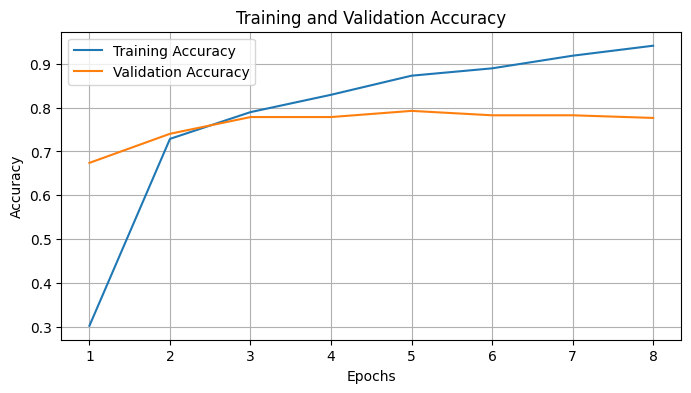

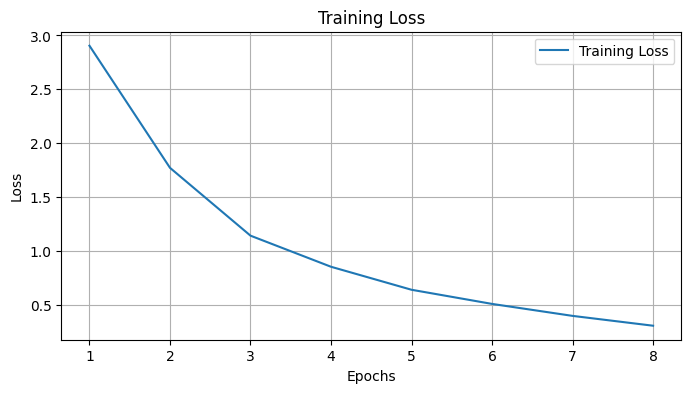

Average Time Per Epoch: 12.80 seconds


In [17]:
# Initialize the TextClassifier
model_name = "distilbert-base-uncased"
num_labels = 24  # Replace with the number of your categories
classifier_distil_bert = TextClassifier(model_name=model_name, num_labels=num_labels)

# Initialize the BERT model
classifier_distil_bert.initialize_distilbert()

# Define optimizer and loss function
optimizer = AdamW(classifier_distil_bert.model.parameters(), lr=2e-5, eps=1e-8)
criterion = nn.CrossEntropyLoss()

# Training hyperparameters
epochs = 50
save_path = ".//distilbert-resume-classification//best_model.bin"  # Path to save the best model


start_time = time.time()

# Train the model
best_val_DistilBERT, test_DistilBERT, train_DistilBERT_at_best_val, final_epoch = classifier_distil_bert.train_and_save_best_model(
    train_loader=train_loader,  
    val_loader=val_loader, 
    test_loader = test_loader,
    optimizer=optimizer,
    criterion=criterion,
    epochs=epochs,
    save_path=save_path,
    patience=3
)

end_time = time.time()
total_time = end_time - start_time
avg_time_per_epoch = total_time / final_epoch

print(f"Average Time Per Epoch: {avg_time_per_epoch:.2f} seconds")

In [18]:
print(best_val_BERT, test_BERT, train_BERT_at_best_val)

0.7987927565392354 0.7867203219315896 0.8812080536912752


In [19]:
print(best_val_DistilBERT, test_DistilBERT, train_DistilBERT_at_best_val)

0.7927565392354124 0.7766599597585513 0.8731543624161073


In [20]:
def plot_confusion_matrix(classifier, save_path, data_loader, output_path):
    # 1. Load the best model
    classifier.model.load_state_dict(torch.load(save_path))  # Load saved model
    classifier.model.eval()  # Set model to evaluation mode
    
    # 2. Make predictions on the test set
    all_preds = []
    all_labels = []
    
    with torch.no_grad():  # Disable gradient computation for inference
        for batch in data_loader:
            input_ids = batch["input_ids"].to(classifier.device)
            attention_mask = batch["attention_mask"].to(classifier.device)
            labels = batch["labels"].to(classifier.device)
    
            outputs = classifier.model(input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1)
    
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # 3. Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    category_names = [idx_to_label[i] for i in range(len(idx_to_label))]
    
    # 4. Visualize the confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=category_names)
    disp.plot(cmap="Blues")
    plt.xticks(rotation=90)
    
    plt.savefig(output_path, dpi=400, bbox_inches="tight") 
    # Show the plot (optional)
    plt.show()

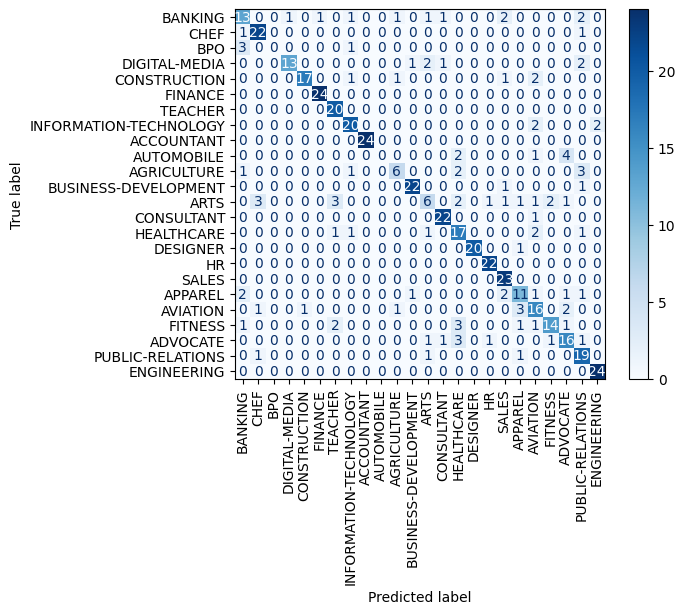

In [21]:
save_path = ".//bert-resume-classification//best_model.bin"
output_path = ".//figures//bert_confusion_matrix.png"
plot_confusion_matrix(classifier_bert, save_path, test_loader, output_path)

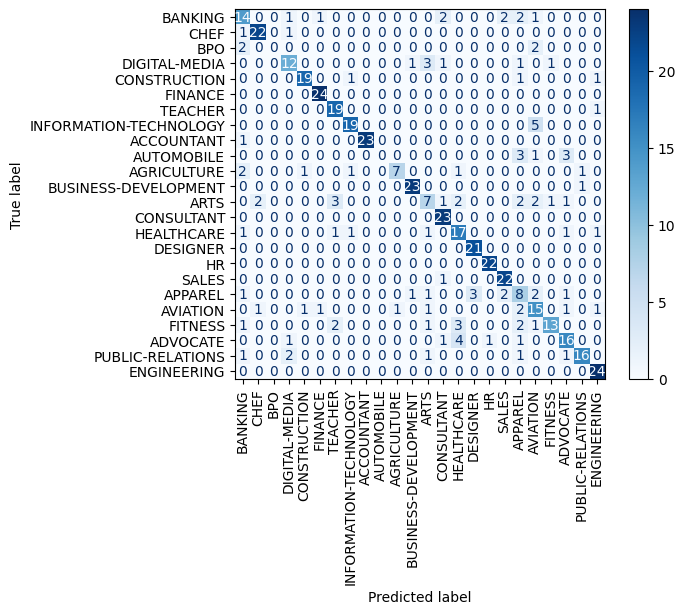

In [22]:
save_path = ".//distilbert-resume-classification//best_model.bin"
output_path = ".//figures//distil_bert_confusion_matrix.png"
plot_confusion_matrix(classifier_distil_bert, save_path, test_loader, output_path)